### BADASS Analysis: tea

Can we train an ML model to distinguish three different classes of tea (black, grey and green) from one another? And can the model recognise the class label of a subclass of analyte it did not see during training (e.g. can it identify Sainsbury's Gold as black tea when Sainsbury's Gold is not one of the tea brands used to train the model)?

#### Analytes

Black:
- Clipper
- Diplomat
- Dragonfly
- PG Tips
- Pukka
- Sainsbury's Gold
- Tesco
- Tetley
- Twinings
- Yorkshire

Earl Grey:
- Asda
- Clipper
- Coop
- Devonshire
- Diplomat
- Joe's
- Hand S
- Pukka
- Tesco
- Twinings

Green:
- Clipper
- Diplomat
- Double Dragon
- Dragonfly
- Hand B
- Joe's
- Qi
- Sainsbury's
- Tetley
- Twinings

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, cohen_kappa_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Tea data (standard array)

In [3]:
tea_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/'
                           'Reformatted_tea_csvs/'},
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_analysis_standard_array/'
                'Tea_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6'],
    peptide_dict = {'DPH': ['No Pep', 'GRP22', 'GRP35', 'GRP46', 'GRP51', 'GRP52', 'GRP63', 'GRP80',
                            'Pent', 'Hex', 'Hex2', 'Hept', '24D', '24E', '24K', '17K']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
tea_fluor_data.group_xlsx_repeats()

In [5]:
tea_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['Black_Clipper_repeat_1.xlsx',
                             'Black_Diplomat_repeat_1.xlsx',
                             'Black_Dragonfly_repeat_1.xlsx',
                             'Black_Pgtips_repeat_1.xlsx',
                             'Black_Pukka_repeat_1.xlsx',
                             'Black_Sainsburysgold_repeat_1.xlsx',
                             'Black_Tesco_repeat_1.xlsx',
                             'Black_Tetley_repeat_1.xlsx',
                             'Black_Twinings_repeat_1.xlsx',
                             'Black_Yorkshire_repeat_1.xlsx',
                             'Green_Clipper_repeat_1.xlsx',
                             'Green_Diplomat_repeat_1.xlsx',
                             'Green_Doubledragon_repeat_1.xlsx',
                             'Green_Dragonfly_repeat_1.xlsx',
                             'Green_Handb_repeat_1.xlsx',
                          

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

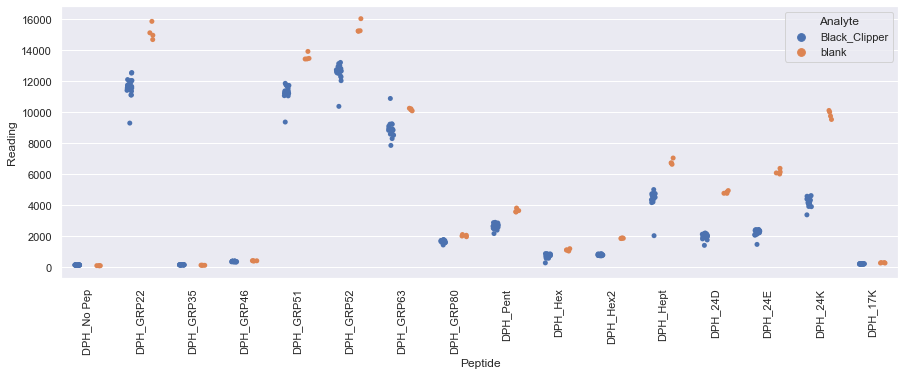

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Diplomat_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

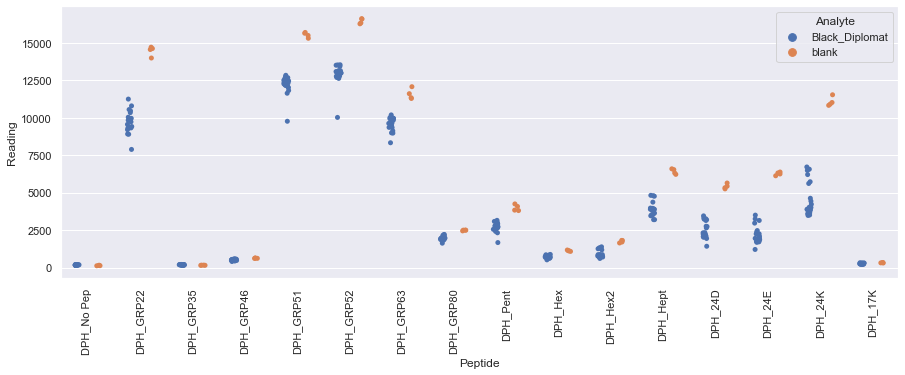

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Dragonfly_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

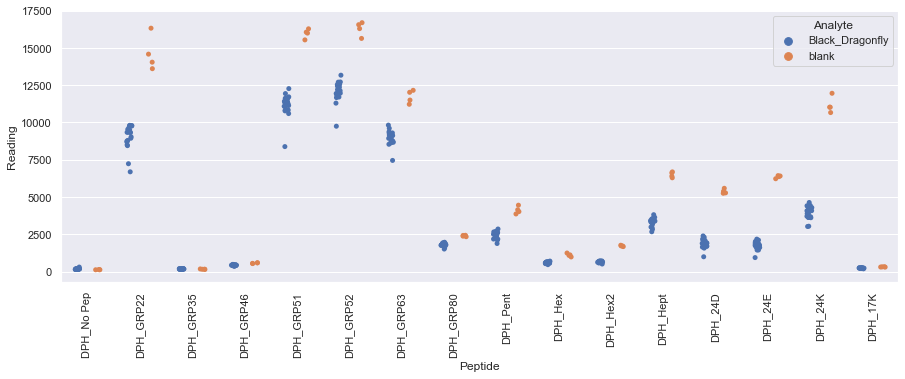

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pgtips_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

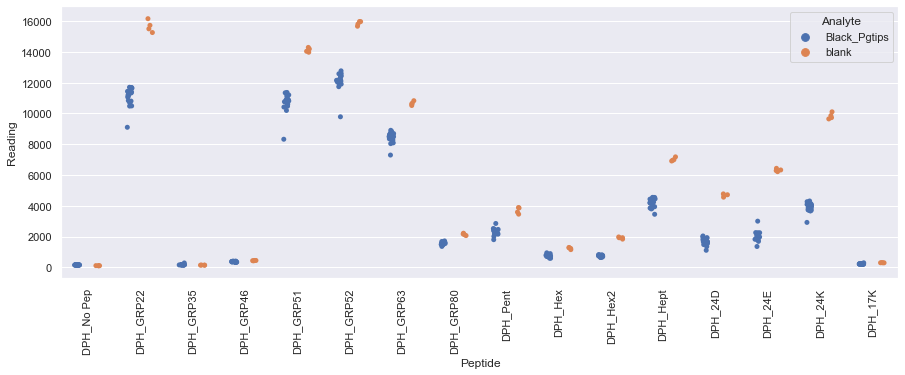

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pukka_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

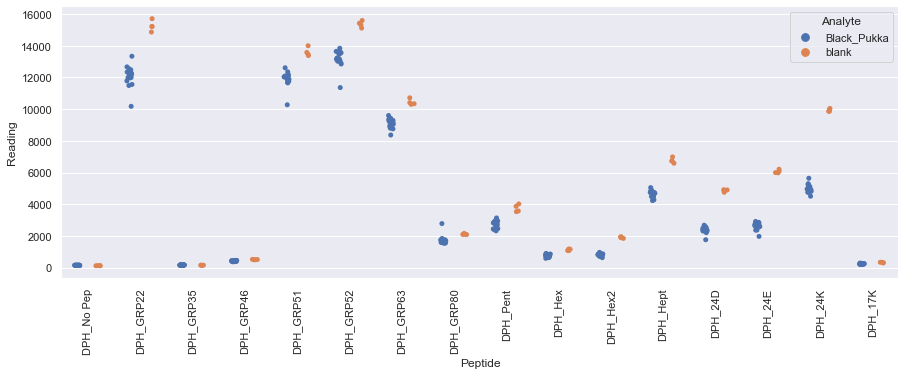

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Sainsburysgold_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

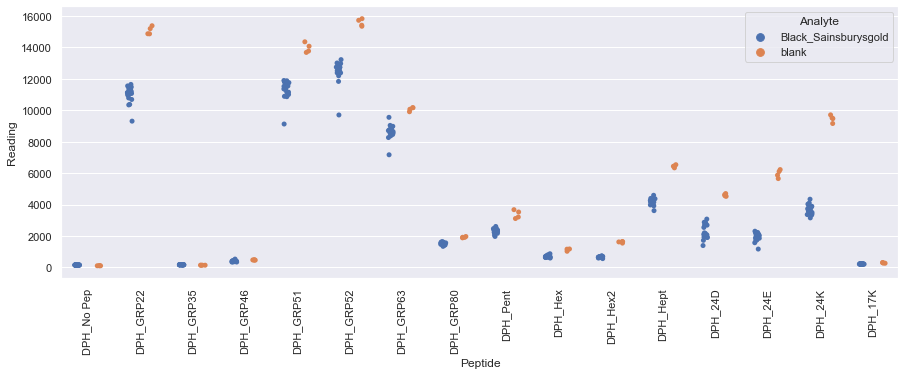

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tesco_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

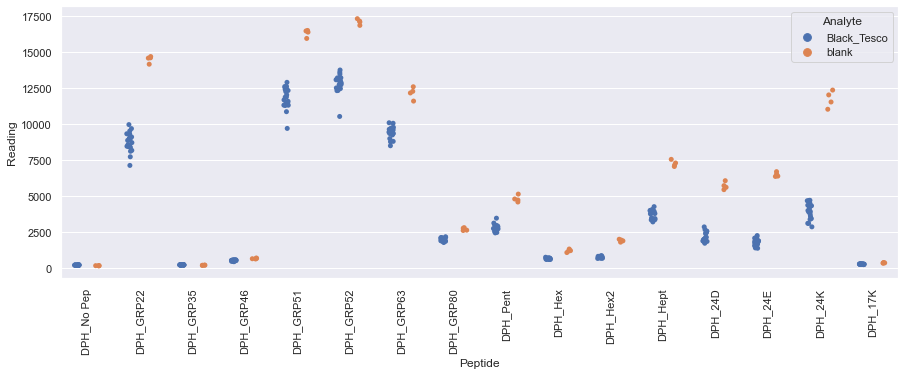

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tetley_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

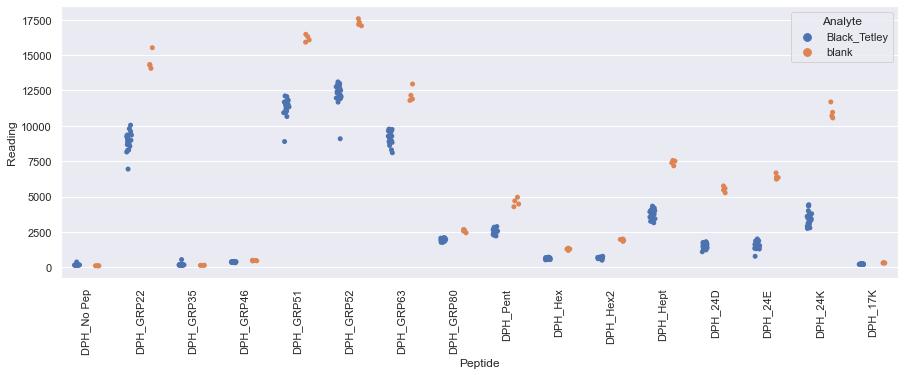

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Twinings_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

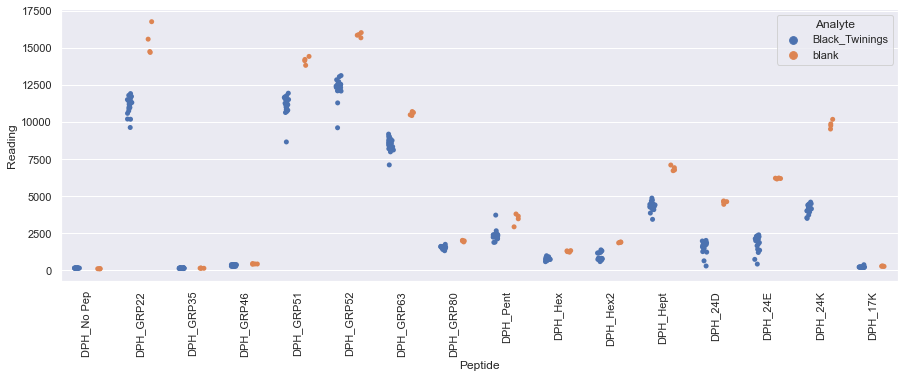

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Yorkshire_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

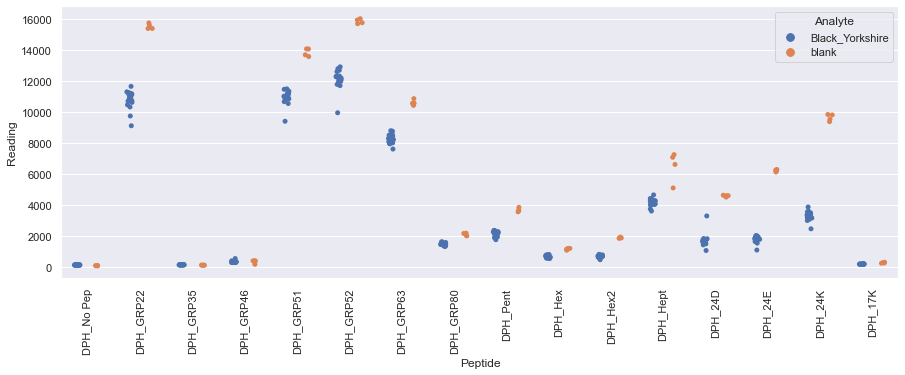

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Clipper_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

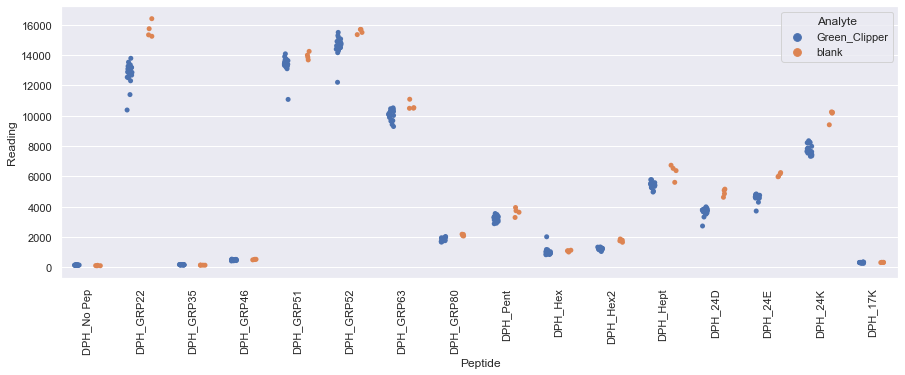

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Diplomat_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

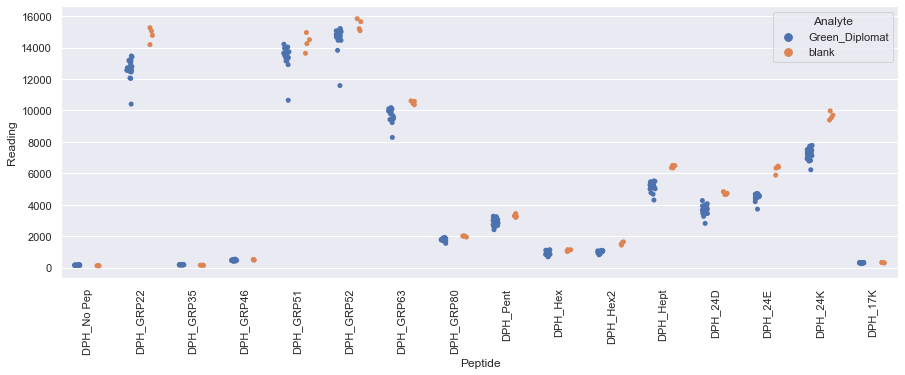

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Doubledragon_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

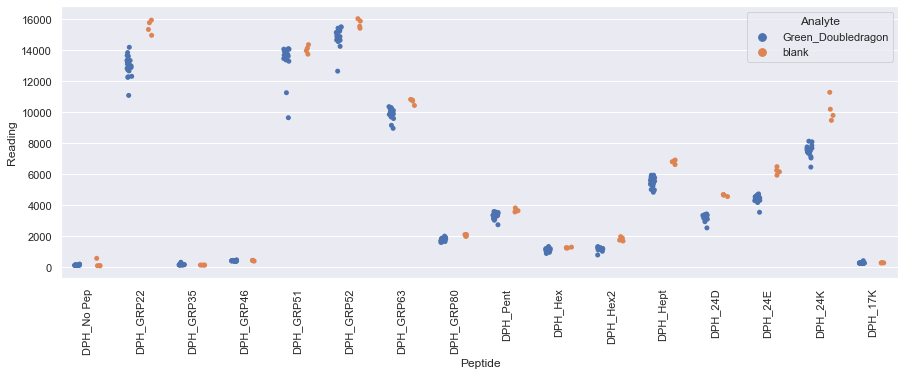

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Dragonfly_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

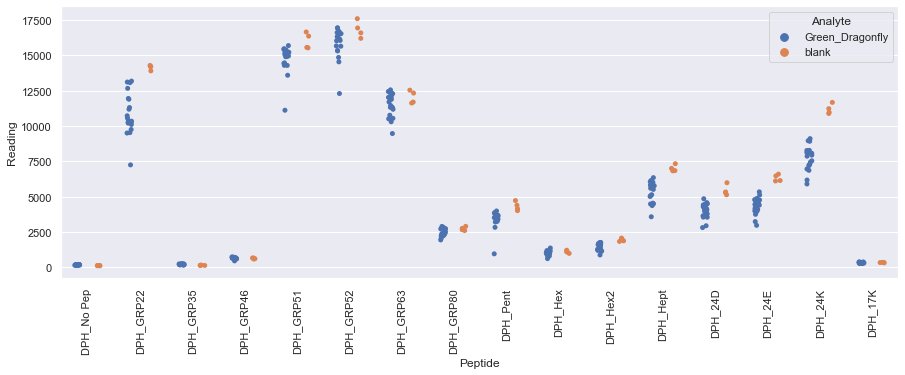

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Handb_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

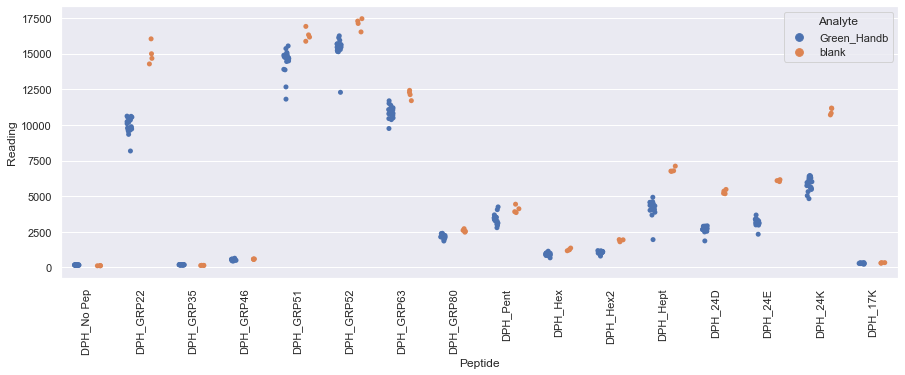

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Joes_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

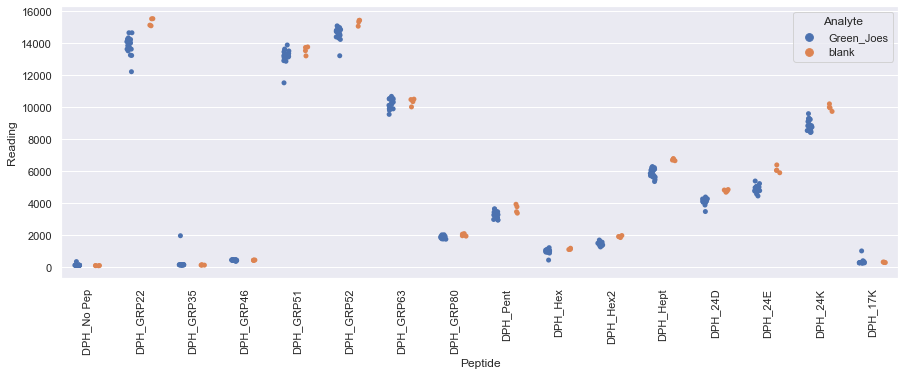

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Qi_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

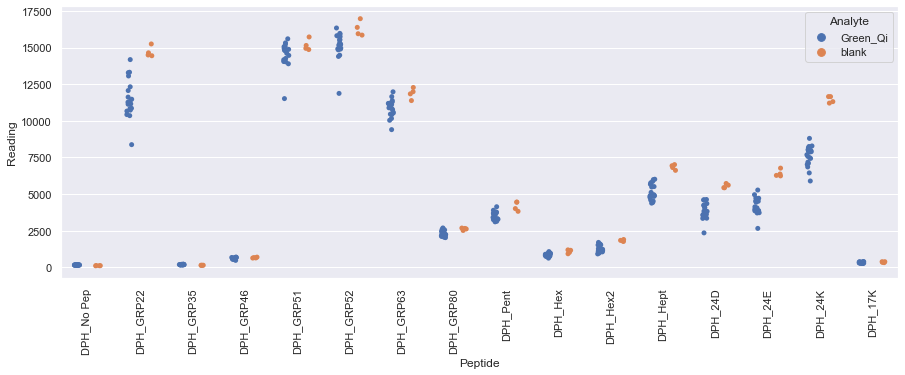

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Sainsburys_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

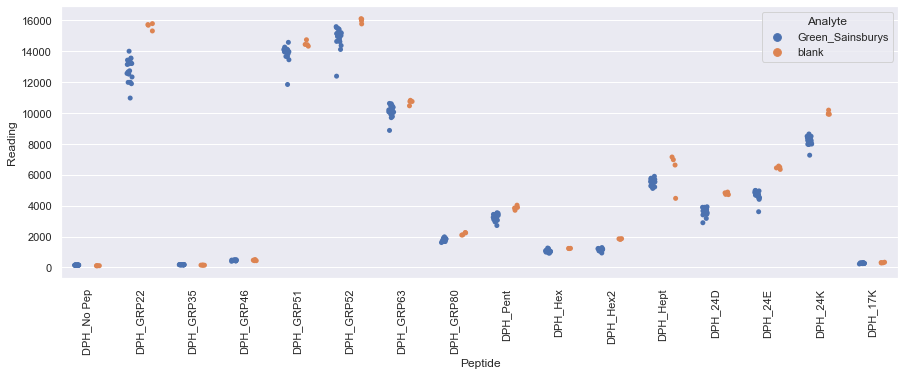

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Tetley_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

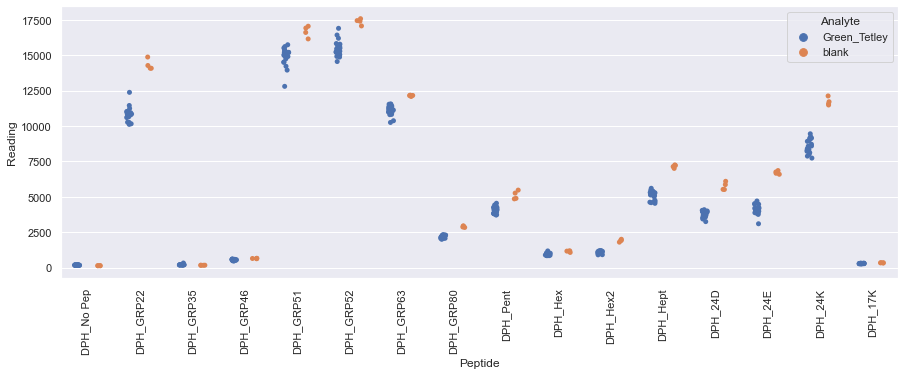

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Twinings_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

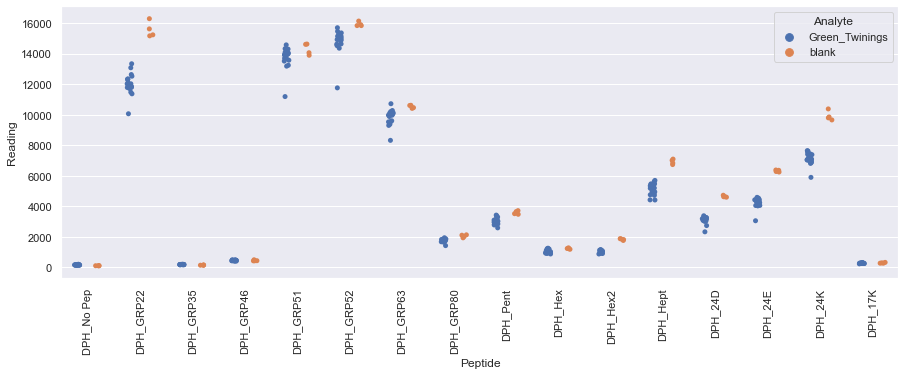

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Asda_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

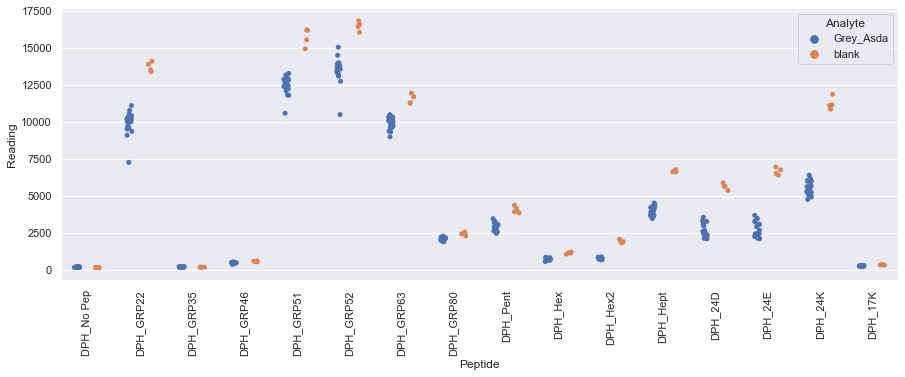

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Clipper_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

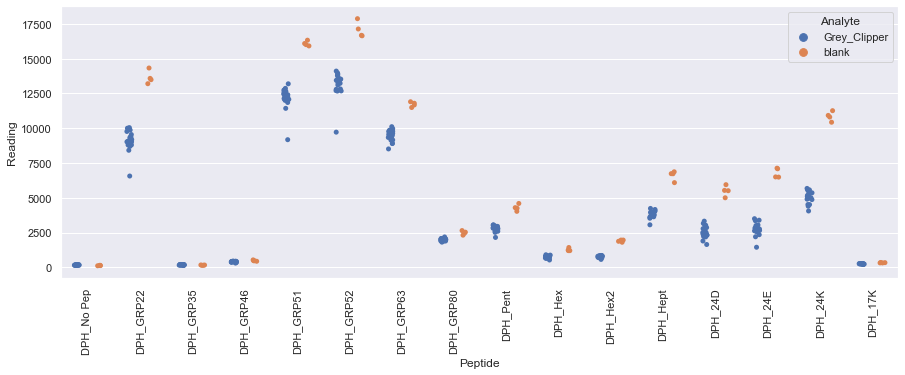

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Coop_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

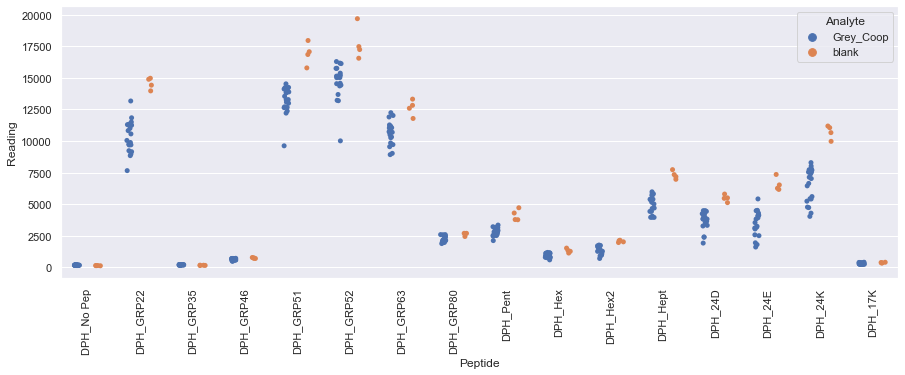

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Devonshire_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

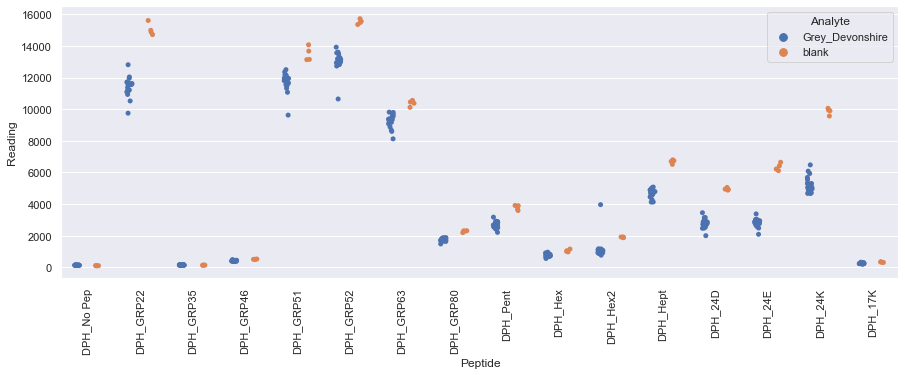

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Diplomat_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

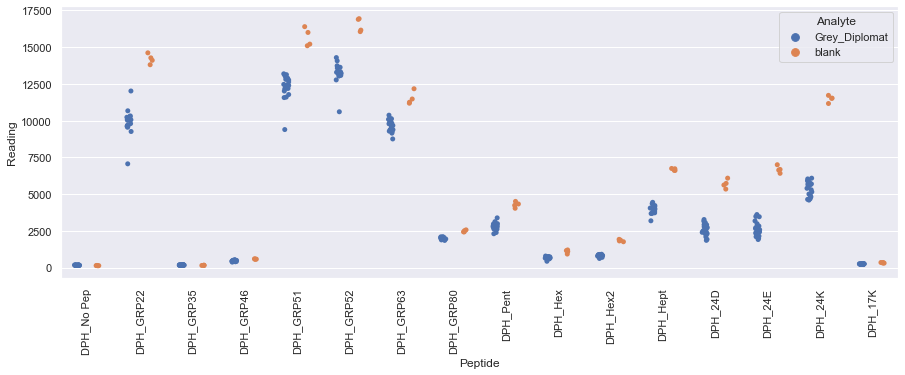

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Joes_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

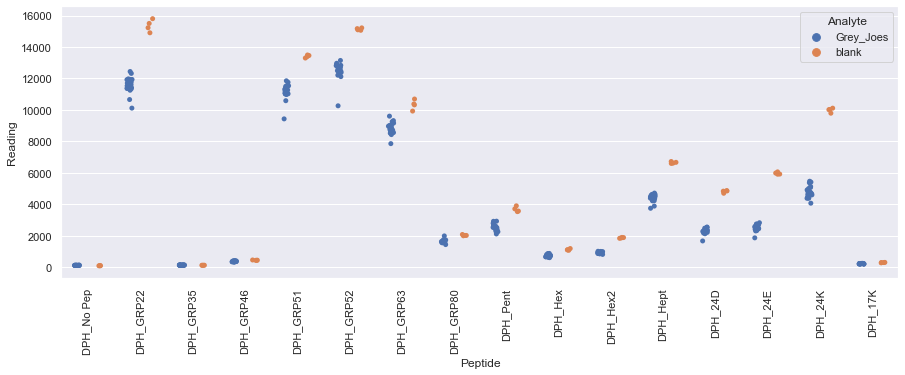

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Mands_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

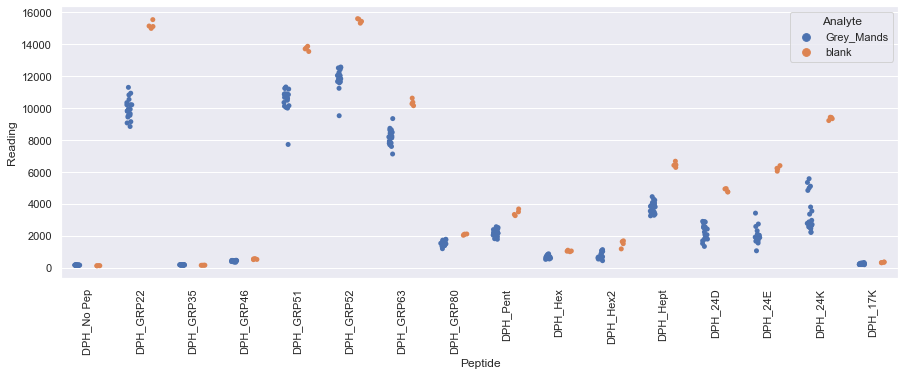

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Pukka_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

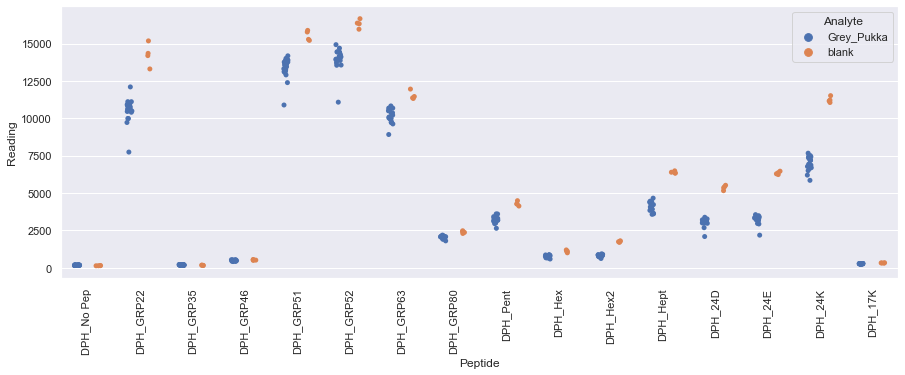

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Tesco_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

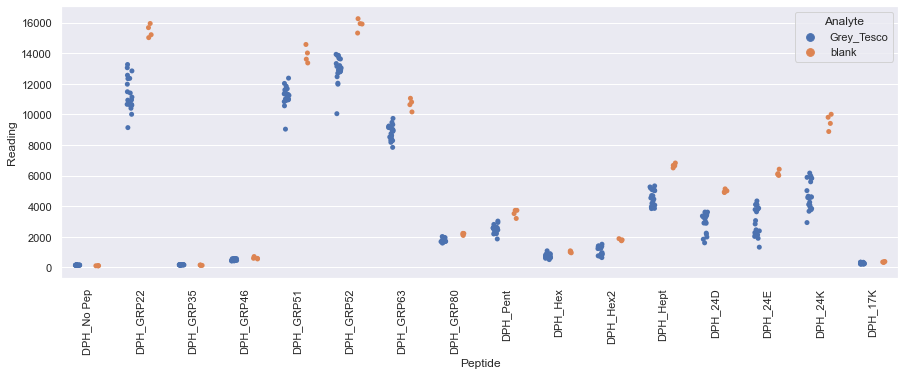

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Twinings_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

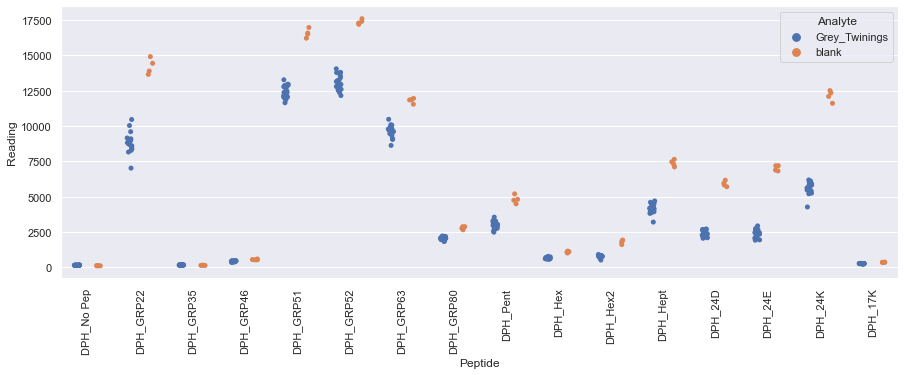

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

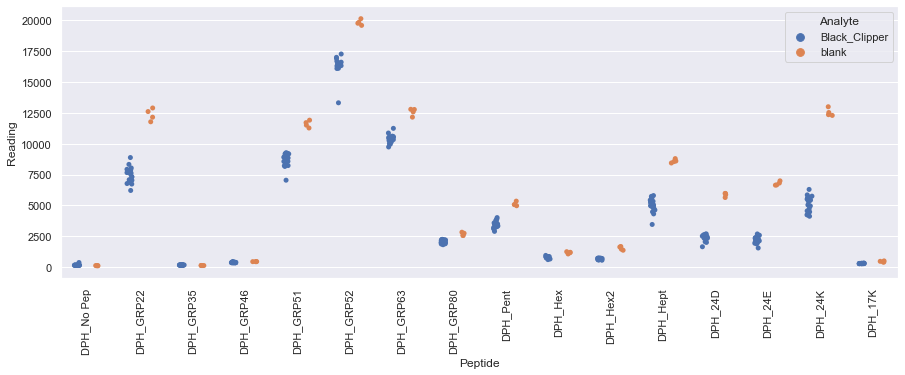

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Diplomat_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

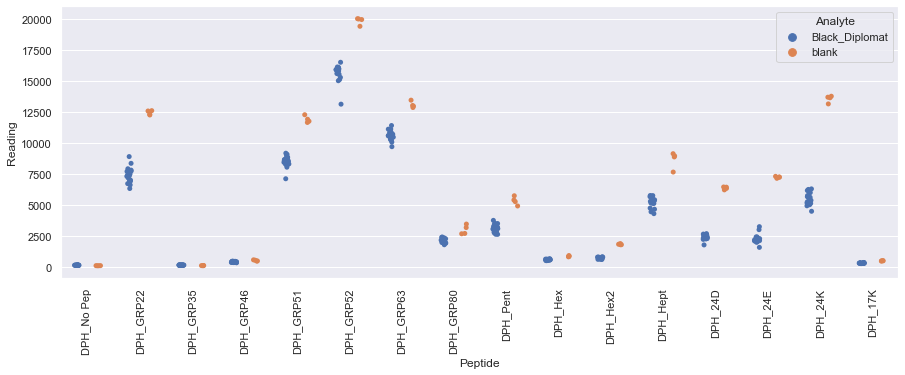

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Dragonfly_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

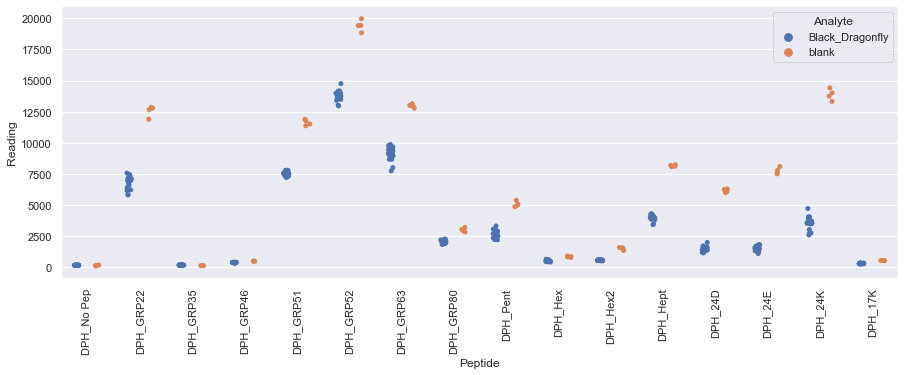

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pgtips_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

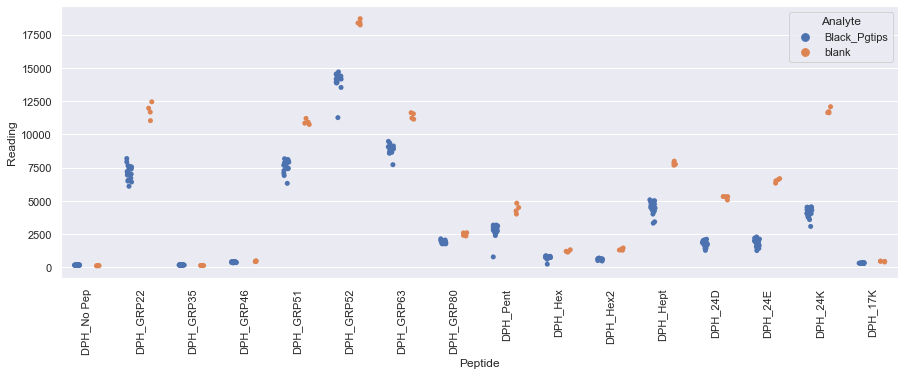

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pukka_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

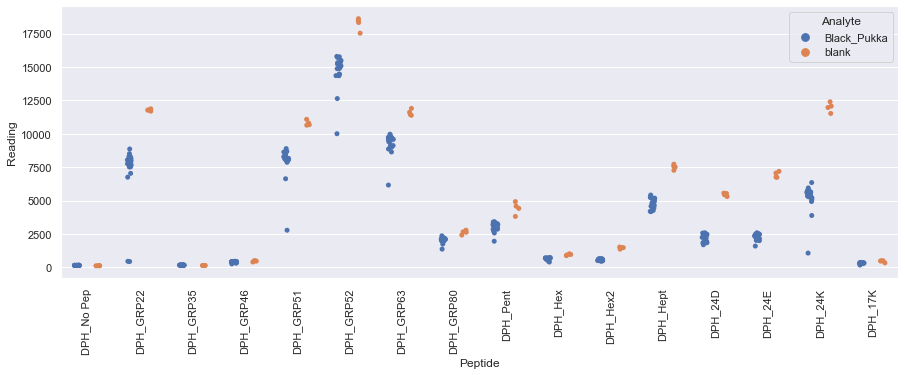

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Sainsburysgold_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

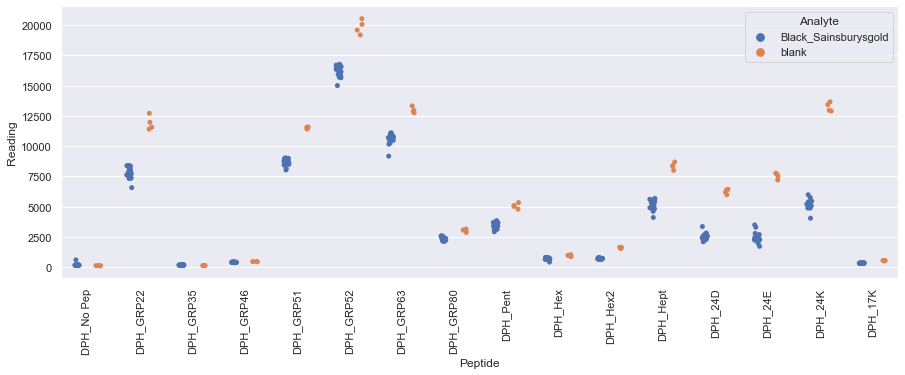

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tesco_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

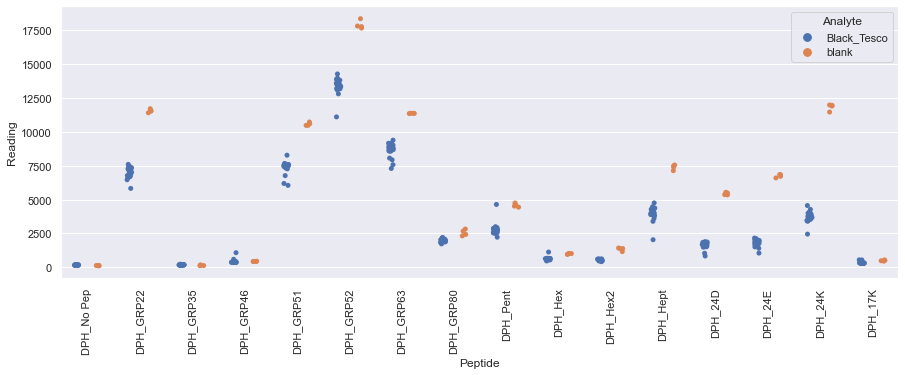

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tetley_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

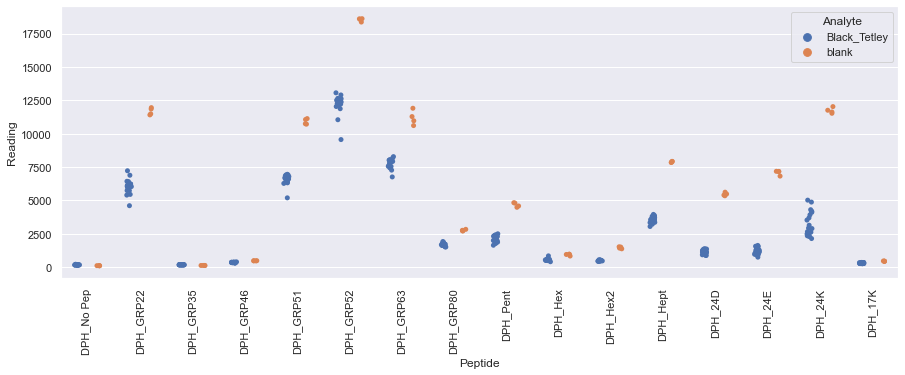

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Twinings_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

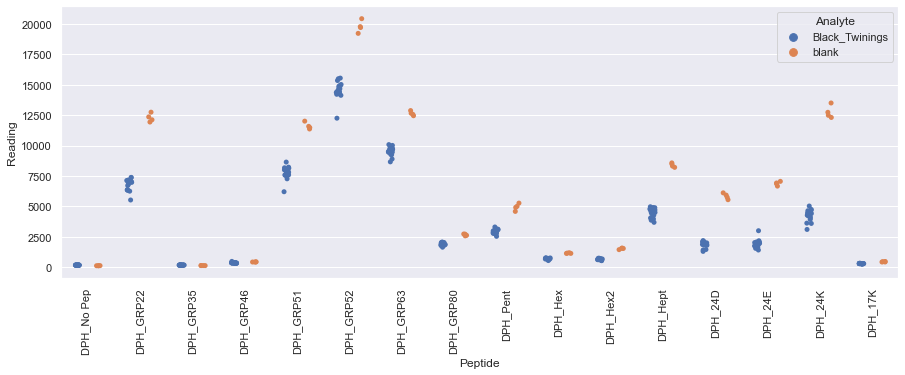

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Yorkshire_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

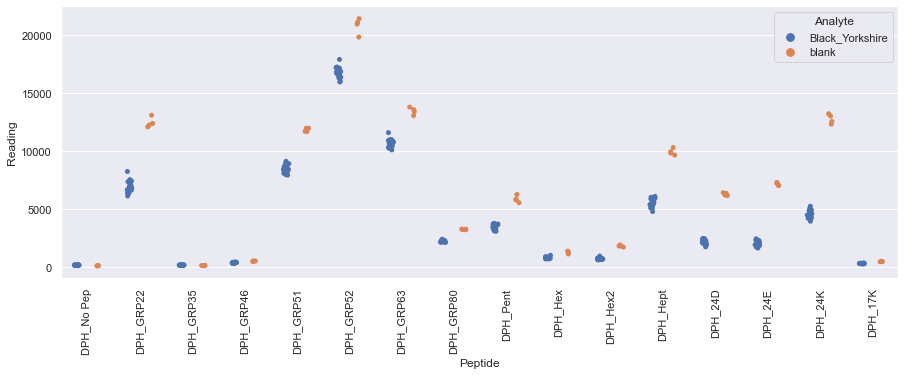

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Clipper_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

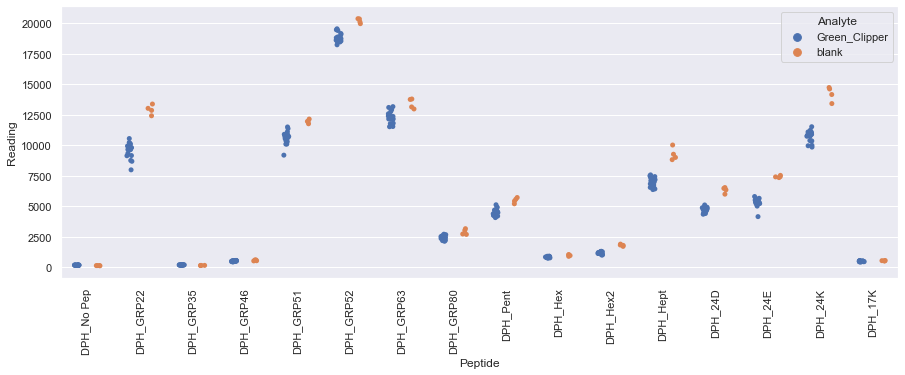

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Diplomat_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

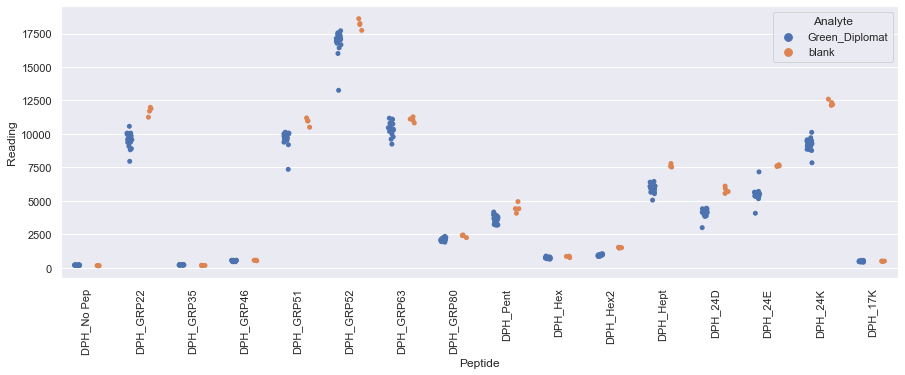

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Doubledragon_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

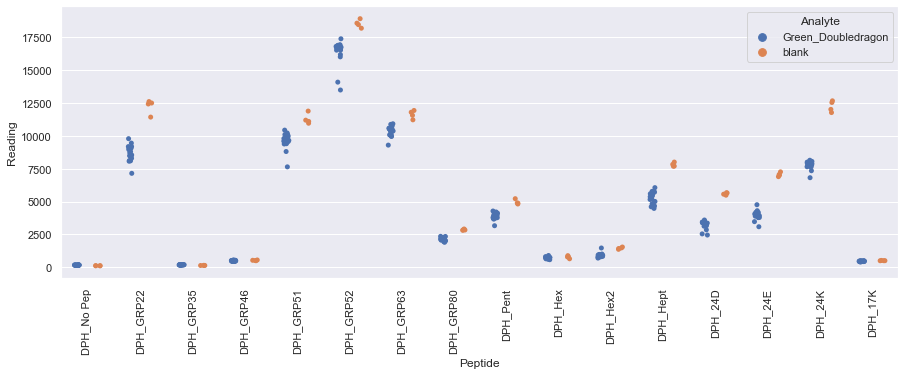

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Dragonfly_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

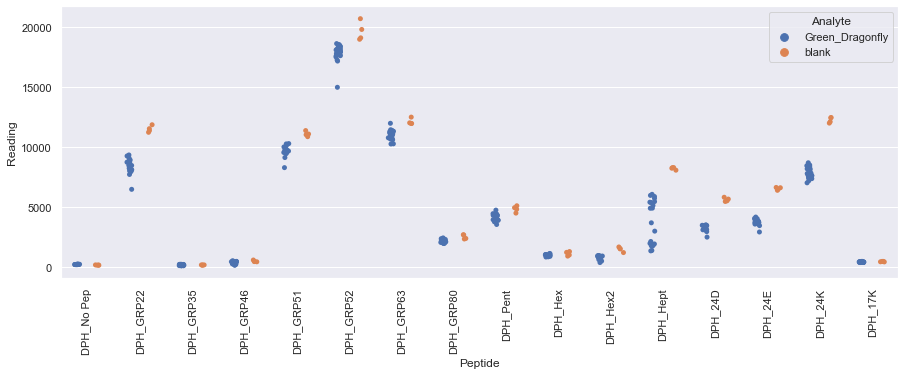

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Handb_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

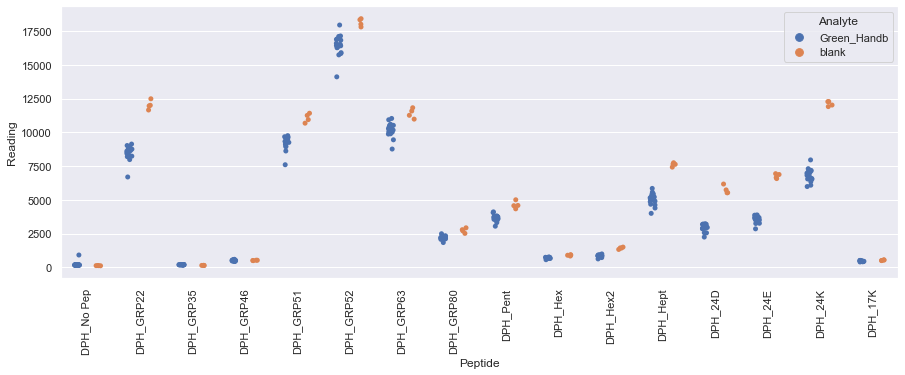

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Joes_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

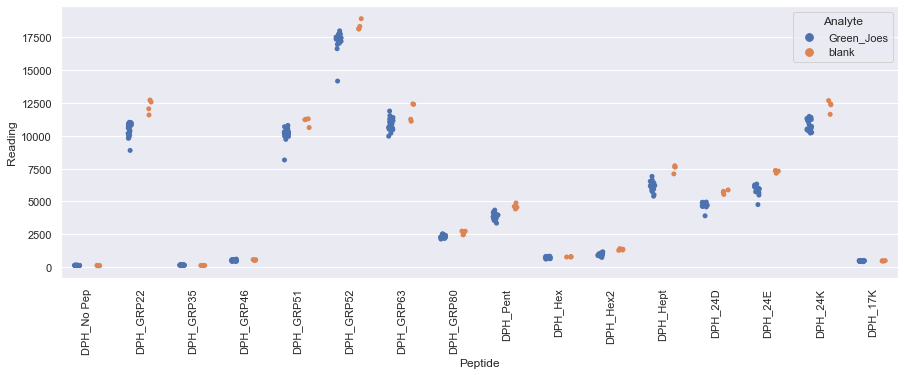

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Qi_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

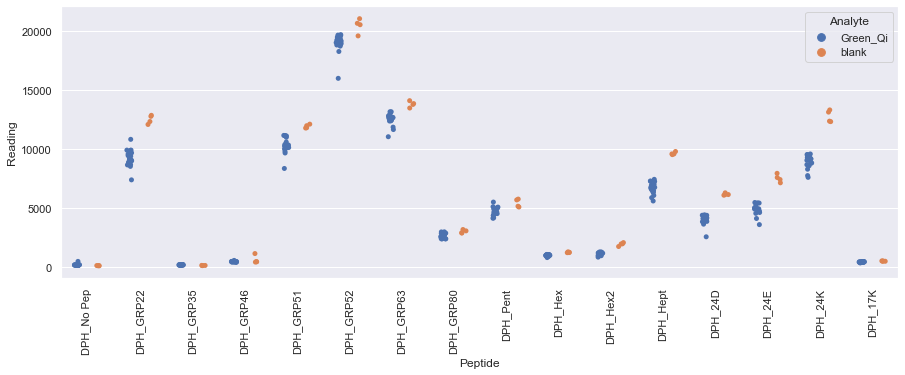

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Sainsburys_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

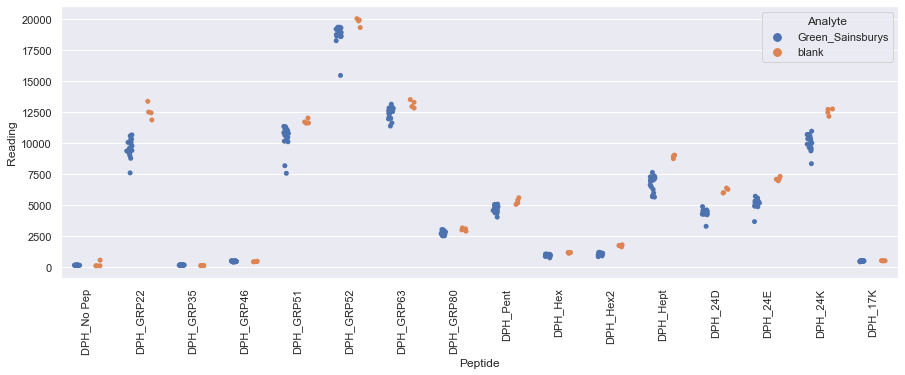

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Tetley_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

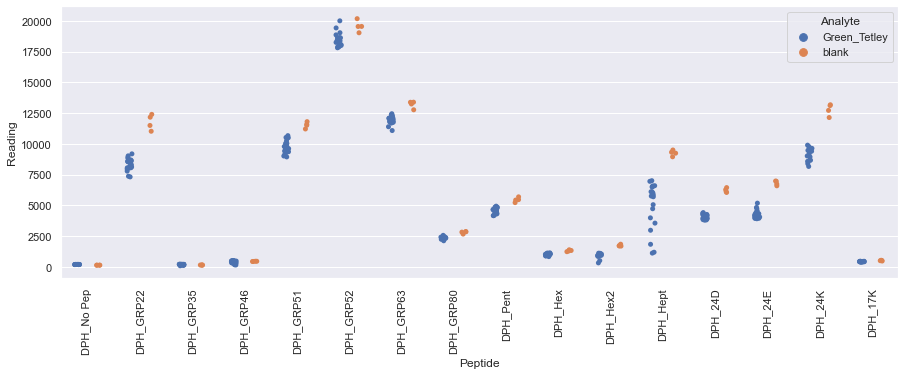

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Twinings_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

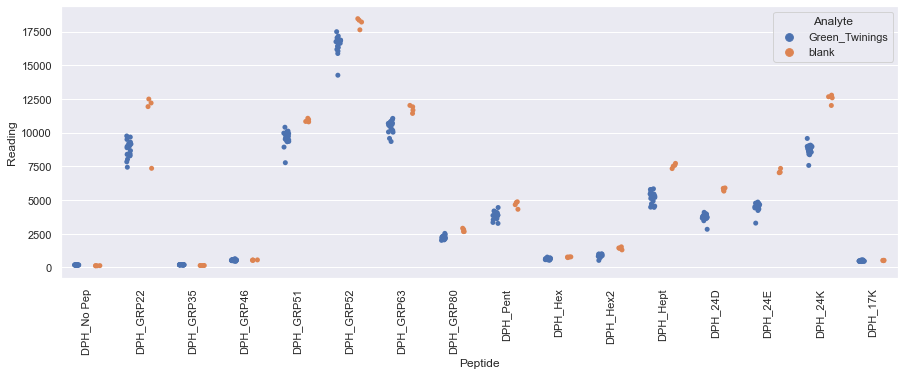

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Asda_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

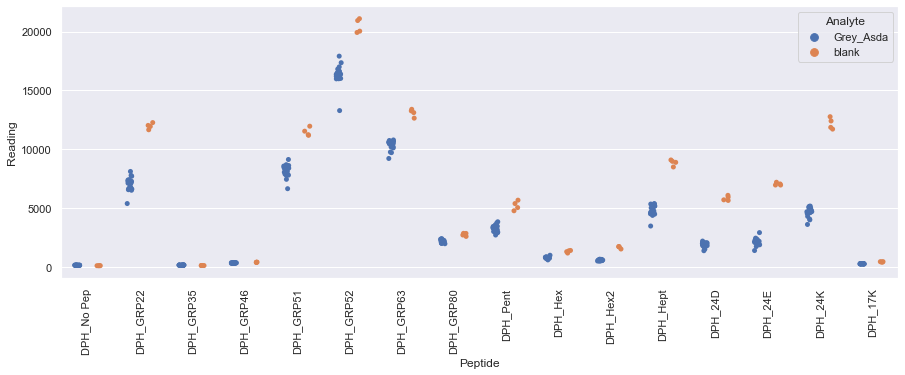

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Clipper_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

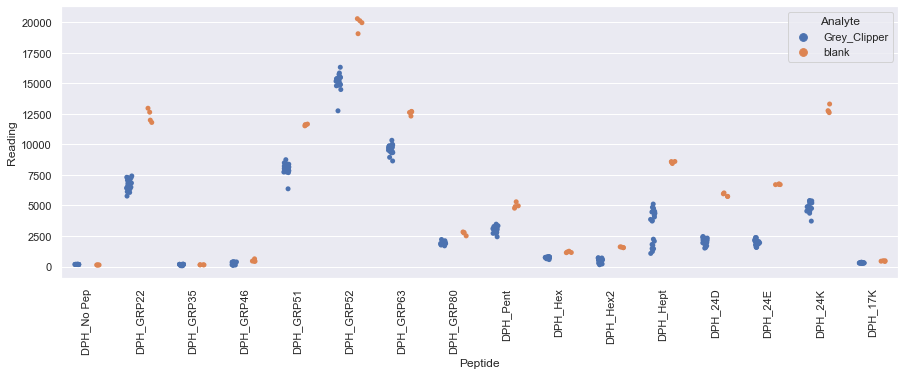

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Coop_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

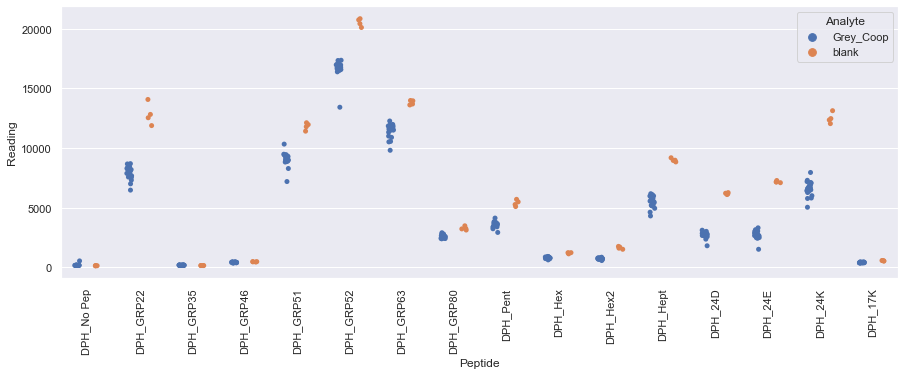

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Devonshire_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

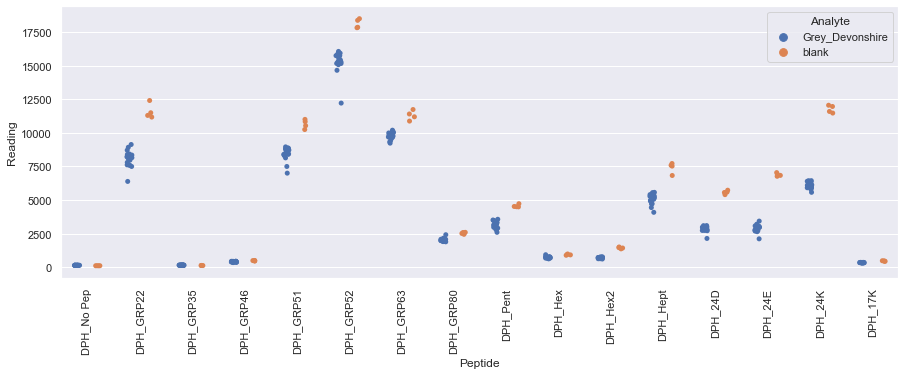

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Diplomat_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

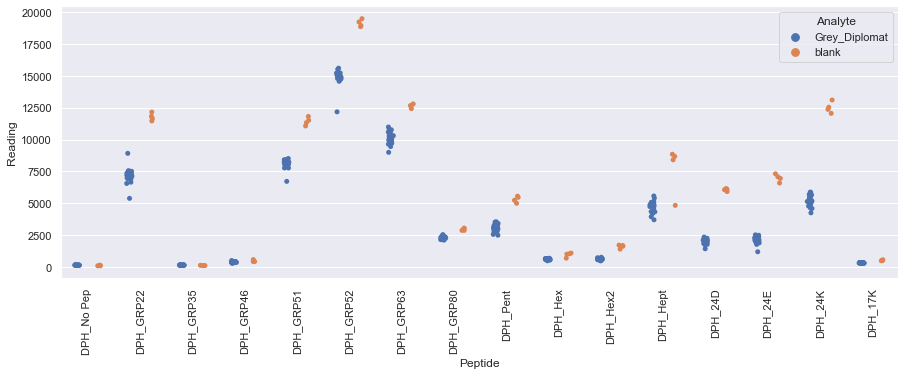

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Joes_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

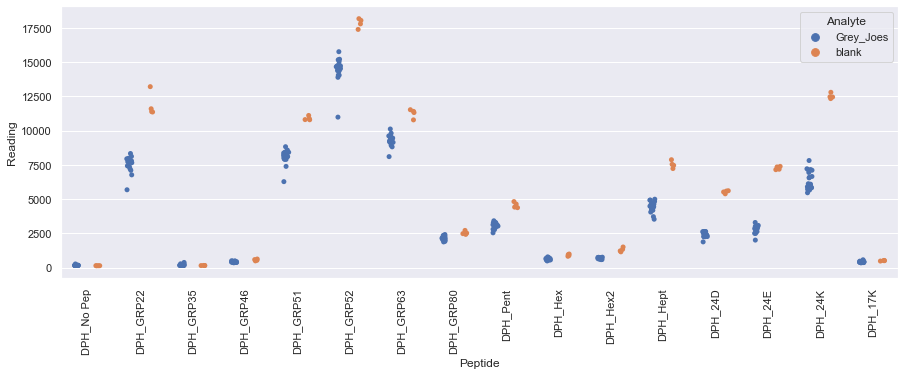

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Mands_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

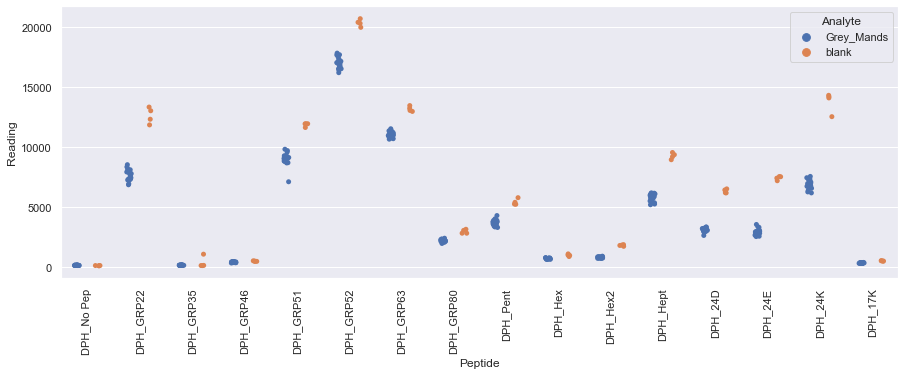

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Pukka_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

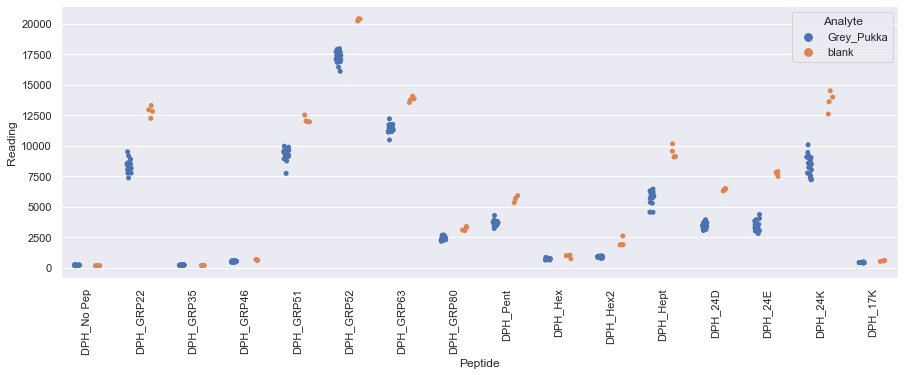

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Tesco_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

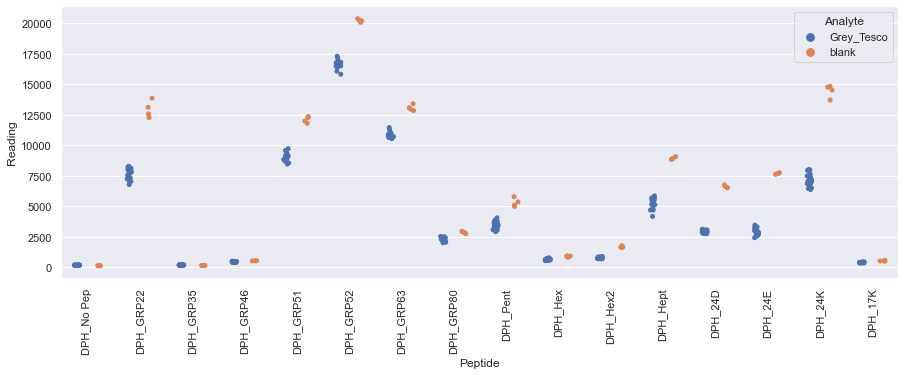

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Twinings_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

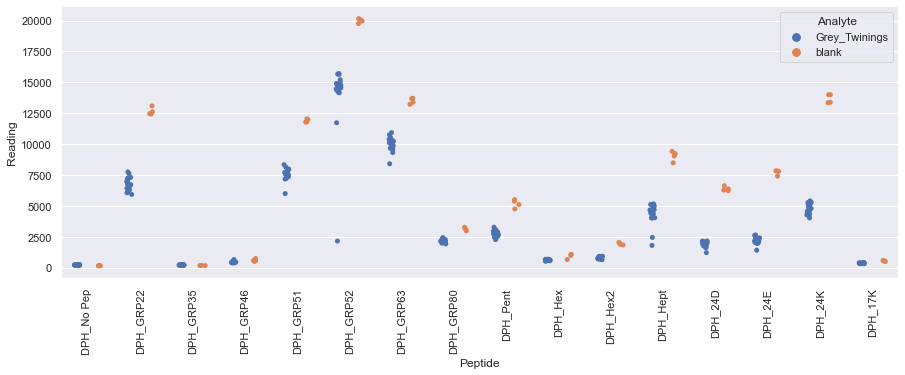

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

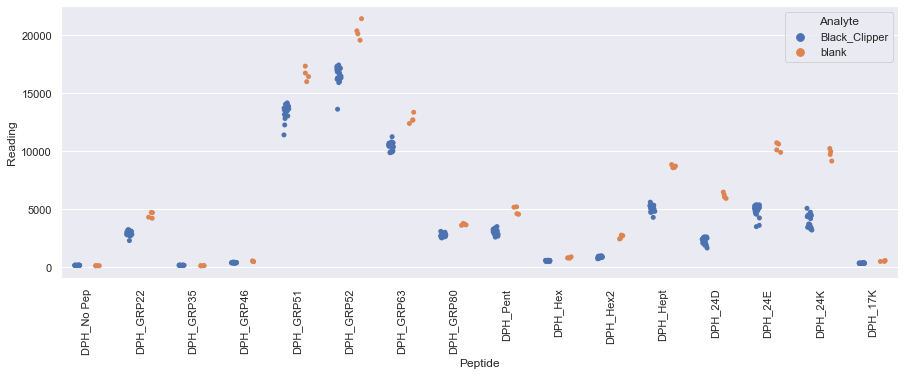

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Diplomat_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

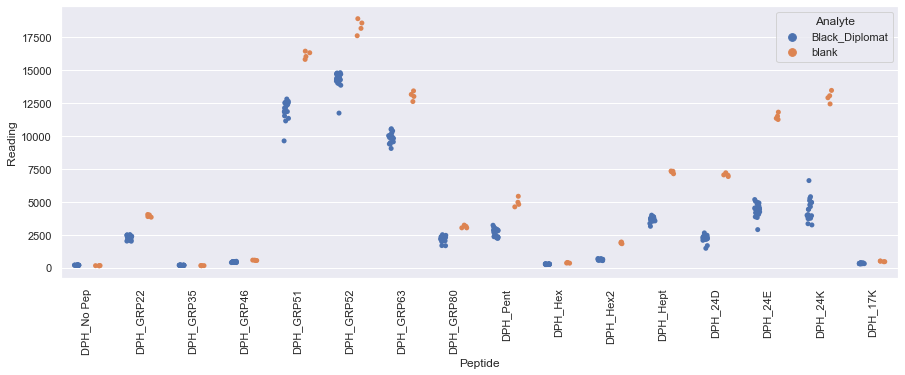

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Dragonfly_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

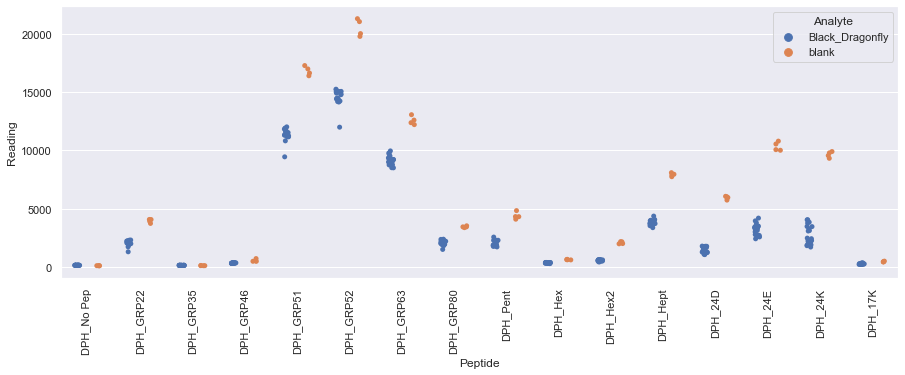

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pgtips_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

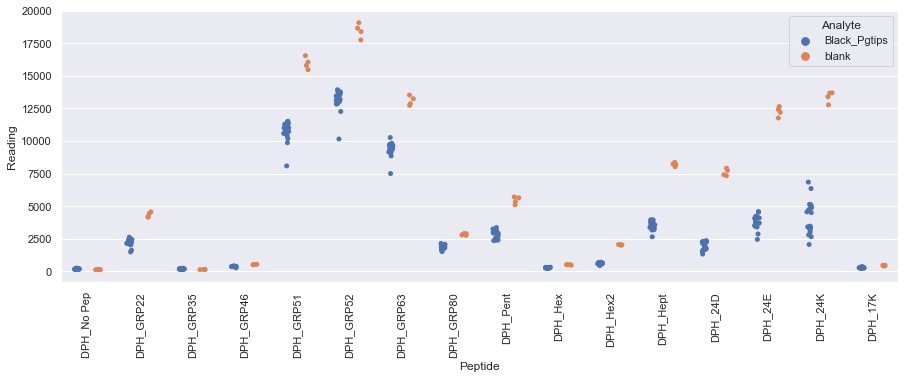

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pukka_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

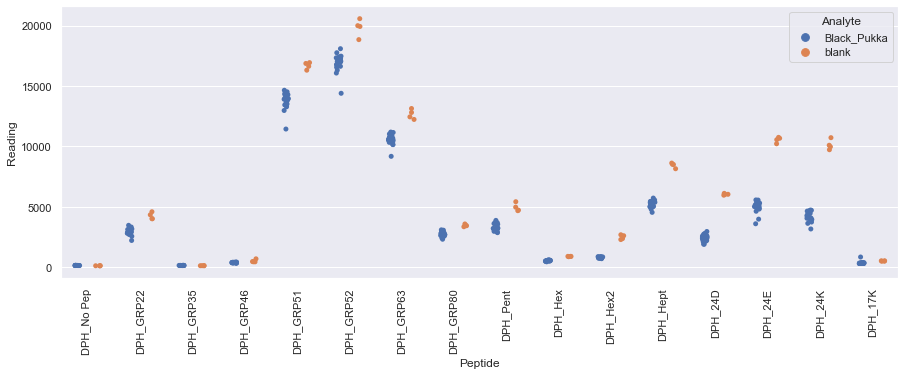

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Sainsburysgold_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

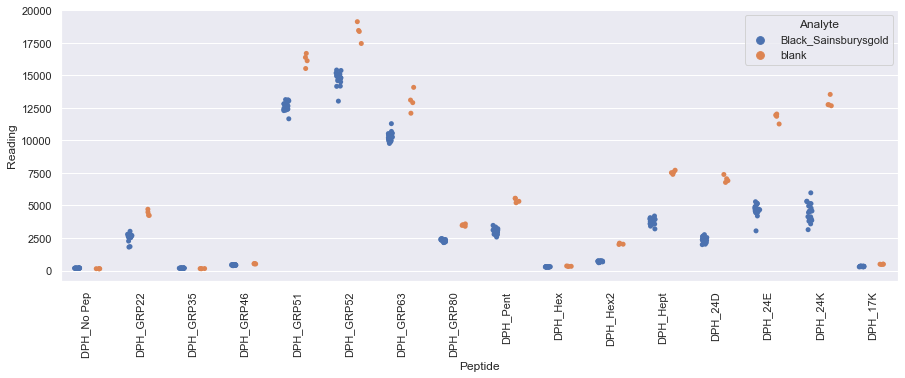

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tesco_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

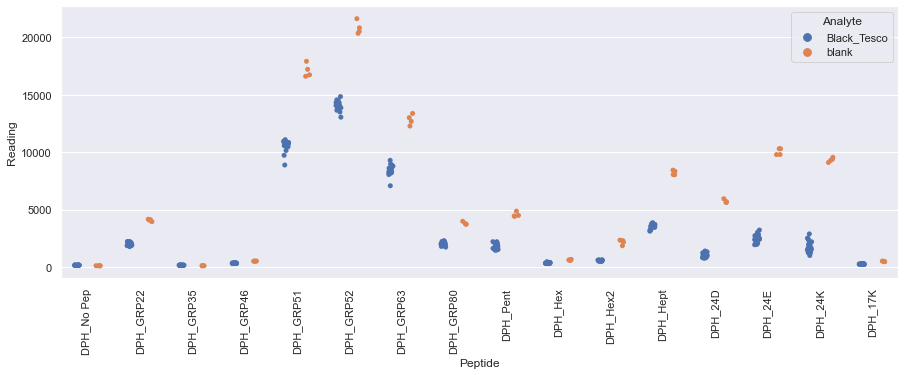

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tetley_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

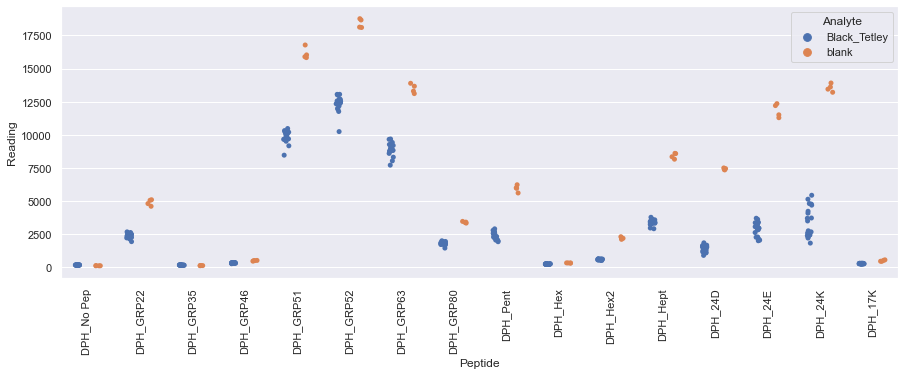

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Twinings_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

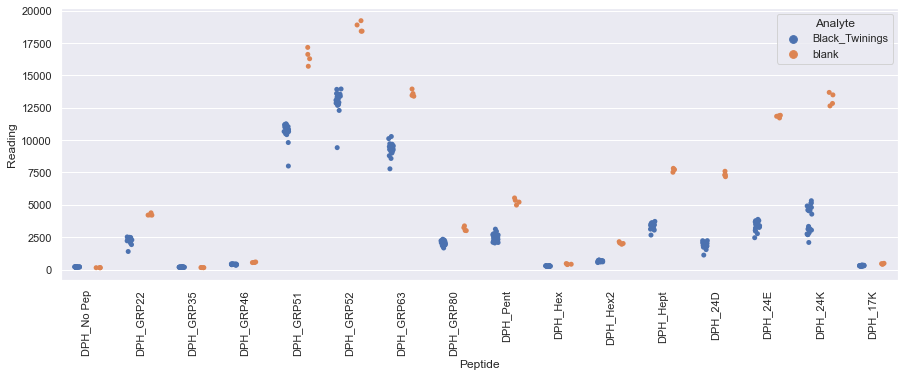

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Yorkshire_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

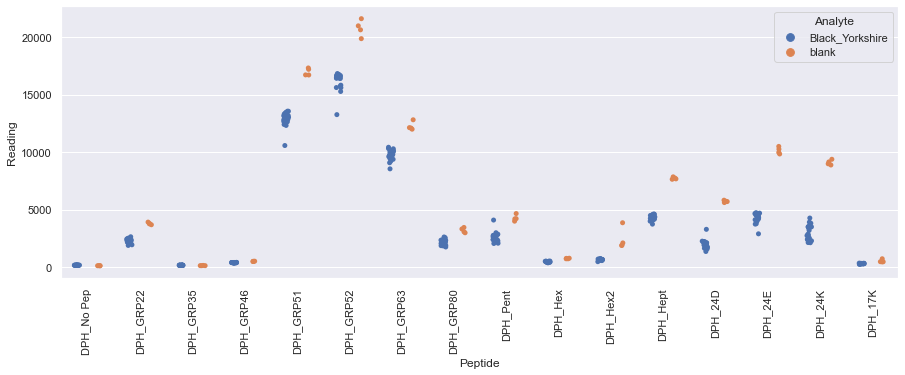

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Clipper_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

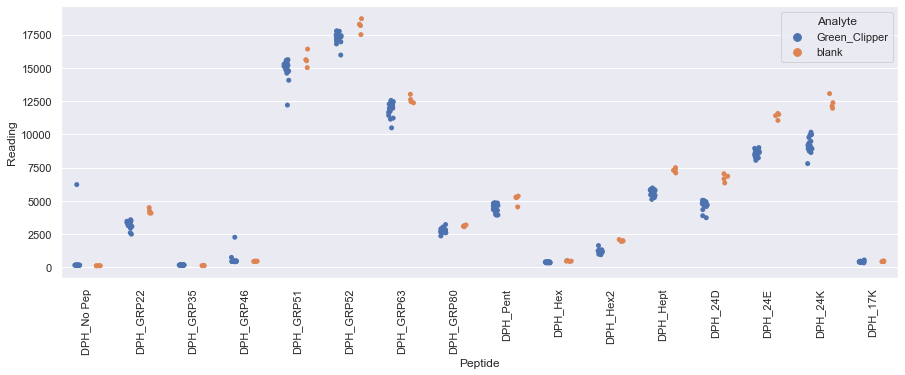

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Diplomat_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

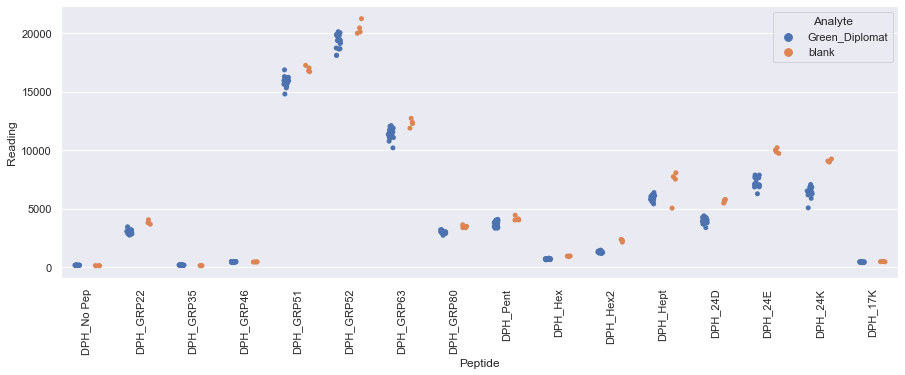

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Doubledragon_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

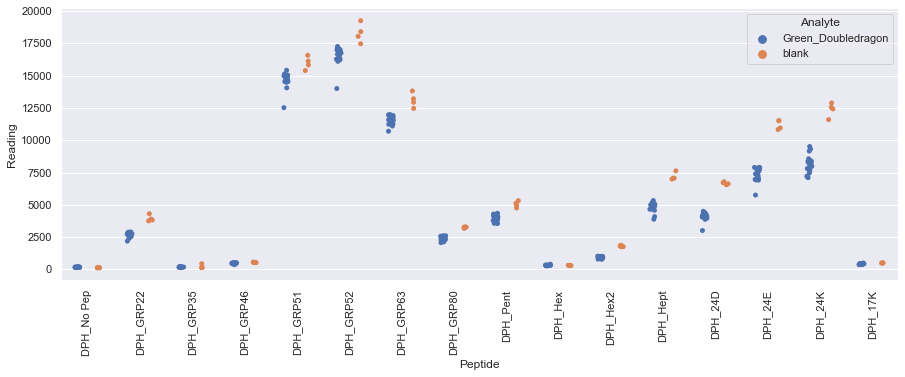

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Dragonfly_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

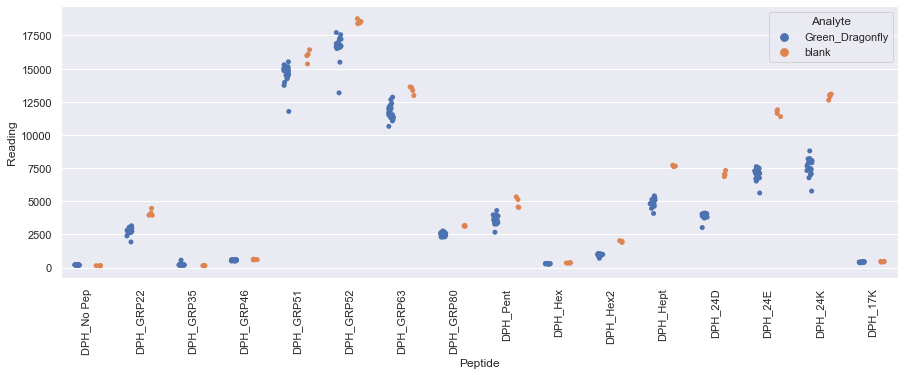

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Handb_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

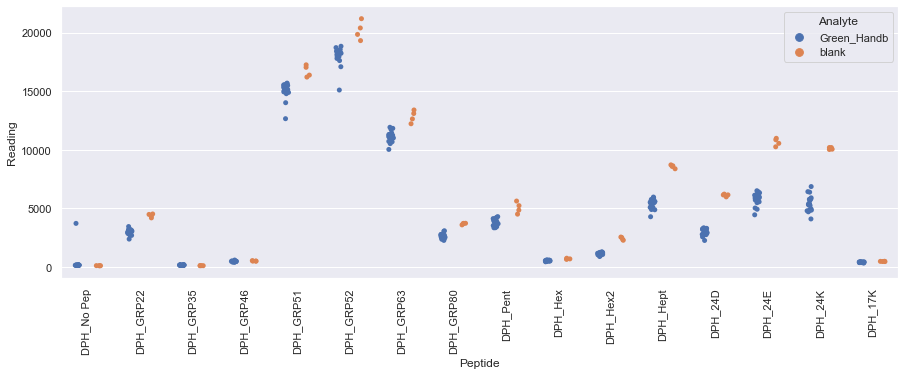

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Joes_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

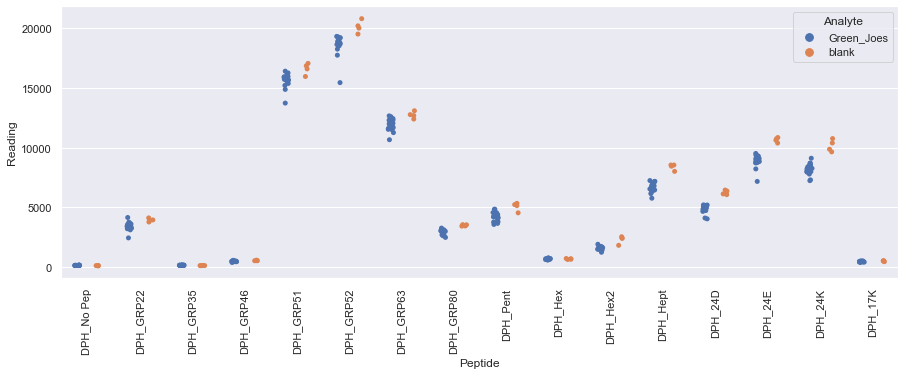

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Qi_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

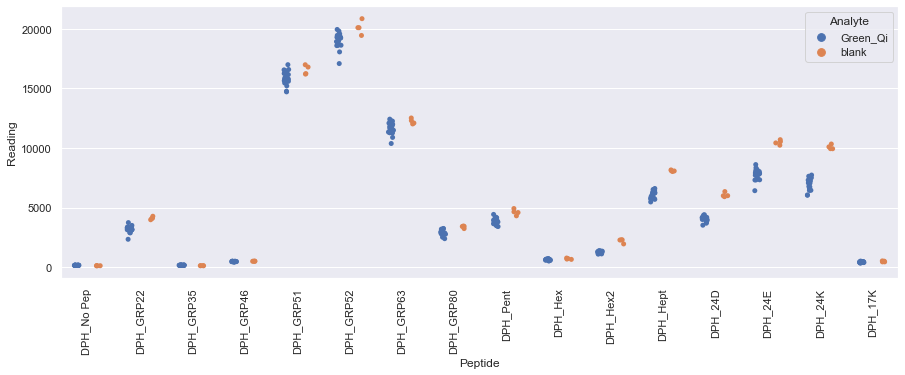

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Sainsburys_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

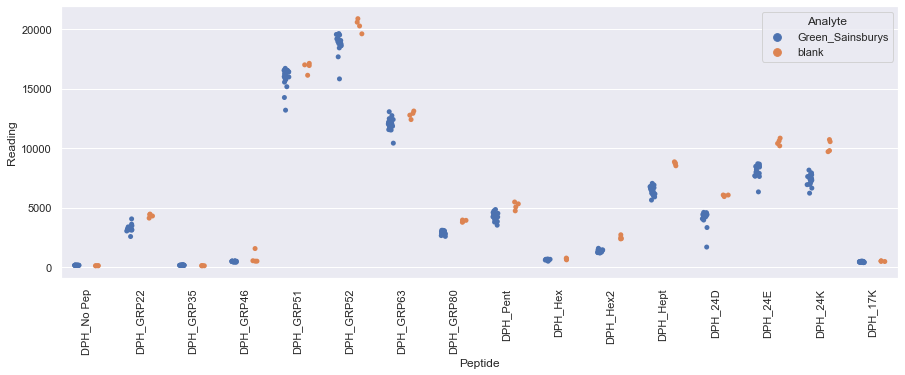

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Tetley_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

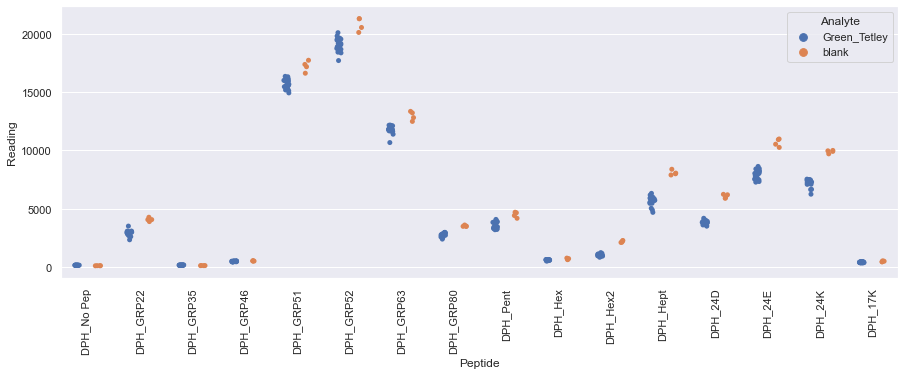

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Twinings_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

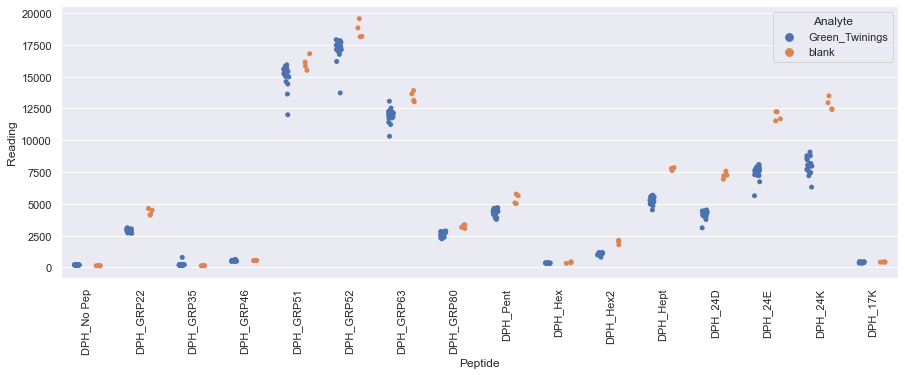

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Asda_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

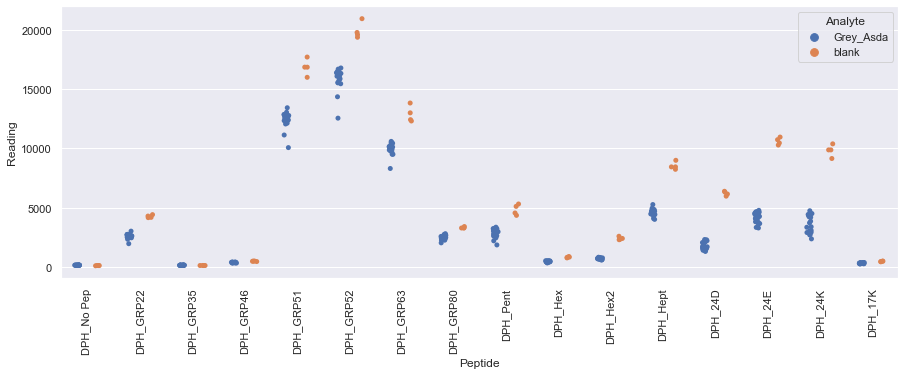

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Clipper_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

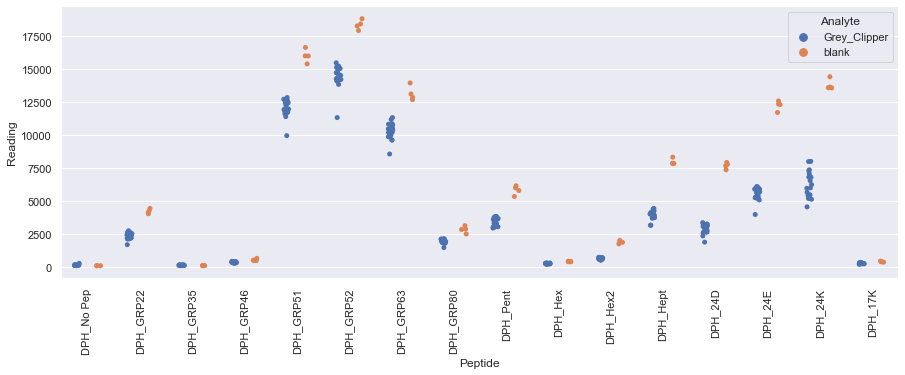

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Coop_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

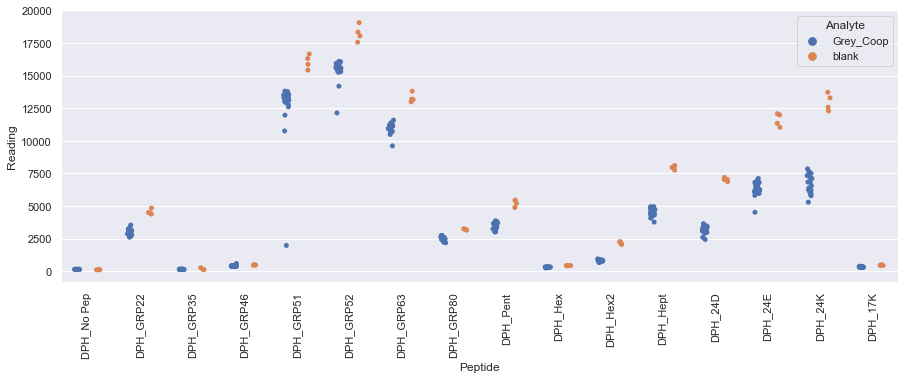

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Devonshire_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

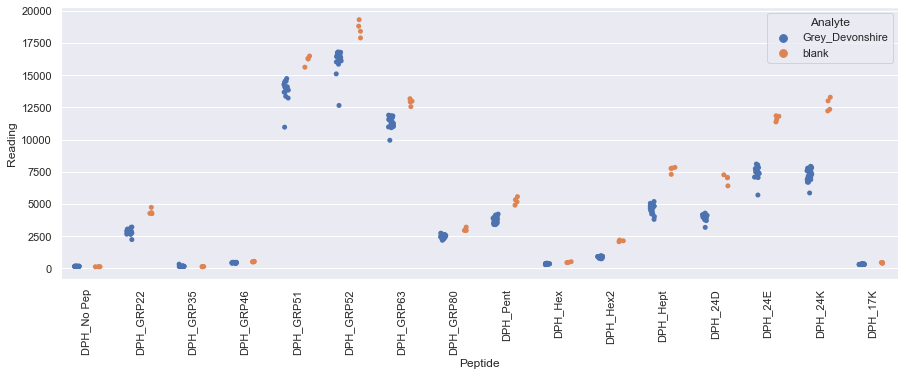

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Diplomat_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

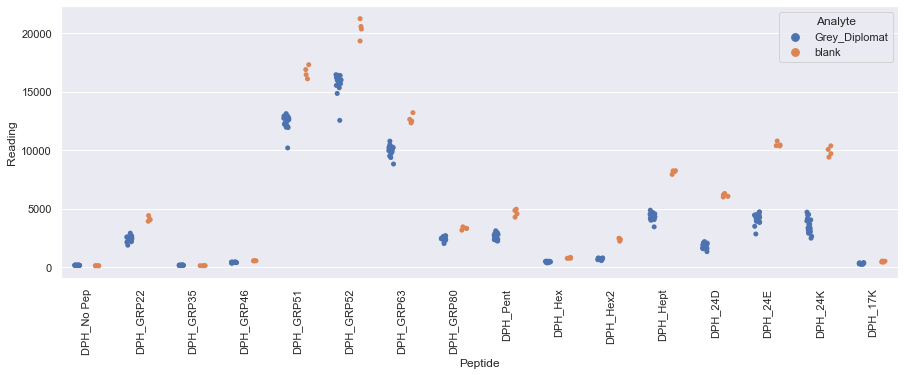

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Joes_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

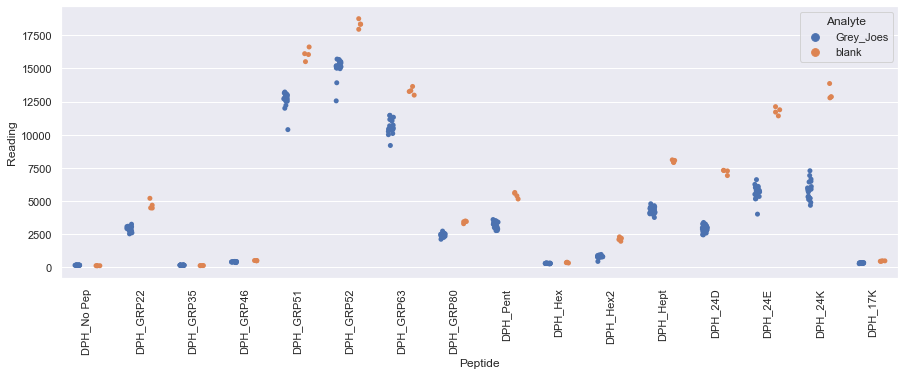

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Mands_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

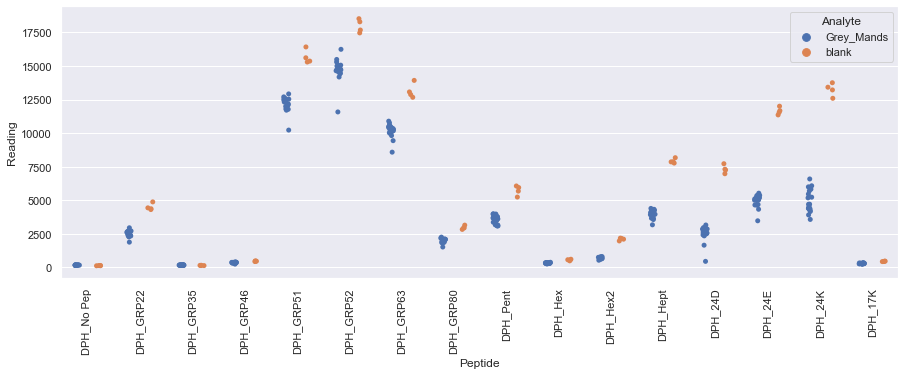

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Pukka_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

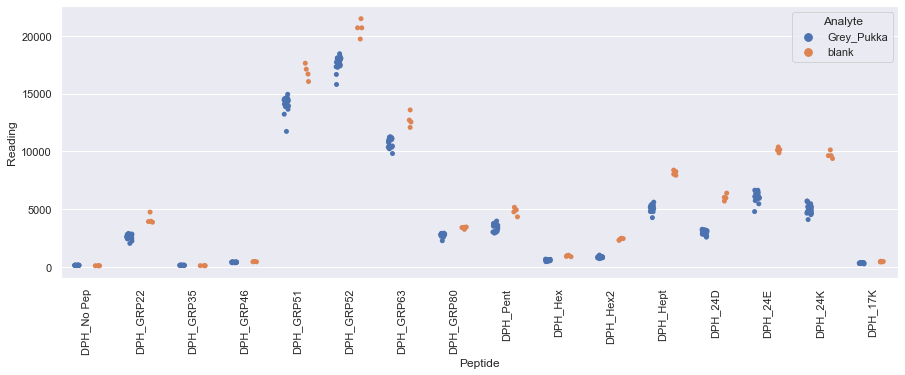

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Tesco_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

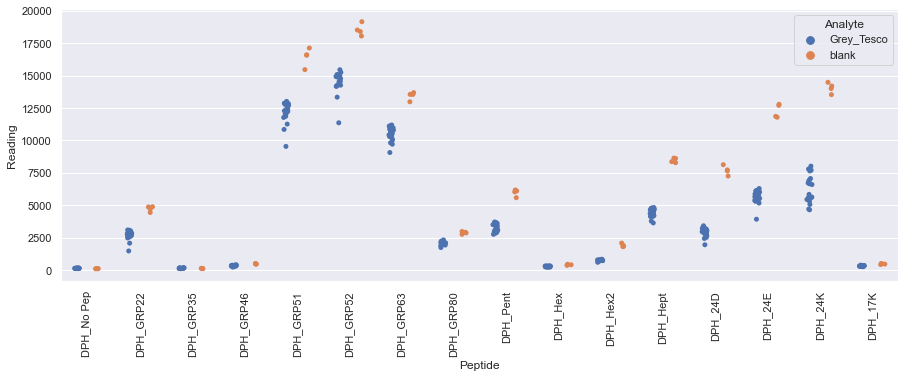

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Twinings_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

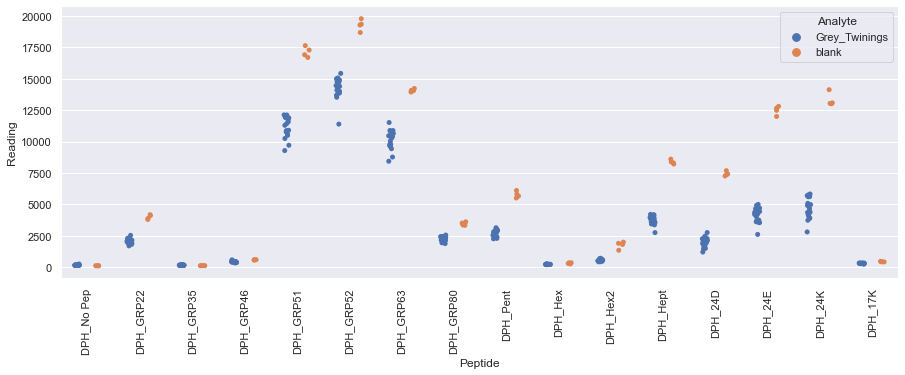

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

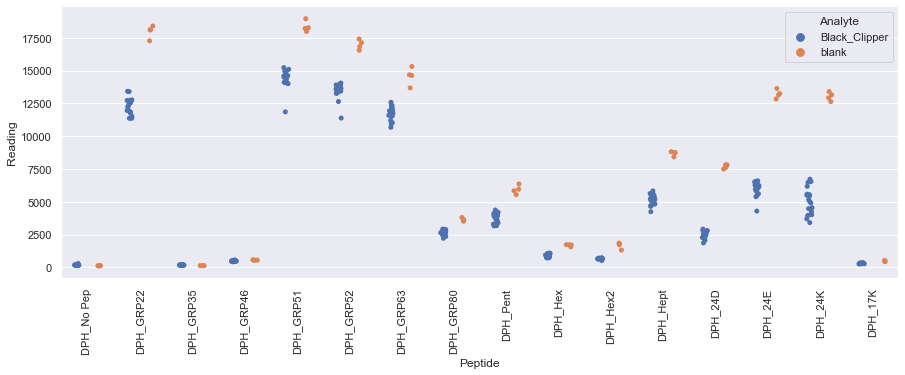

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Diplomat_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

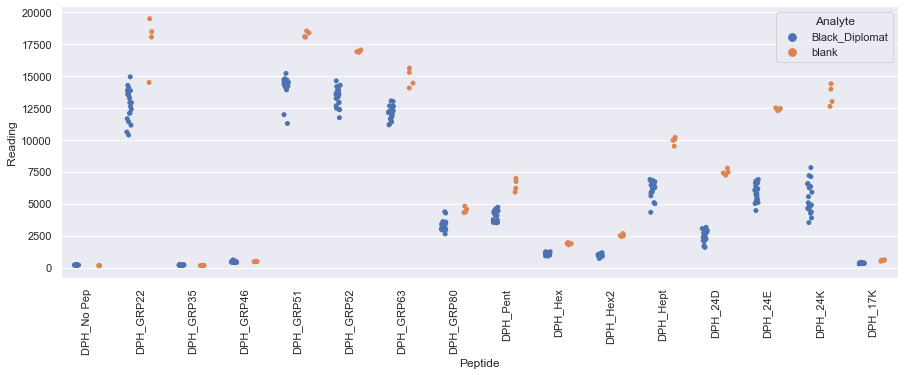

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Dragonfly_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

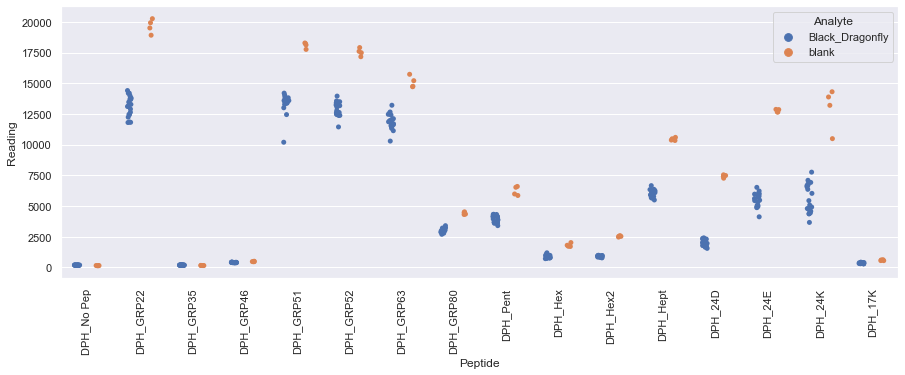

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pgtips_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

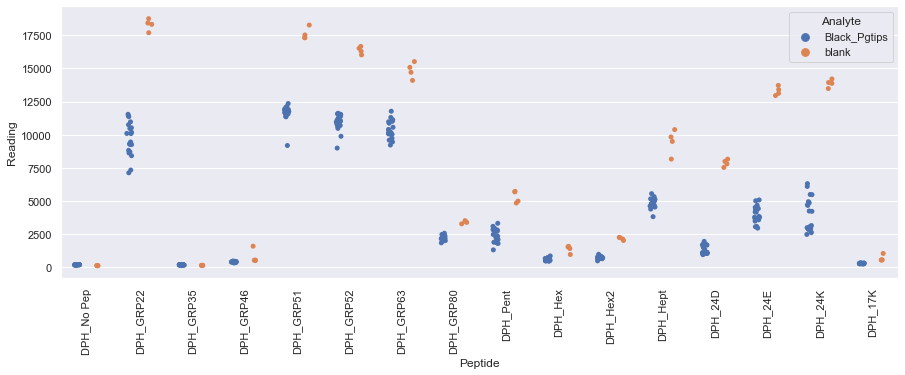

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pukka_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

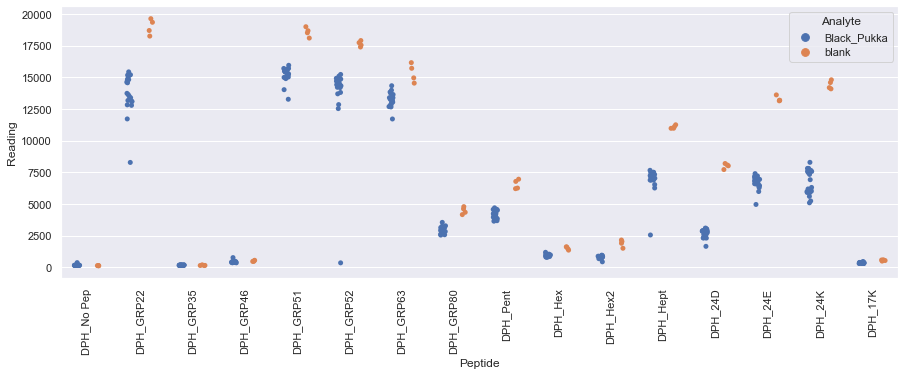

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Sainsburysgold_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

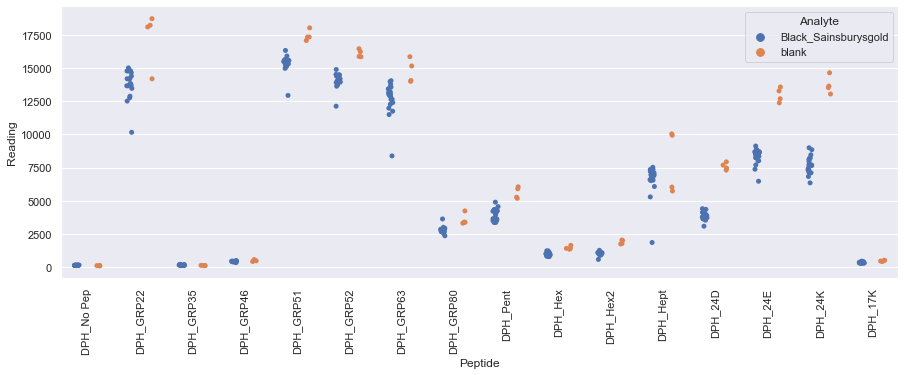

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tesco_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

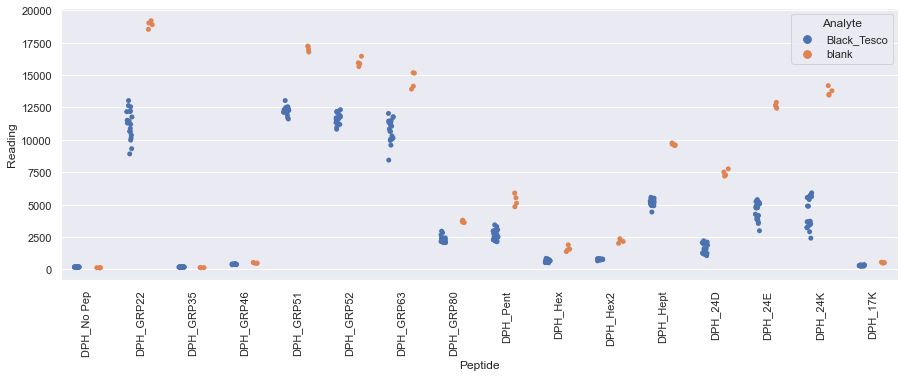

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tetley_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

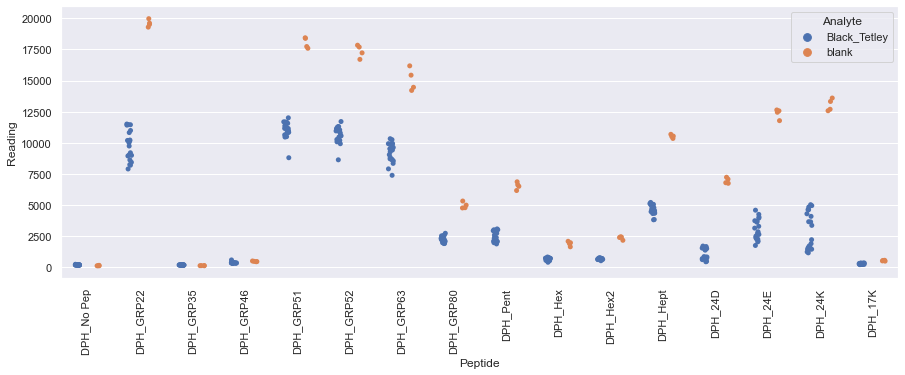

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Twinings_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

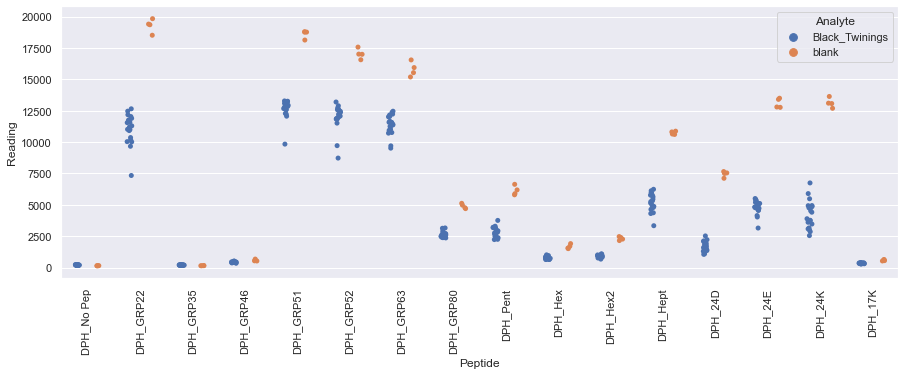

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Yorkshire_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

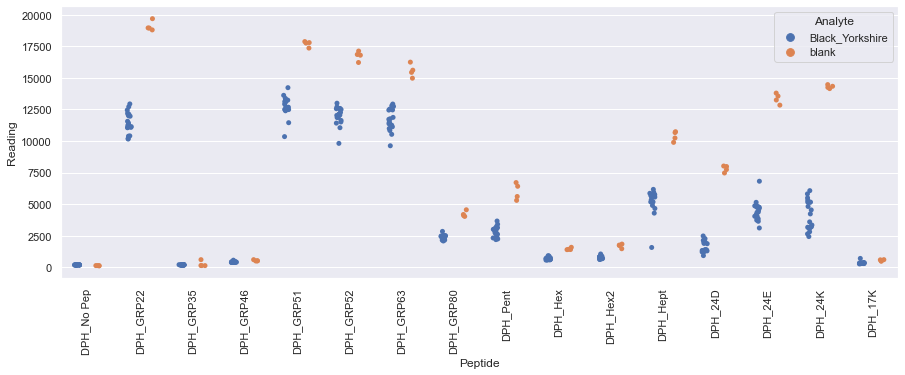

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Clipper_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

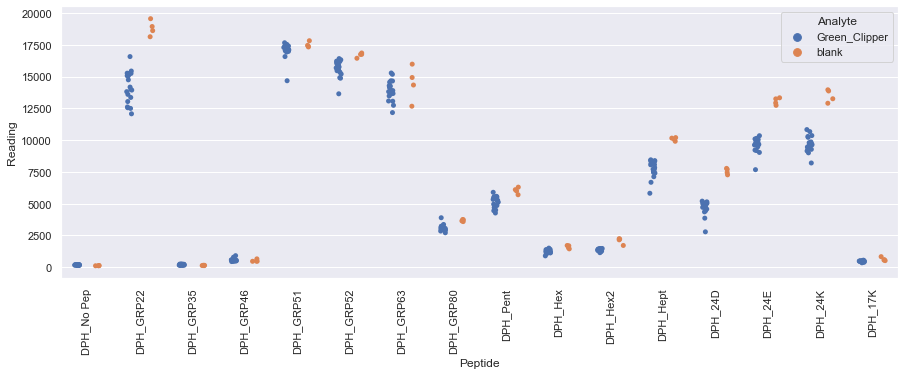

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Diplomat_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

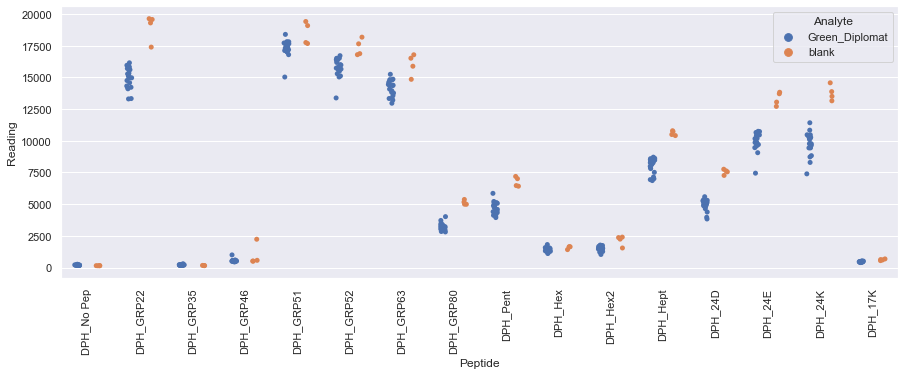

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Doubledragon_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

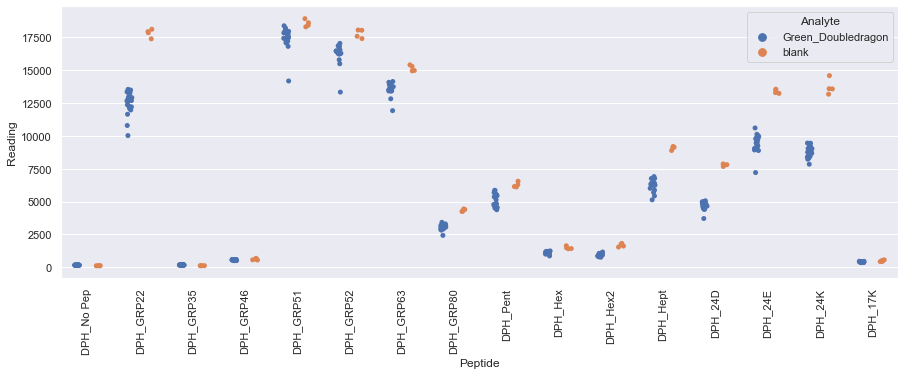

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Dragonfly_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

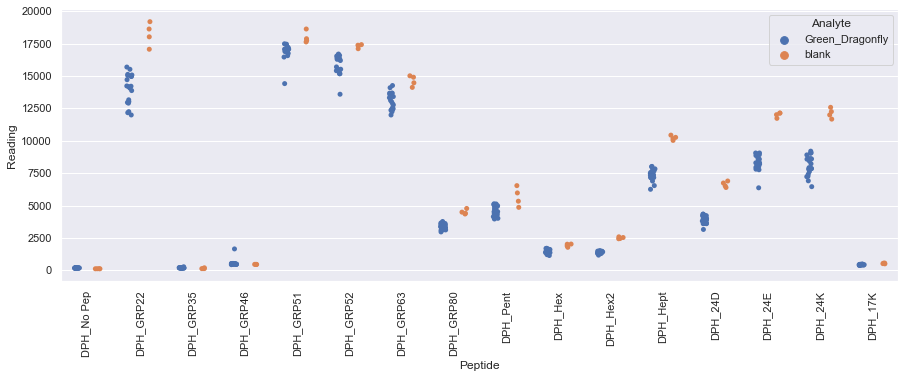

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Handb_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

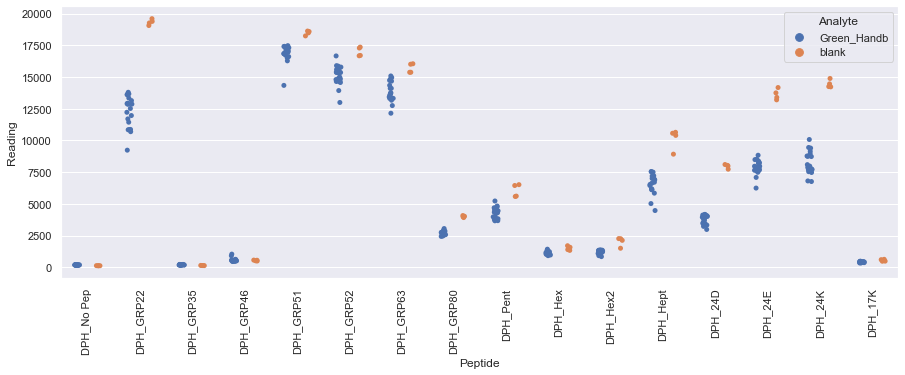

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Joes_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

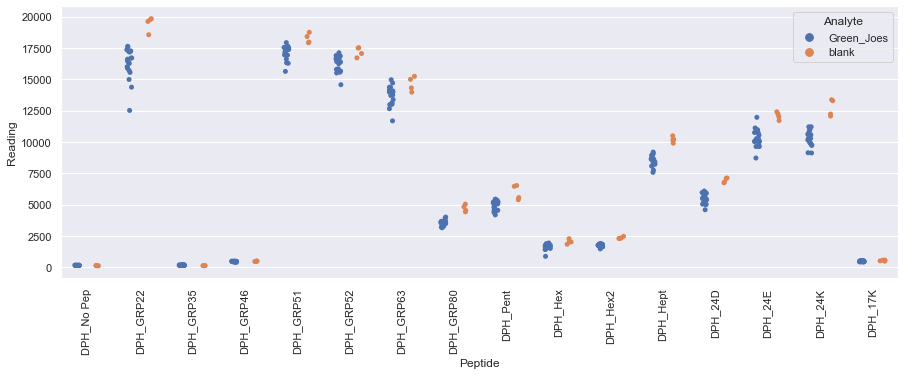

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Qi_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

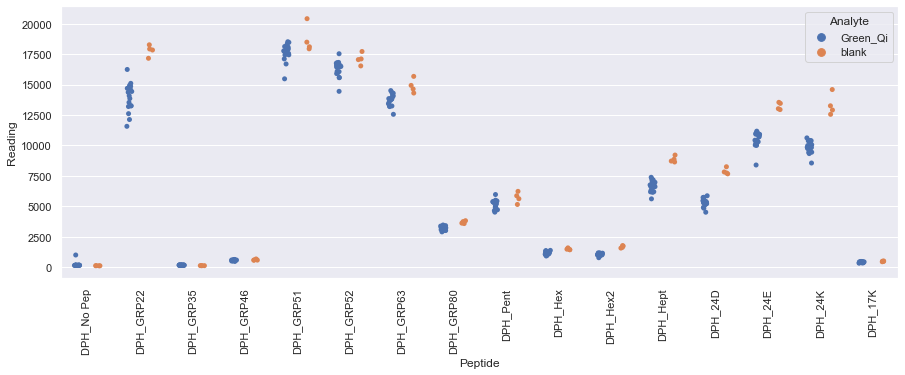

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Sainsburys_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

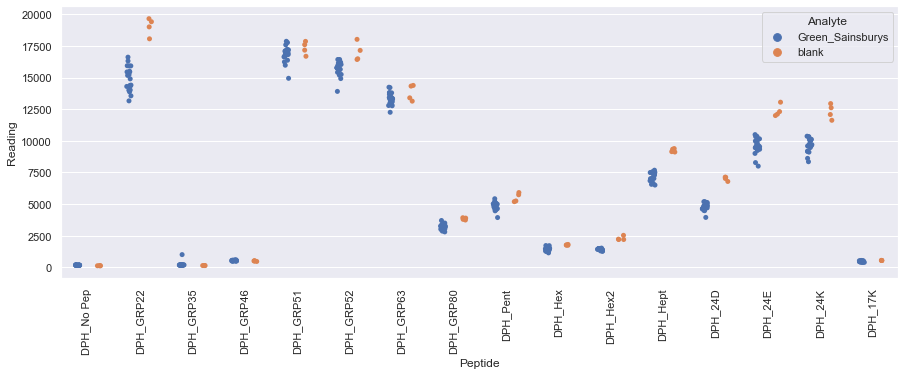

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Tetley_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

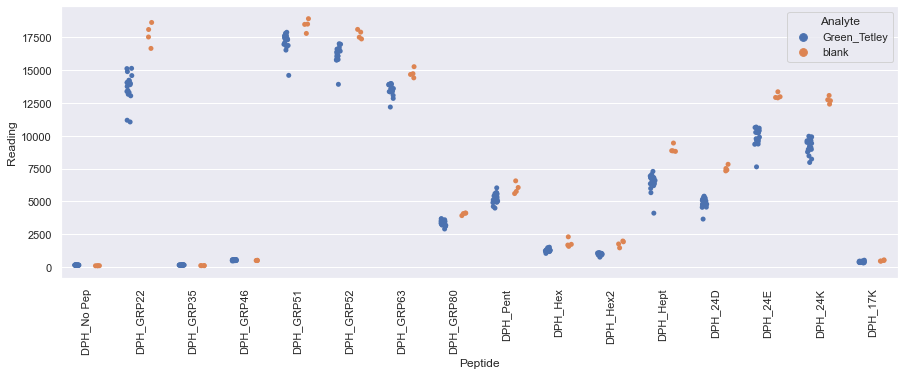

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Twinings_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

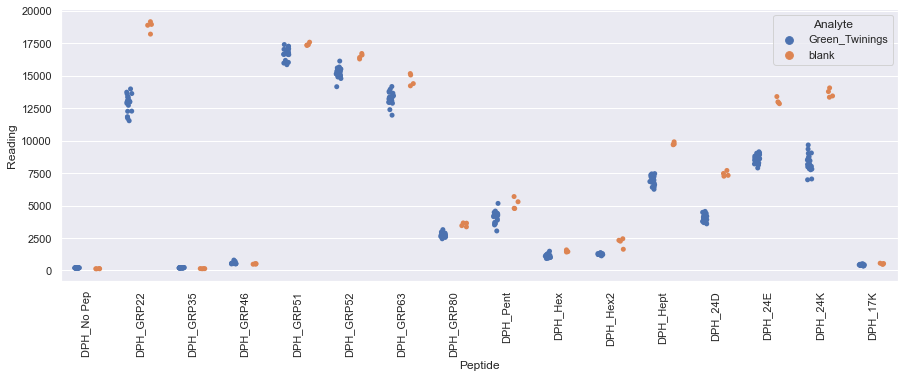

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Asda_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

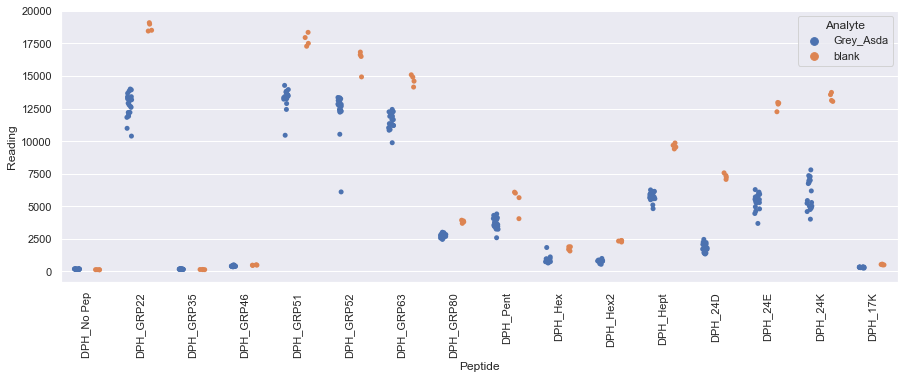

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Clipper_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

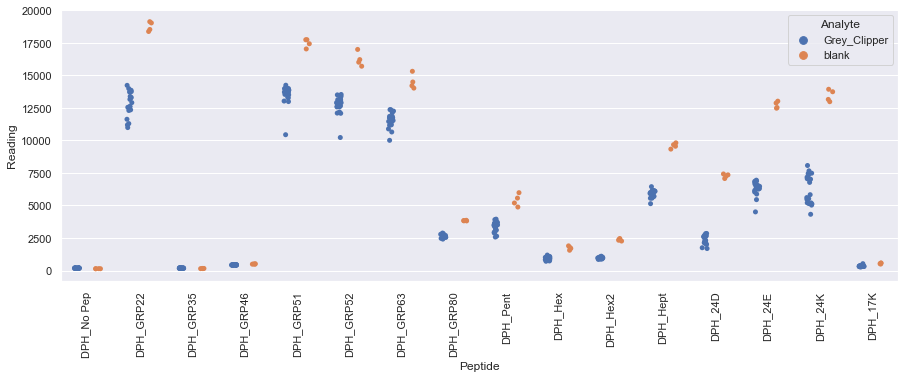

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Coop_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

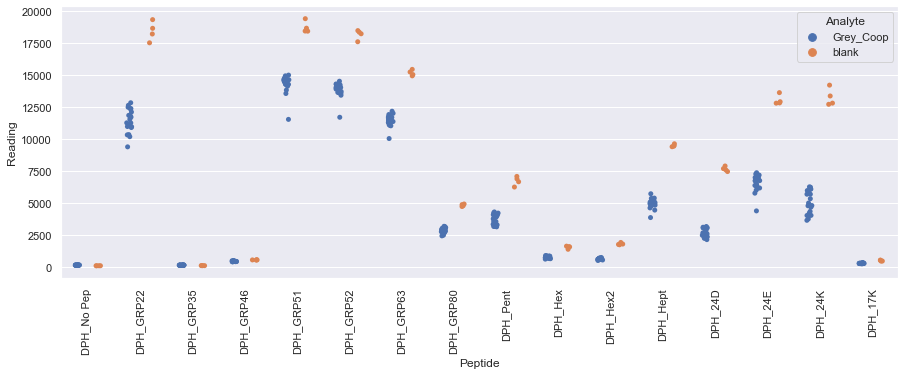

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Devonshire_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

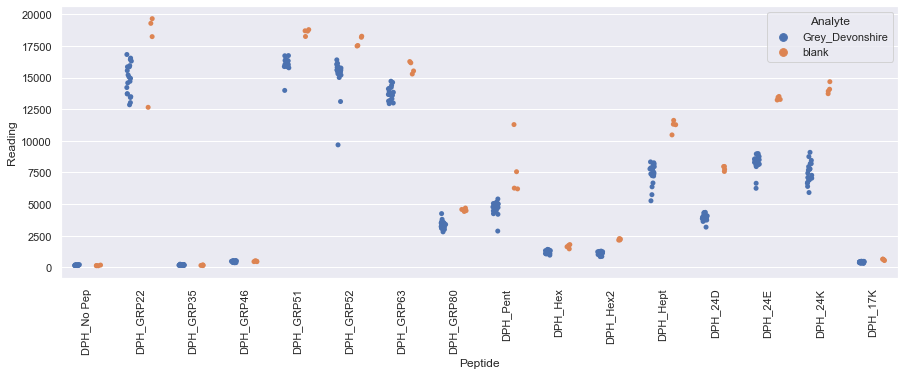

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Diplomat_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

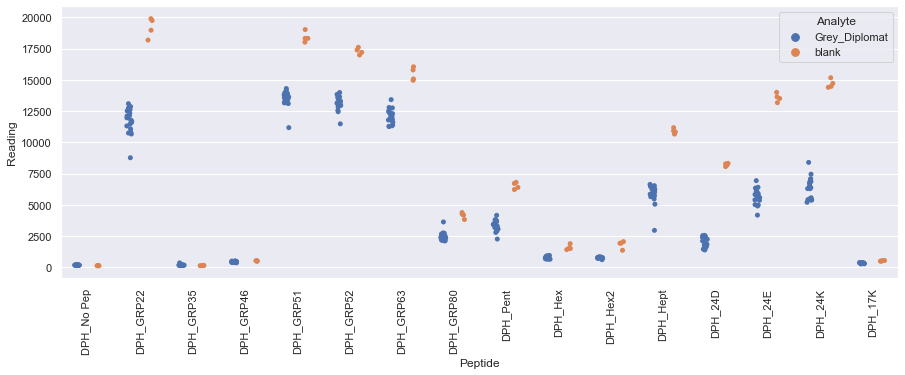

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Joes_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

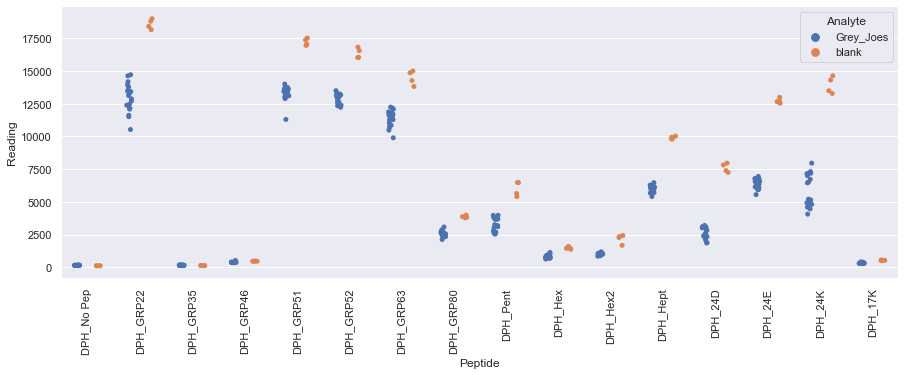

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Mands_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

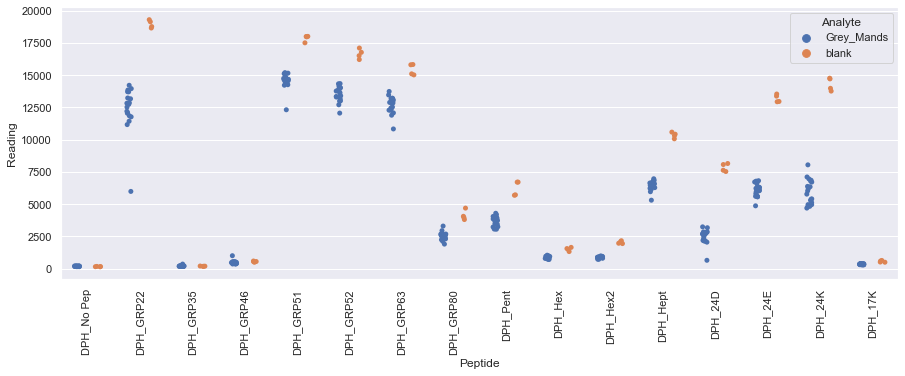

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Pukka_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

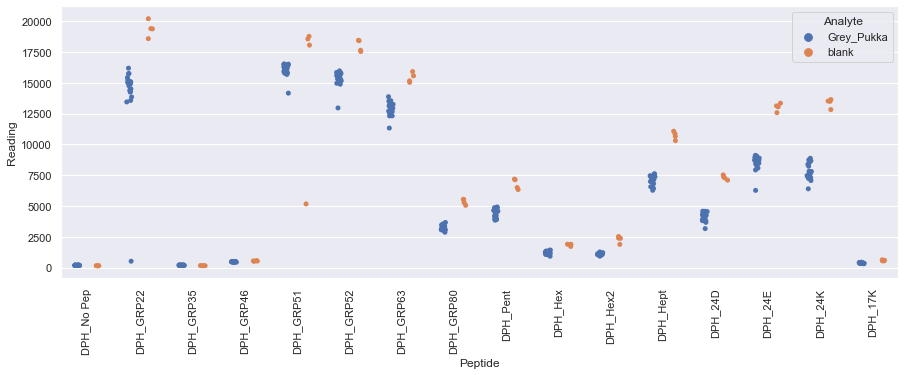

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Tesco_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

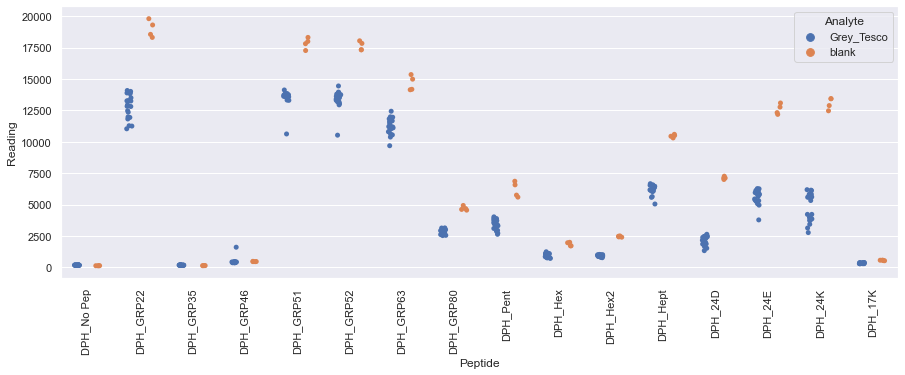

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Twinings_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

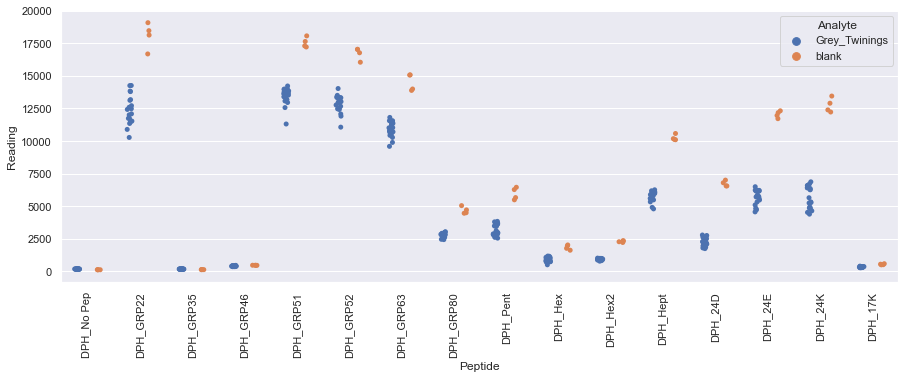

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

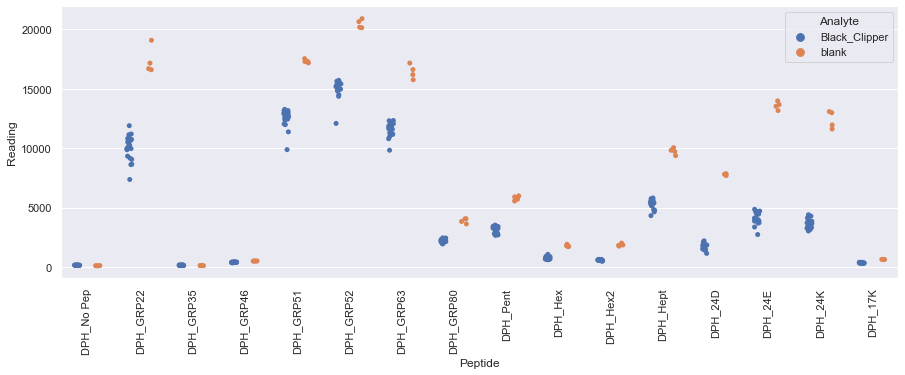

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Diplomat_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

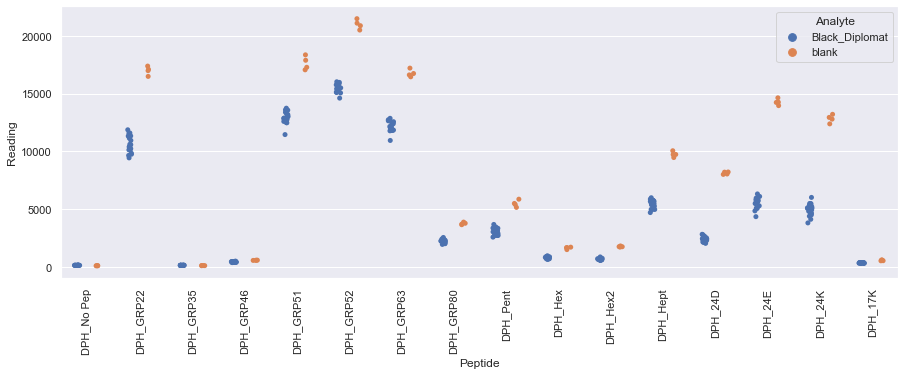

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Dragonfly_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

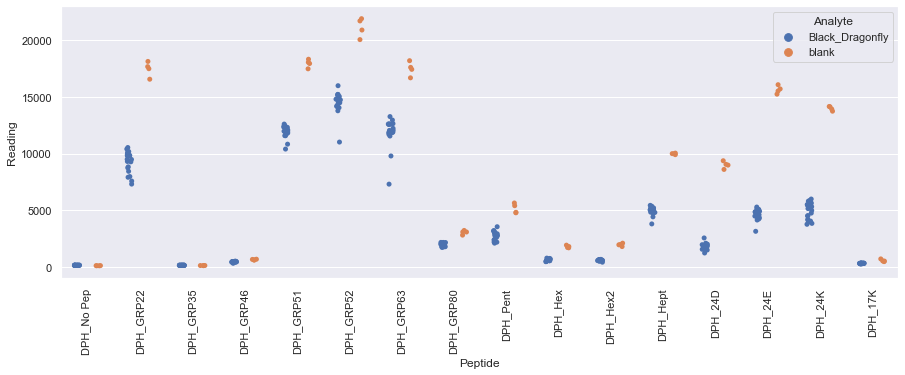

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pgtips_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

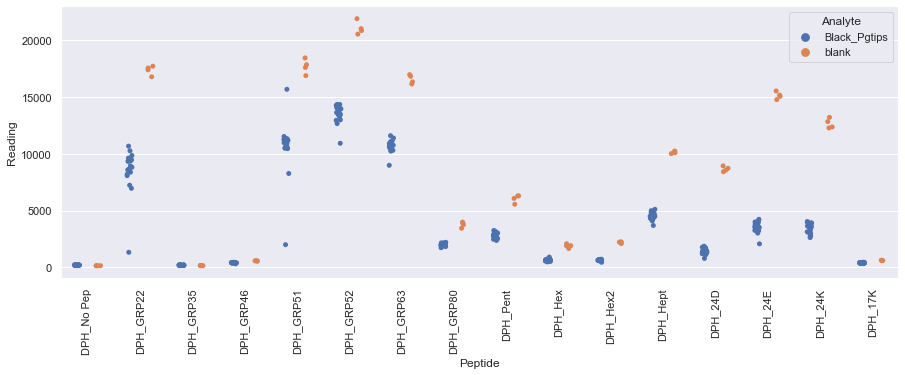

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pukka_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

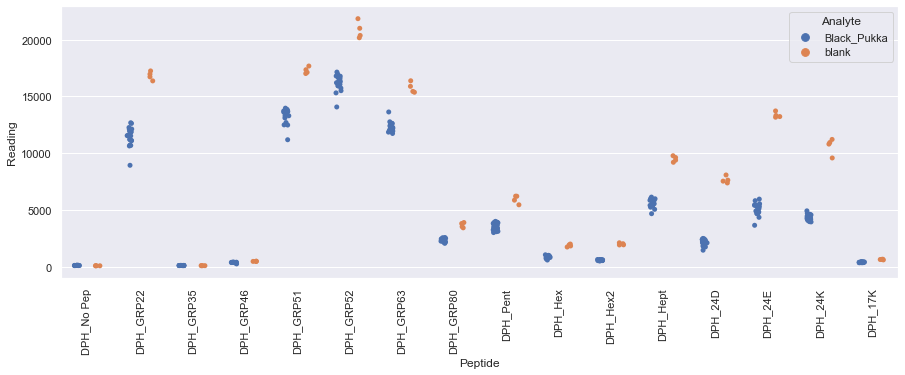

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Sainsburysgold_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

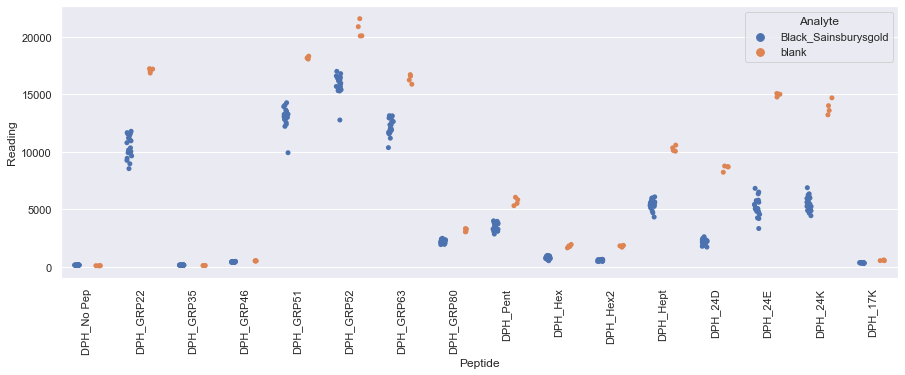

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tesco_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

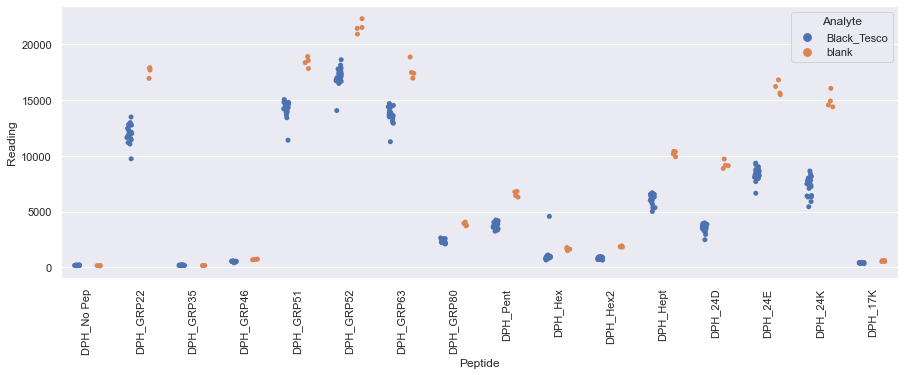

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tetley_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

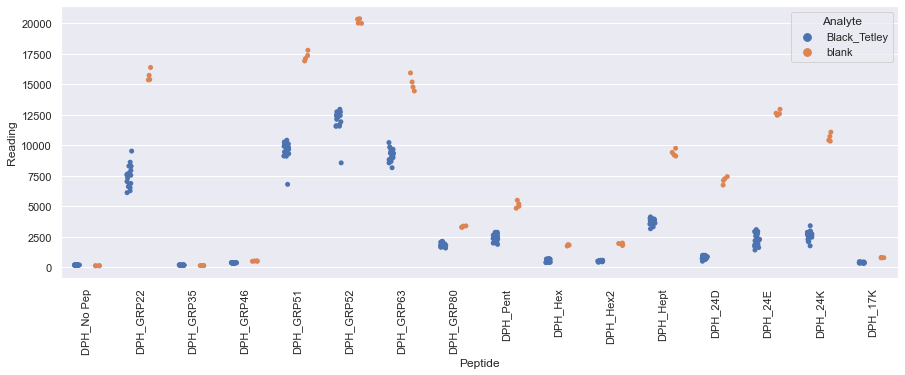

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Twinings_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

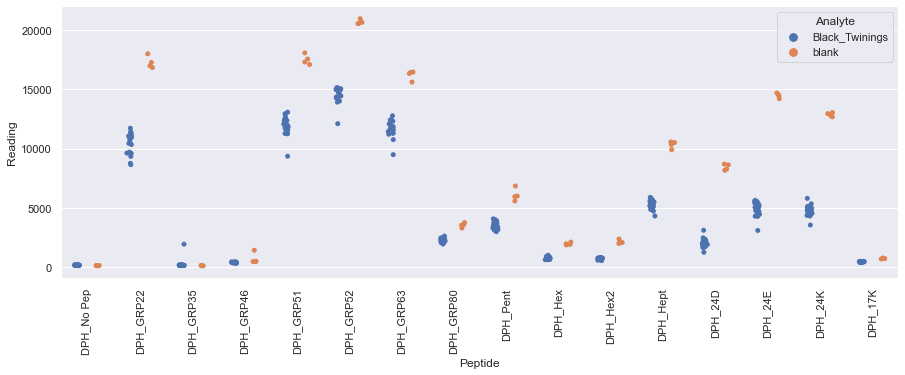

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Yorkshire_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

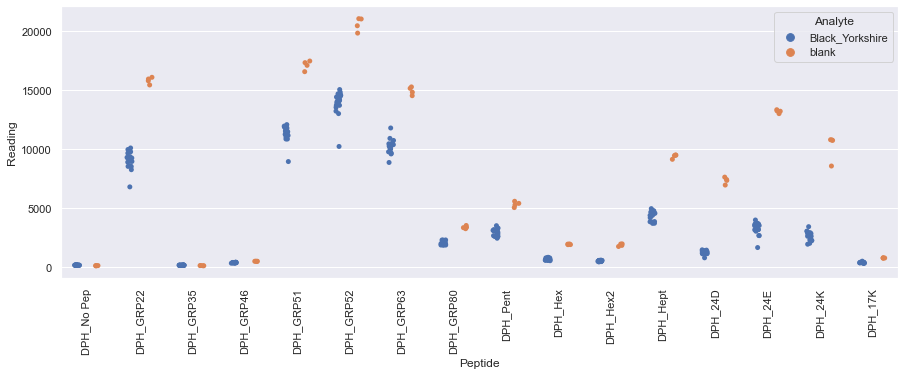

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Clipper_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

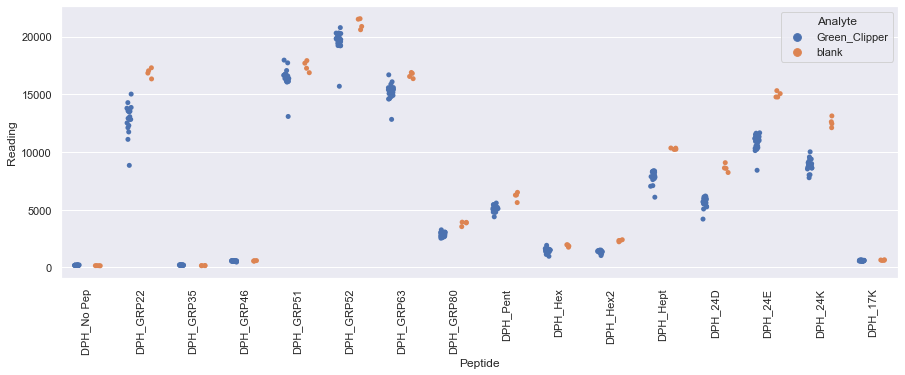

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Diplomat_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

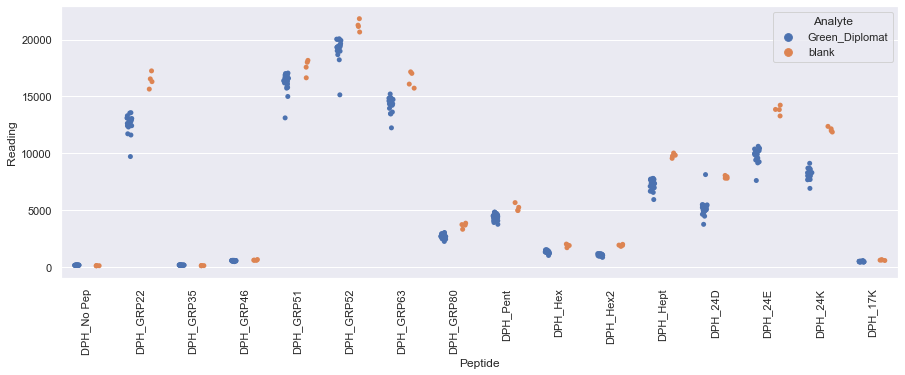

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Doubledragon_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

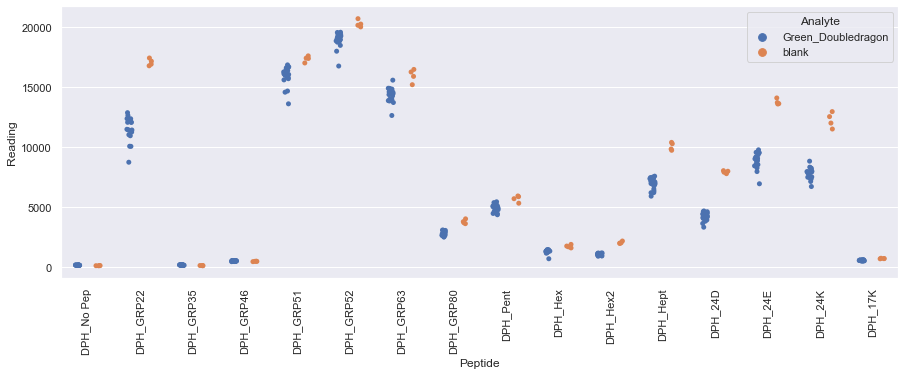

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Dragonfly_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

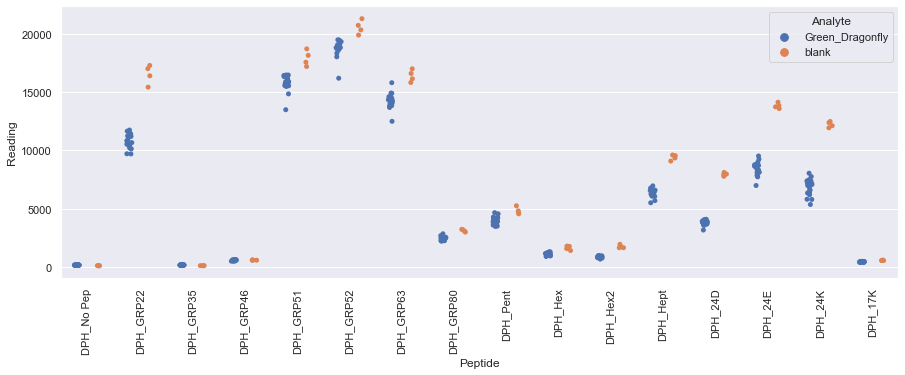

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Handb_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

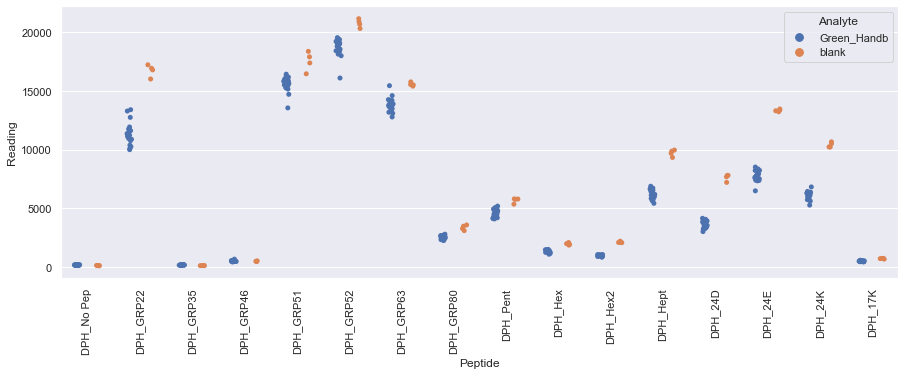

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Joes_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

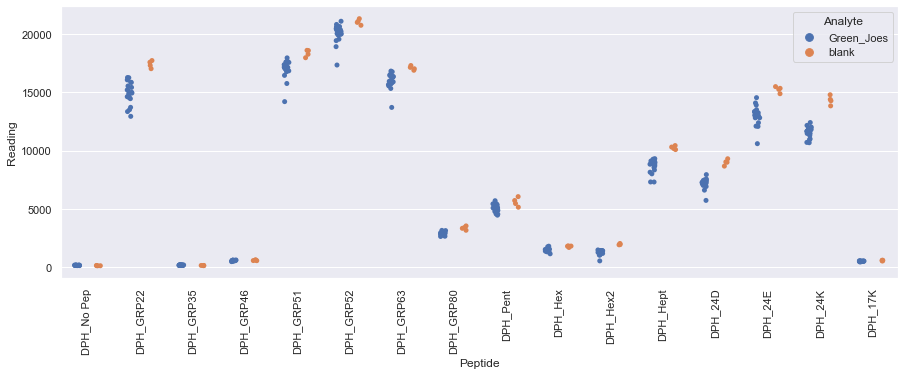

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Qi_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

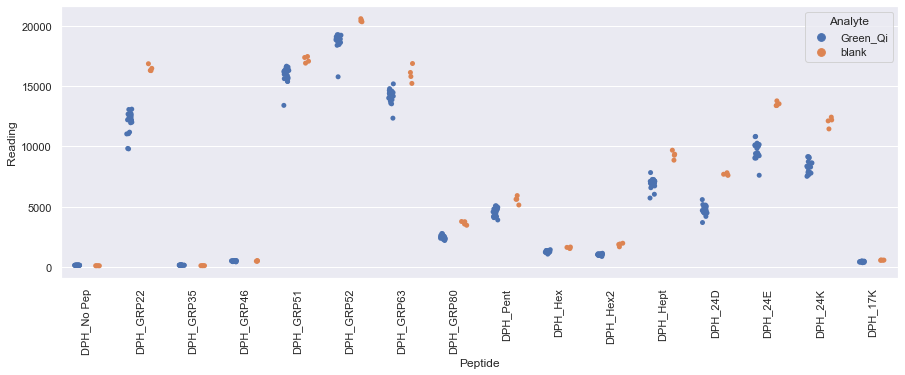

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Sainsburys_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

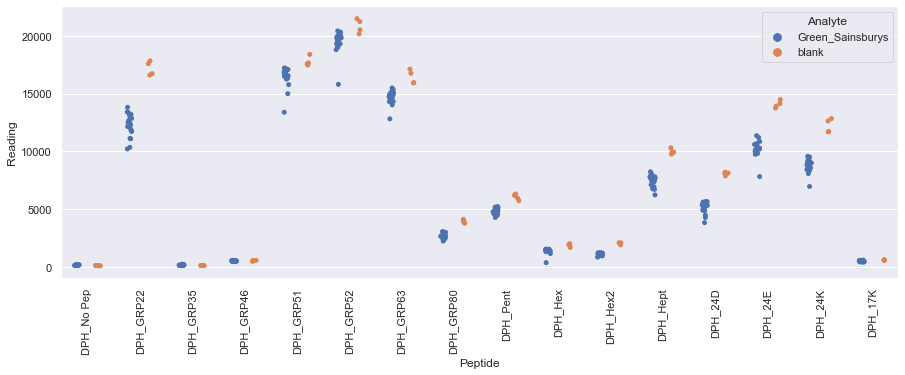

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Tetley_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

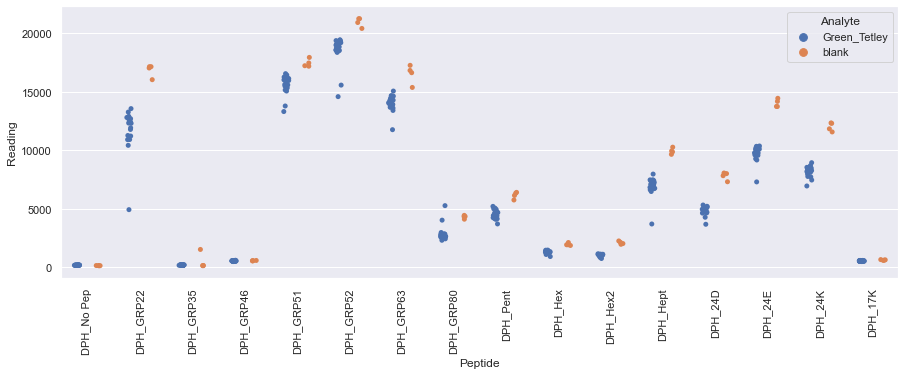

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Twinings_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

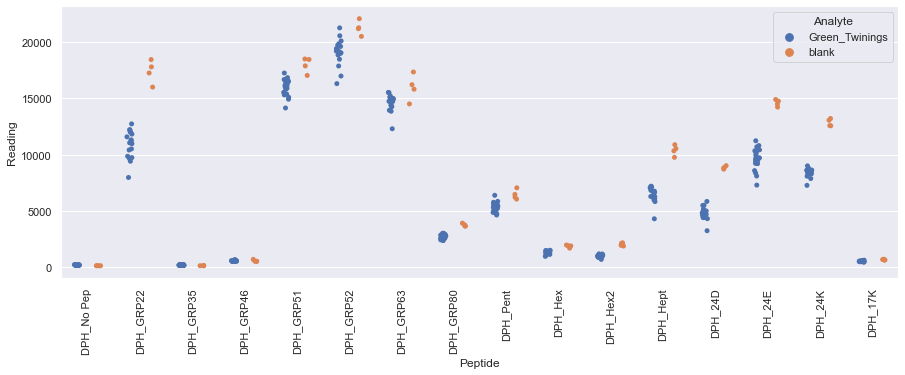

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Asda_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

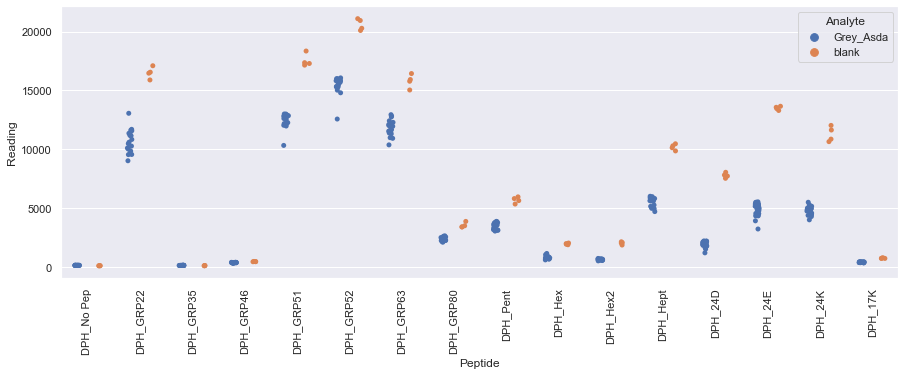

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Clipper_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

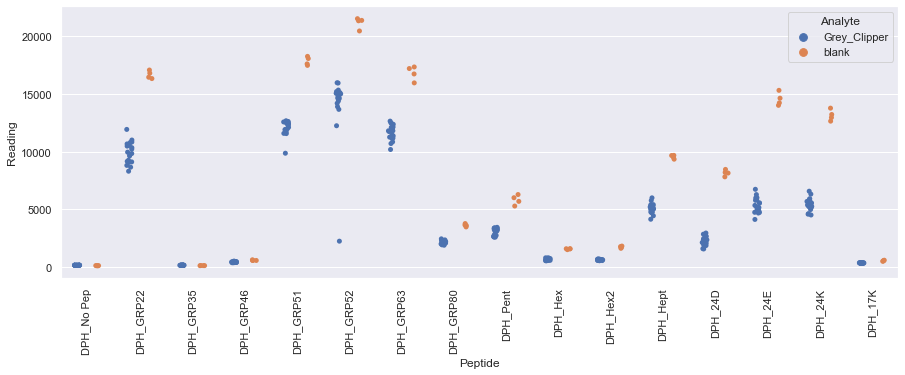

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Coop_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

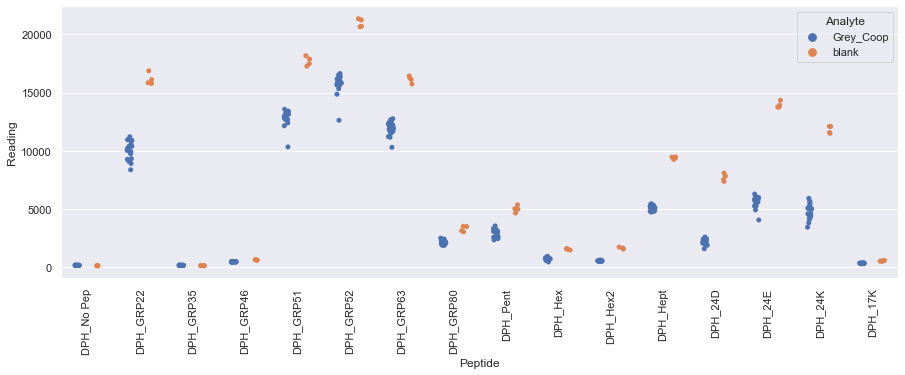

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Devonshire_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

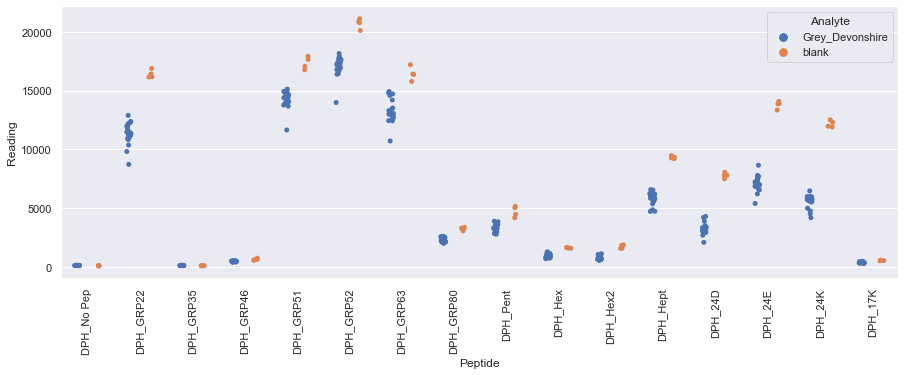

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Diplomat_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

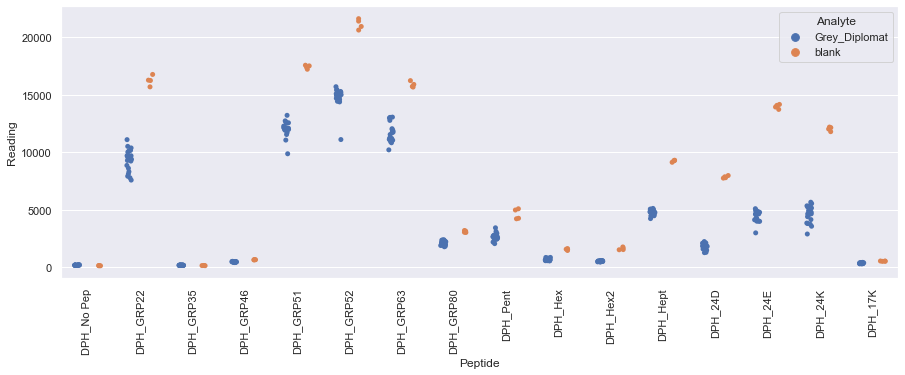

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Joes_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

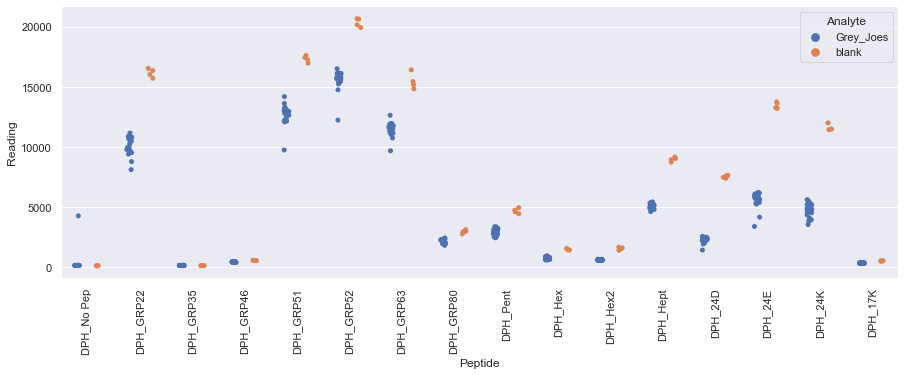

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Mands_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

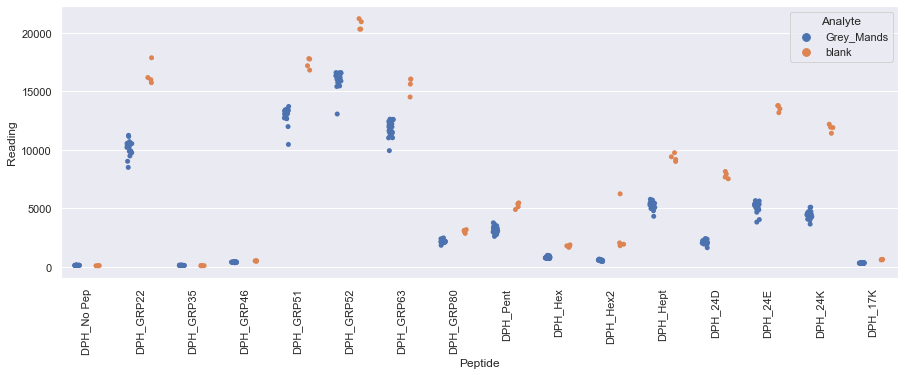

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Pukka_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

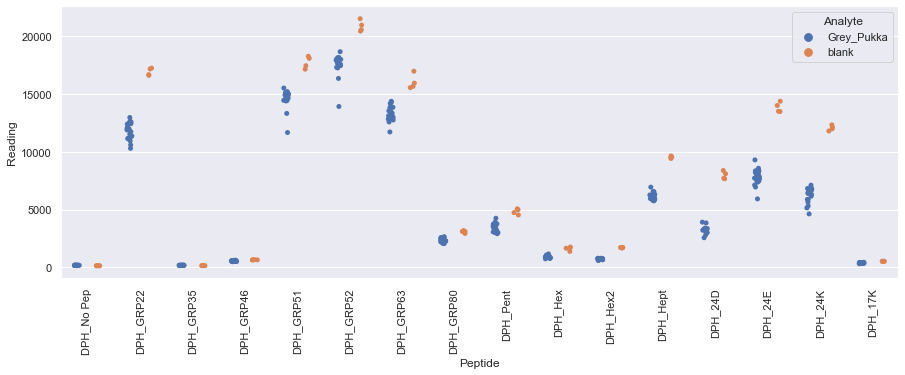

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Tesco_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

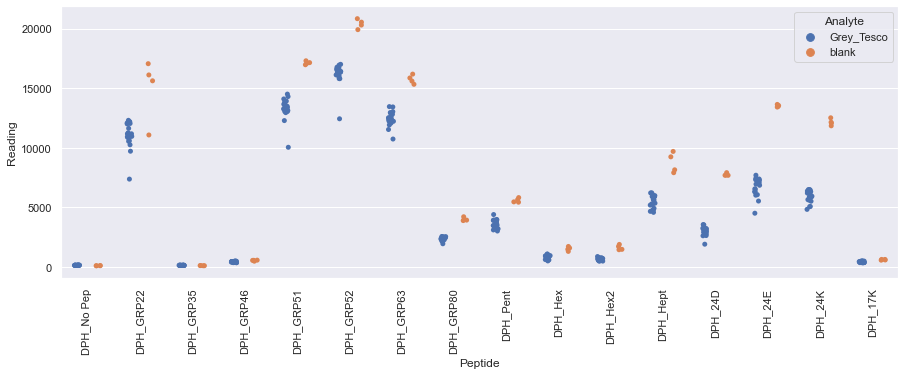

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Twinings_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

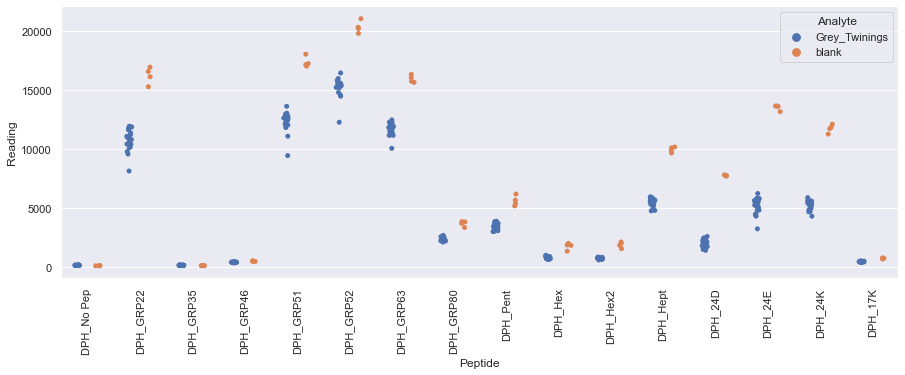

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

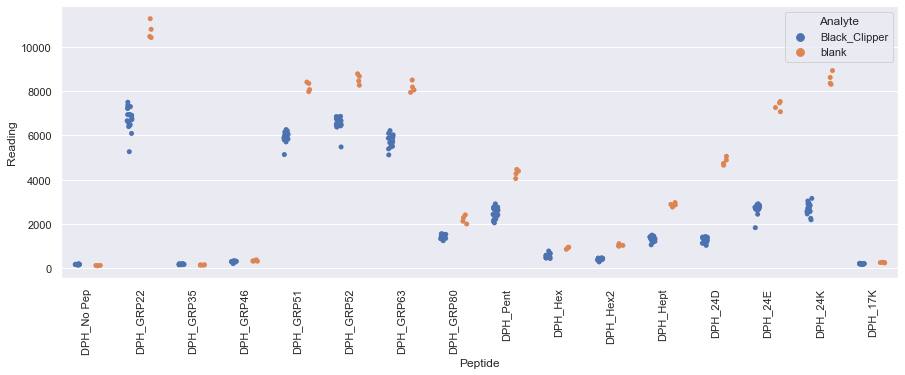

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Diplomat_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

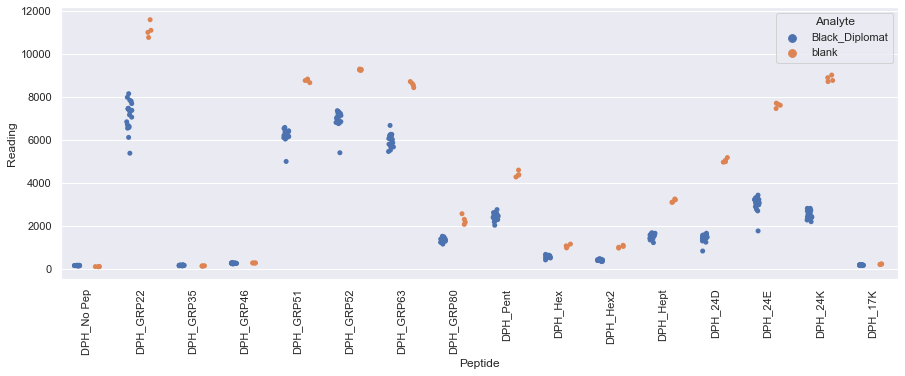

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Dragonfly_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

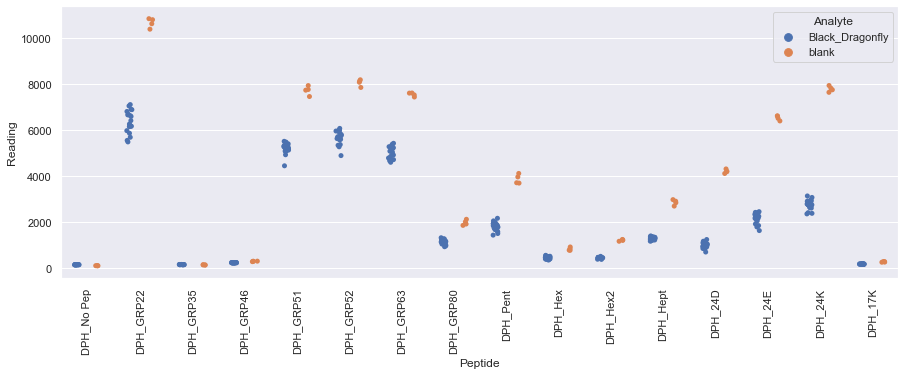

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pgtips_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

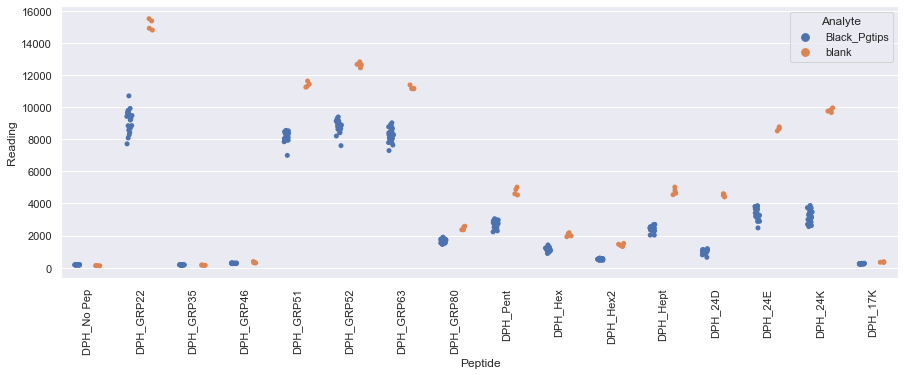

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Pukka_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

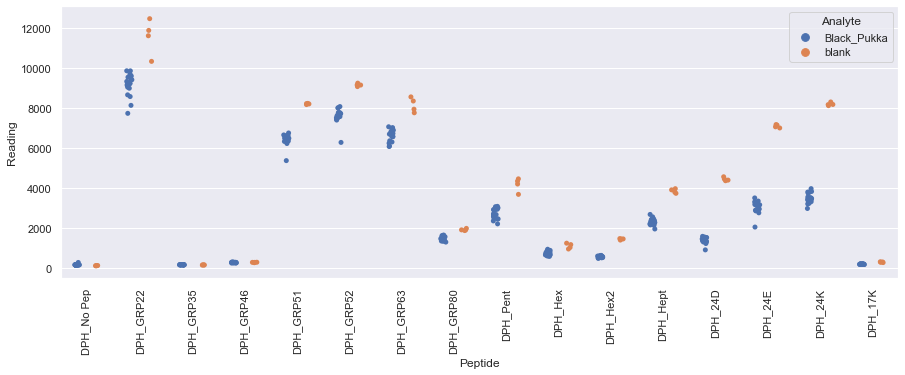

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Sainsburysgold_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

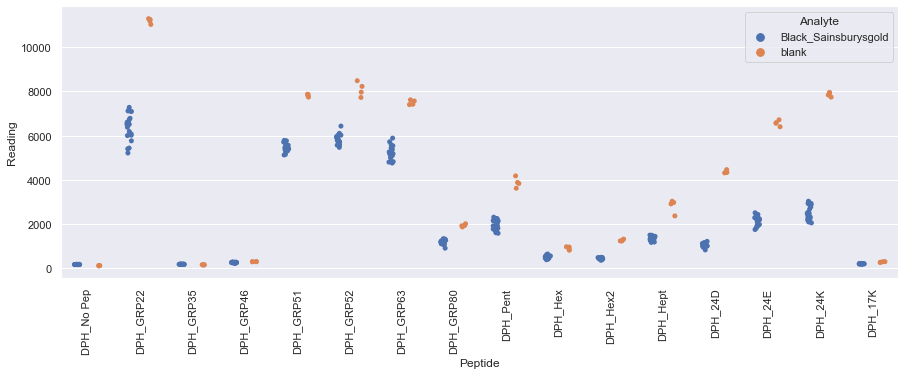

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tesco_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

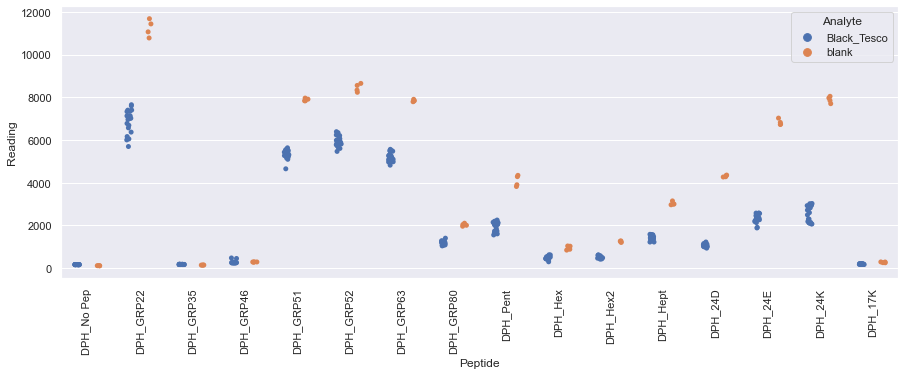

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Tetley_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

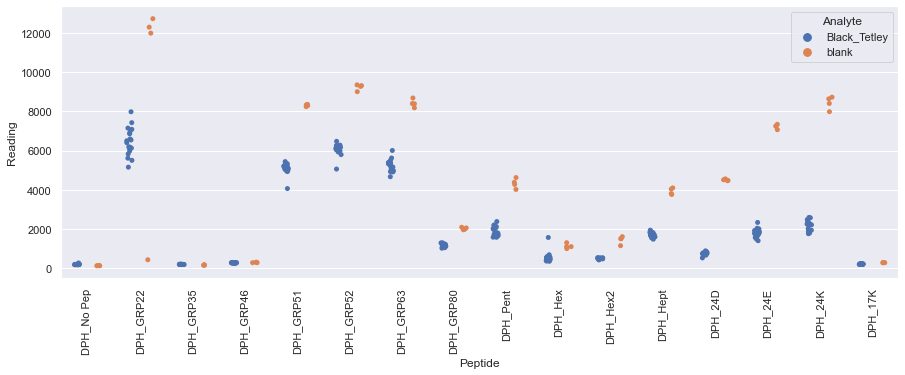

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Twinings_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

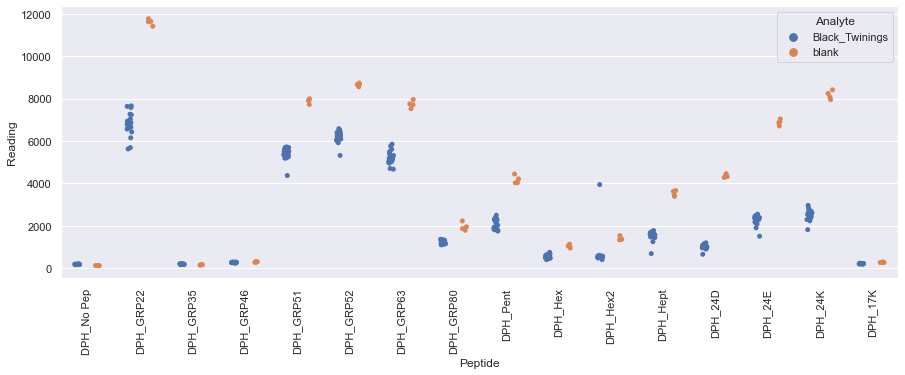

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Yorkshire_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

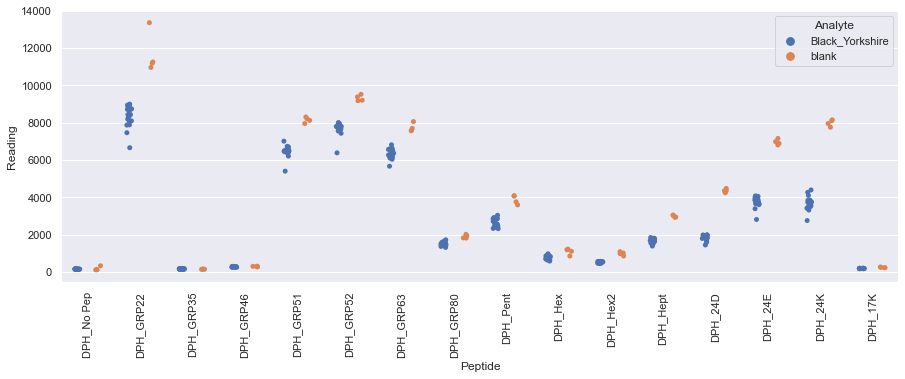

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Clipper_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

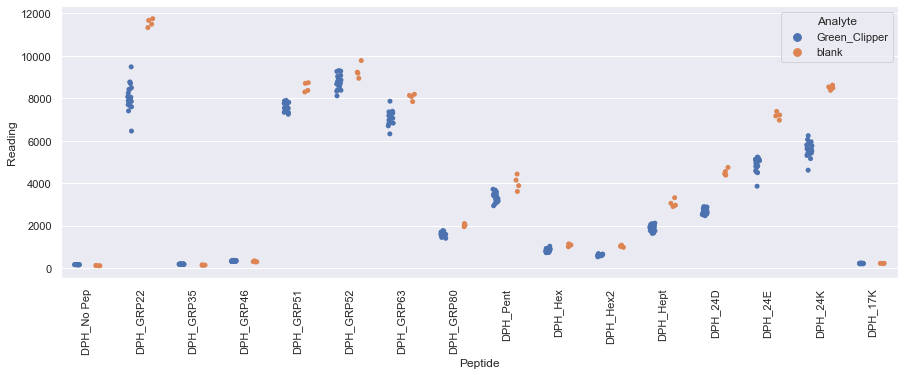

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Diplomat_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

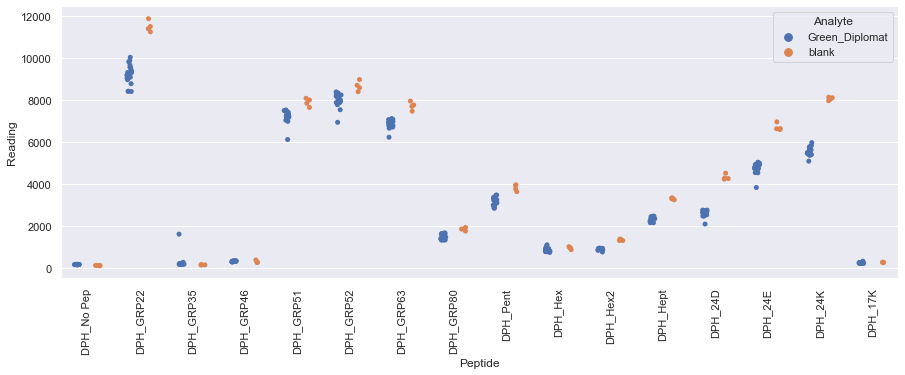

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Doubledragon_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

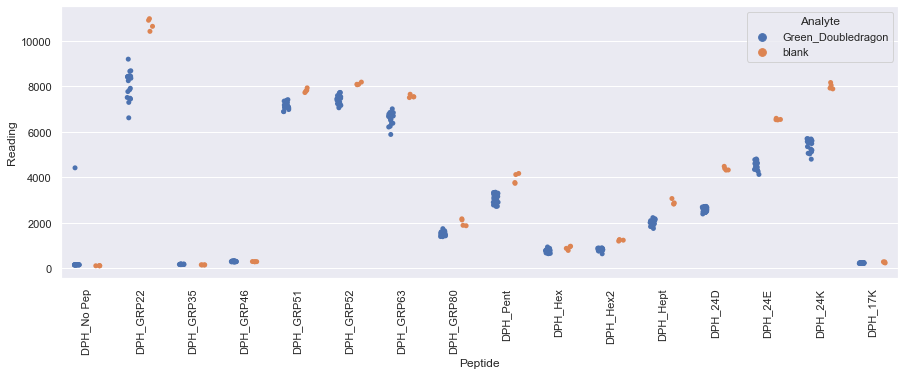

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Dragonfly_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

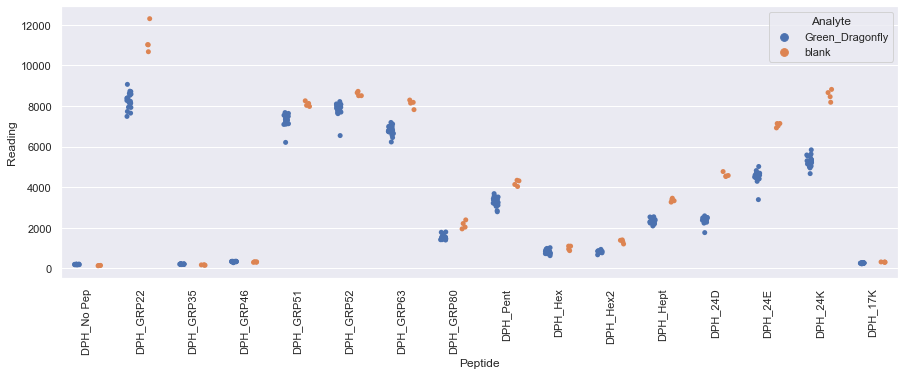

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Handb_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

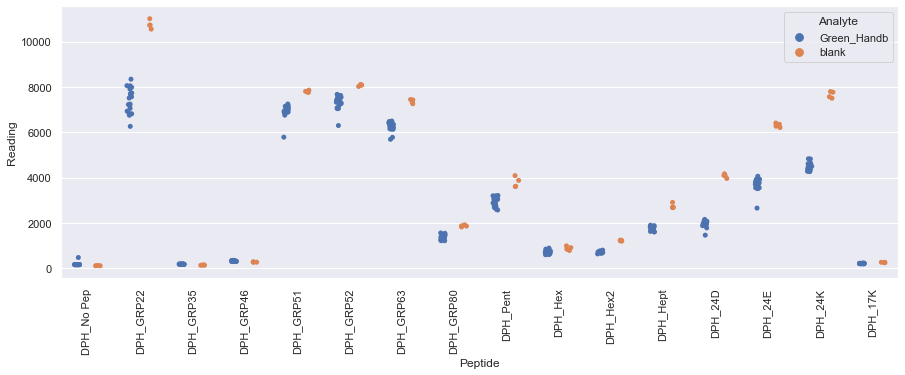

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Joes_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

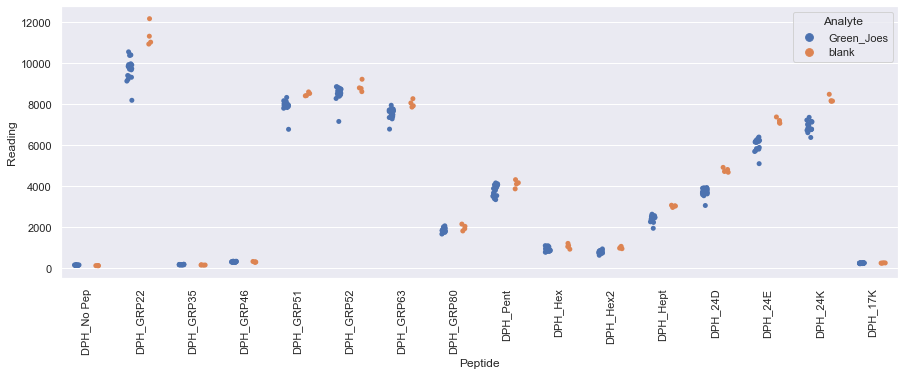

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Qi_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

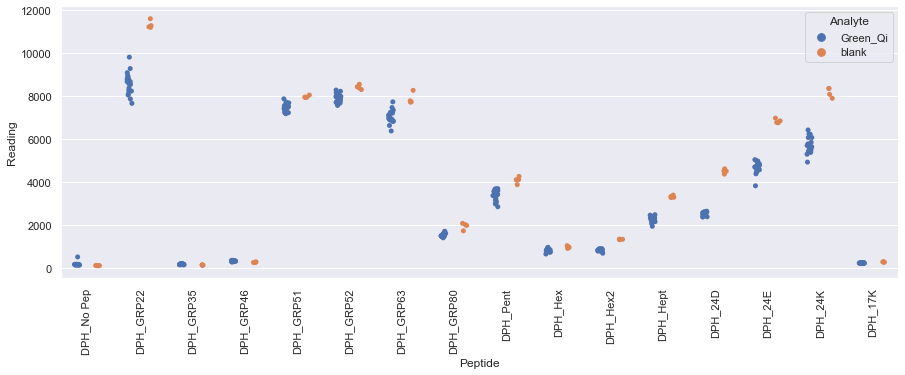

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Sainsburys_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

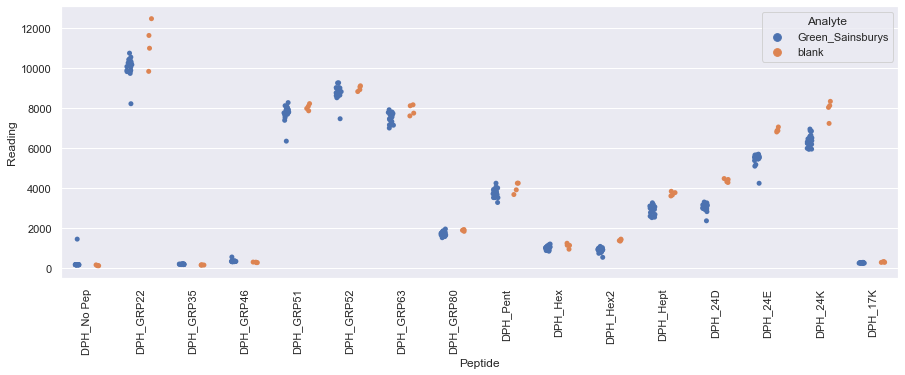

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Tetley_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

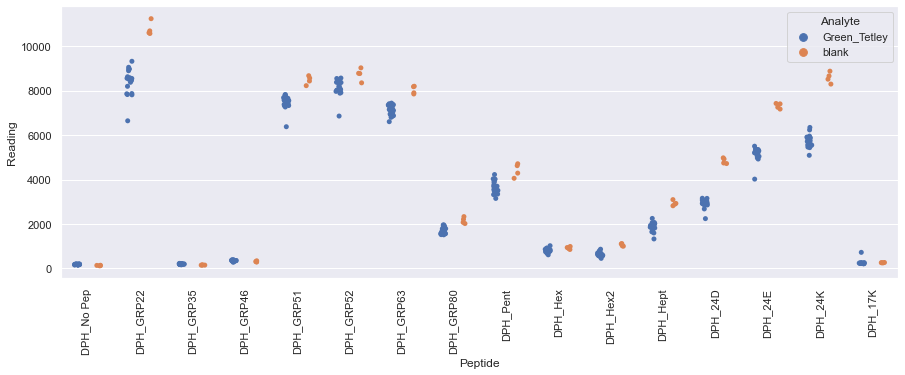

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Green_Twinings_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

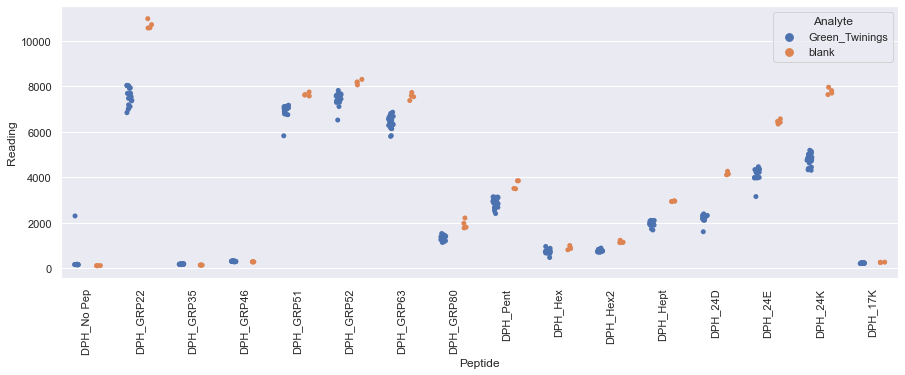

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Asda_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

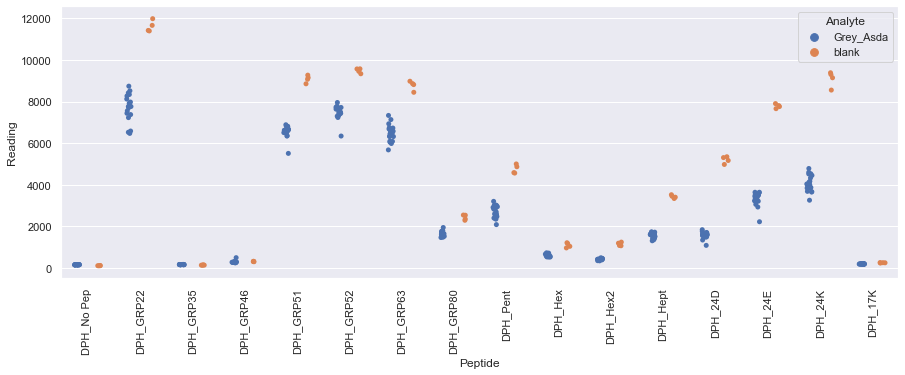

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Clipper_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

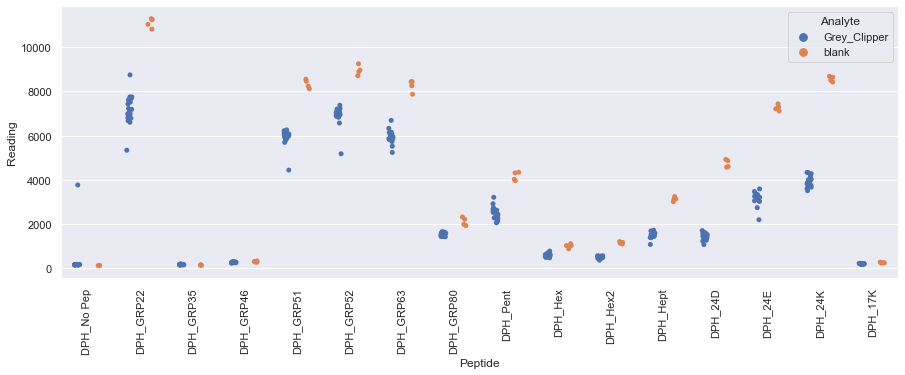

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Coop_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

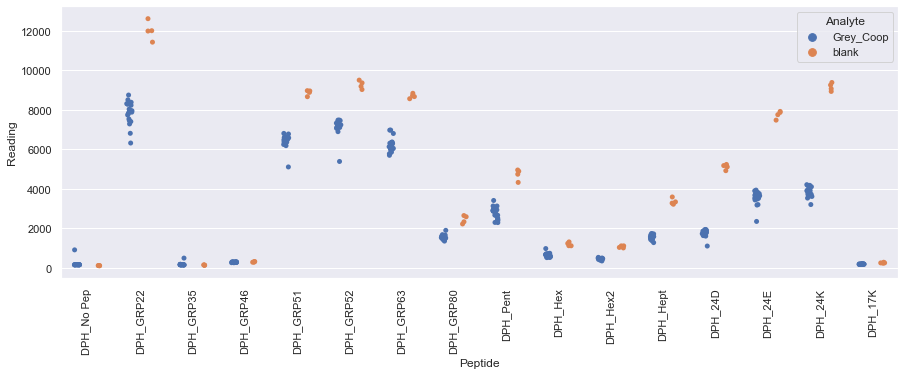

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Devonshire_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

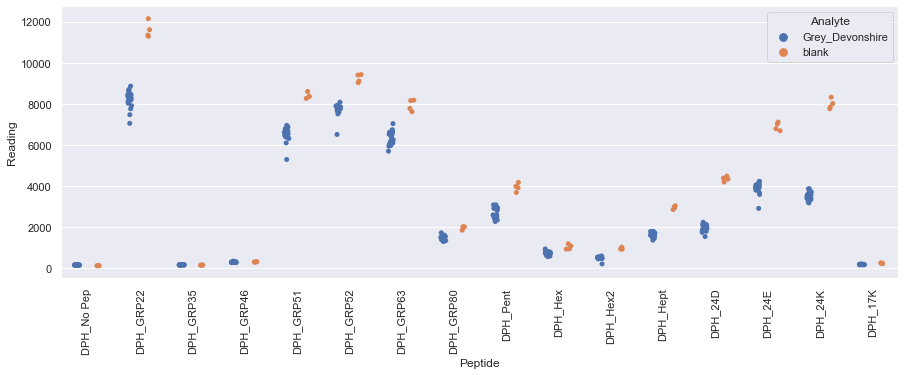

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Diplomat_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

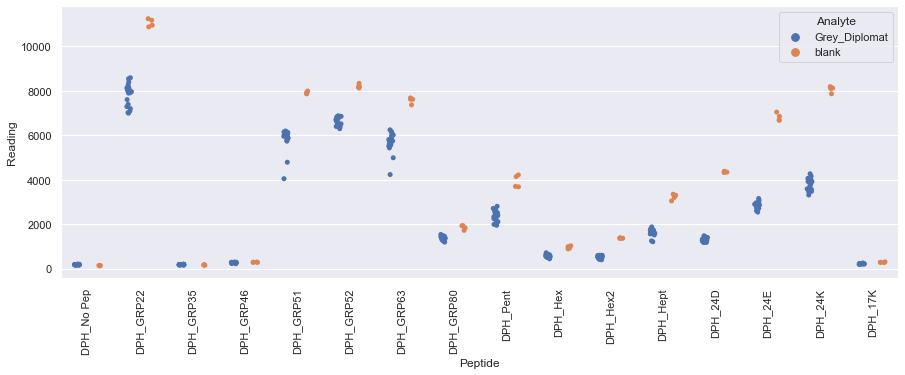

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Joes_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

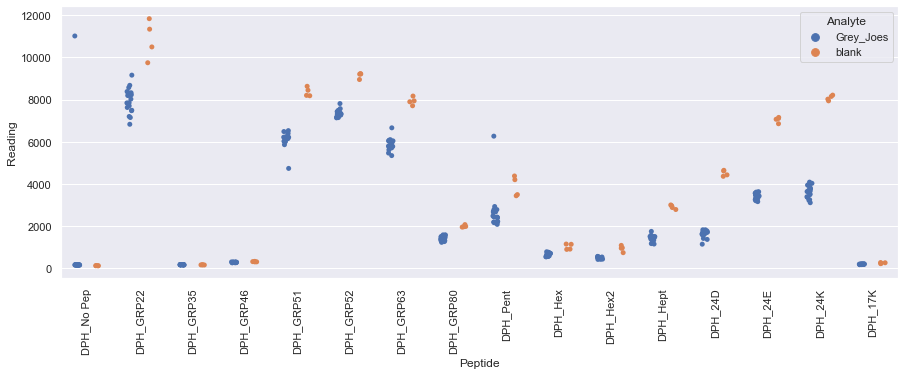

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Mands_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

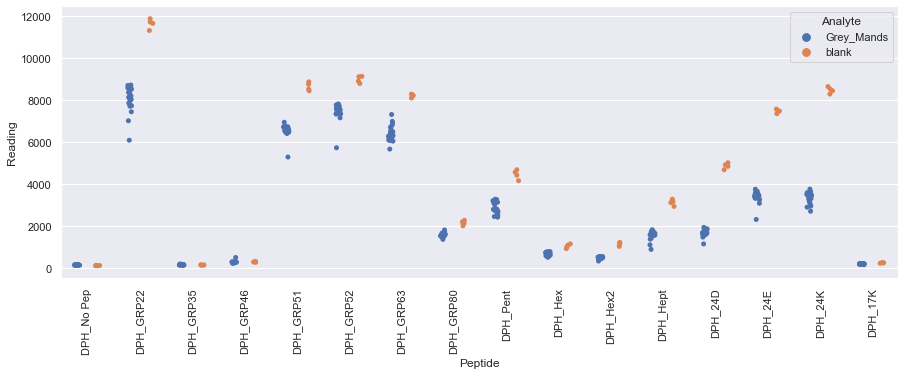

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Pukka_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

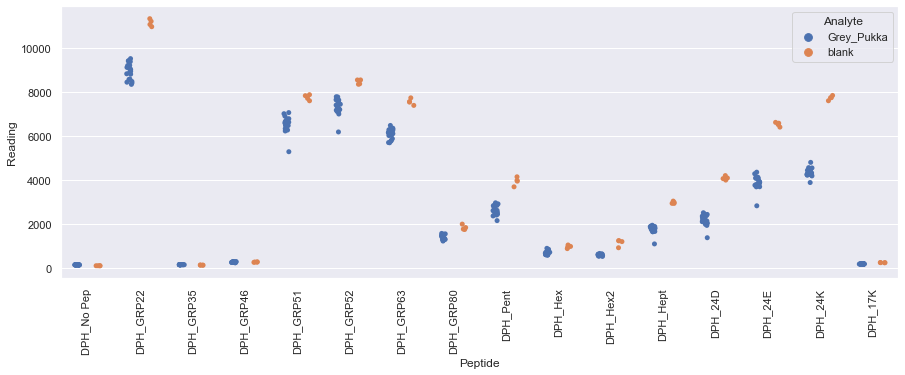

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Tesco_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

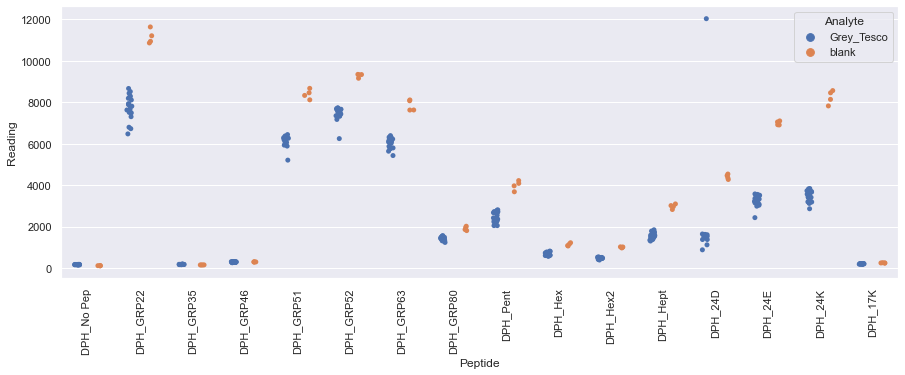

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Grey_Twinings_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

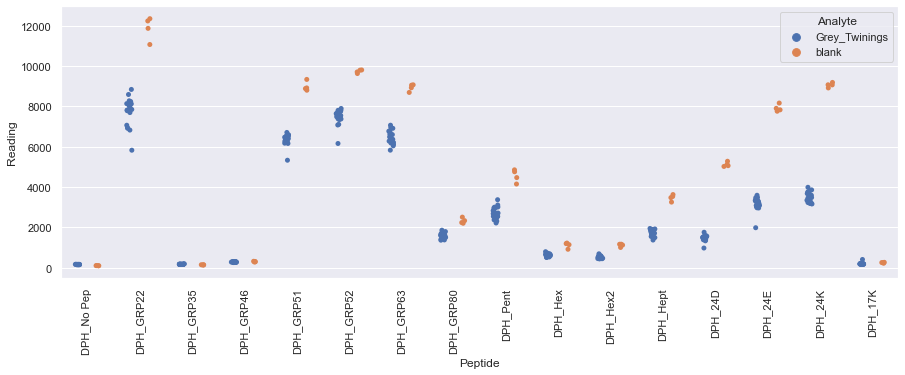

Drawing scatter plot of data spread for Black_Clipper_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

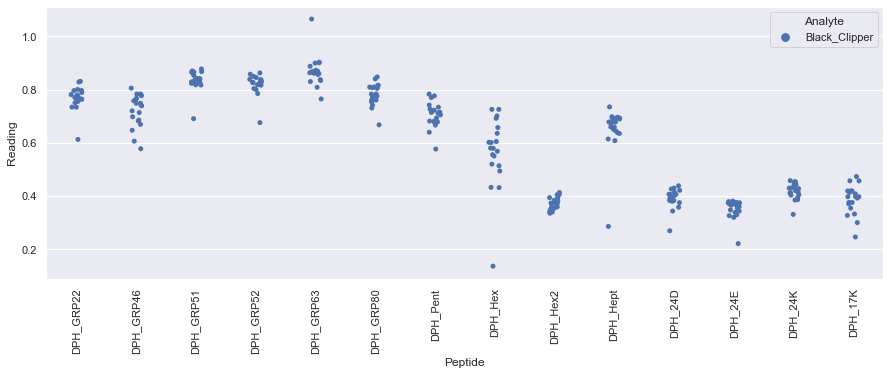

Drawing scatter plot of data spread for Black_Diplomat_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

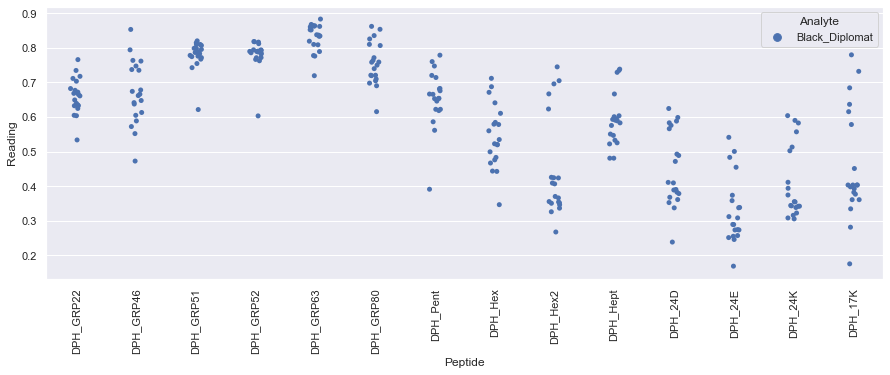

Drawing scatter plot of data spread for Black_Dragonfly_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

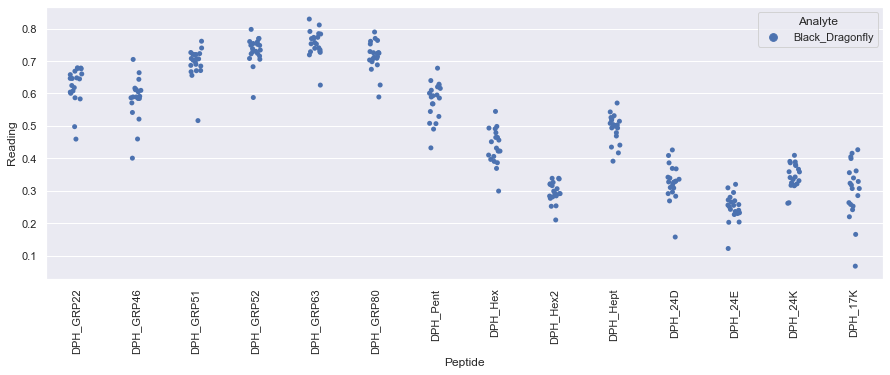

Drawing scatter plot of data spread for Black_Pgtips_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

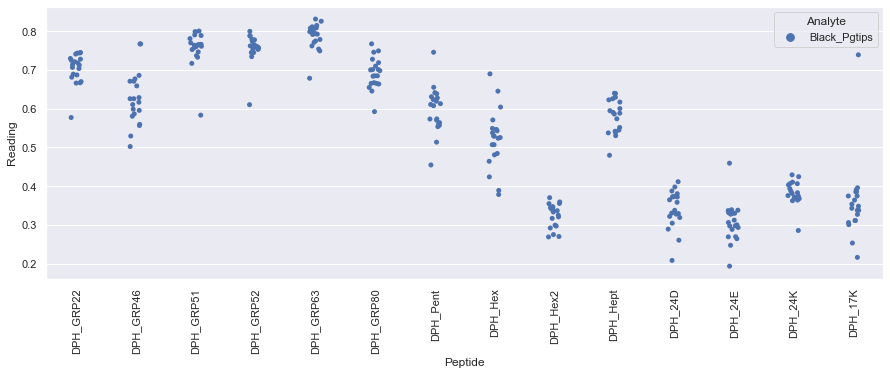

Drawing scatter plot of data spread for Black_Pukka_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

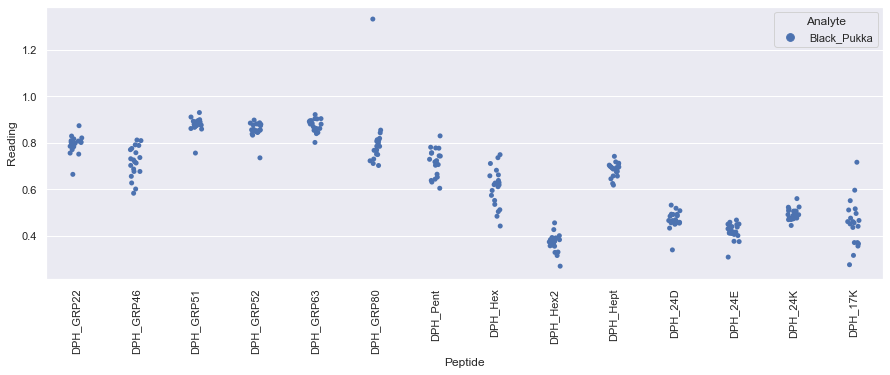

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

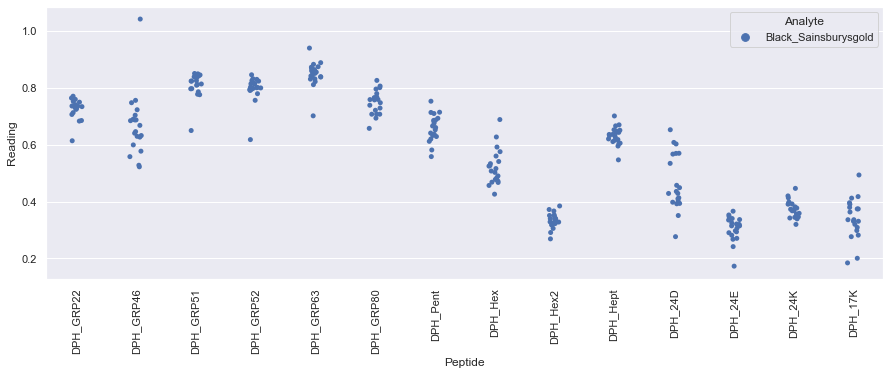

Drawing scatter plot of data spread for Black_Tesco_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

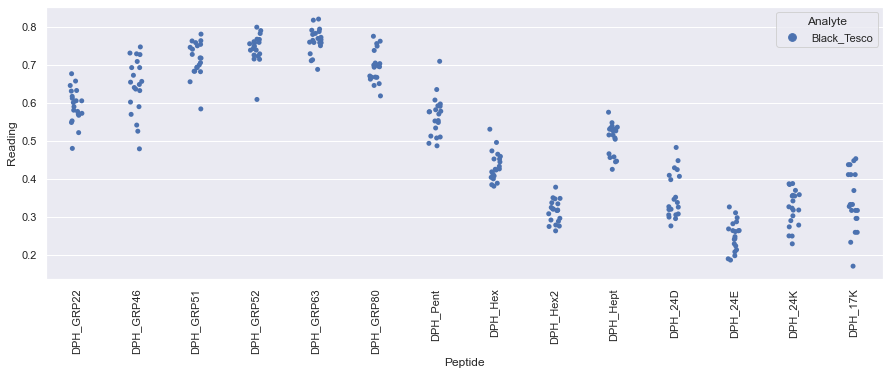

Drawing scatter plot of data spread for Black_Tetley_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

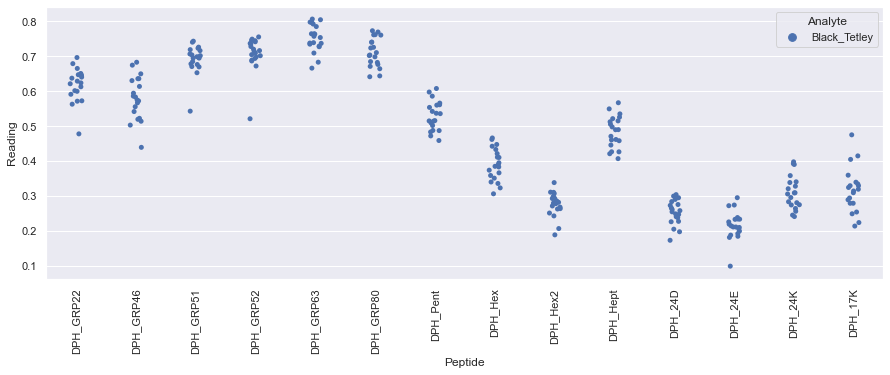

Drawing scatter plot of data spread for Black_Twinings_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

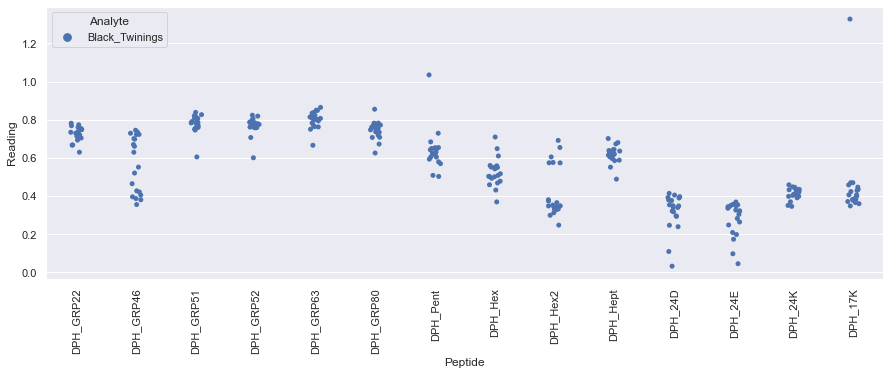

Drawing scatter plot of data spread for Black_Yorkshire_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

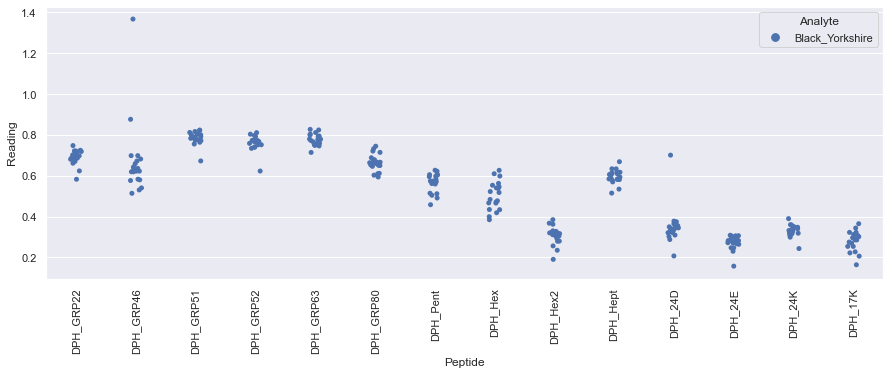

Drawing scatter plot of data spread for Green_Clipper_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

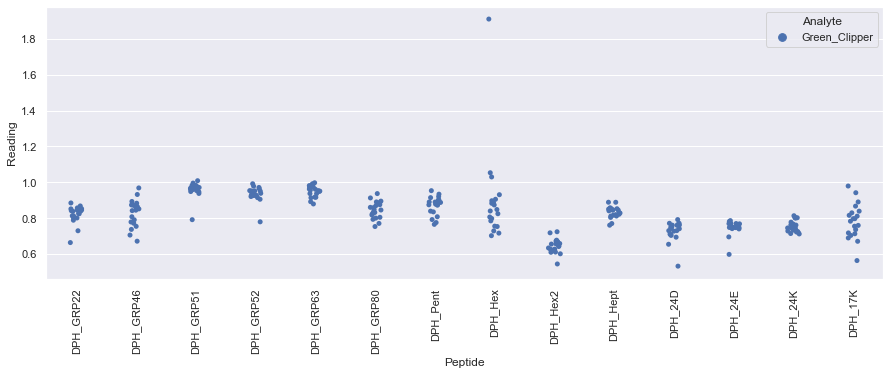

Drawing scatter plot of data spread for Green_Diplomat_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

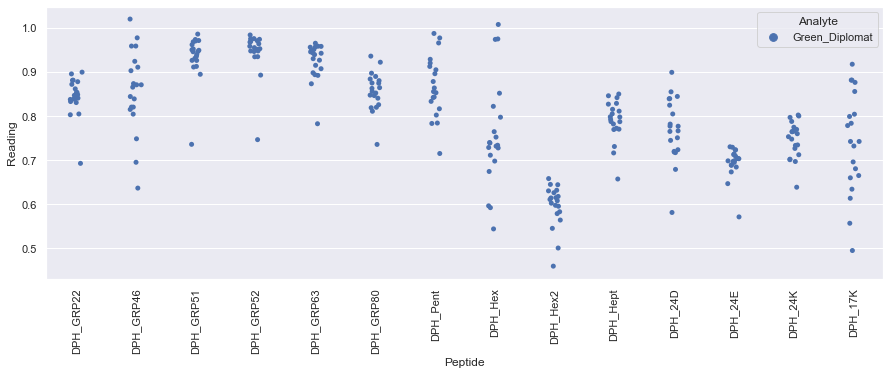

Drawing scatter plot of data spread for Green_Doubledragon_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

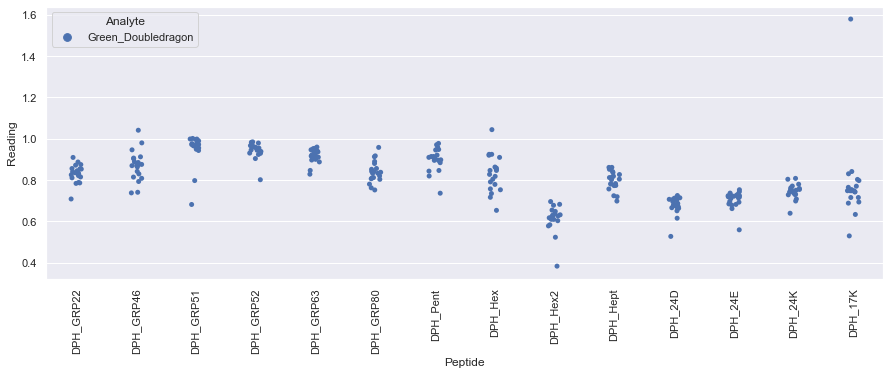

Drawing scatter plot of data spread for Green_Dragonfly_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

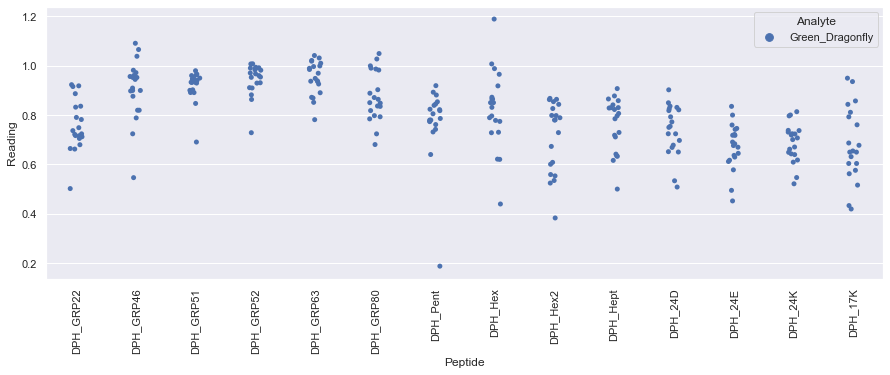

Drawing scatter plot of data spread for Green_Handb_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

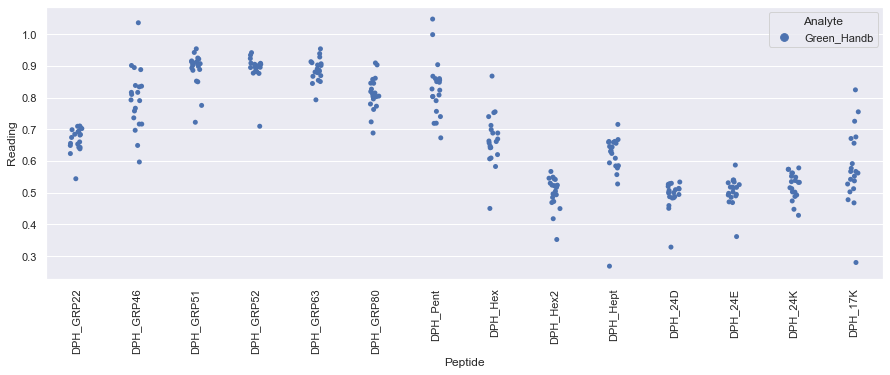

Drawing scatter plot of data spread for Green_Joes_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

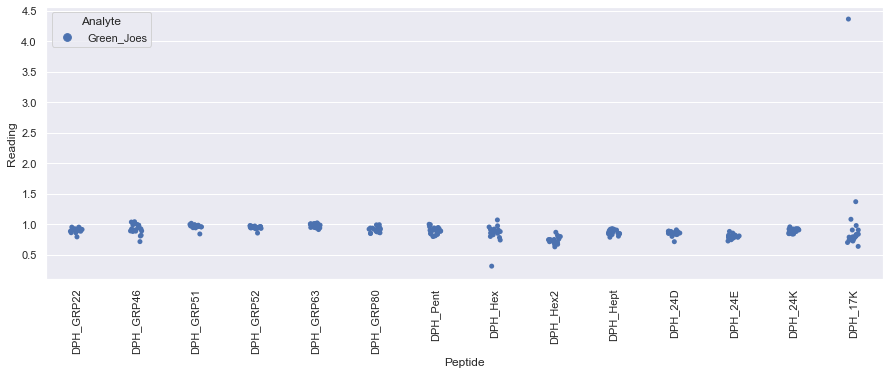

Drawing scatter plot of data spread for Green_Qi_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

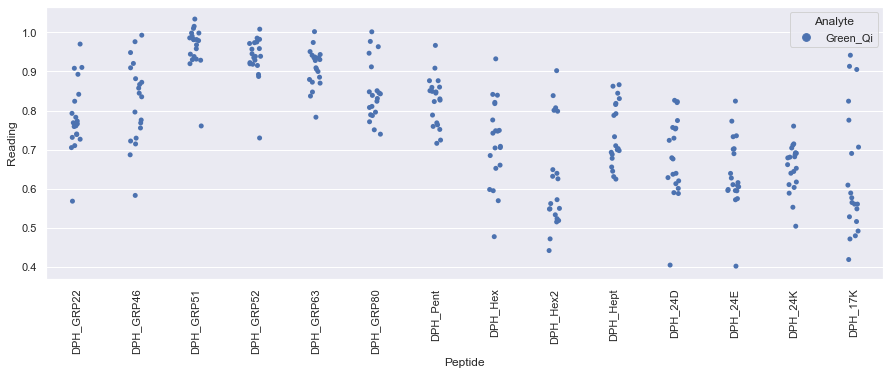

Drawing scatter plot of data spread for Green_Sainsburys_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

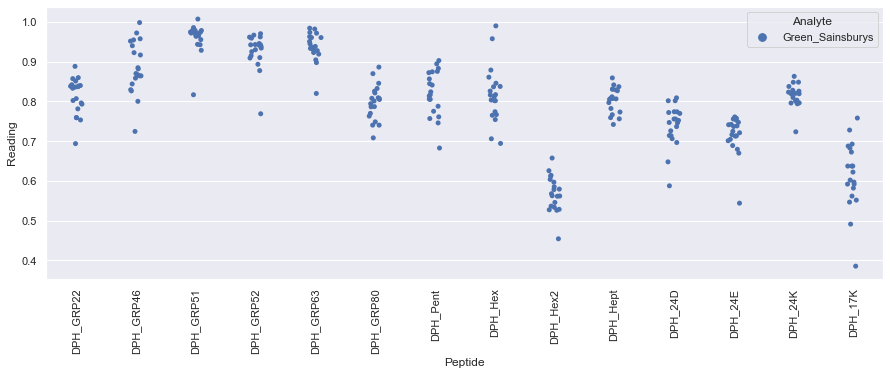

Drawing scatter plot of data spread for Green_Tetley_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

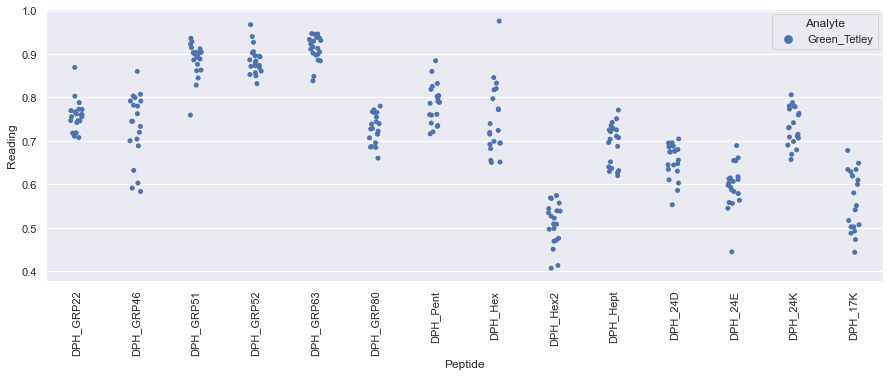

Drawing scatter plot of data spread for Green_Twinings_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

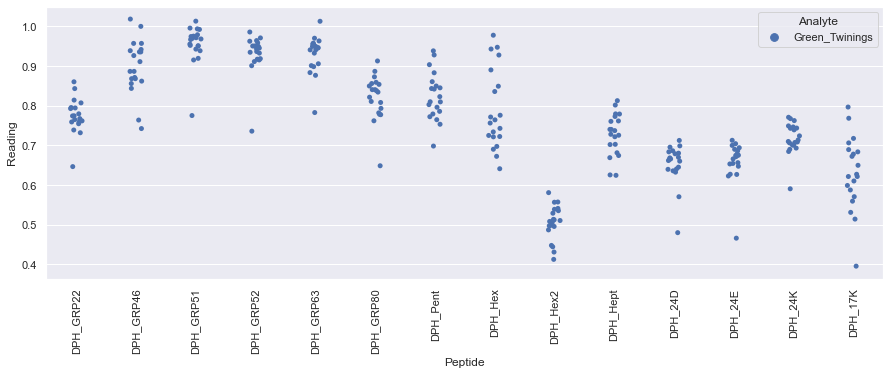

Drawing scatter plot of data spread for Grey_Asda_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

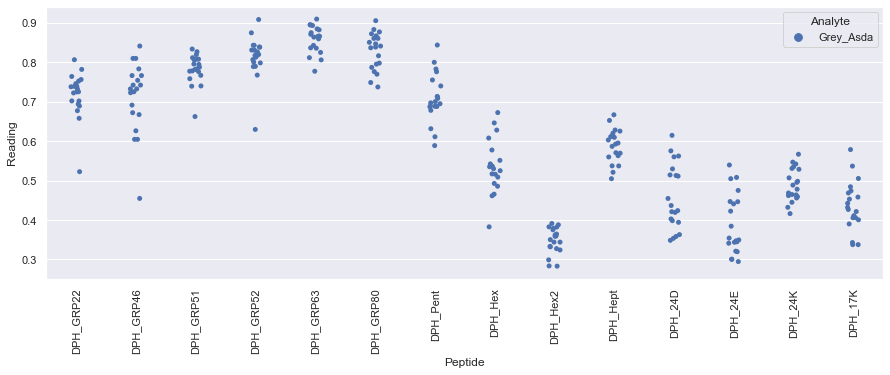

Drawing scatter plot of data spread for Grey_Clipper_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

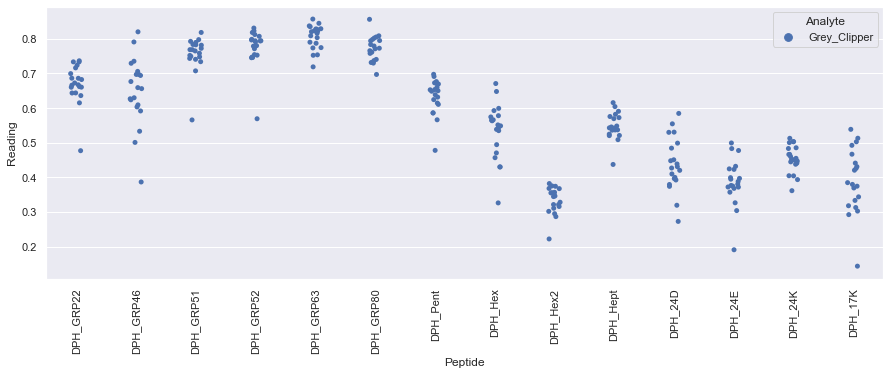

Drawing scatter plot of data spread for Grey_Coop_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

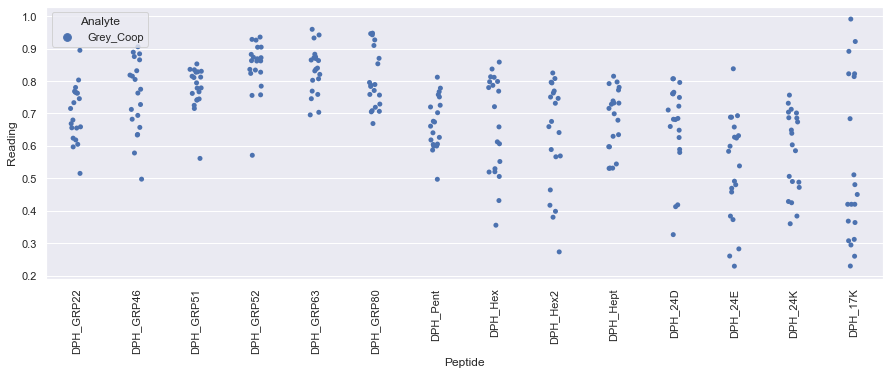

Drawing scatter plot of data spread for Grey_Devonshire_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

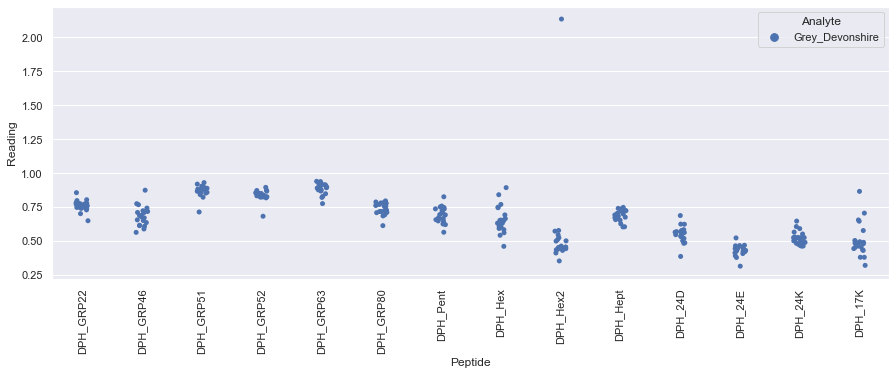

Drawing scatter plot of data spread for Grey_Diplomat_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

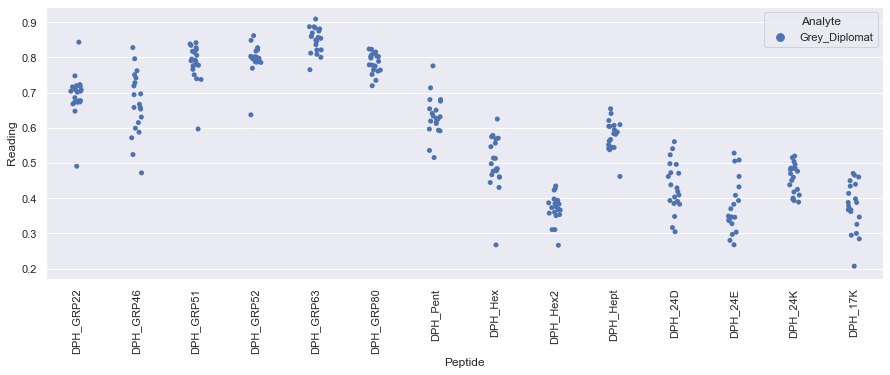

Drawing scatter plot of data spread for Grey_Joes_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

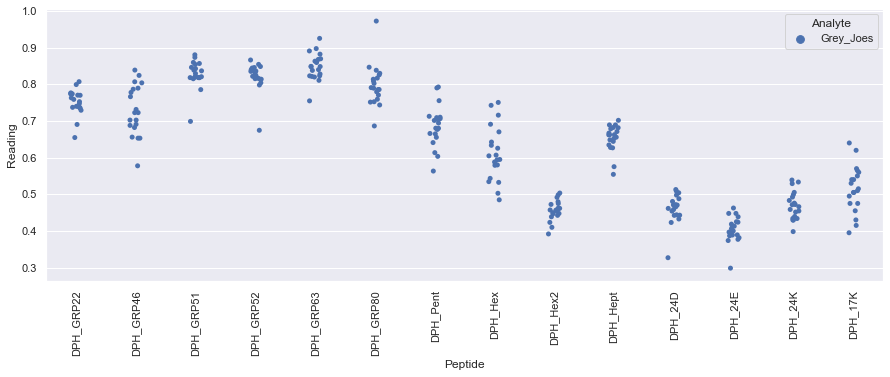

Drawing scatter plot of data spread for Grey_Mands_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

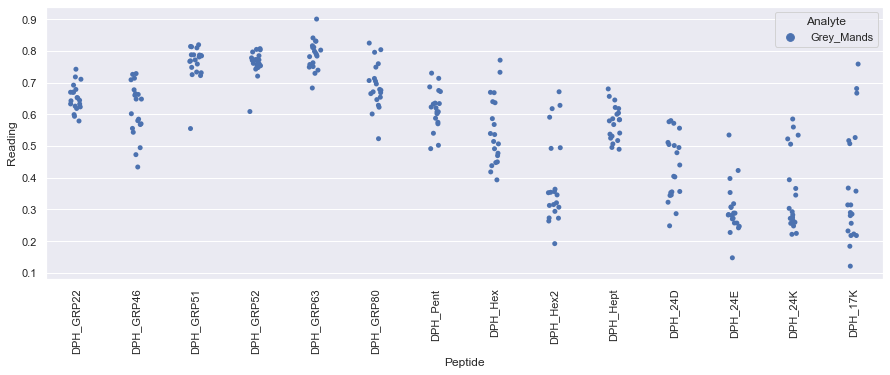

Drawing scatter plot of data spread for Grey_Pukka_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

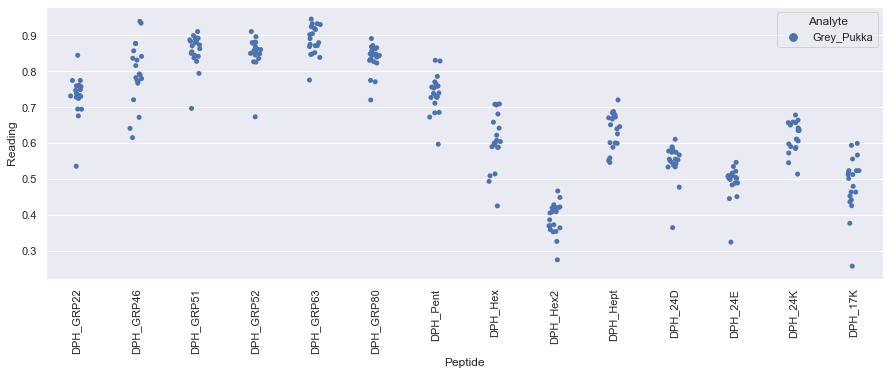

Drawing scatter plot of data spread for Grey_Tesco_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

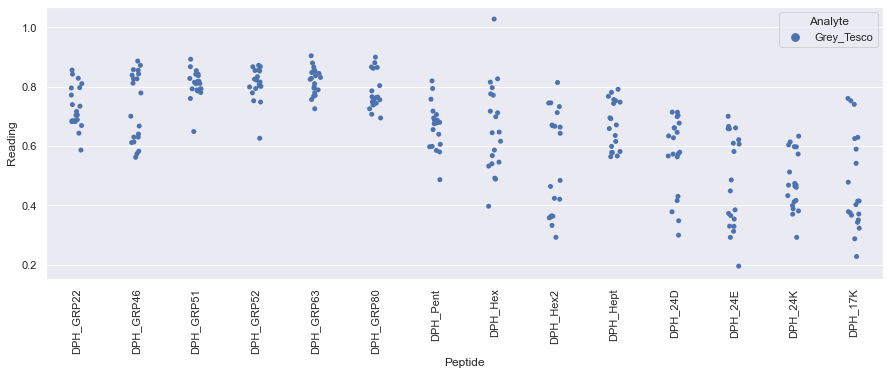

Drawing scatter plot of data spread for Grey_Twinings_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

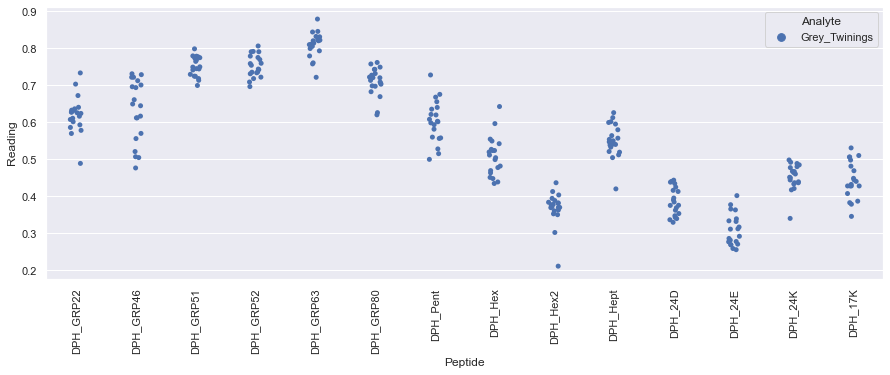

Drawing scatter plot of data spread for Black_Clipper_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

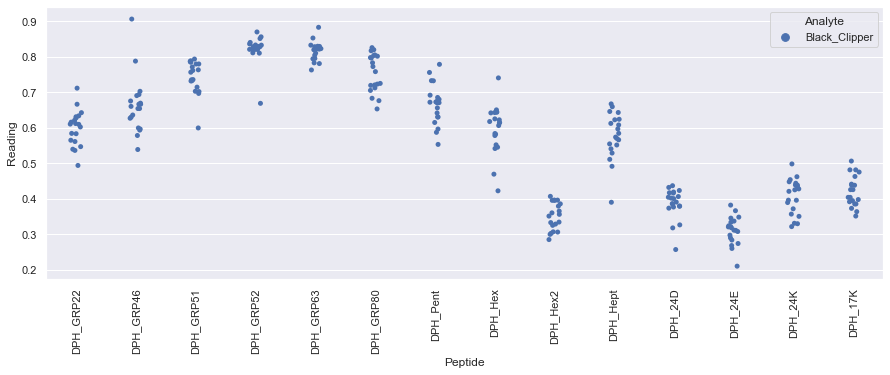

Drawing scatter plot of data spread for Black_Diplomat_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

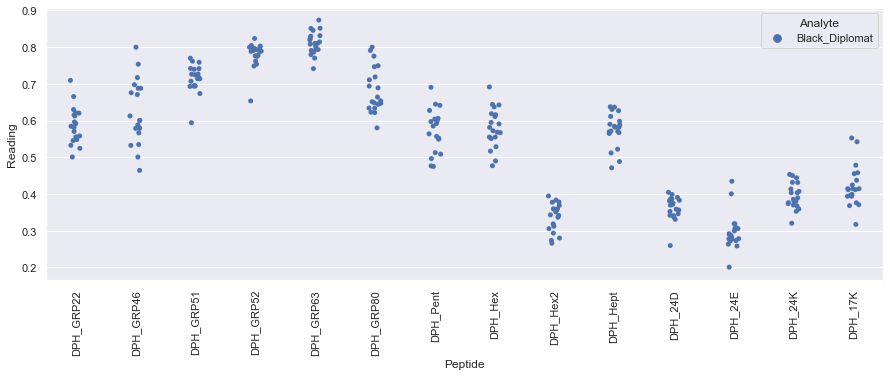

Drawing scatter plot of data spread for Black_Dragonfly_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

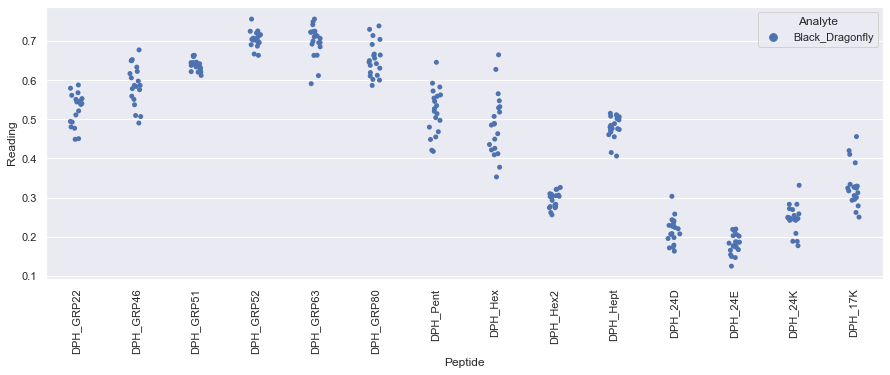

Drawing scatter plot of data spread for Black_Pgtips_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

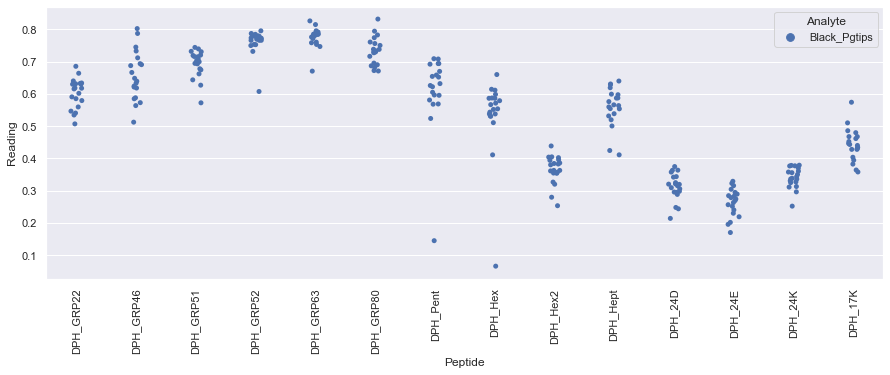

Drawing scatter plot of data spread for Black_Pukka_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

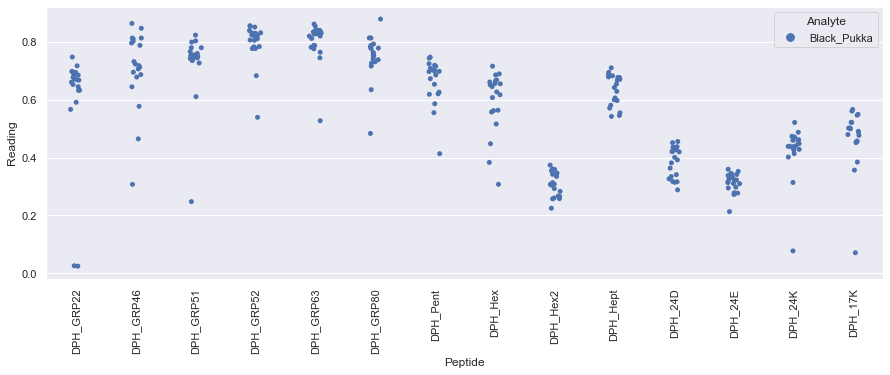

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

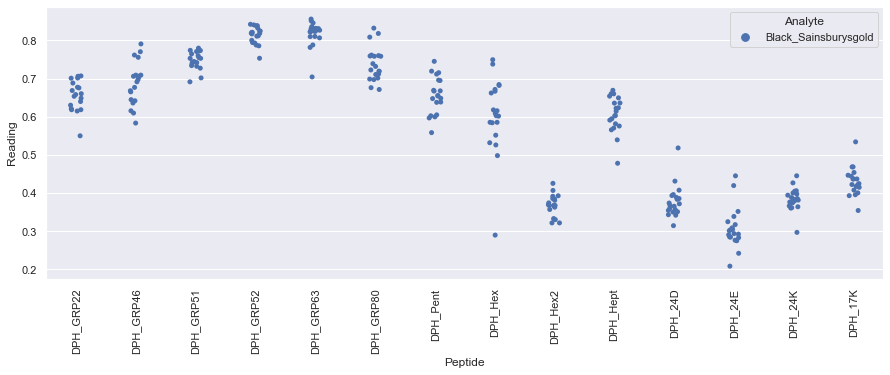

Drawing scatter plot of data spread for Black_Tesco_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

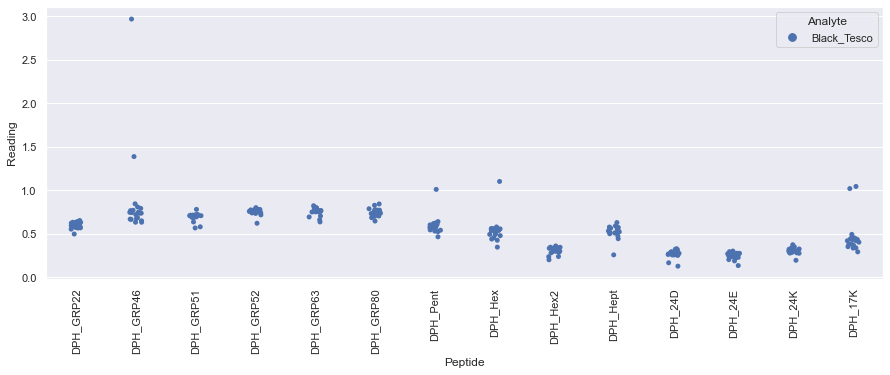

Drawing scatter plot of data spread for Black_Tetley_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

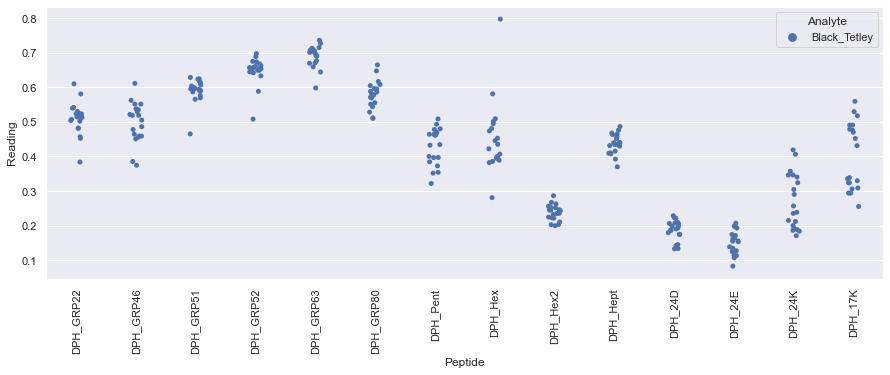

Drawing scatter plot of data spread for Black_Twinings_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

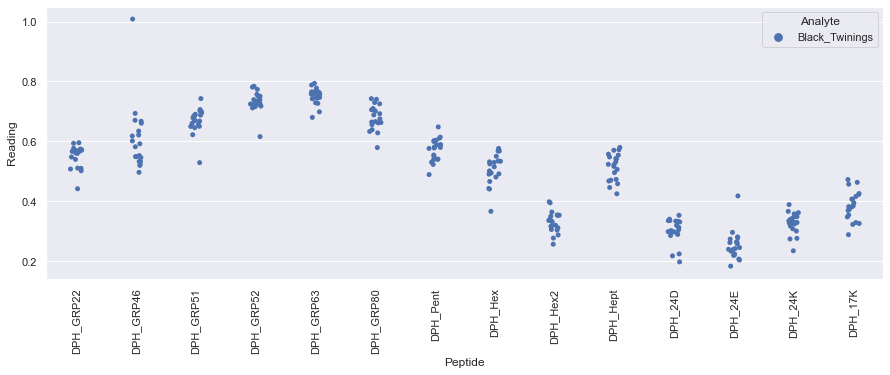

Drawing scatter plot of data spread for Black_Yorkshire_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

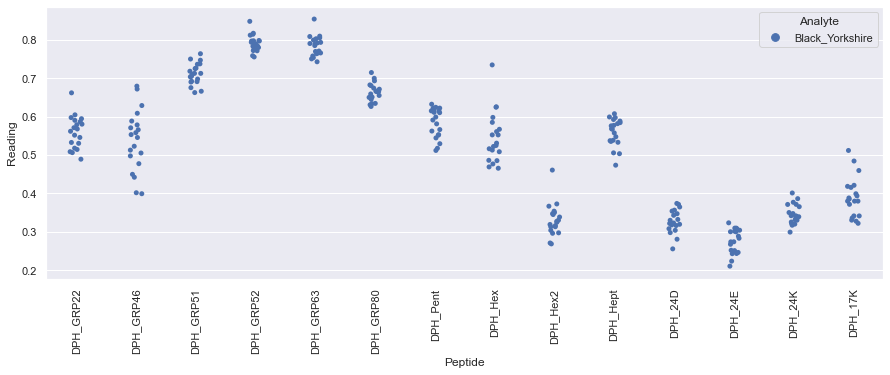

Drawing scatter plot of data spread for Green_Clipper_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

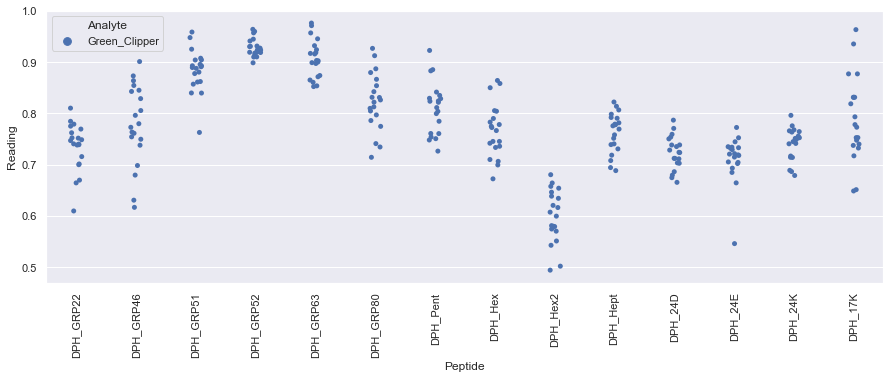

Drawing scatter plot of data spread for Green_Diplomat_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

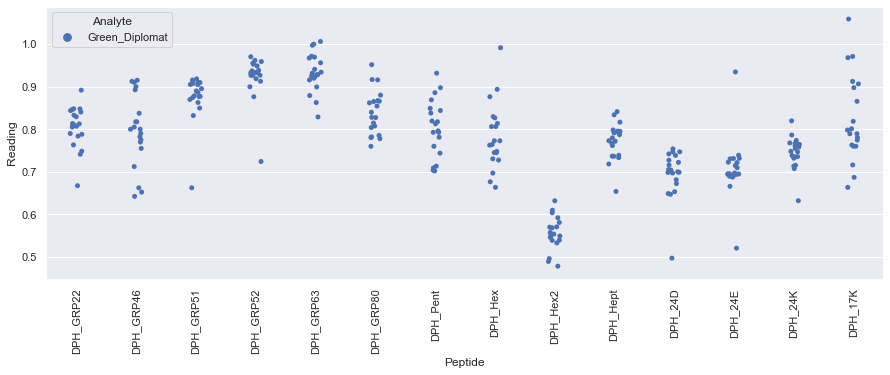

Drawing scatter plot of data spread for Green_Doubledragon_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

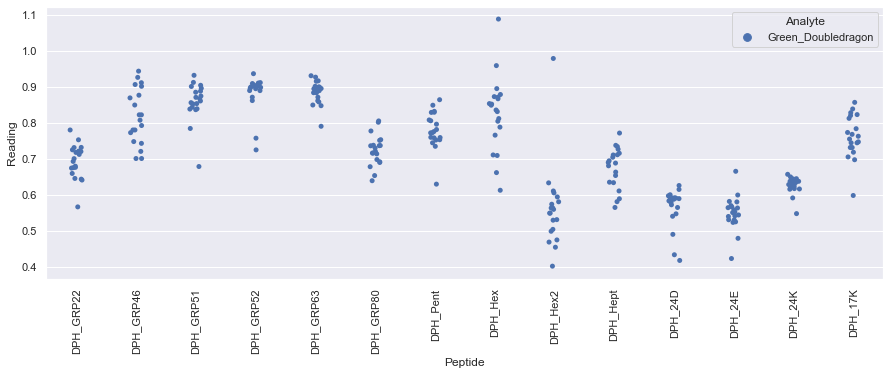

Drawing scatter plot of data spread for Green_Dragonfly_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

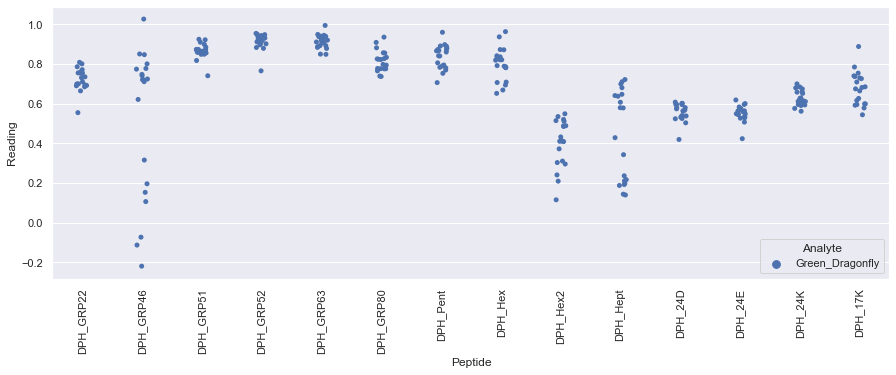

Drawing scatter plot of data spread for Green_Handb_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

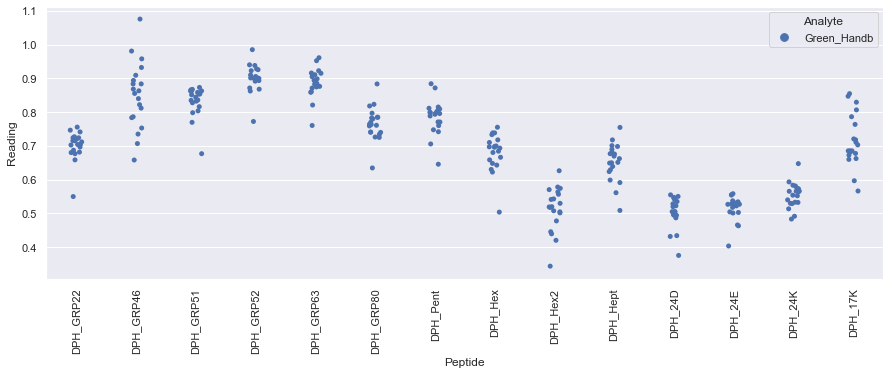

Drawing scatter plot of data spread for Green_Joes_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

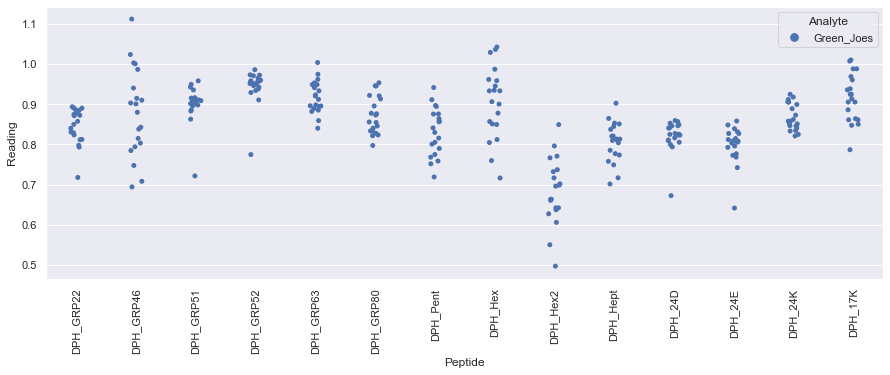

Drawing scatter plot of data spread for Green_Qi_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

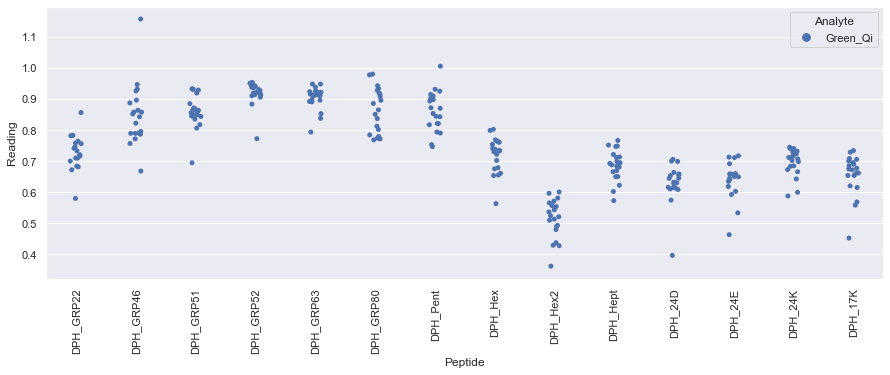

Drawing scatter plot of data spread for Green_Sainsburys_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

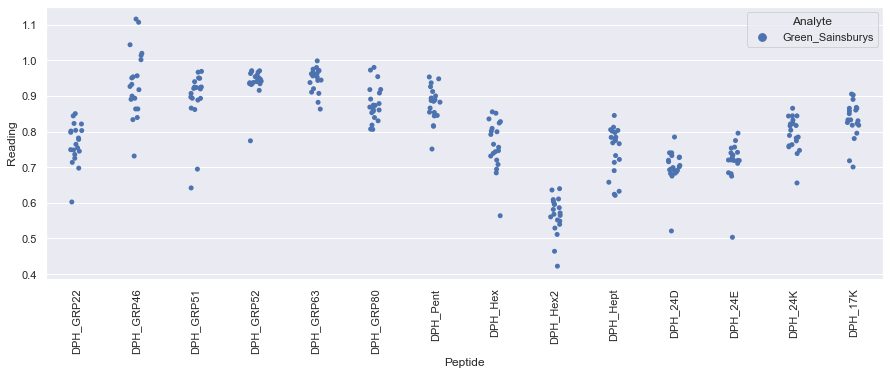

Drawing scatter plot of data spread for Green_Tetley_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

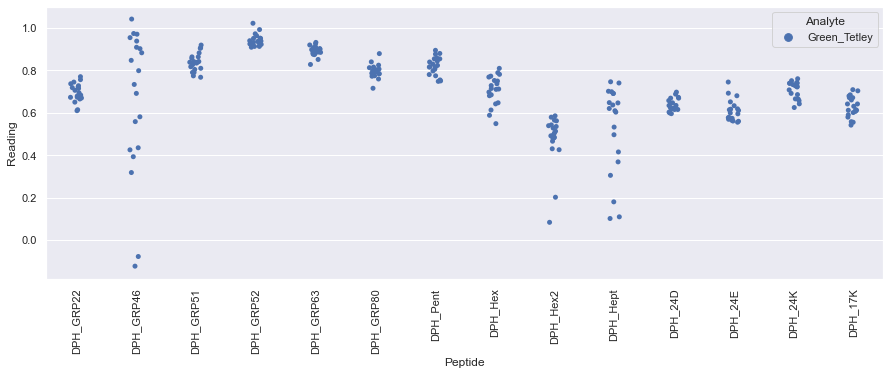

Drawing scatter plot of data spread for Green_Twinings_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

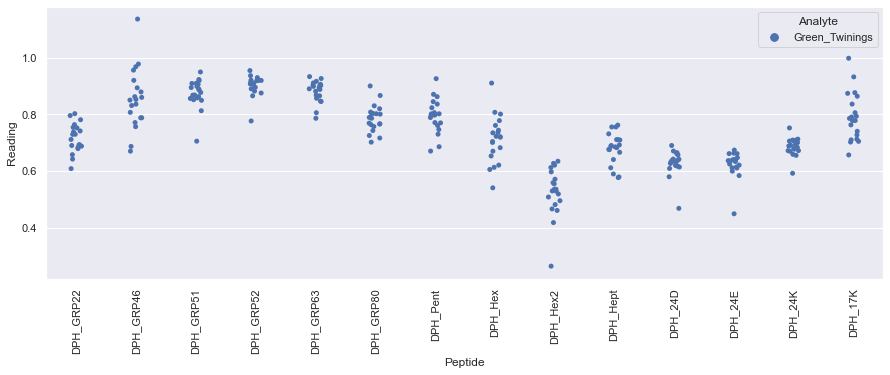

Drawing scatter plot of data spread for Grey_Asda_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

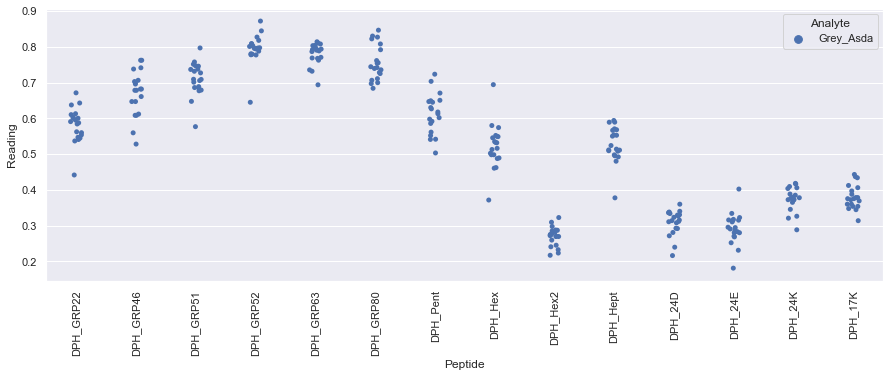

Drawing scatter plot of data spread for Grey_Clipper_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

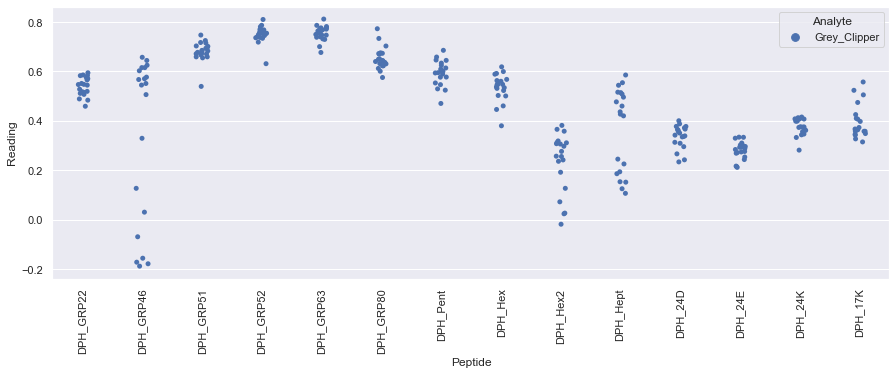

Drawing scatter plot of data spread for Grey_Coop_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

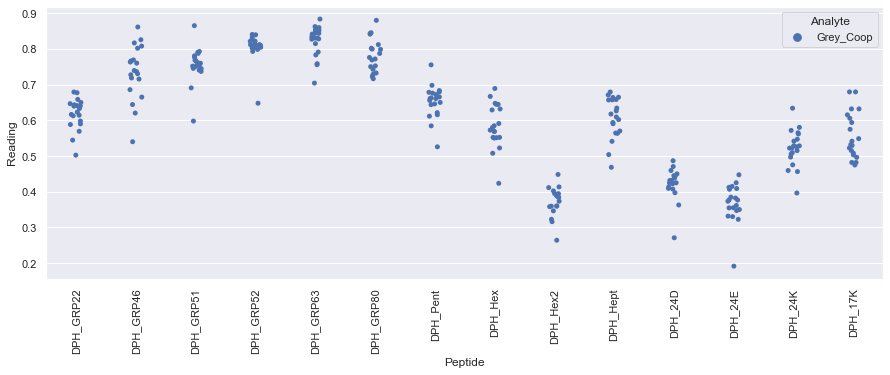

Drawing scatter plot of data spread for Grey_Devonshire_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

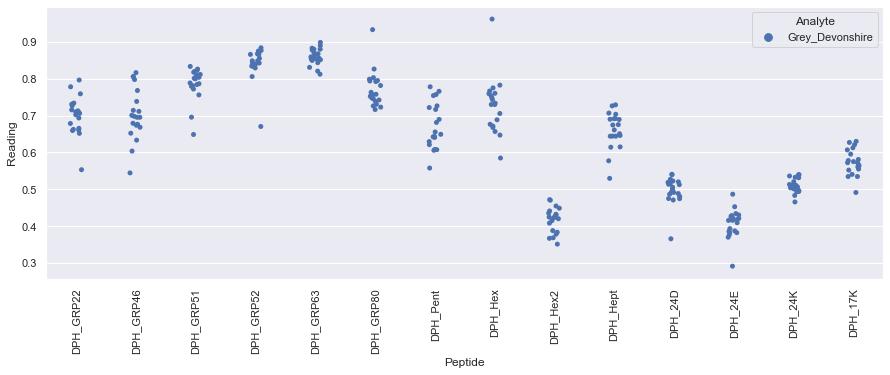

Drawing scatter plot of data spread for Grey_Diplomat_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

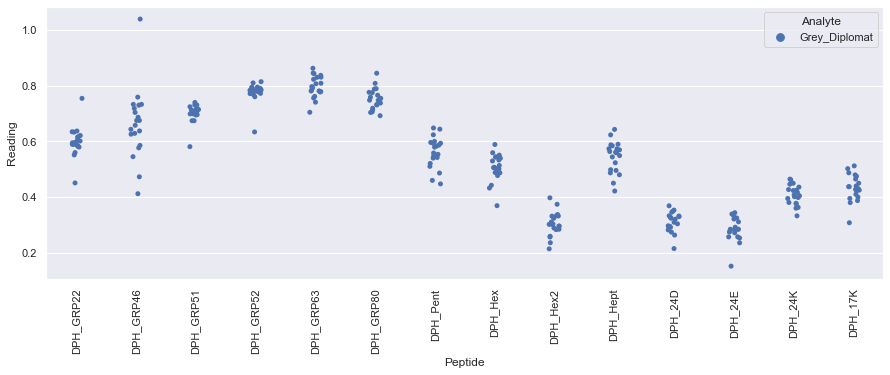

Drawing scatter plot of data spread for Grey_Joes_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

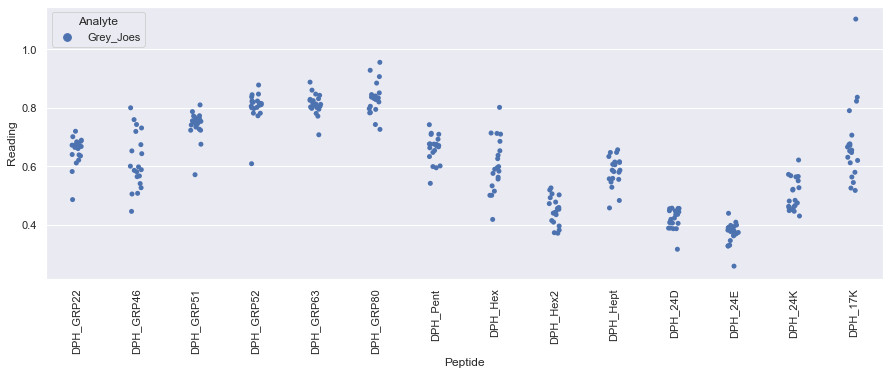

Drawing scatter plot of data spread for Grey_Mands_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

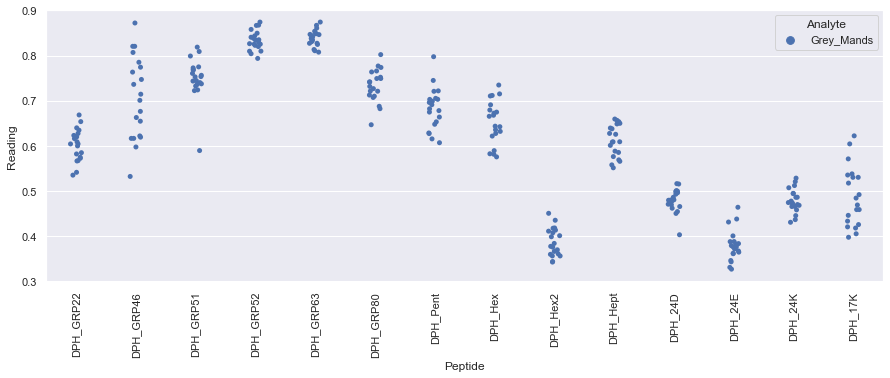

Drawing scatter plot of data spread for Grey_Pukka_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

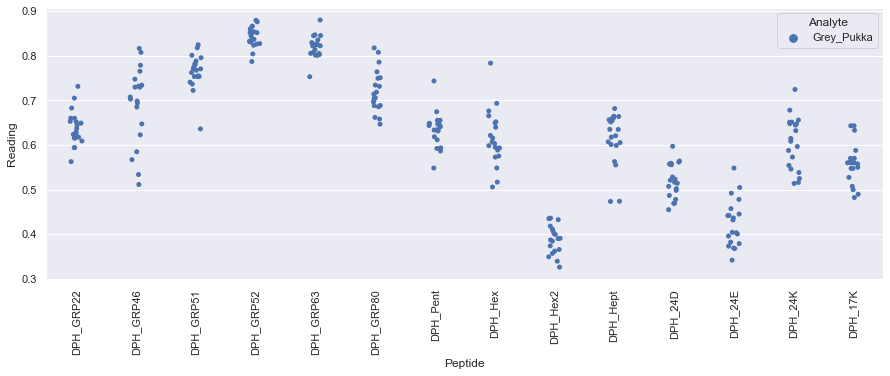

Drawing scatter plot of data spread for Grey_Tesco_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

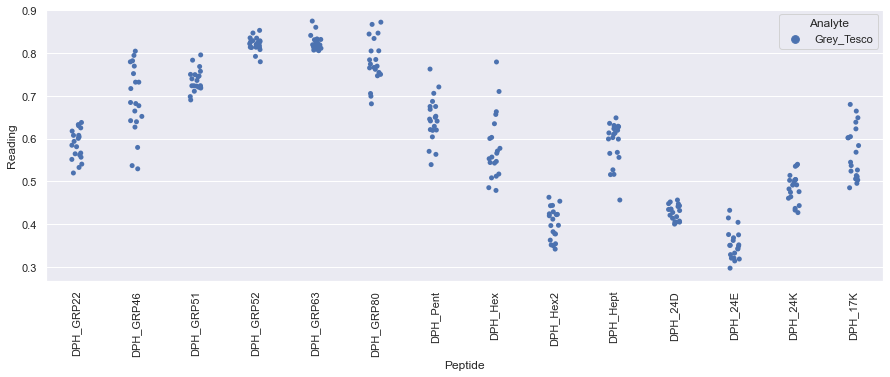

Drawing scatter plot of data spread for Grey_Twinings_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

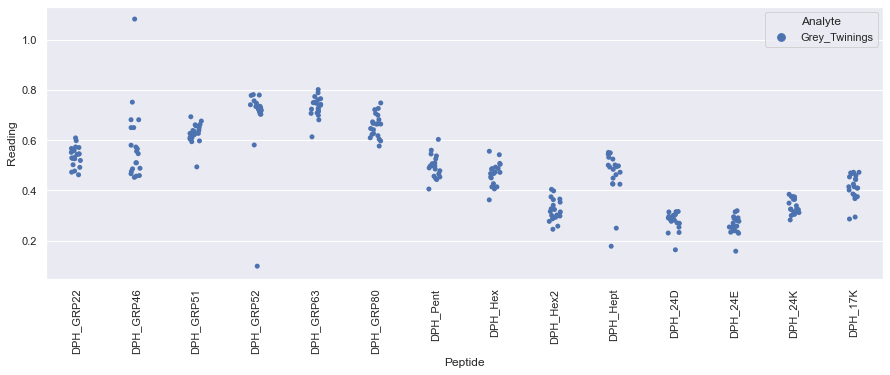

Drawing scatter plot of data spread for Black_Clipper_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

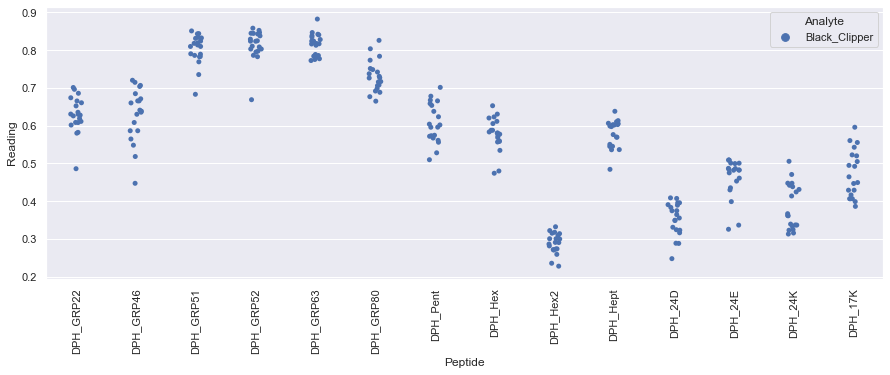

Drawing scatter plot of data spread for Black_Diplomat_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

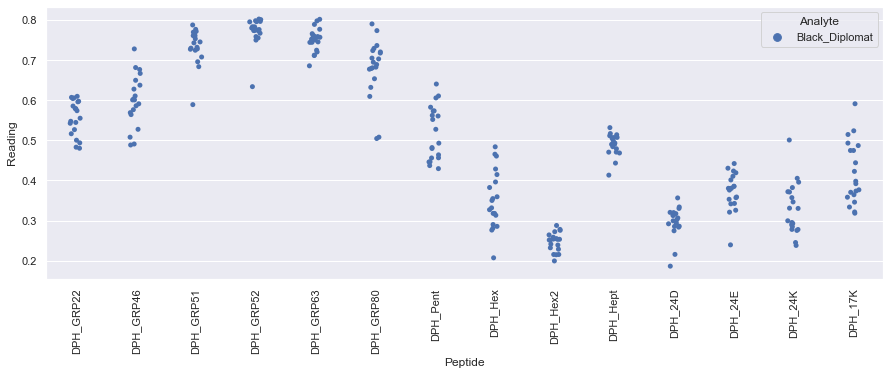

Drawing scatter plot of data spread for Black_Dragonfly_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

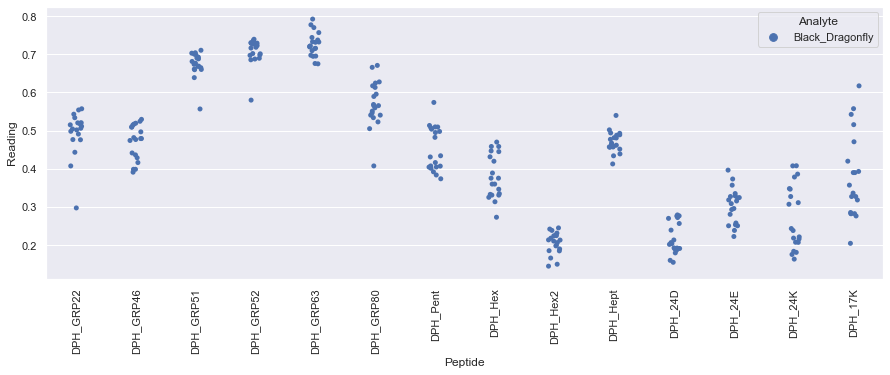

Drawing scatter plot of data spread for Black_Pgtips_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

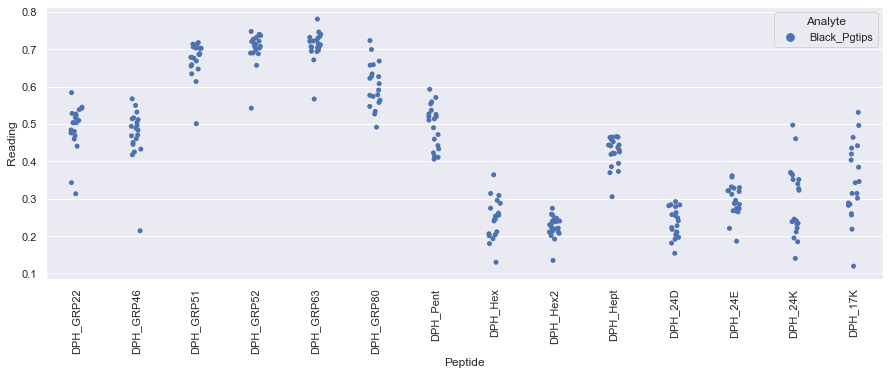

Drawing scatter plot of data spread for Black_Pukka_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

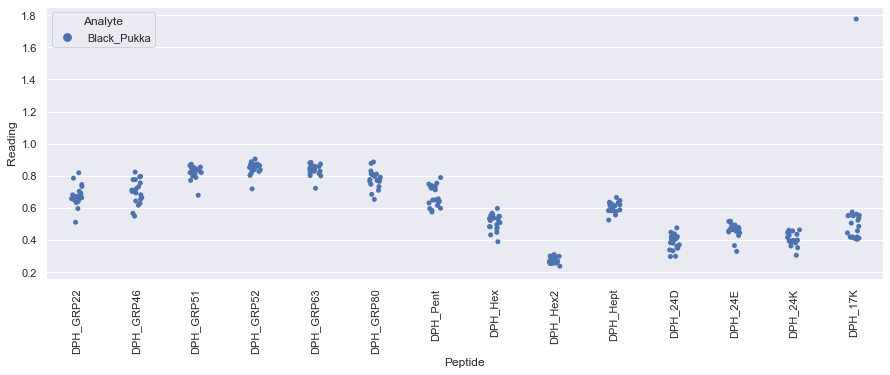

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

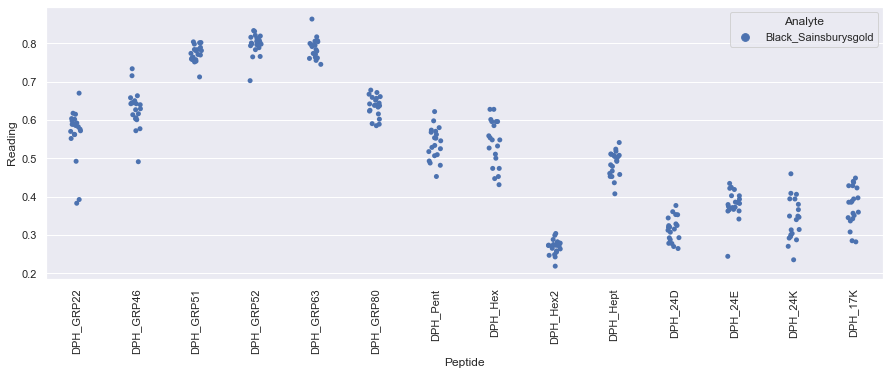

Drawing scatter plot of data spread for Black_Tesco_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

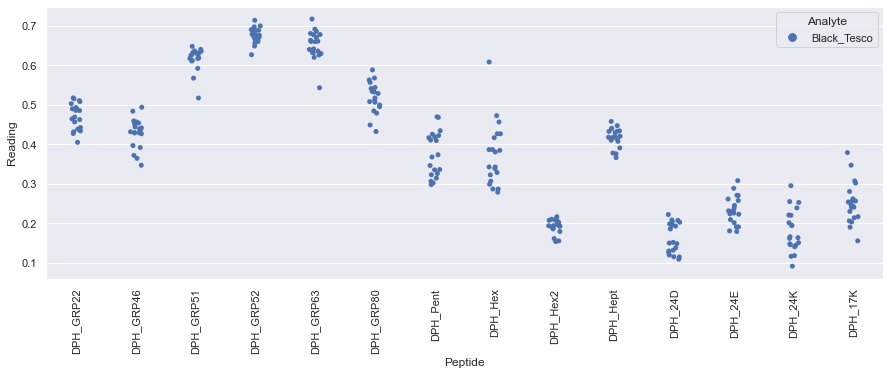

Drawing scatter plot of data spread for Black_Tetley_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

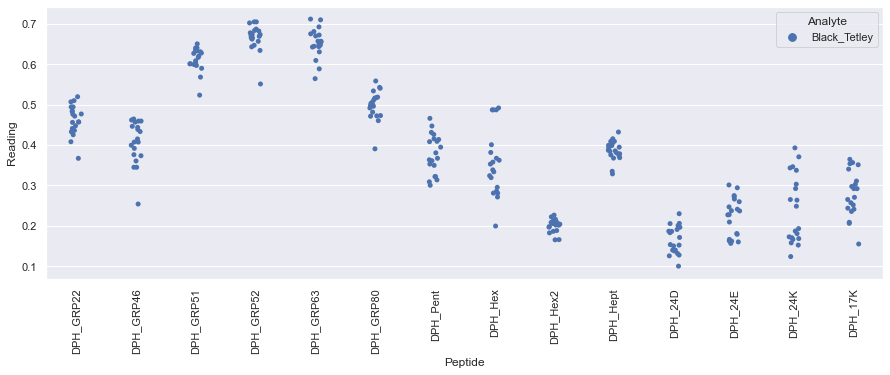

Drawing scatter plot of data spread for Black_Twinings_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

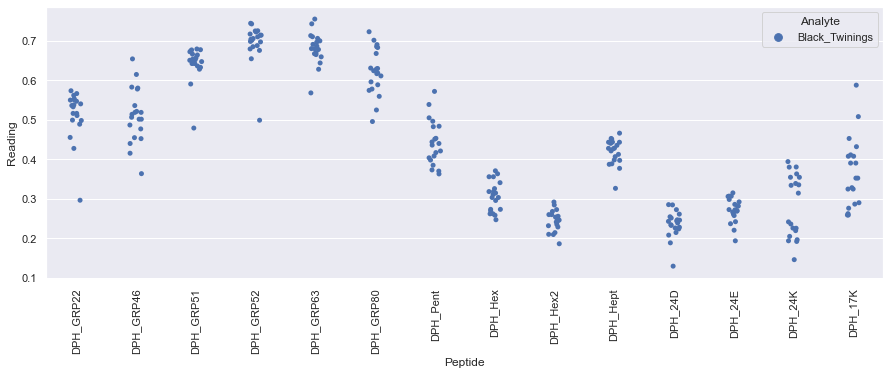

Drawing scatter plot of data spread for Black_Yorkshire_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

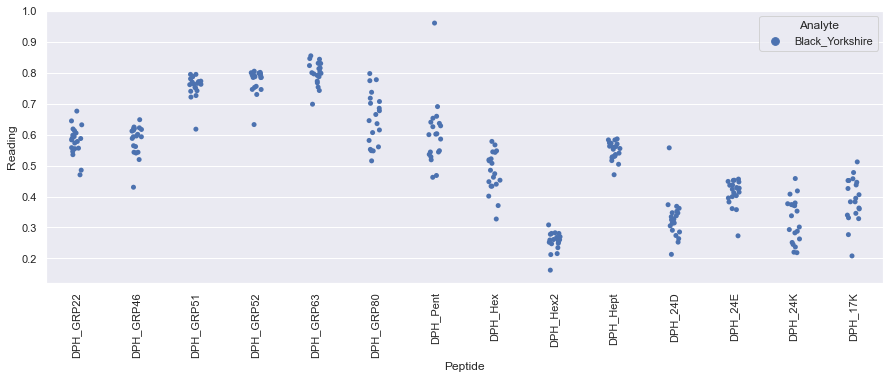

Drawing scatter plot of data spread for Green_Clipper_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

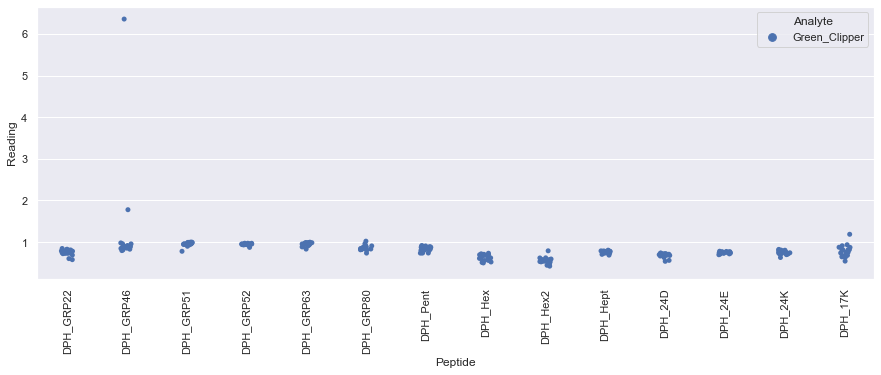

Drawing scatter plot of data spread for Green_Diplomat_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

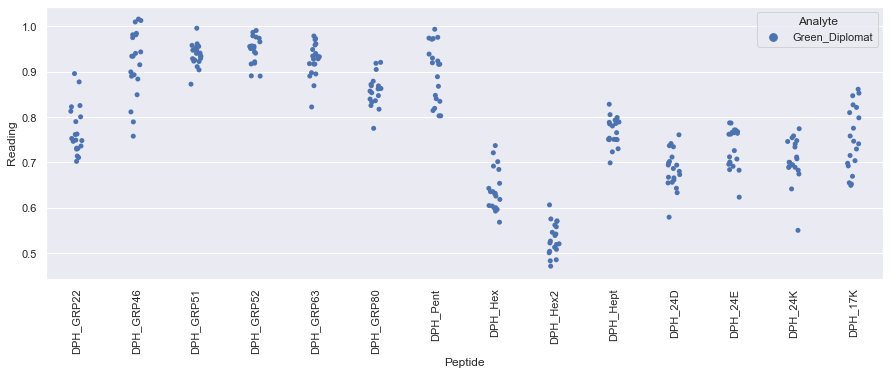

Drawing scatter plot of data spread for Green_Doubledragon_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

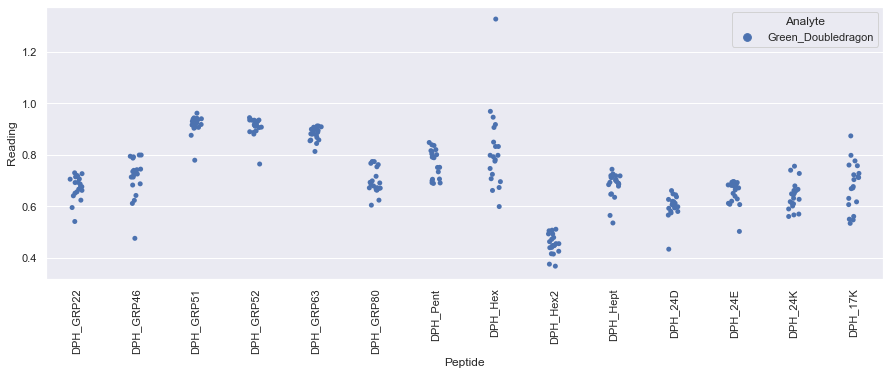

Drawing scatter plot of data spread for Green_Dragonfly_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

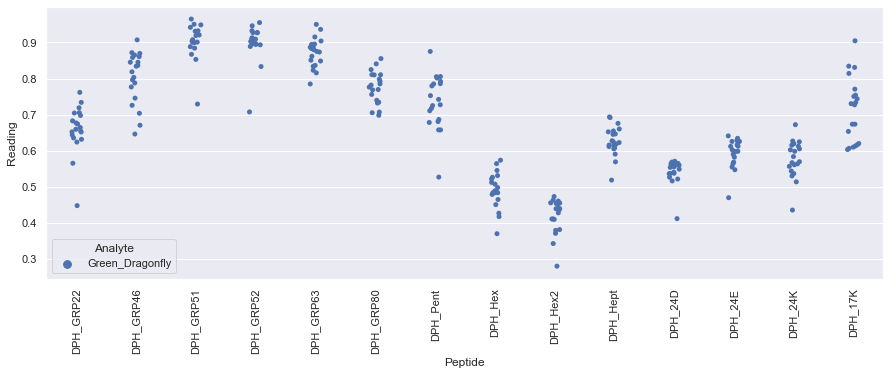

Drawing scatter plot of data spread for Green_Handb_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

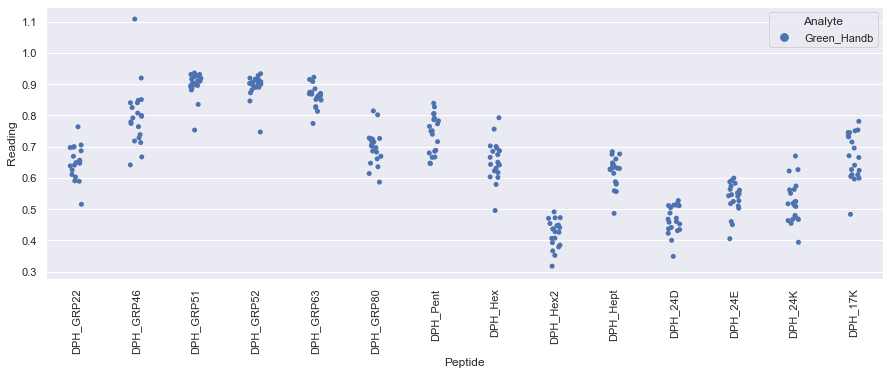

Drawing scatter plot of data spread for Green_Joes_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

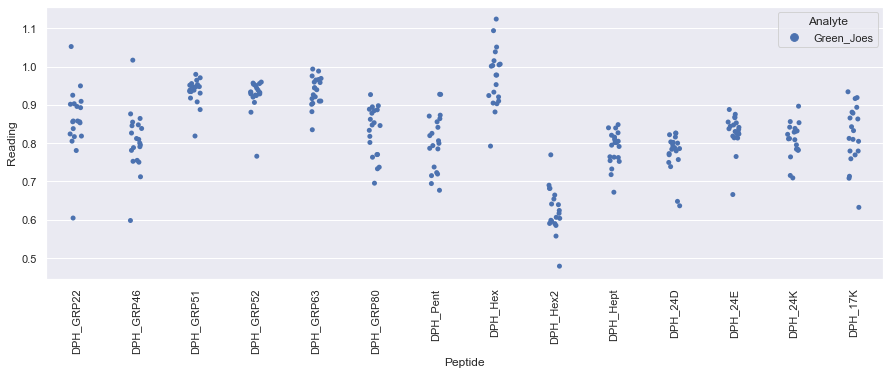

Drawing scatter plot of data spread for Green_Qi_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

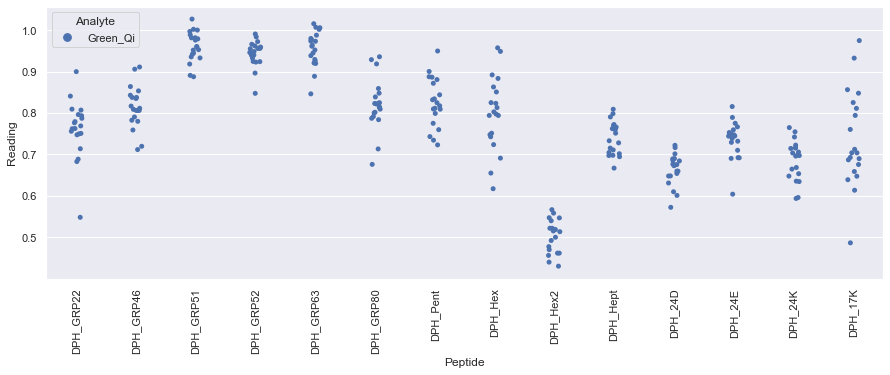

Drawing scatter plot of data spread for Green_Sainsburys_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

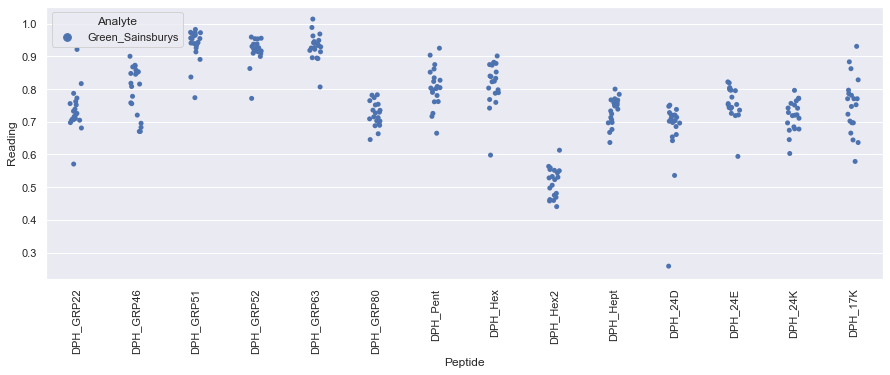

Drawing scatter plot of data spread for Green_Tetley_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

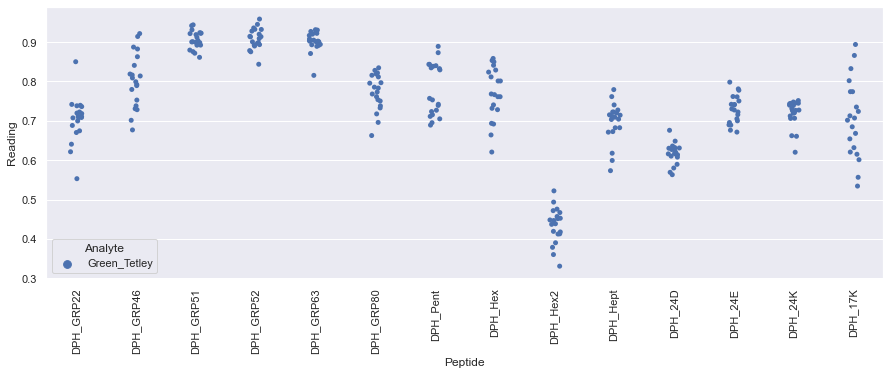

Drawing scatter plot of data spread for Green_Twinings_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

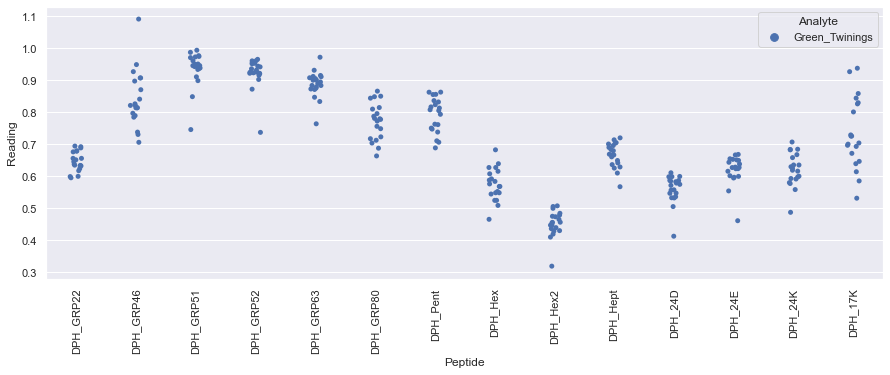

Drawing scatter plot of data spread for Grey_Asda_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

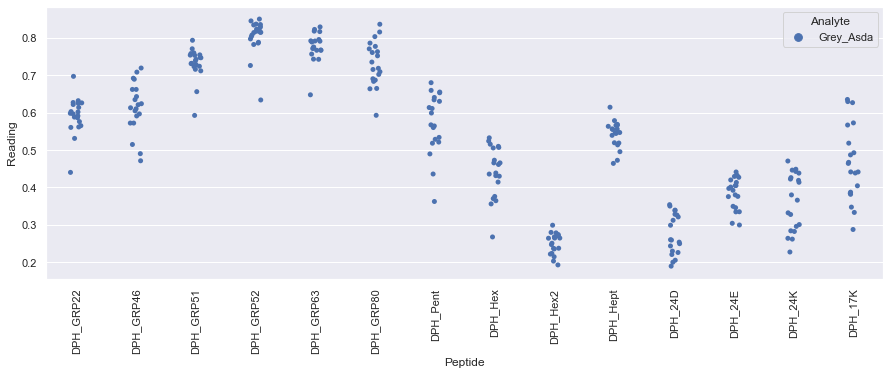

Drawing scatter plot of data spread for Grey_Clipper_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

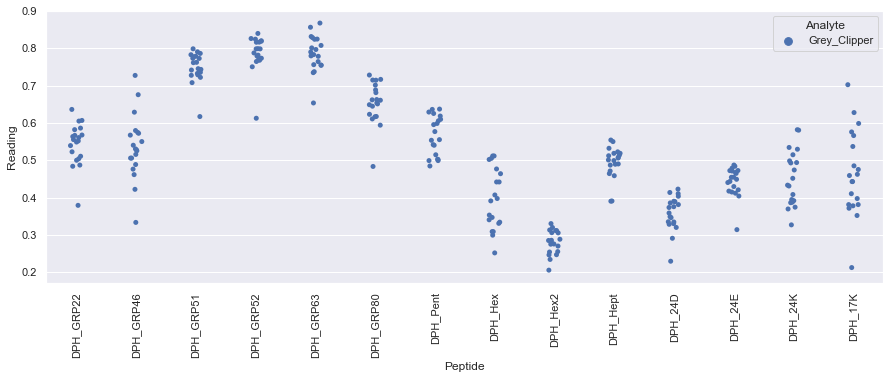

Drawing scatter plot of data spread for Grey_Coop_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

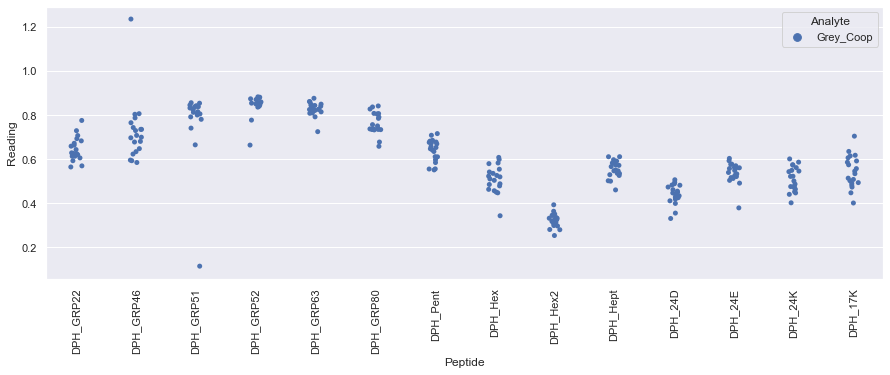

Drawing scatter plot of data spread for Grey_Devonshire_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

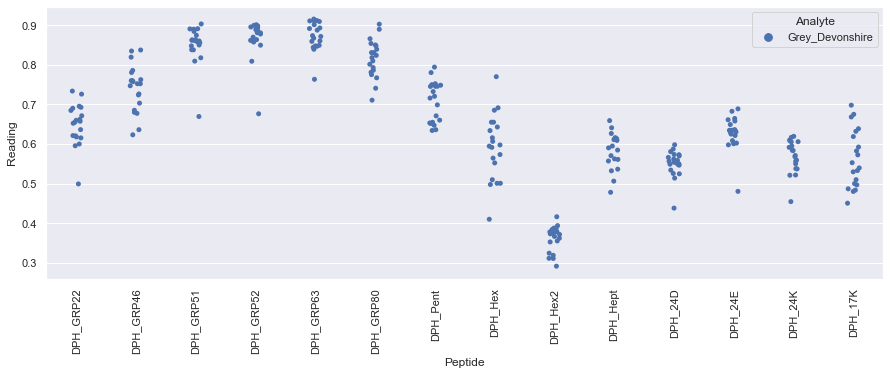

Drawing scatter plot of data spread for Grey_Diplomat_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

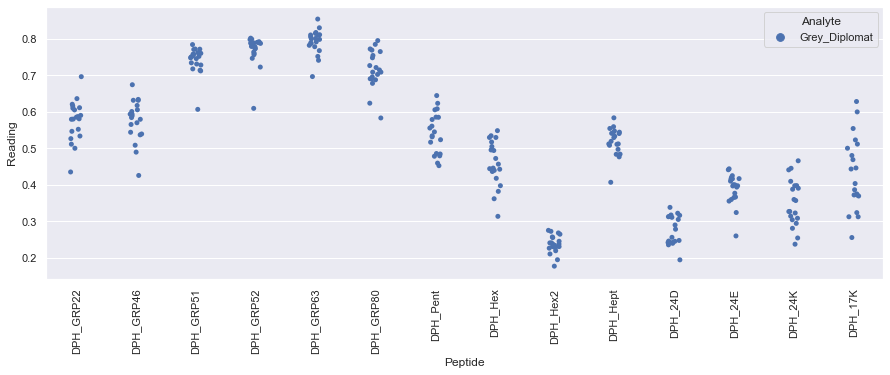

Drawing scatter plot of data spread for Grey_Joes_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

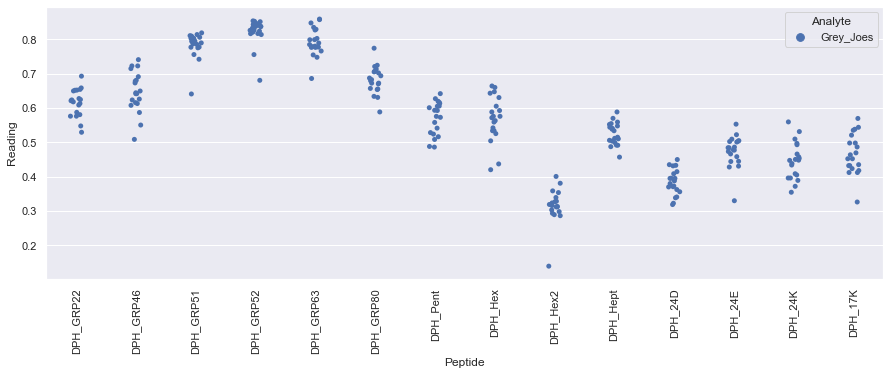

Drawing scatter plot of data spread for Grey_Mands_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

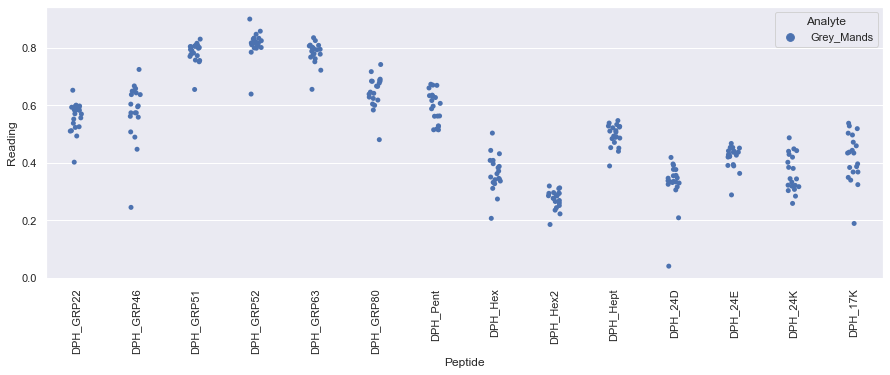

Drawing scatter plot of data spread for Grey_Pukka_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

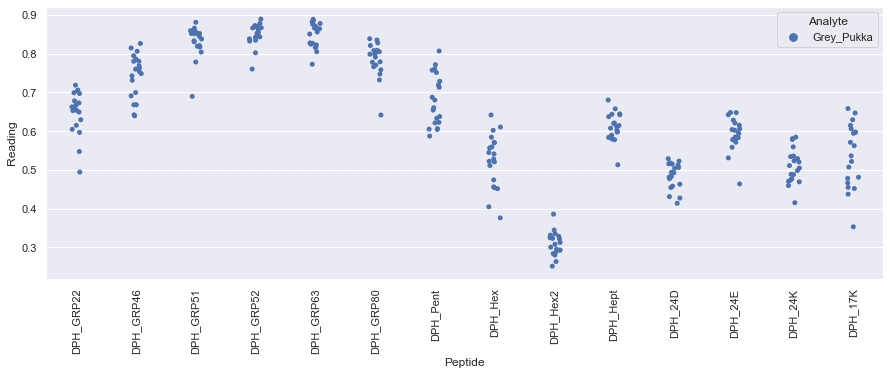

Drawing scatter plot of data spread for Grey_Tesco_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

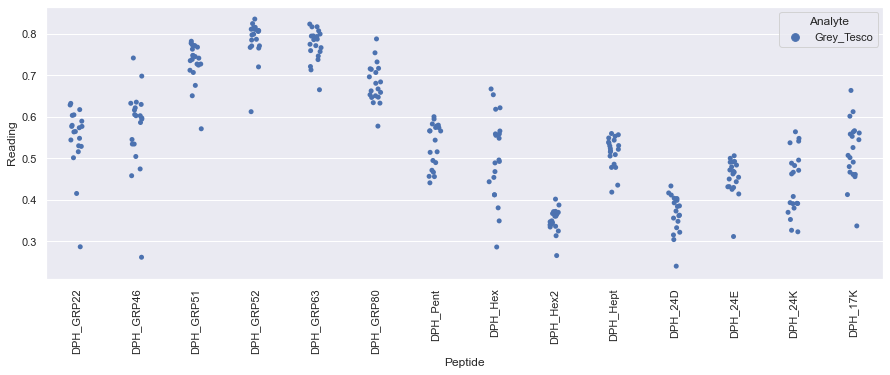

Drawing scatter plot of data spread for Grey_Twinings_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

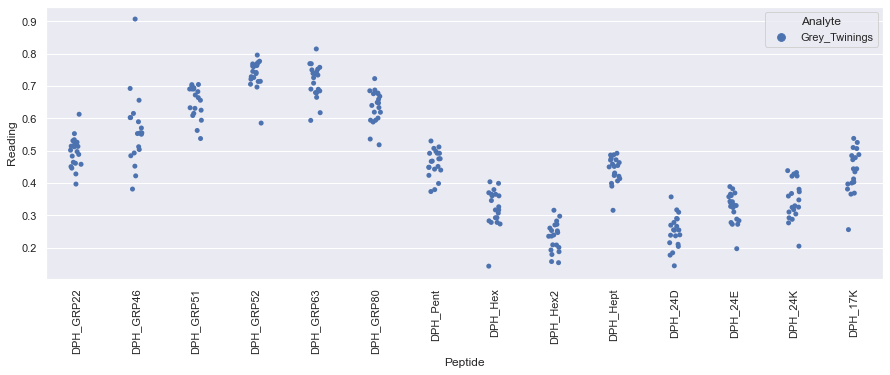

Drawing scatter plot of data spread for Black_Clipper_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

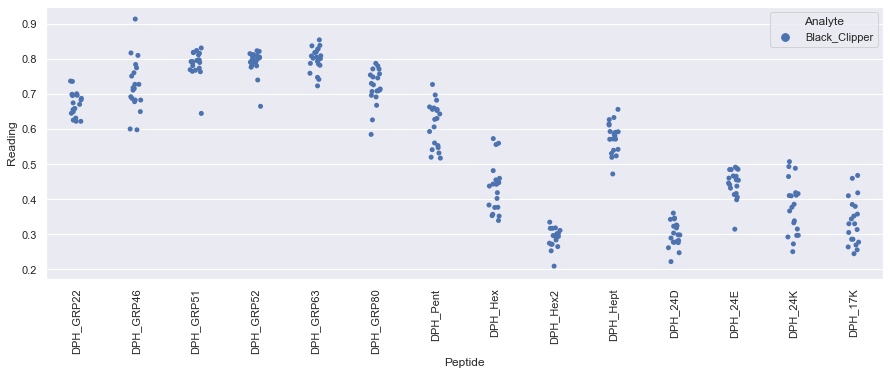

Drawing scatter plot of data spread for Black_Diplomat_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

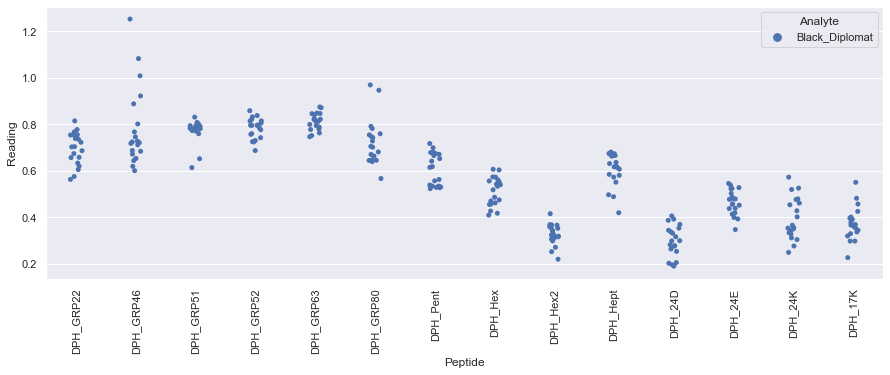

Drawing scatter plot of data spread for Black_Dragonfly_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

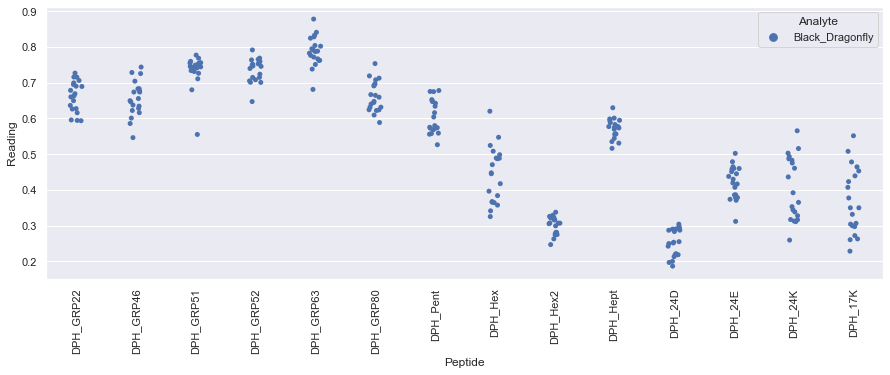

Drawing scatter plot of data spread for Black_Pgtips_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

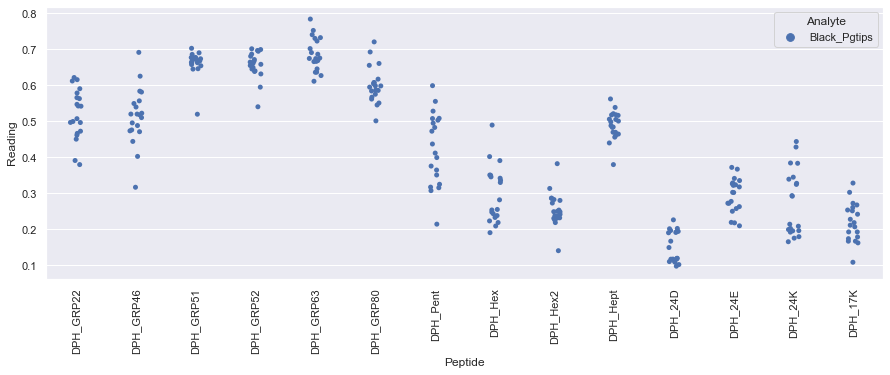

Drawing scatter plot of data spread for Black_Pukka_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

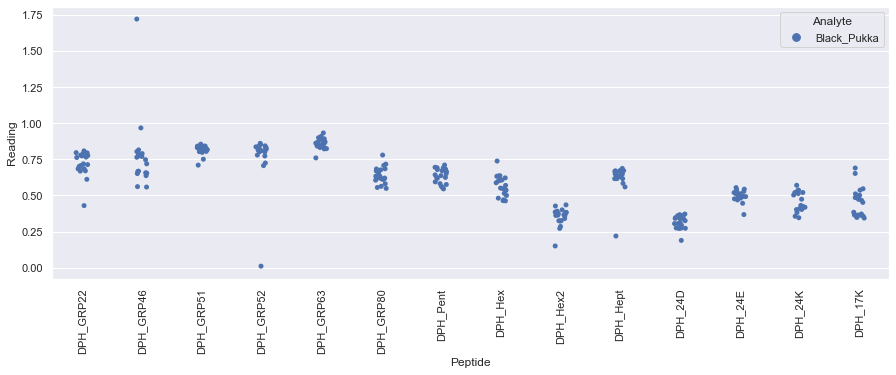

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

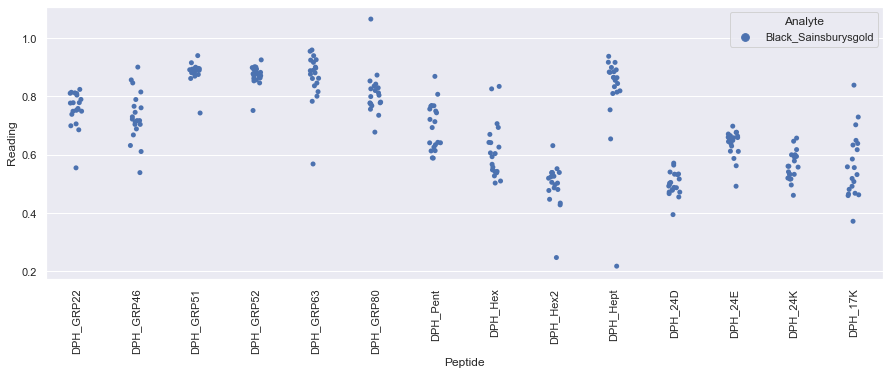

Drawing scatter plot of data spread for Black_Tesco_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

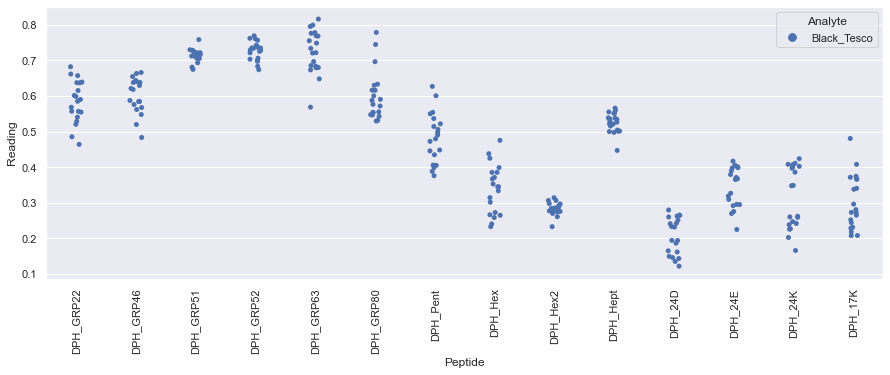

Drawing scatter plot of data spread for Black_Tetley_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

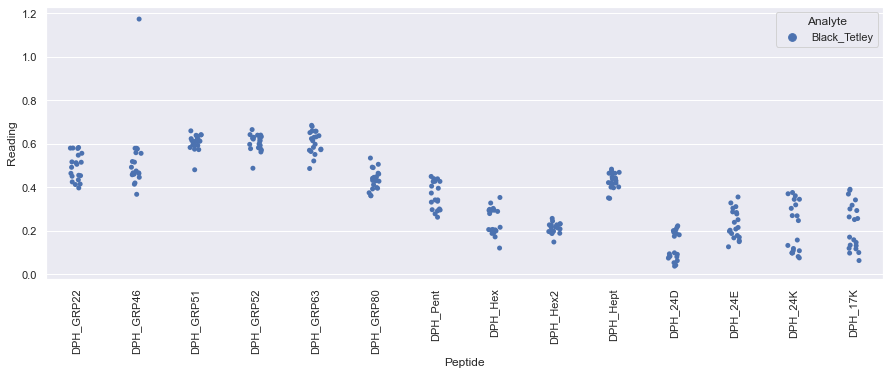

Drawing scatter plot of data spread for Black_Twinings_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

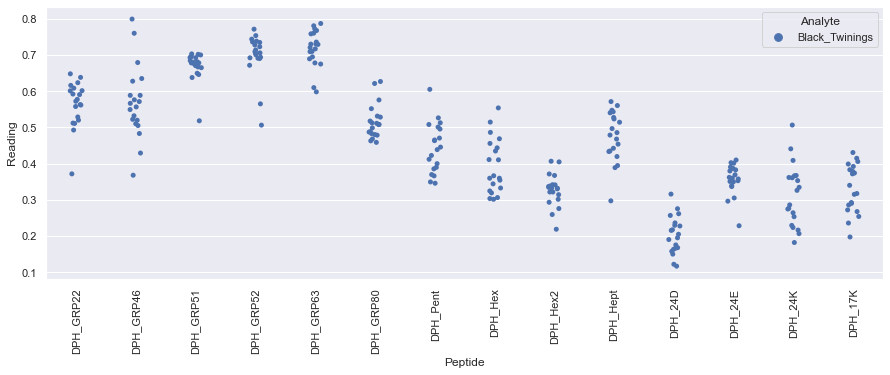

Drawing scatter plot of data spread for Black_Yorkshire_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

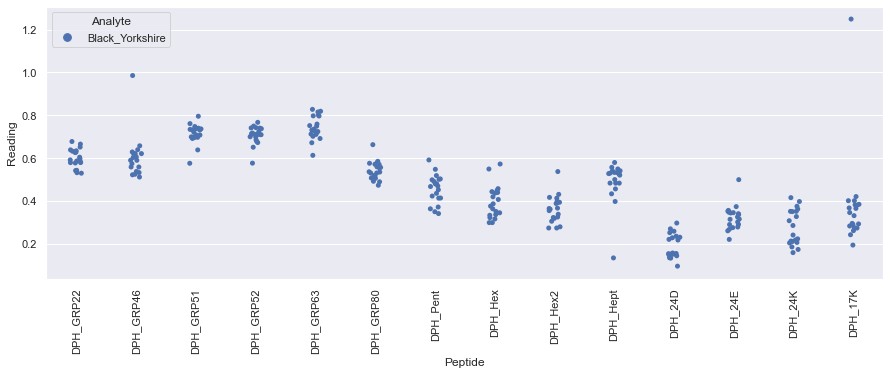

Drawing scatter plot of data spread for Green_Clipper_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

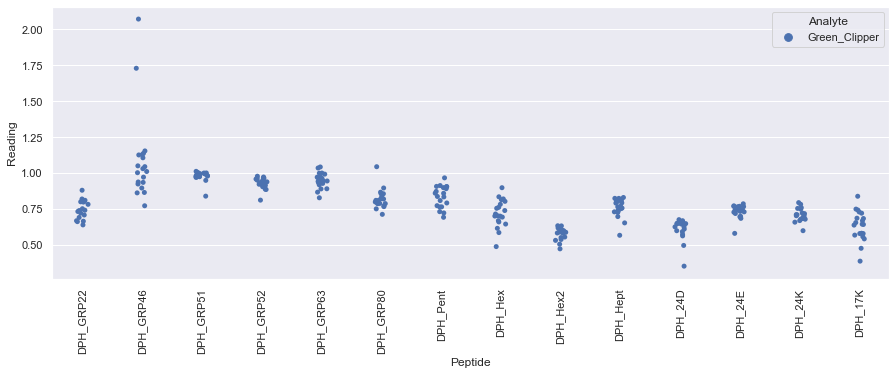

Drawing scatter plot of data spread for Green_Diplomat_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

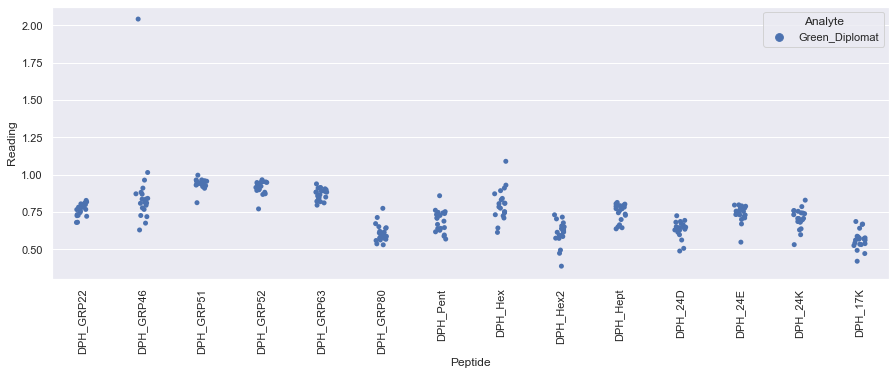

Drawing scatter plot of data spread for Green_Doubledragon_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

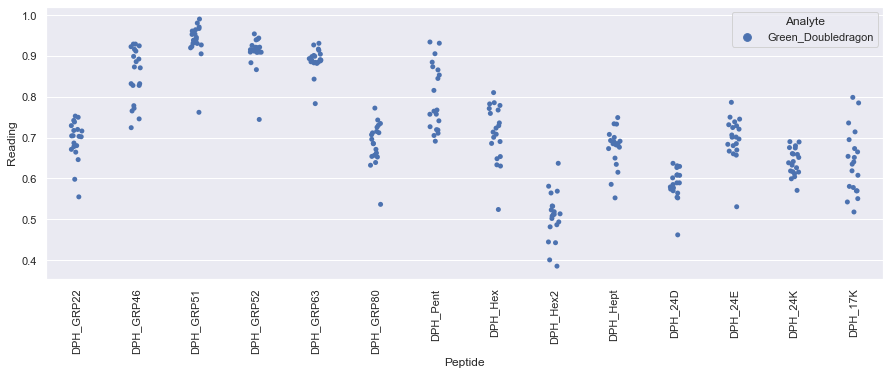

Drawing scatter plot of data spread for Green_Dragonfly_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

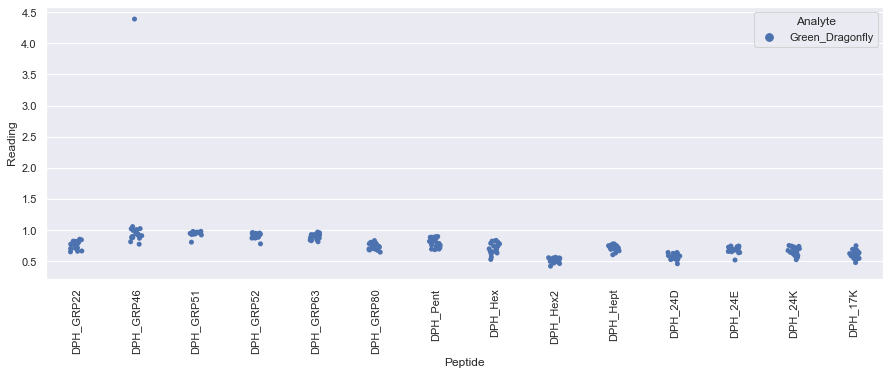

Drawing scatter plot of data spread for Green_Handb_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

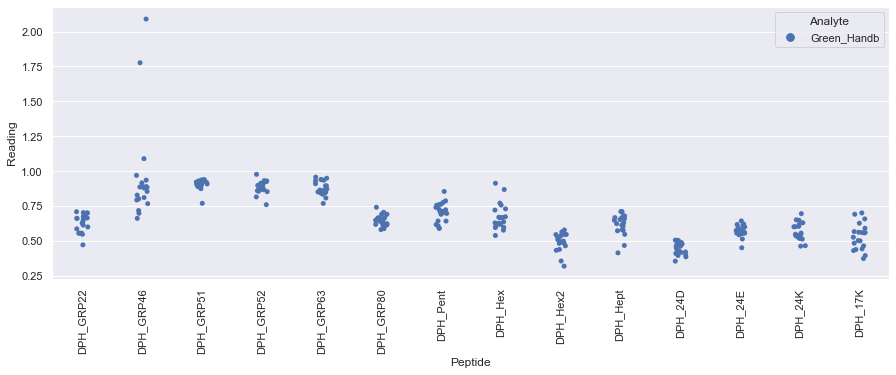

Drawing scatter plot of data spread for Green_Joes_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

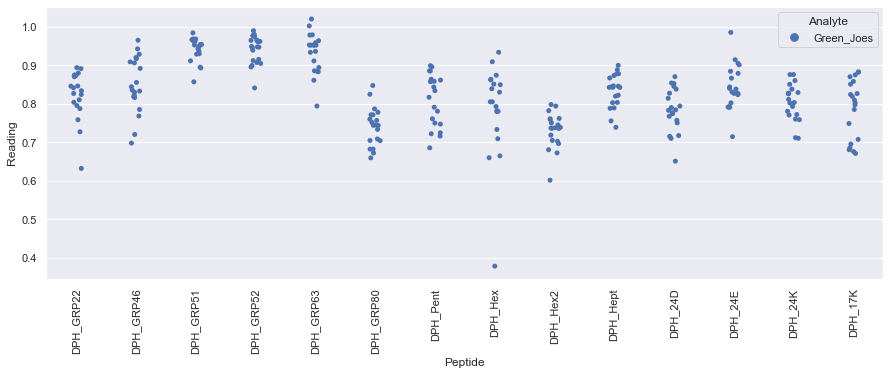

Drawing scatter plot of data spread for Green_Qi_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

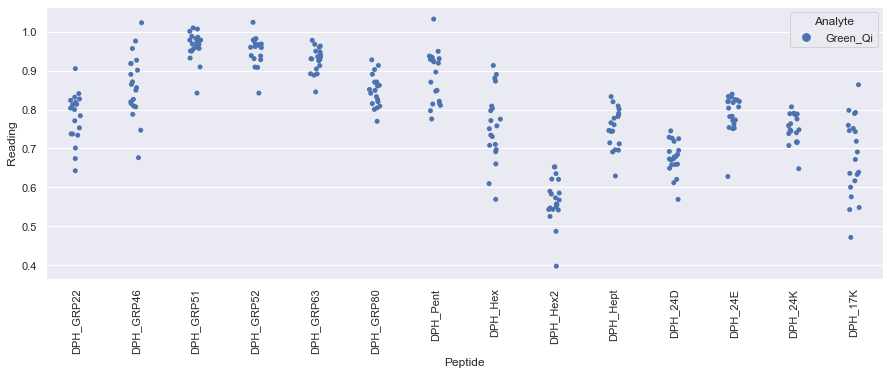

Drawing scatter plot of data spread for Green_Sainsburys_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

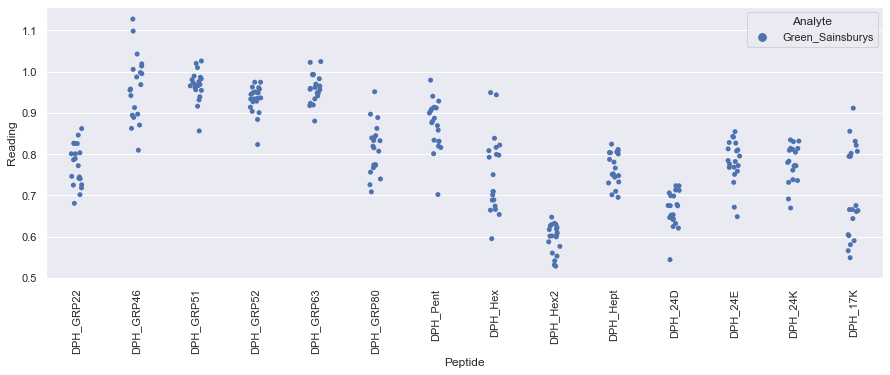

Drawing scatter plot of data spread for Green_Tetley_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

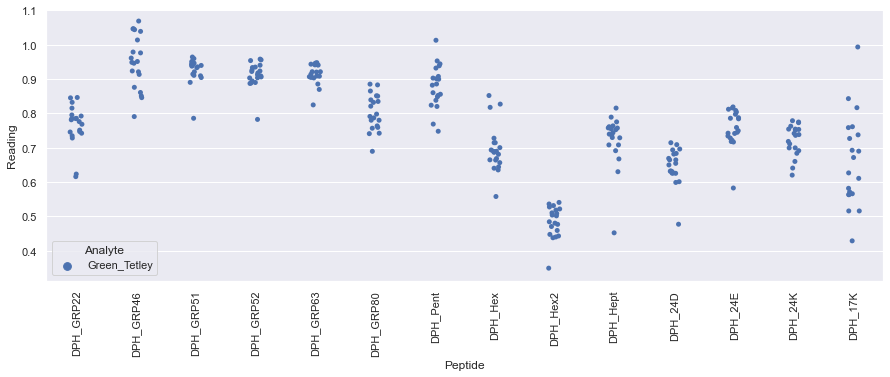

Drawing scatter plot of data spread for Green_Twinings_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

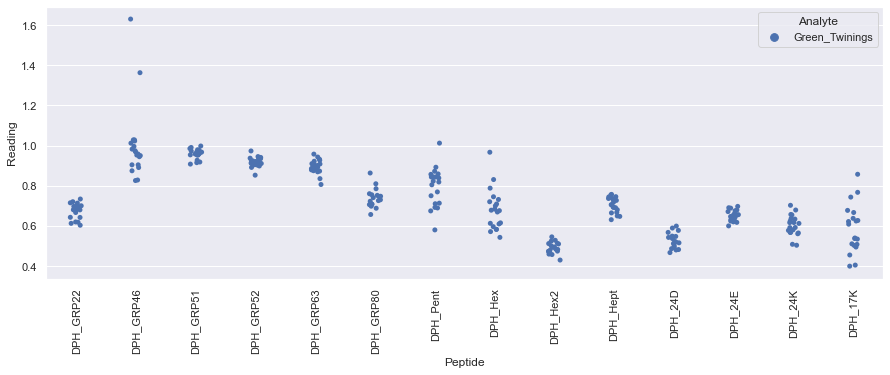

Drawing scatter plot of data spread for Grey_Asda_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

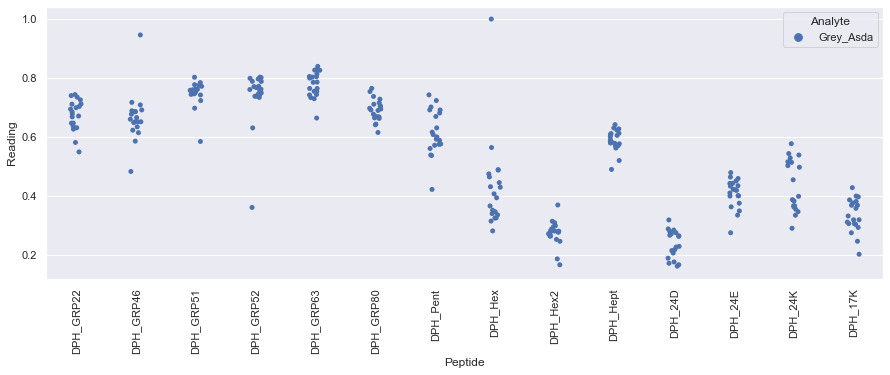

Drawing scatter plot of data spread for Grey_Clipper_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

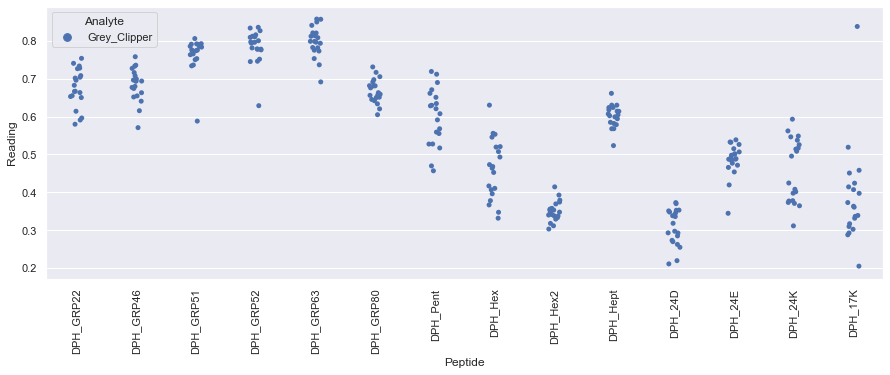

Drawing scatter plot of data spread for Grey_Coop_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

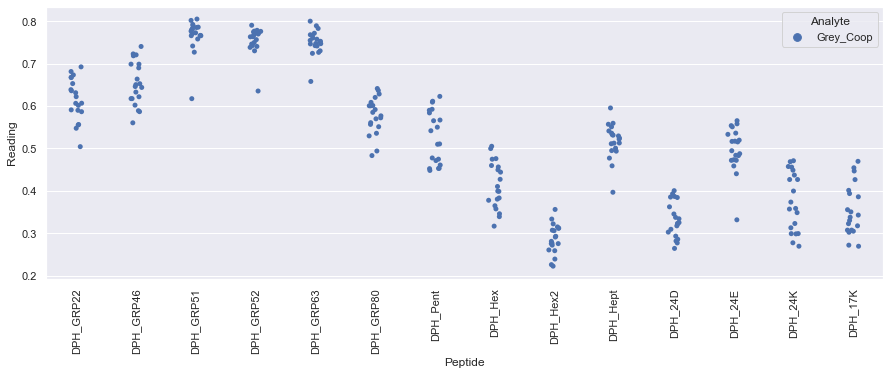

Drawing scatter plot of data spread for Grey_Devonshire_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

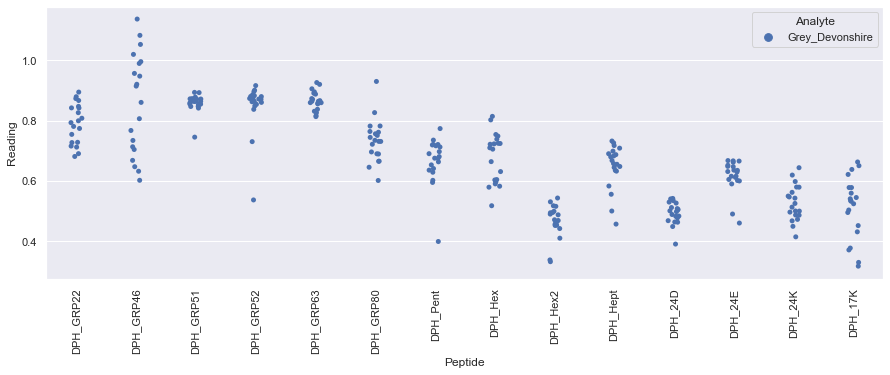

Drawing scatter plot of data spread for Grey_Diplomat_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

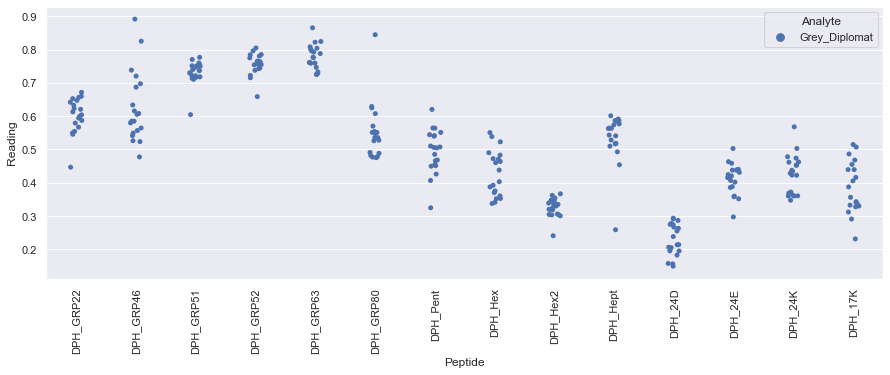

Drawing scatter plot of data spread for Grey_Joes_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

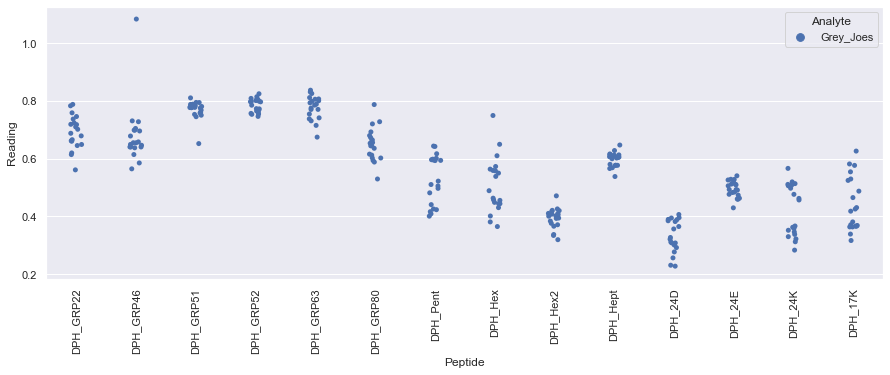

Drawing scatter plot of data spread for Grey_Mands_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

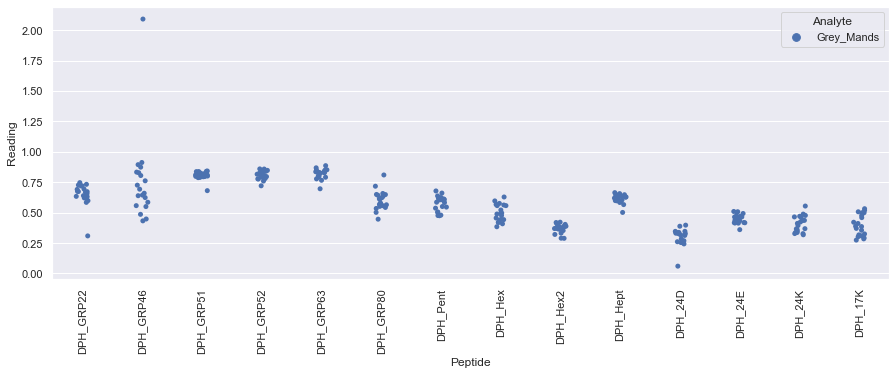

Drawing scatter plot of data spread for Grey_Pukka_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

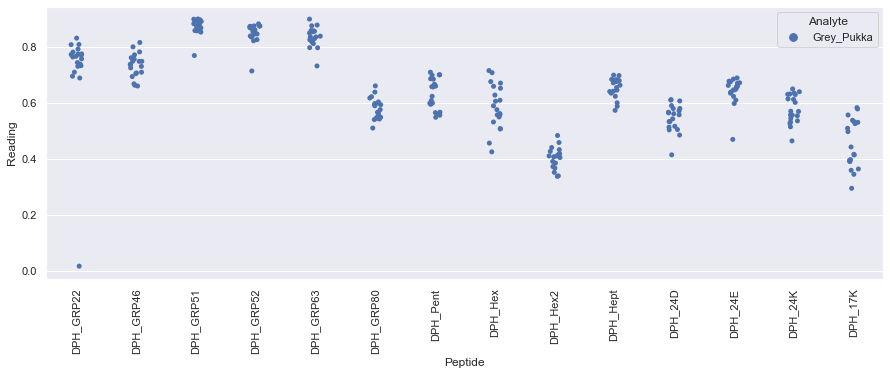

Drawing scatter plot of data spread for Grey_Tesco_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

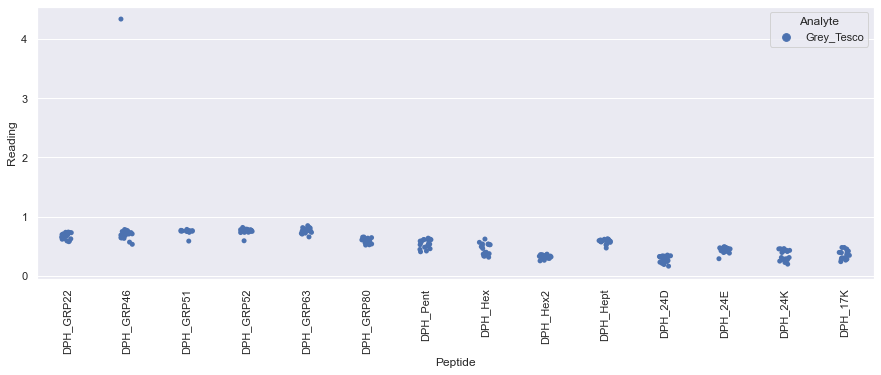

Drawing scatter plot of data spread for Grey_Twinings_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

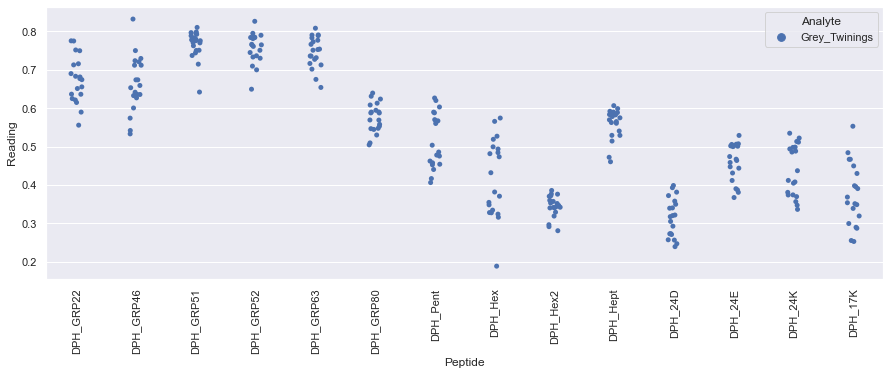

Drawing scatter plot of data spread for Black_Clipper_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

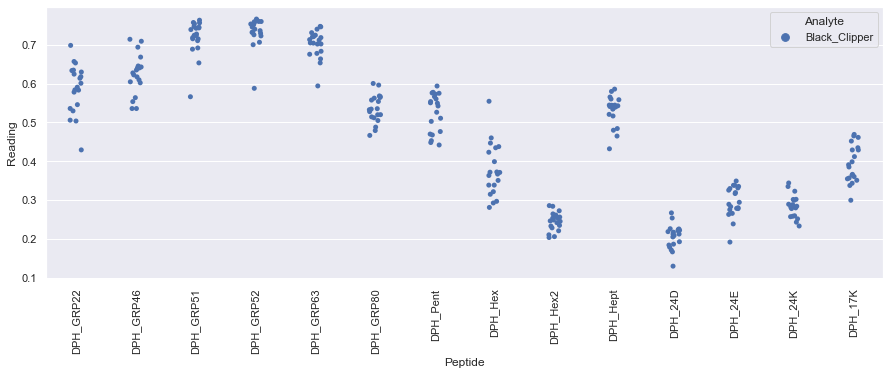

Drawing scatter plot of data spread for Black_Diplomat_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

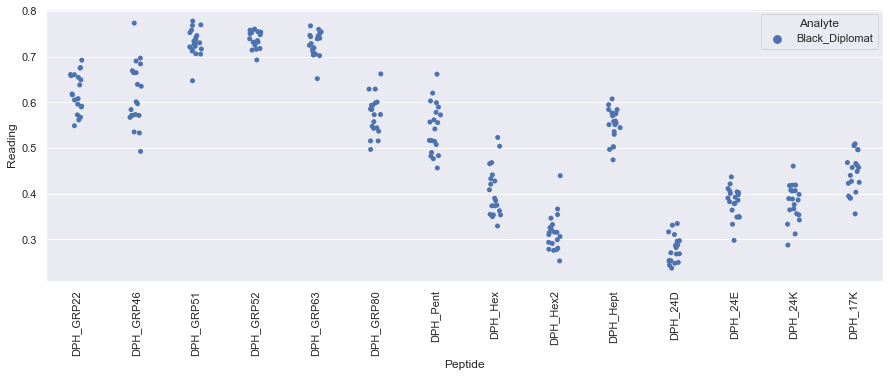

Drawing scatter plot of data spread for Black_Dragonfly_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

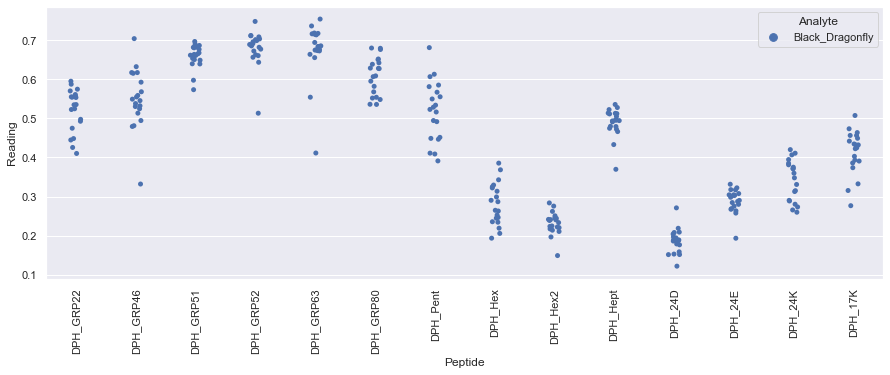

Drawing scatter plot of data spread for Black_Pgtips_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

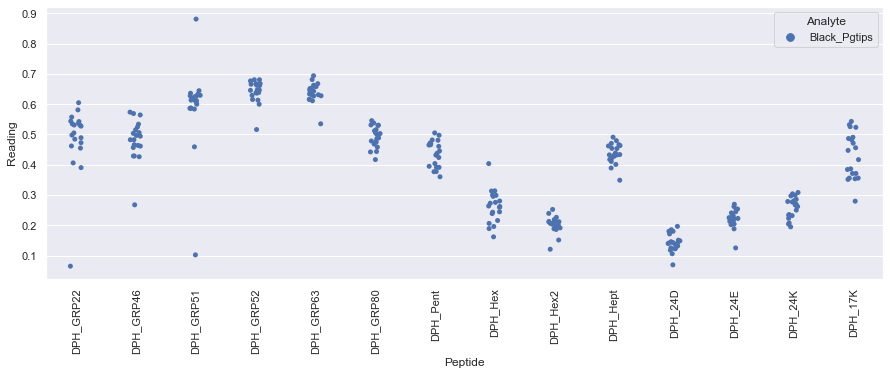

Drawing scatter plot of data spread for Black_Pukka_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

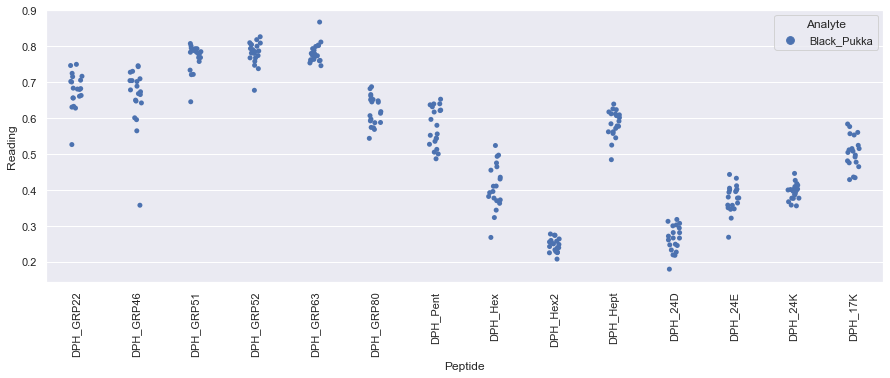

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

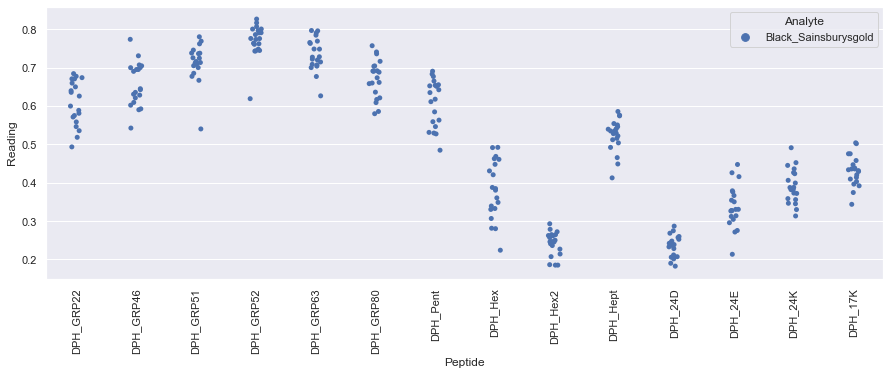

Drawing scatter plot of data spread for Black_Tesco_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

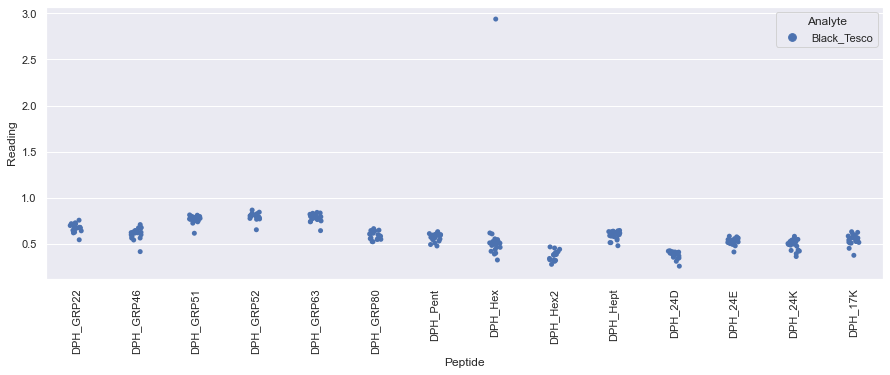

Drawing scatter plot of data spread for Black_Tetley_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

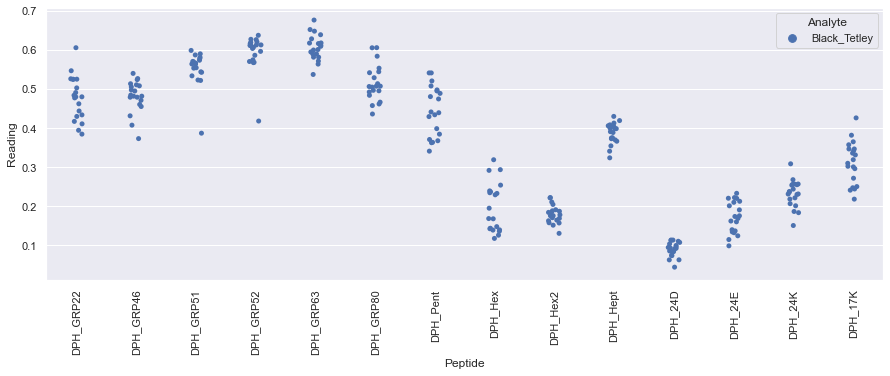

Drawing scatter plot of data spread for Black_Twinings_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

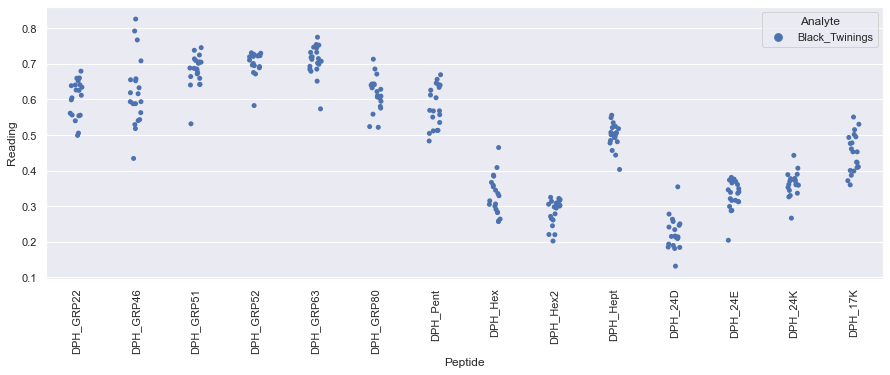

Drawing scatter plot of data spread for Black_Yorkshire_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

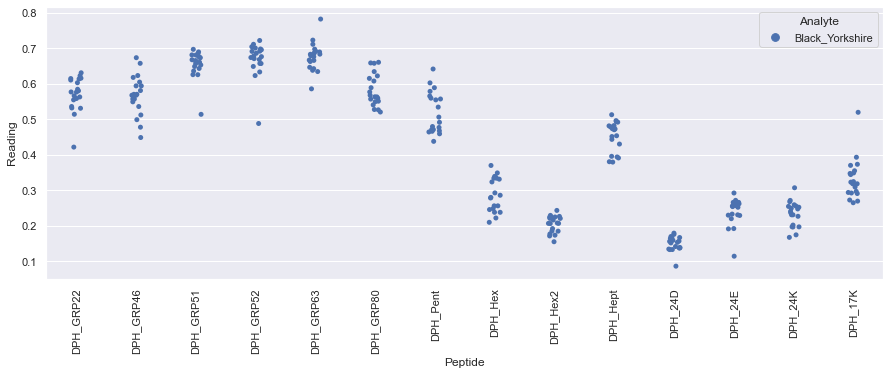

Drawing scatter plot of data spread for Green_Clipper_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

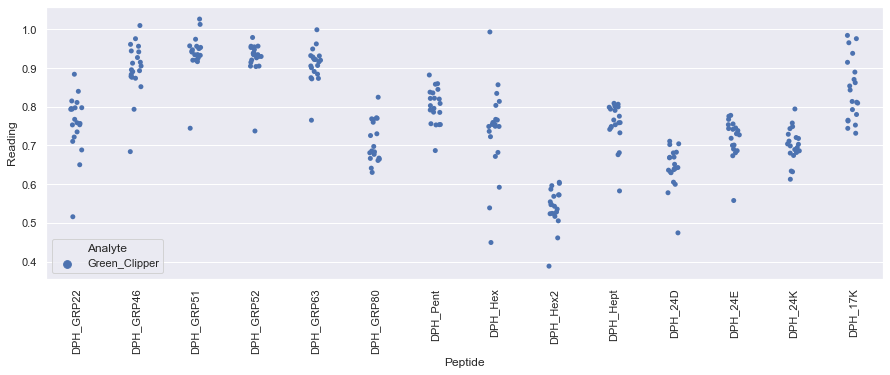

Drawing scatter plot of data spread for Green_Diplomat_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

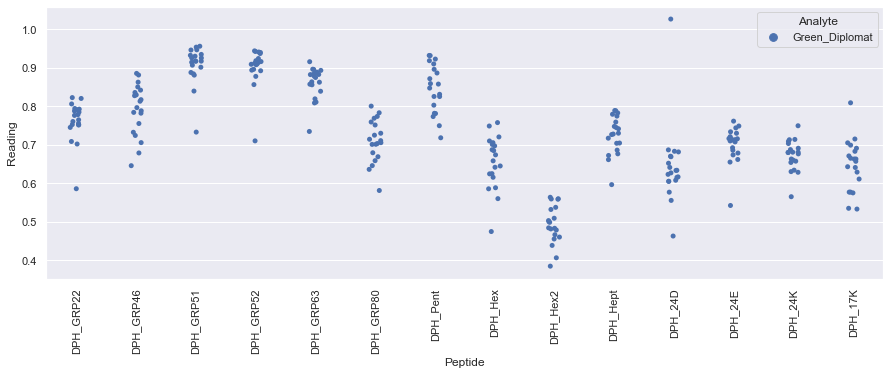

Drawing scatter plot of data spread for Green_Doubledragon_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

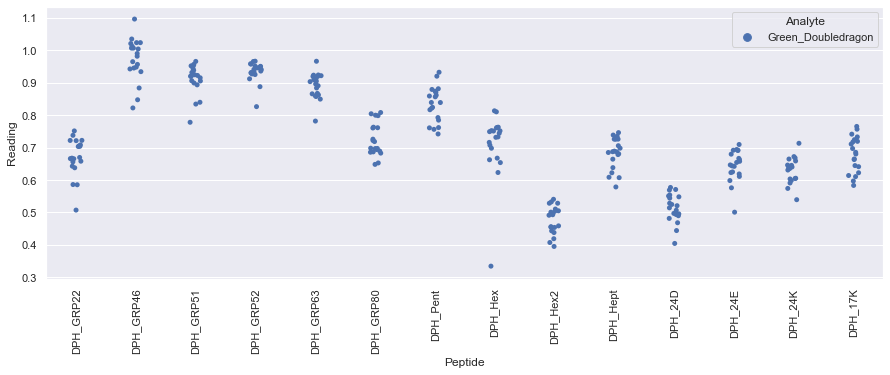

Drawing scatter plot of data spread for Green_Dragonfly_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

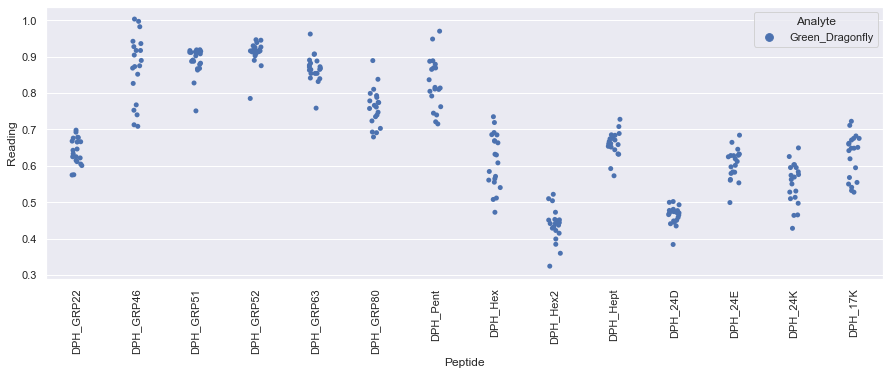

Drawing scatter plot of data spread for Green_Handb_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

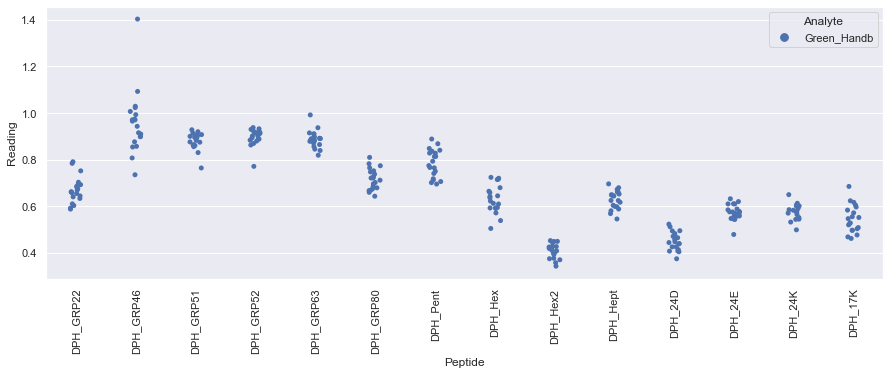

Drawing scatter plot of data spread for Green_Joes_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

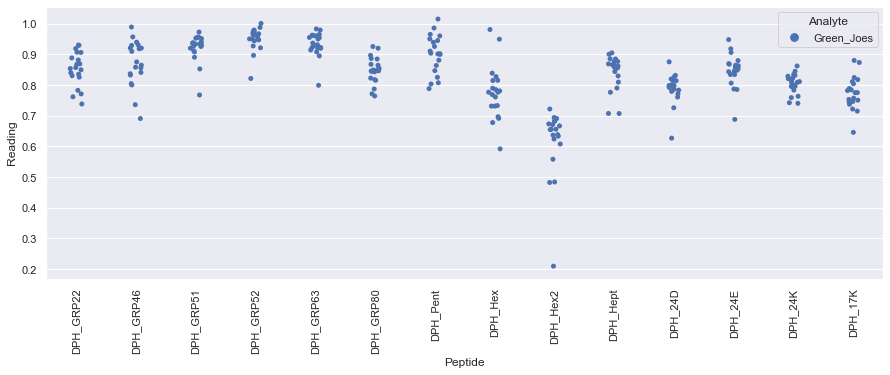

Drawing scatter plot of data spread for Green_Qi_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

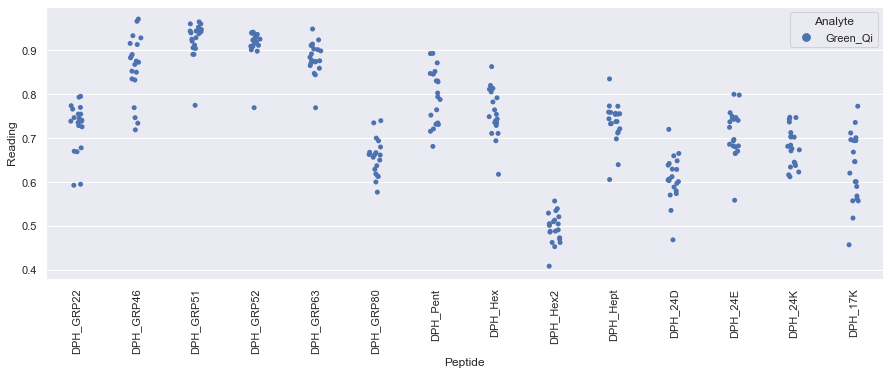

Drawing scatter plot of data spread for Green_Sainsburys_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

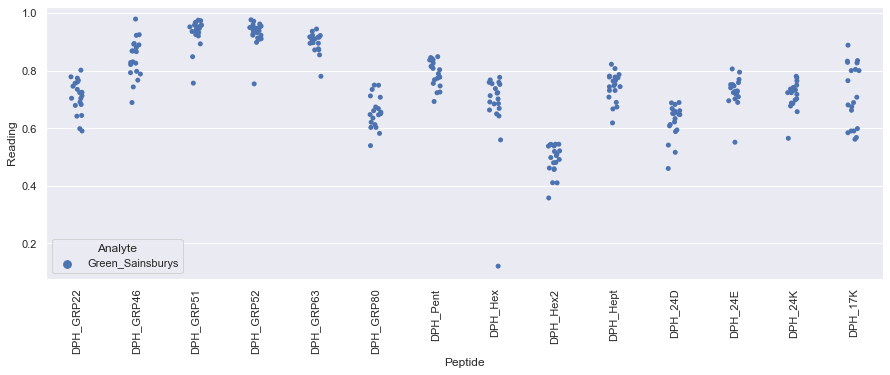

Drawing scatter plot of data spread for Green_Tetley_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

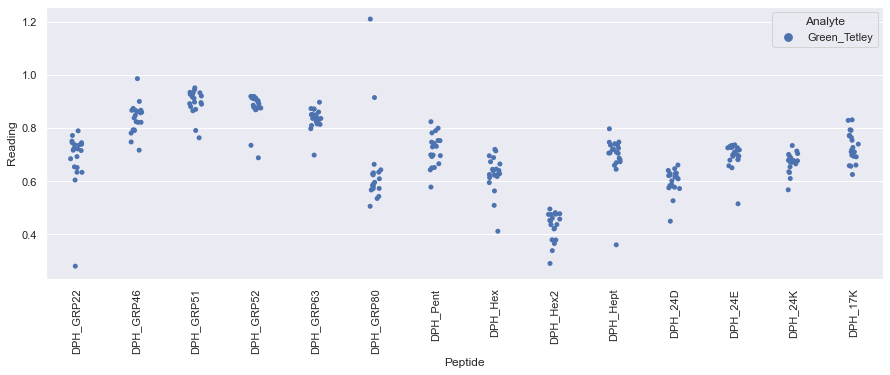

Drawing scatter plot of data spread for Green_Twinings_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

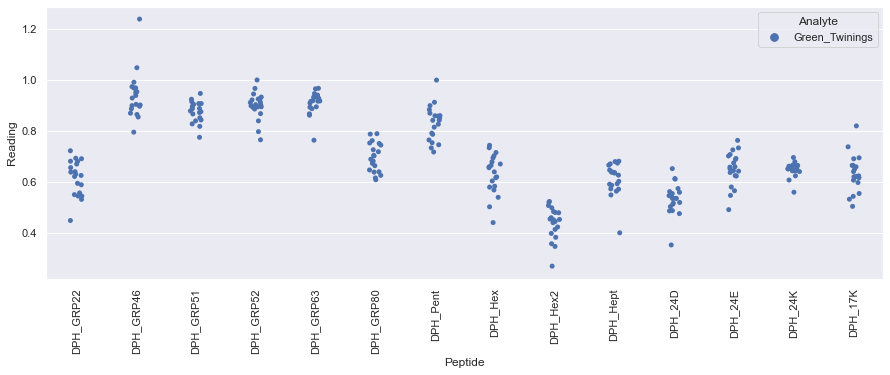

Drawing scatter plot of data spread for Grey_Asda_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

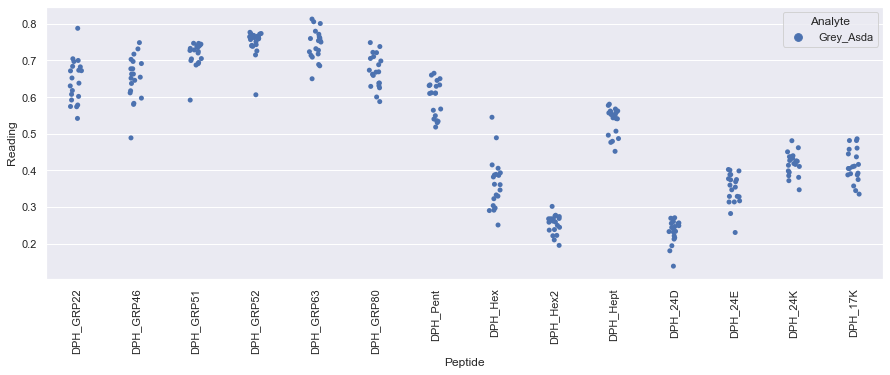

Drawing scatter plot of data spread for Grey_Clipper_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

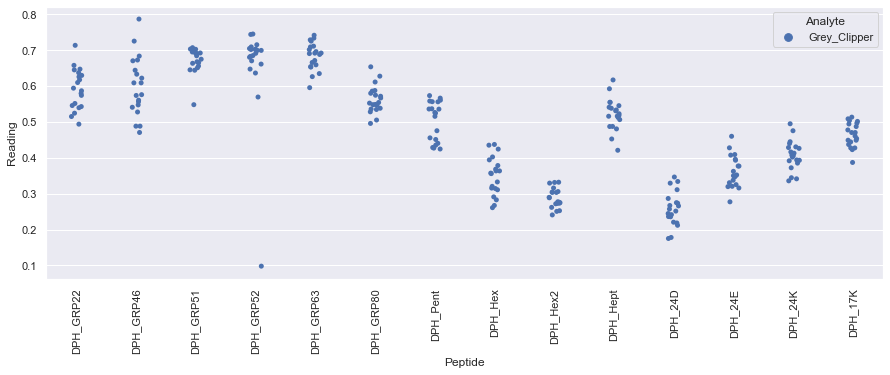

Drawing scatter plot of data spread for Grey_Coop_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

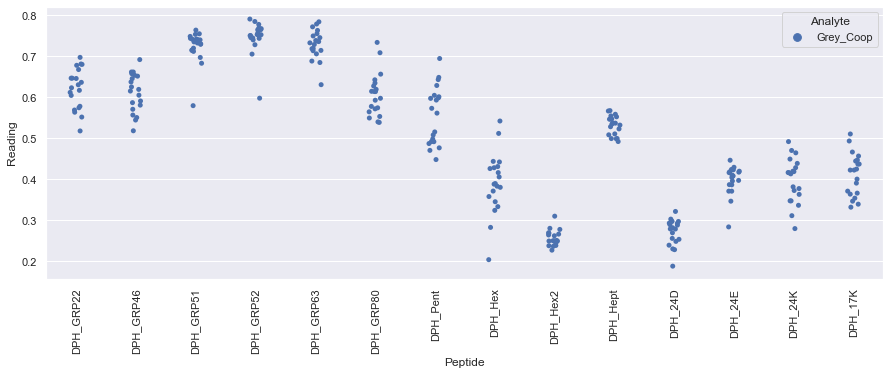

Drawing scatter plot of data spread for Grey_Devonshire_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

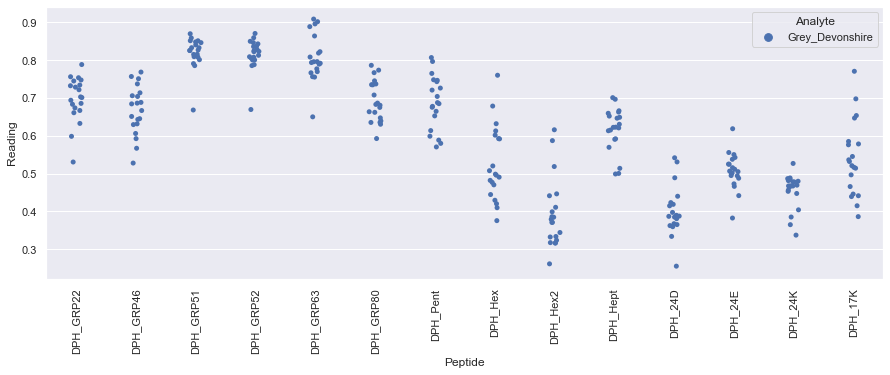

Drawing scatter plot of data spread for Grey_Diplomat_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

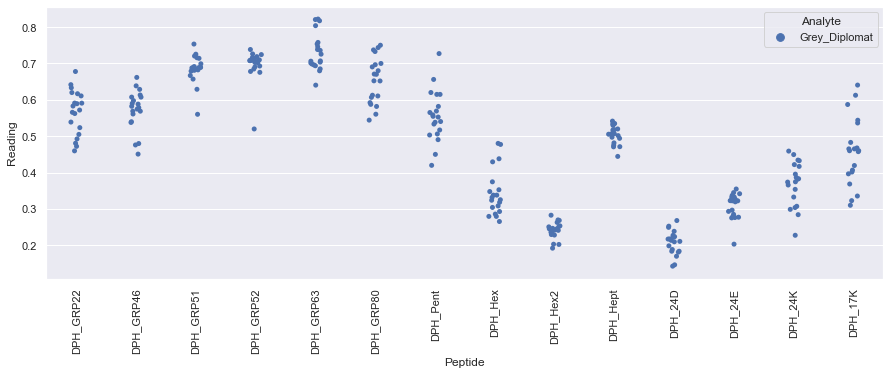

Drawing scatter plot of data spread for Grey_Joes_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

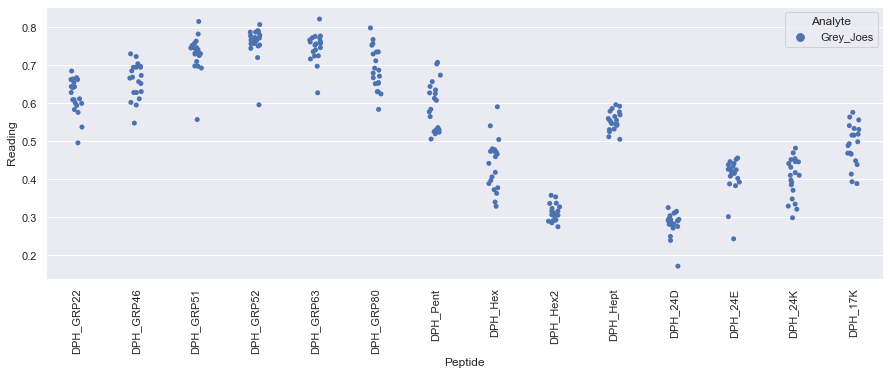

Drawing scatter plot of data spread for Grey_Mands_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

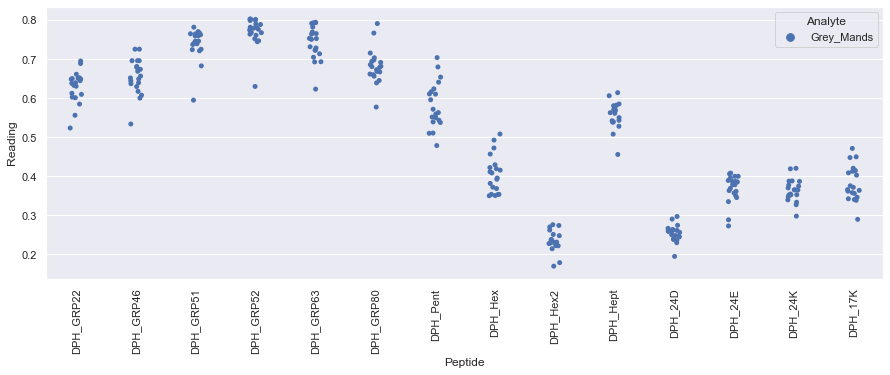

Drawing scatter plot of data spread for Grey_Pukka_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

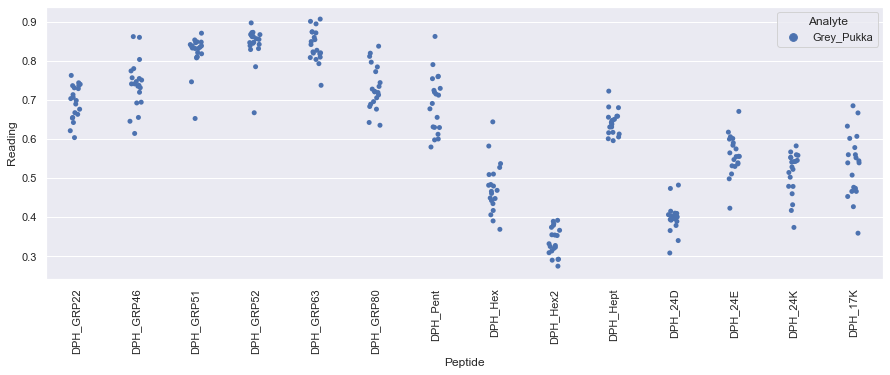

Drawing scatter plot of data spread for Grey_Tesco_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

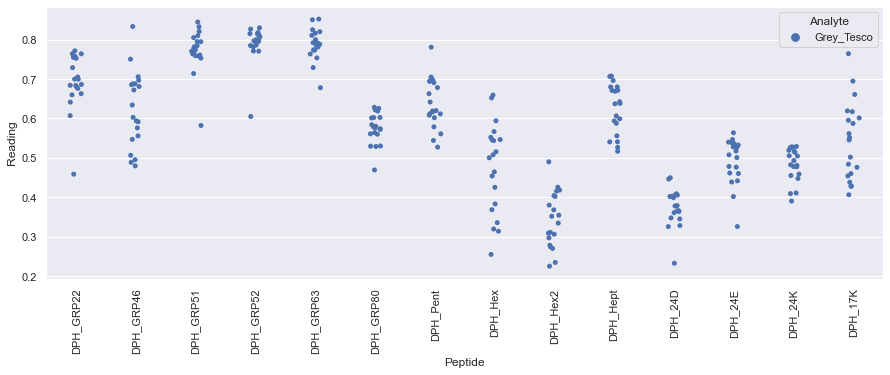

Drawing scatter plot of data spread for Grey_Twinings_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

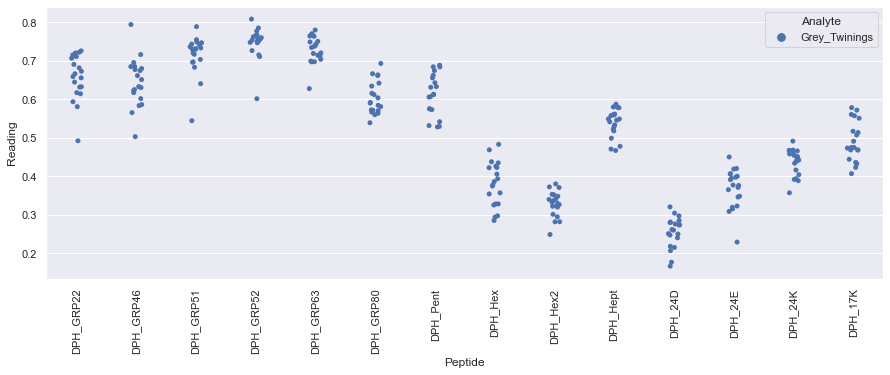

Drawing scatter plot of data spread for Black_Clipper_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

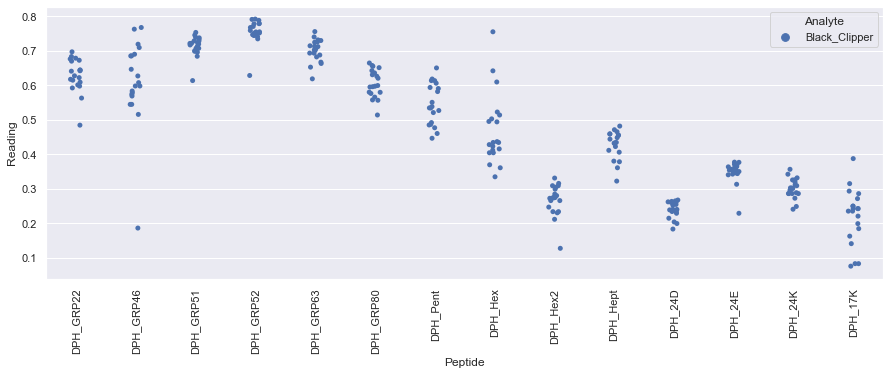

Drawing scatter plot of data spread for Black_Diplomat_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

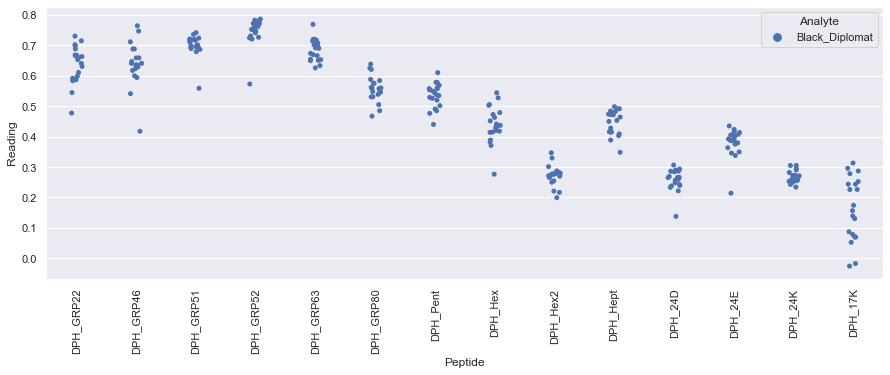

Drawing scatter plot of data spread for Black_Dragonfly_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

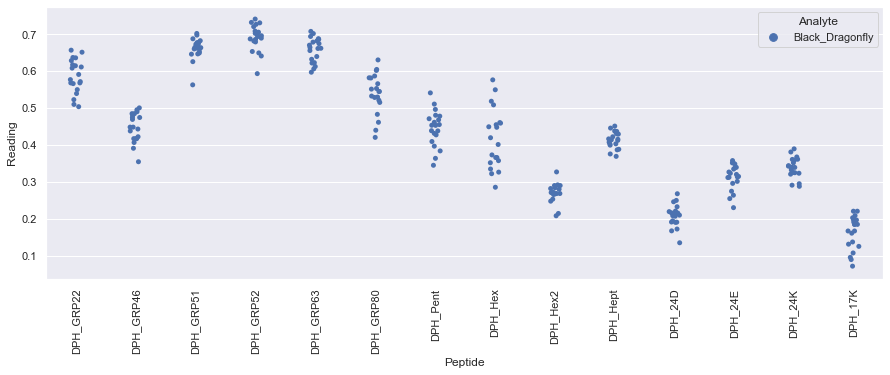

Drawing scatter plot of data spread for Black_Pgtips_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

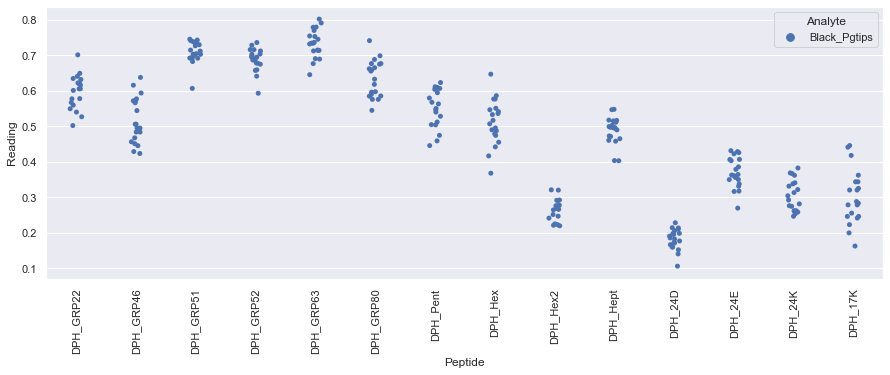

Drawing scatter plot of data spread for Black_Pukka_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

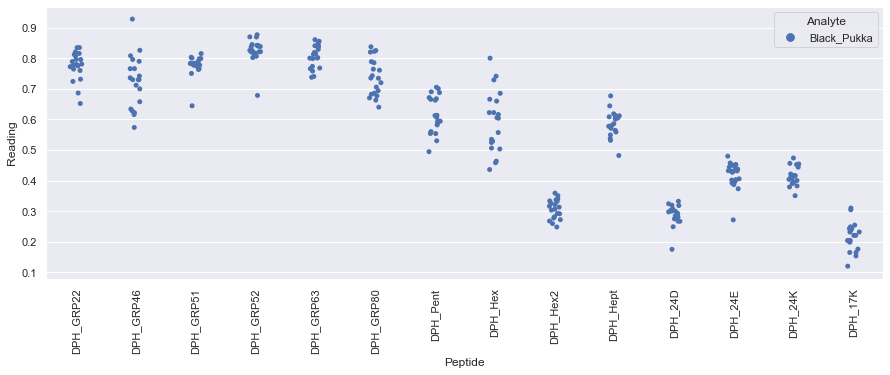

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

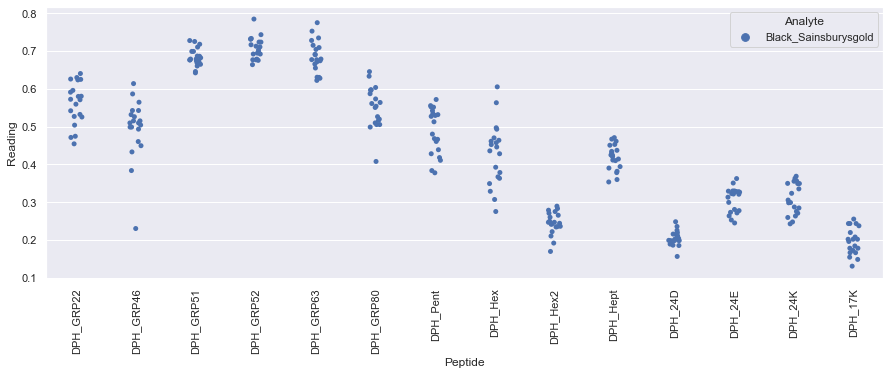

Drawing scatter plot of data spread for Black_Tesco_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

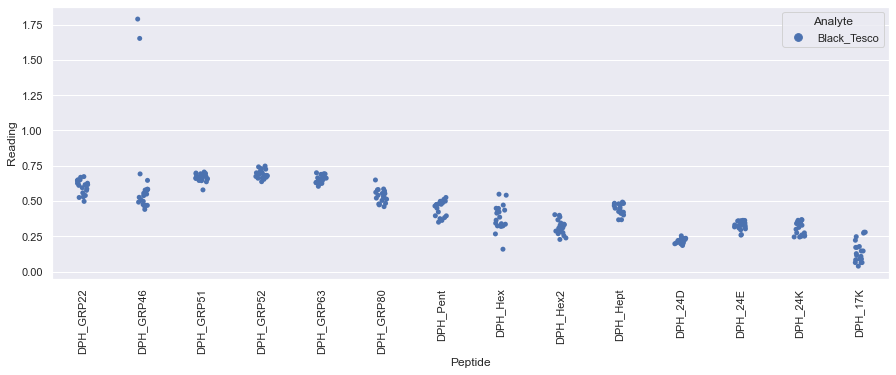

Drawing scatter plot of data spread for Black_Tetley_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

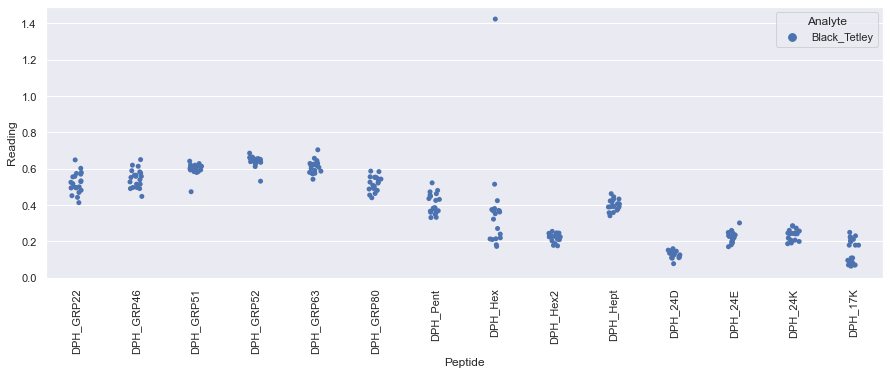

Drawing scatter plot of data spread for Black_Twinings_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

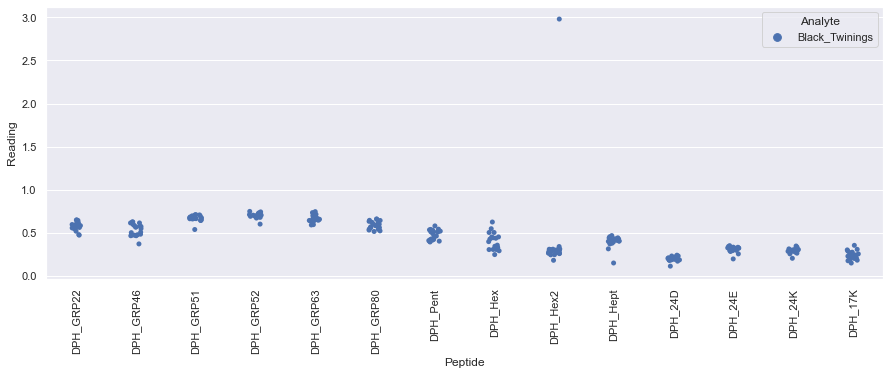

Drawing scatter plot of data spread for Black_Yorkshire_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

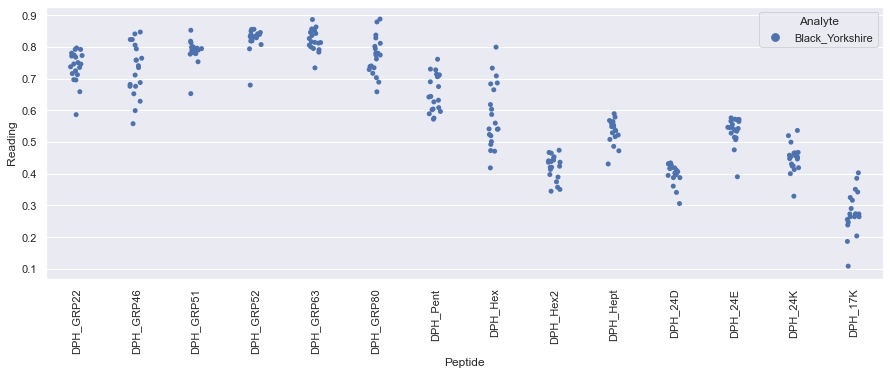

Drawing scatter plot of data spread for Green_Clipper_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

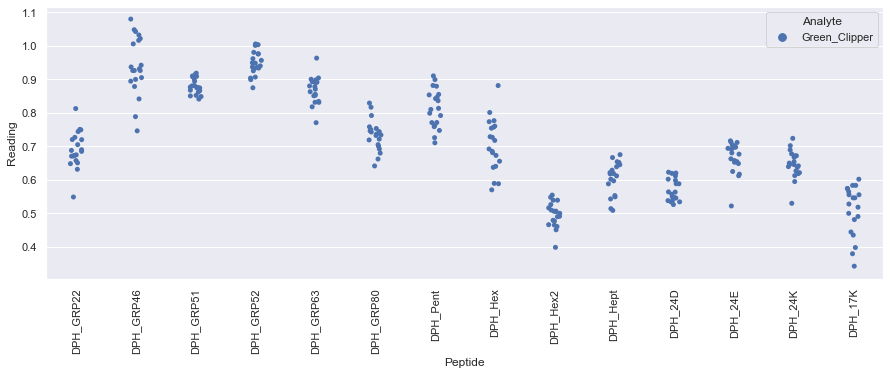

Drawing scatter plot of data spread for Green_Diplomat_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

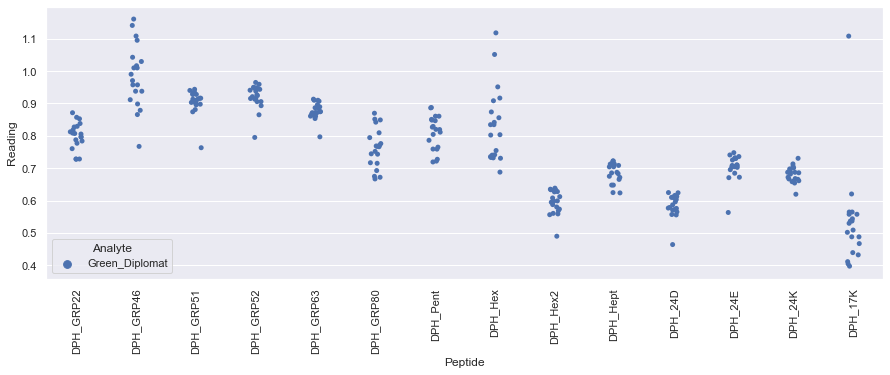

Drawing scatter plot of data spread for Green_Doubledragon_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

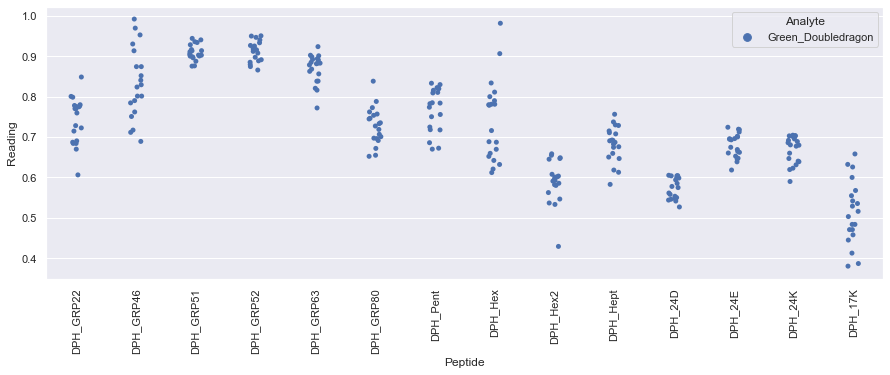

Drawing scatter plot of data spread for Green_Dragonfly_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

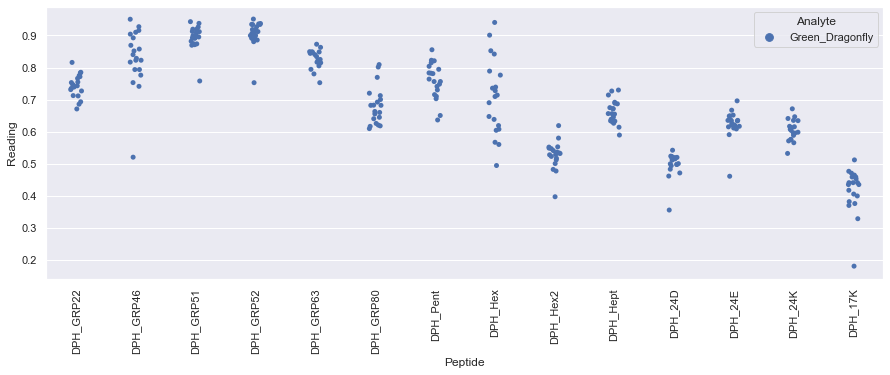

Drawing scatter plot of data spread for Green_Handb_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

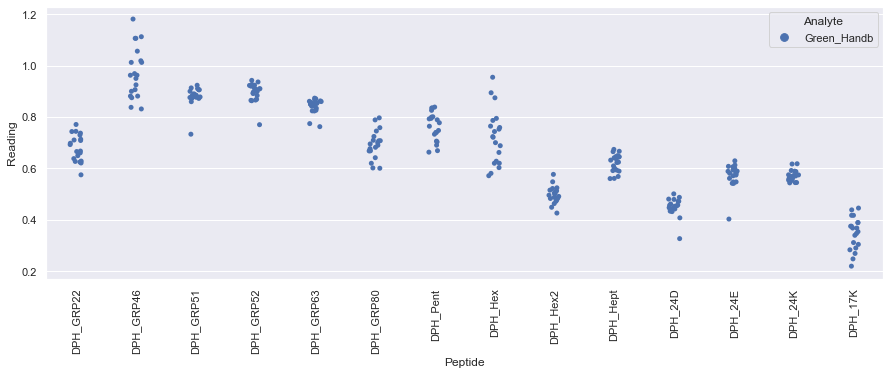

Drawing scatter plot of data spread for Green_Joes_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

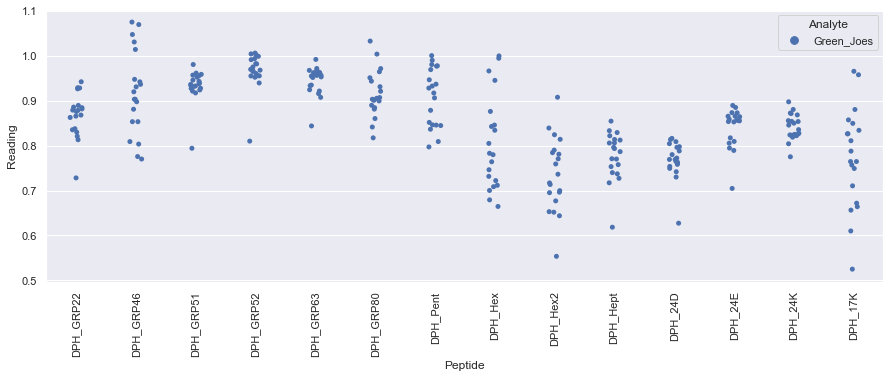

Drawing scatter plot of data spread for Green_Qi_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

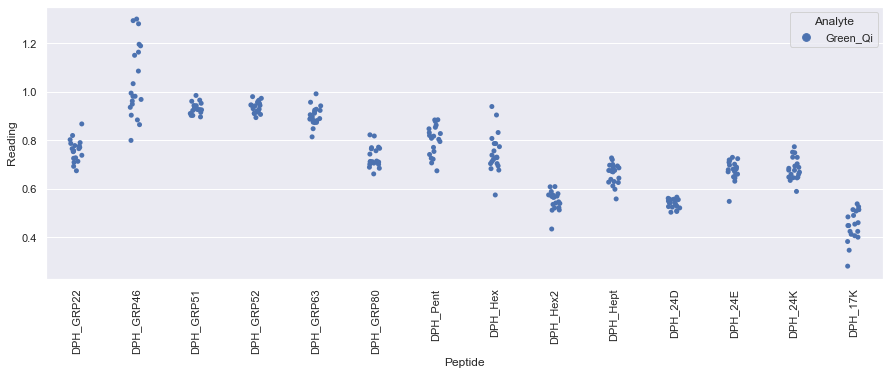

Drawing scatter plot of data spread for Green_Sainsburys_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

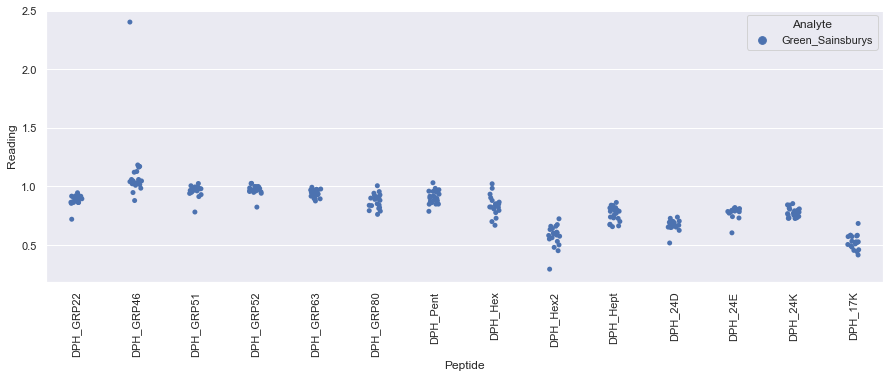

Drawing scatter plot of data spread for Green_Tetley_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

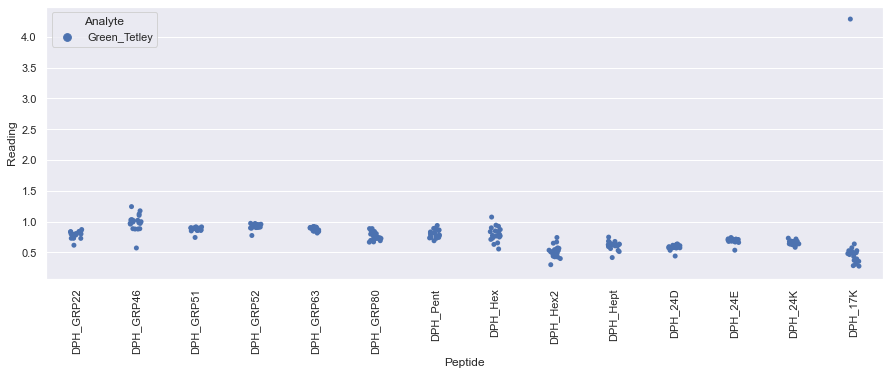

Drawing scatter plot of data spread for Green_Twinings_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

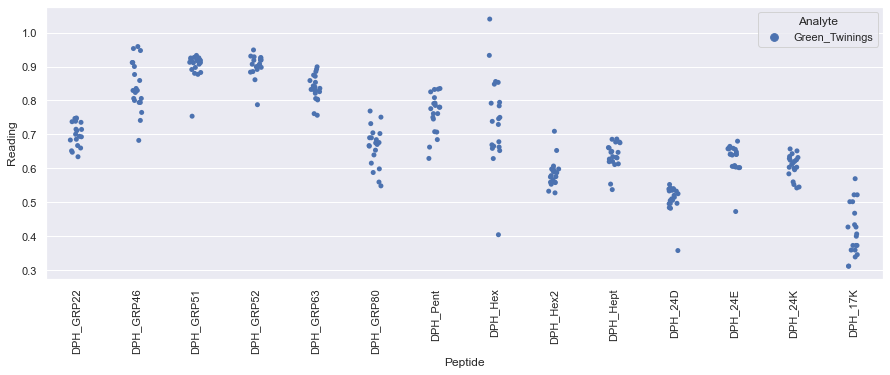

Drawing scatter plot of data spread for Grey_Asda_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

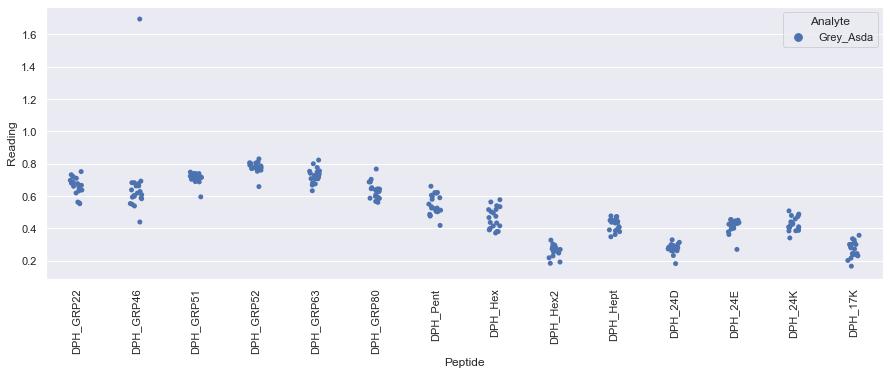

Drawing scatter plot of data spread for Grey_Clipper_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

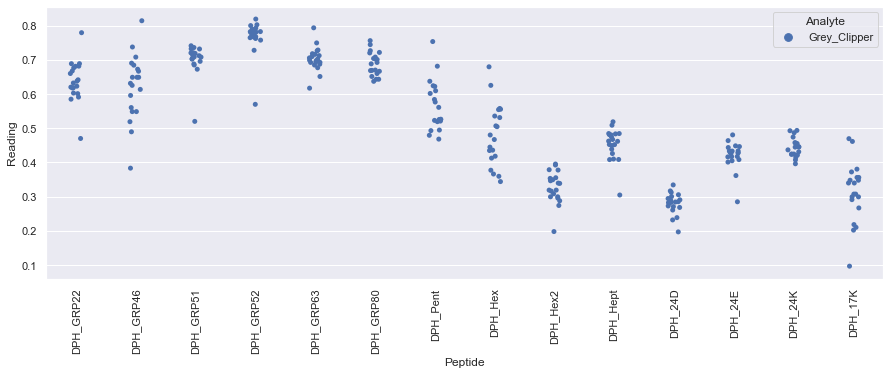

Drawing scatter plot of data spread for Grey_Coop_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

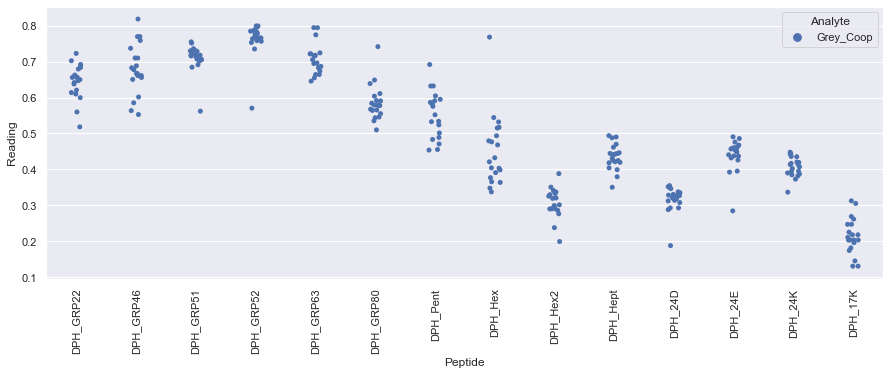

Drawing scatter plot of data spread for Grey_Devonshire_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

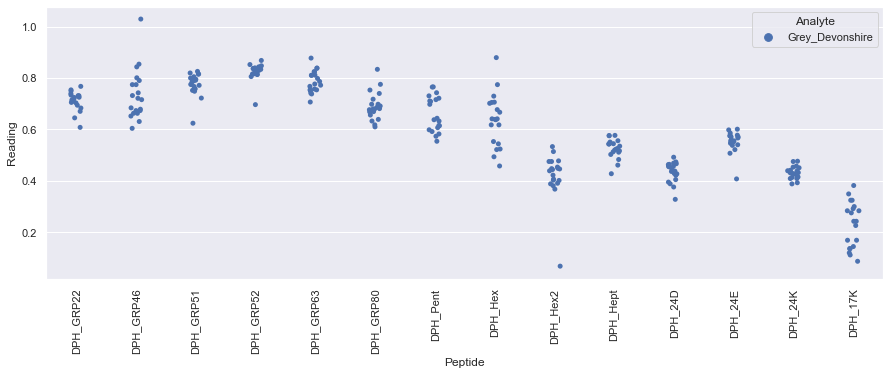

Drawing scatter plot of data spread for Grey_Diplomat_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

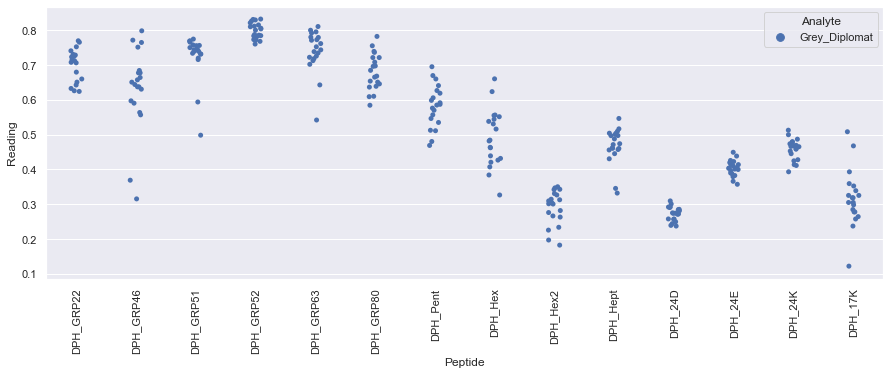

Drawing scatter plot of data spread for Grey_Joes_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

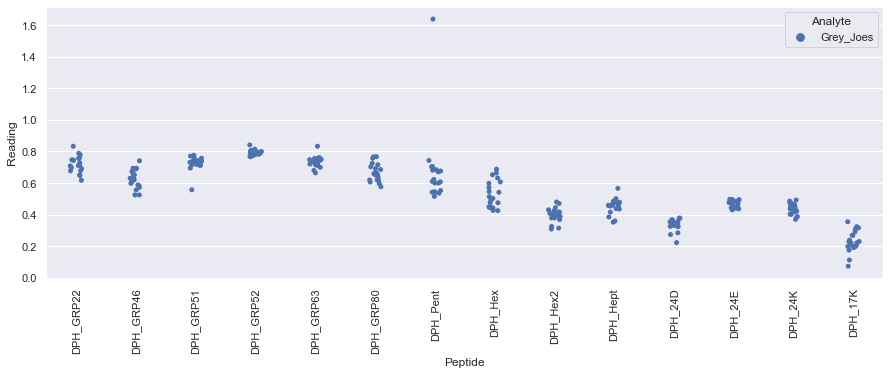

Drawing scatter plot of data spread for Grey_Mands_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

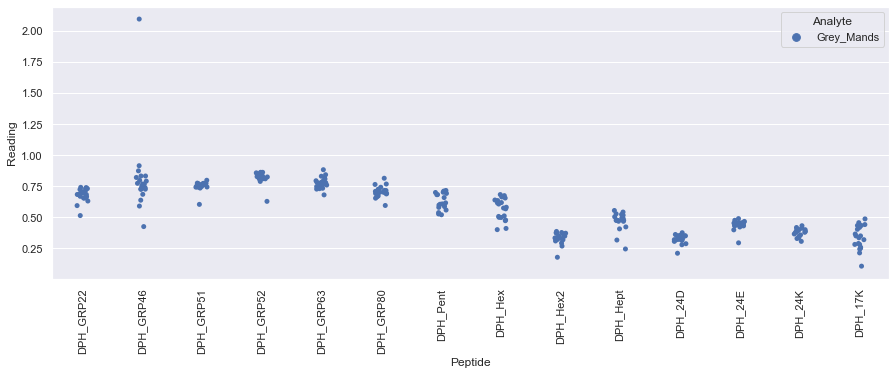

Drawing scatter plot of data spread for Grey_Pukka_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

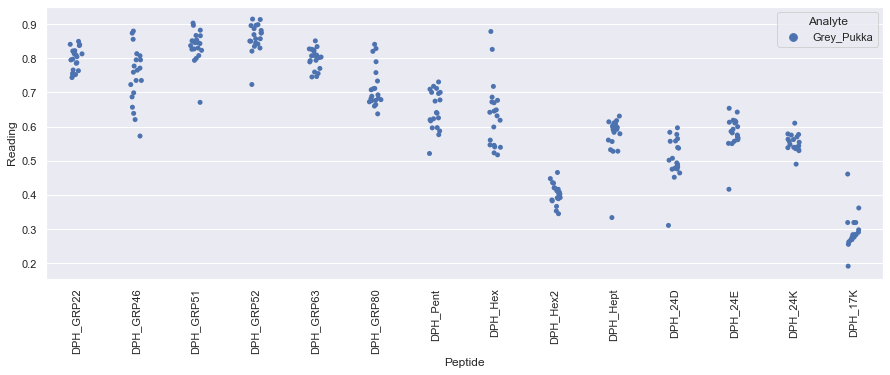

Drawing scatter plot of data spread for Grey_Tesco_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

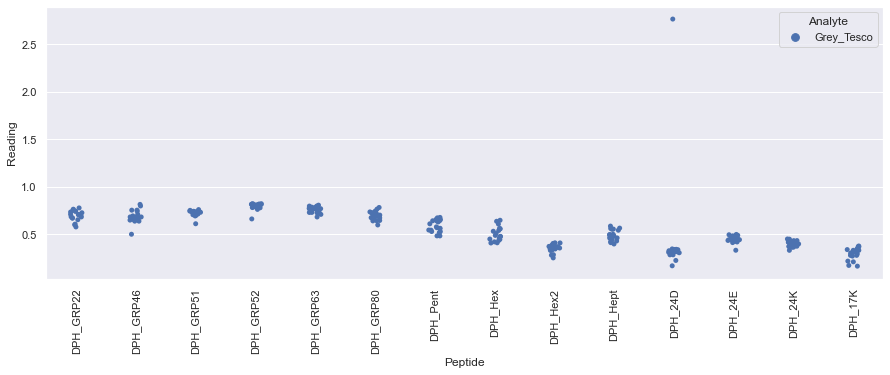

Drawing scatter plot of data spread for Grey_Twinings_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

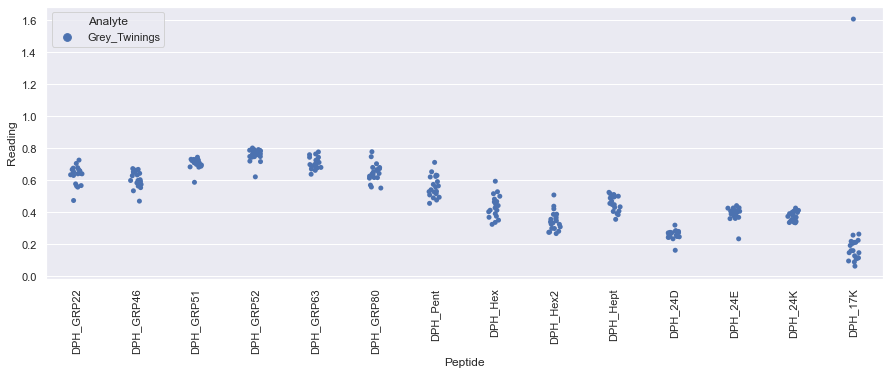



Outliers on the same plate:

/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_1.xlsx: blank, DPH_GRP51, 13902.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_1.xlsx: blank, DPH_GRP52, 16010.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_1.xlsx: Black_Clipper, DPH_GRP22, 9290.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_1.xlsx: Black_Clipper, DPH_GRP51, 9358.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_1.xlsx: Black_Clipper, DPH_GRP52, 10367.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reformatted_tea_csvs/Black_Clipper_repeat_1.xlsx: Black_Clipper, DPH_GRP63, 10874.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_data_standard_array/Reforma

In [6]:
tea_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='Tea'
)

At a glance:
- There are no plates in the dataset that by eye are obviously anomalous => no need to discard any of the plates.
- As expected, the collapsed barrel control (GRP35) has very little effect upon DPH fluorescence. Peptides GRP46 and 17K also have a limited (although slightly larger) effect upon DPH fluorescence => variance associated with the readings from these barrels might be quite high.
- In the case of most of the peptides, the analytes cause a noticeable (by eye) change (usually a decrease) in DPH fluorescence => likely that the analytes will generate unique fingerprints.

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [7]:
tea_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_Black_Clipper: Black_Clipper, DPH_GRP22, 0.6126890446329768
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP51, 0.6906682676072192
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP52, 0.6756756756756757
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP63, 1.0650273224043716
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP63, 0.7647789369100845
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP80, 0.6674430641821946
repeat_1_Black_Clipper: Black_Clipper, DPH_Hex, 0.13620604259534422
repeat_1_Black_Clipper: Black_Clipper, DPH_Hept, 0.28563861985472155
repeat_1_Black_Clipper: Black_Clipper, DPH_24D, 0.26914079115270095
repeat_1_Black_Clipper: Black_Clipper, DPH_24E, 0.22102807631425478
repeat_1_Black_Clipper: Black_Clipper, DPH_24K, 0.3308228302080131
repeat_1_Black_Diplomat: Black_Diplomat, DPH_GRP51, 0.621541053723025
repeat_1_Black_Diplomat: Black_Diplomat, DPH_GRP52, 0.6031852986217457
repeat_1_Black_Diplomat: Black_Diplomat, DPH_GRP63, 0.7194777699364855
repeat_

repeat_6_Green_Dragonfly: Green_Dragonfly, DPH_17K, 0.1804733727810651
repeat_6_Green_Handb: Green_Handb, DPH_GRP51, 0.7328901055924912
repeat_6_Green_Handb: Green_Handb, DPH_GRP52, 0.7699836867862969
repeat_6_Green_Handb: Green_Handb, DPH_GRP63, 0.7622724765581909
repeat_6_Green_Handb: Green_Handb, DPH_GRP63, 0.7741312741312741
repeat_6_Green_Handb: Green_Handb, DPH_24D, 0.3262589476328017
repeat_6_Green_Handb: Green_Handb, DPH_24E, 0.40242130750605326
repeat_6_Green_Joes: Green_Joes, DPH_GRP22, 0.7281110156850337
repeat_6_Green_Joes: Green_Joes, DPH_GRP51, 0.7940419931805947
repeat_6_Green_Joes: Green_Joes, DPH_GRP52, 0.8098973353327951
repeat_6_Green_Joes: Green_Joes, DPH_GRP63, 0.8436686766105999
repeat_6_Green_Joes: Green_Joes, DPH_Hept, 0.6184187960898645
repeat_6_Green_Joes: Green_Joes, DPH_24D, 0.6273666092943201
repeat_6_Green_Joes: Green_Joes, DPH_24E, 0.7046536412078153
repeat_6_Green_Qi: Green_Qi, DPH_Hex2, 0.4336463862801143
repeat_6_Green_Qi: Green_Qi, DPH_24E, 0.54740928

Display range of data points across repeats for the different analytes




Original_data:


Black_Clipper


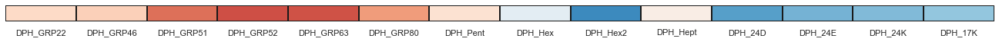


Black_Diplomat


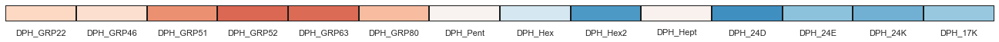


Black_Dragonfly


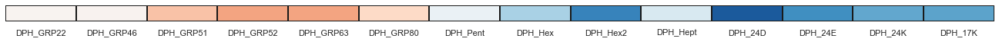


Black_Pgtips


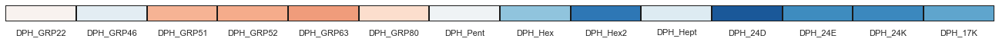


Black_Pukka


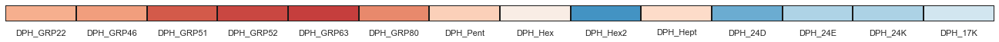


Black_Sainsburysgold


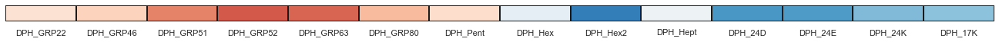


Black_Tesco


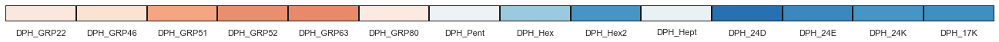


Black_Tetley


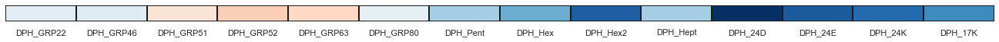


Black_Twinings


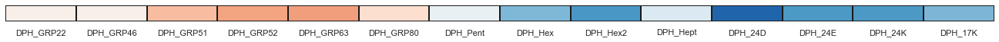


Black_Yorkshire


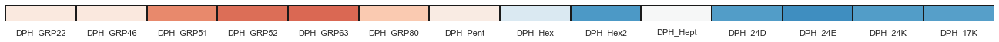


Green_Clipper


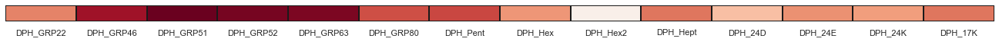


Green_Diplomat


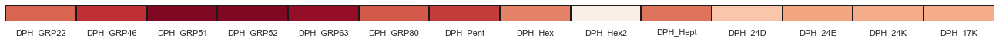


Green_Doubledragon


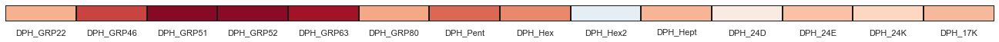


Green_Dragonfly


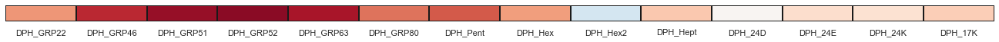


Green_Handb


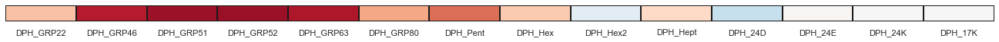


Green_Joes


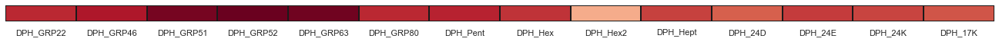


Green_Qi


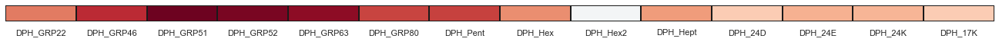


Green_Sainsburys


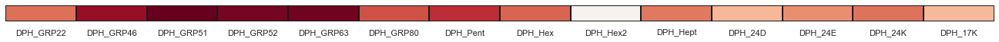


Green_Tetley


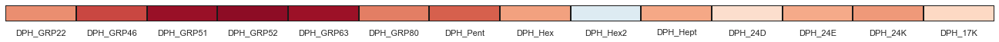


Green_Twinings


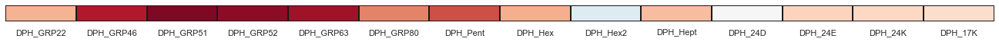


Grey_Asda


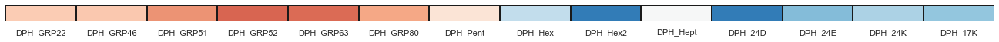


Grey_Clipper


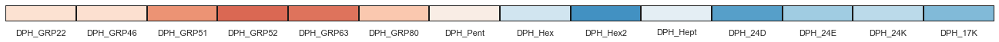


Grey_Coop


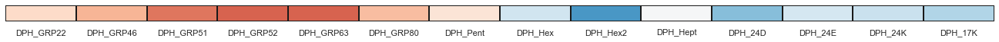


Grey_Devonshire


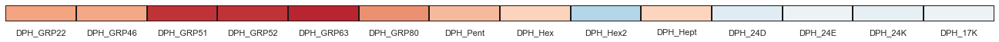


Grey_Diplomat


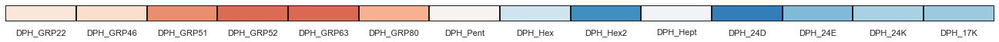


Grey_Joes


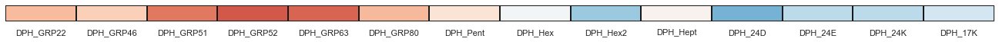


Grey_Mands


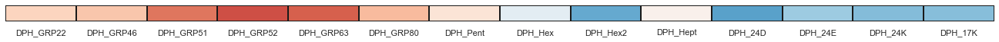


Grey_Pukka


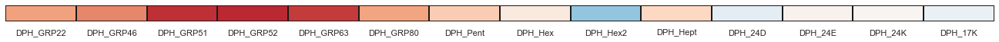


Grey_Tesco


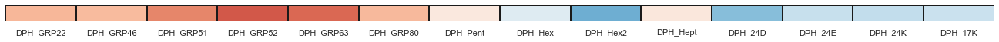


Grey_Twinings


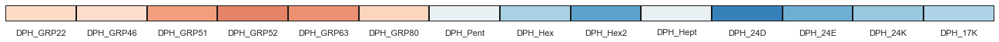




Scaled_data:


Black_Clipper


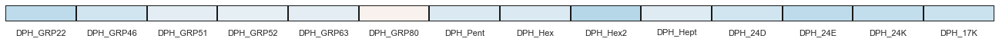


Black_Diplomat


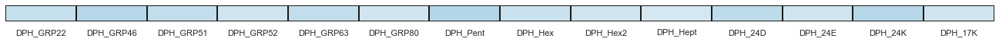


Black_Dragonfly


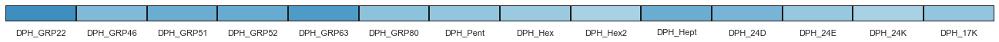


Black_Pgtips


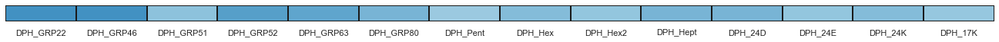


Black_Pukka


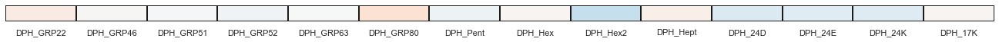


Black_Sainsburysgold


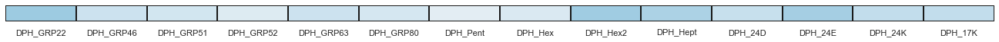


Black_Tesco


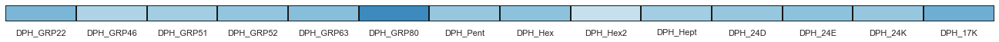


Black_Tetley


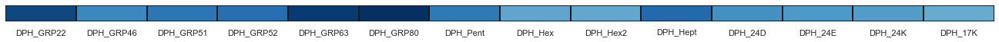


Black_Twinings


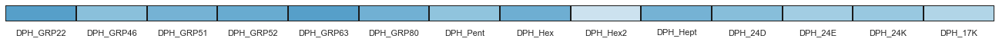


Black_Yorkshire


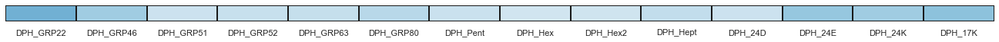


Green_Clipper


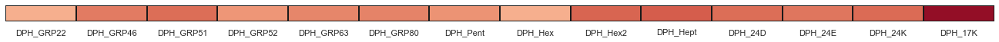


Green_Diplomat


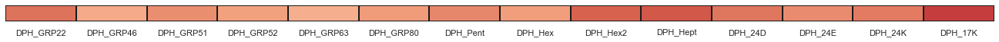


Green_Doubledragon


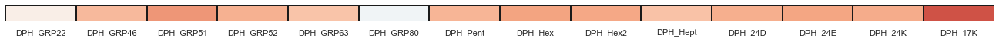


Green_Dragonfly


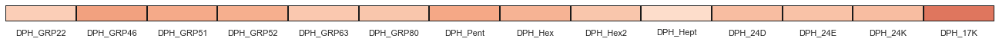


Green_Handb


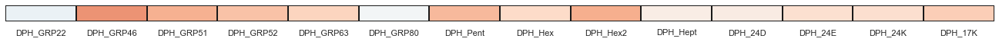


Green_Joes


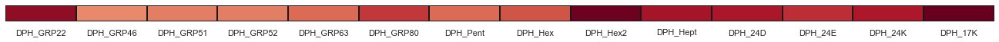


Green_Qi


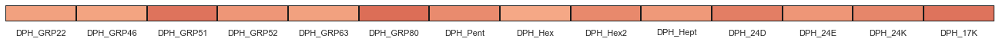


Green_Sainsburys


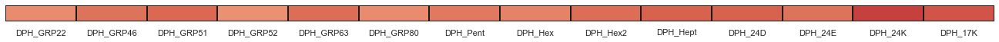


Green_Tetley


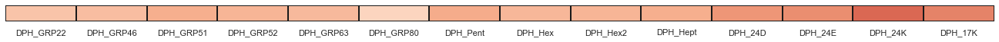


Green_Twinings


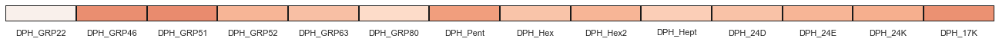


Grey_Asda


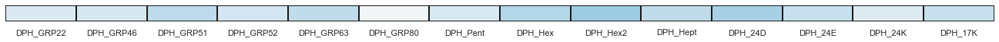


Grey_Clipper


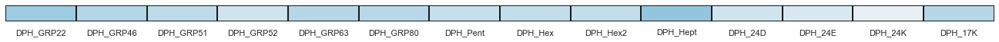


Grey_Coop


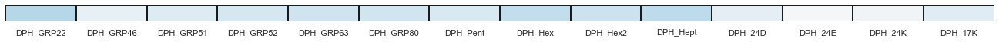


Grey_Devonshire


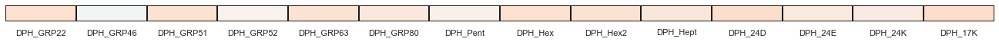


Grey_Diplomat


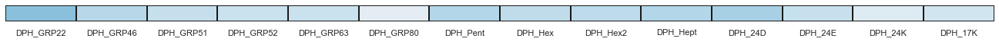


Grey_Joes


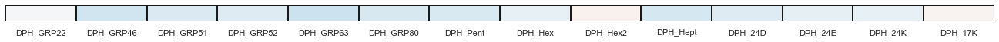


Grey_Mands


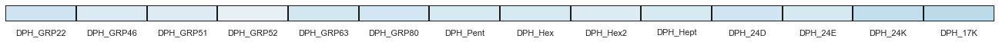


Grey_Pukka


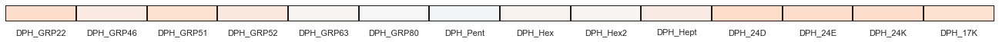


Grey_Tesco


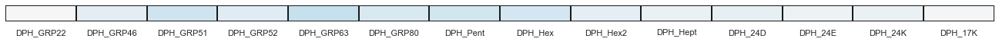


Grey_Twinings


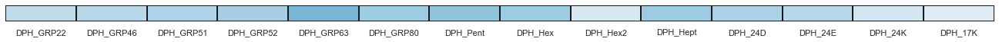




Original_data:



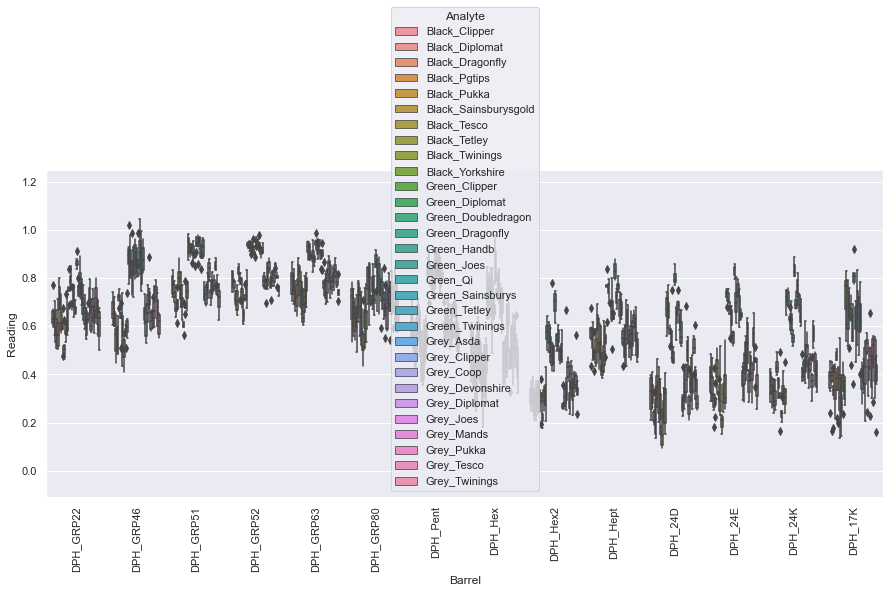

Black_Clipper


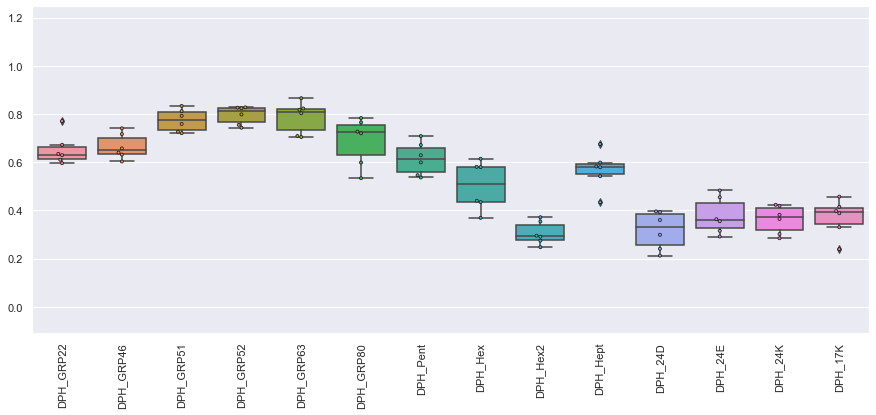

Black_Diplomat


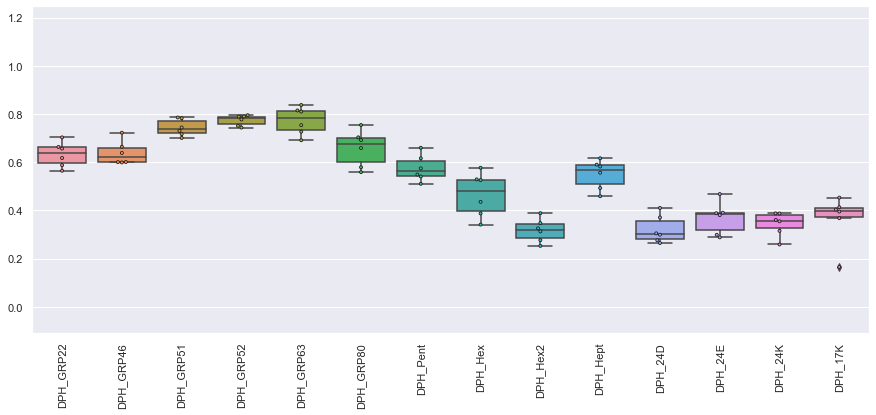

Black_Dragonfly


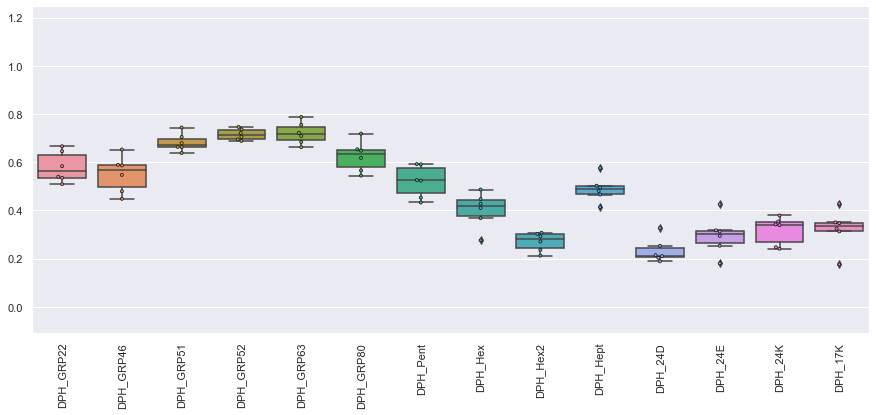

Black_Pgtips


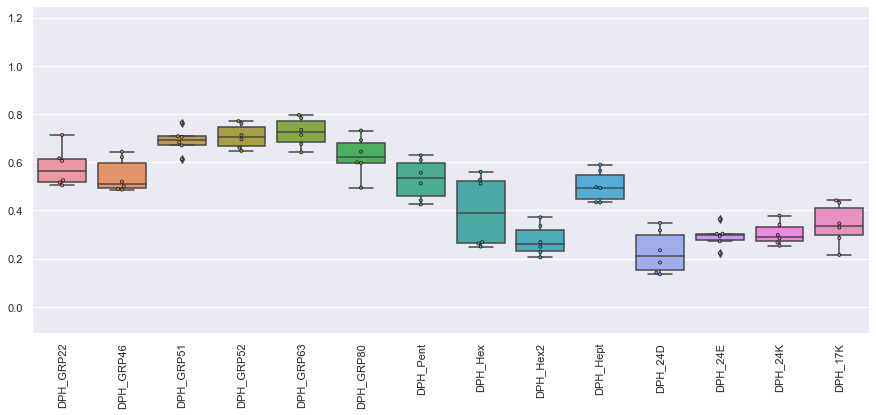

Black_Pukka


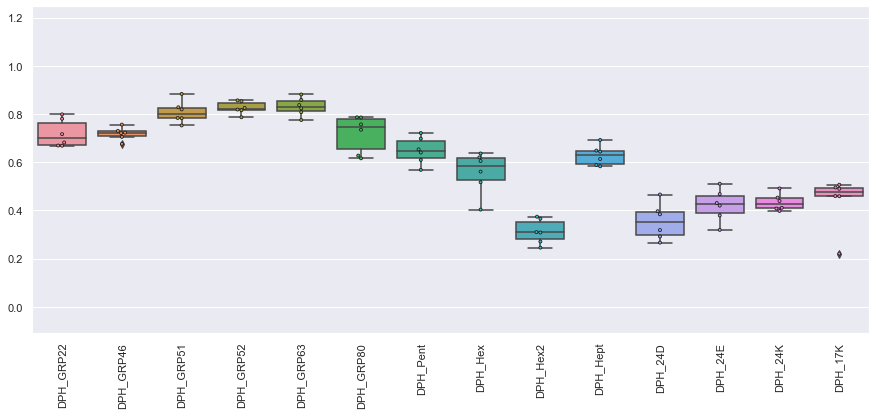

Black_Sainsburysgold


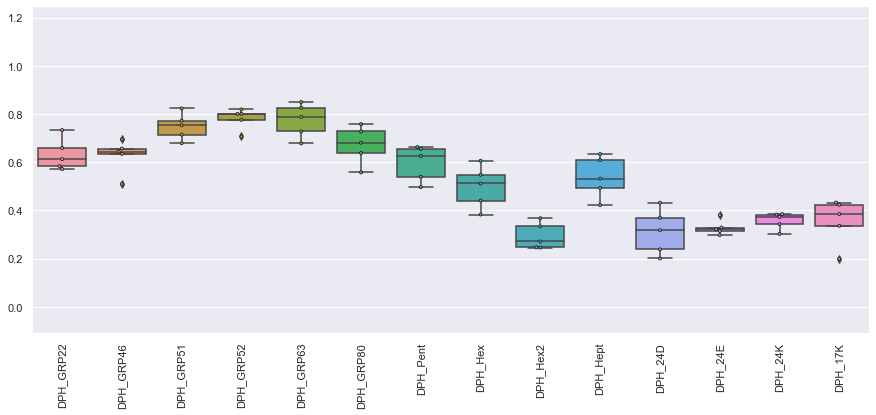

Black_Tesco


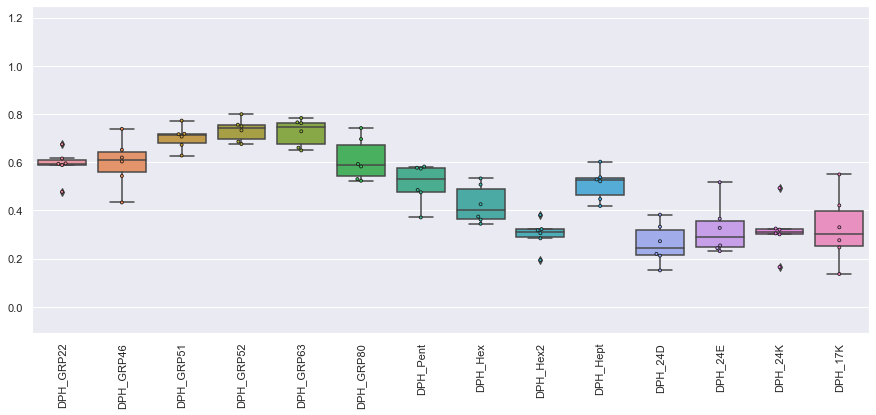

Black_Tetley


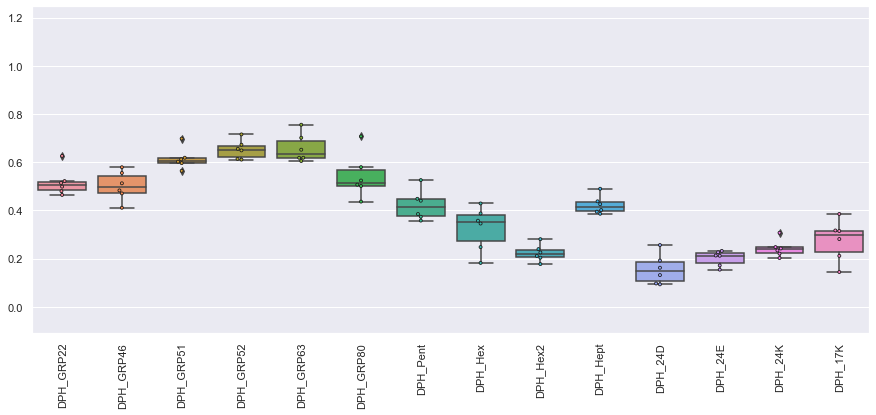

Black_Twinings


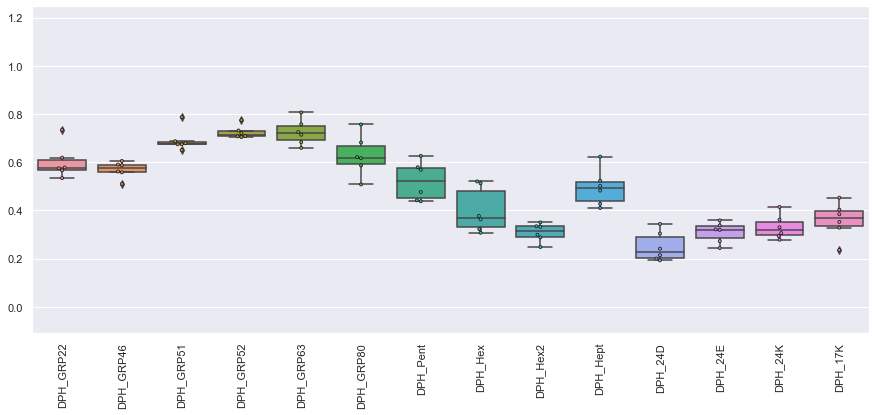

Black_Yorkshire


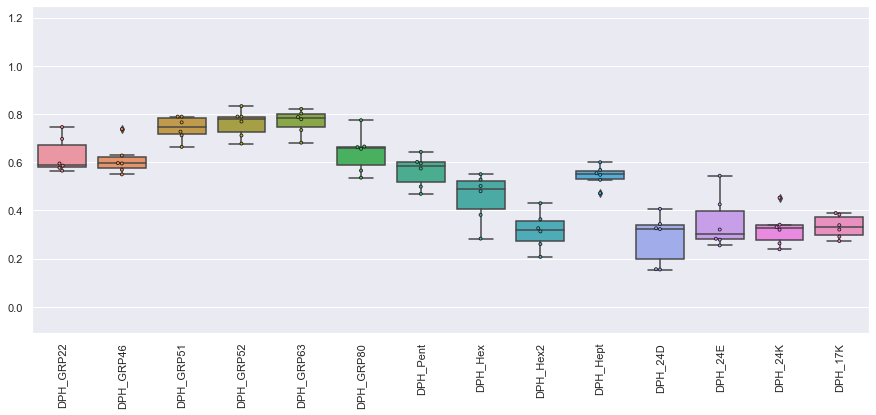

Green_Clipper


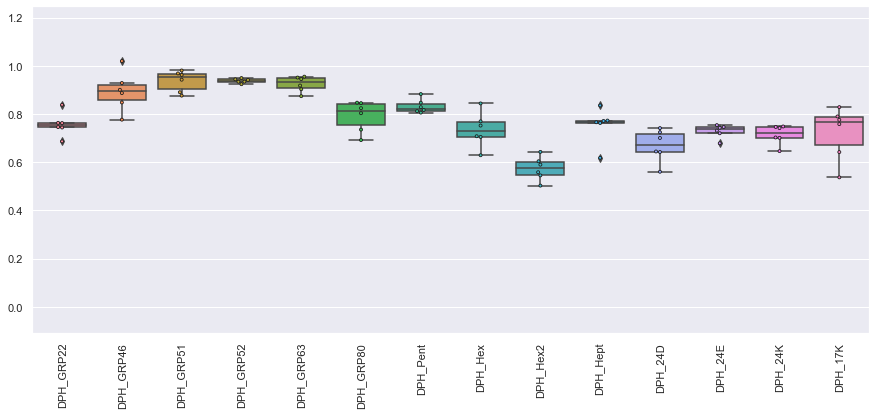

Green_Diplomat


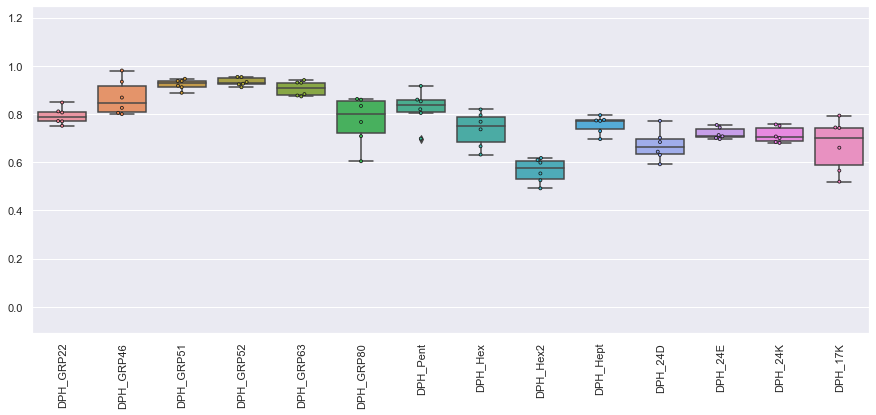

Green_Doubledragon


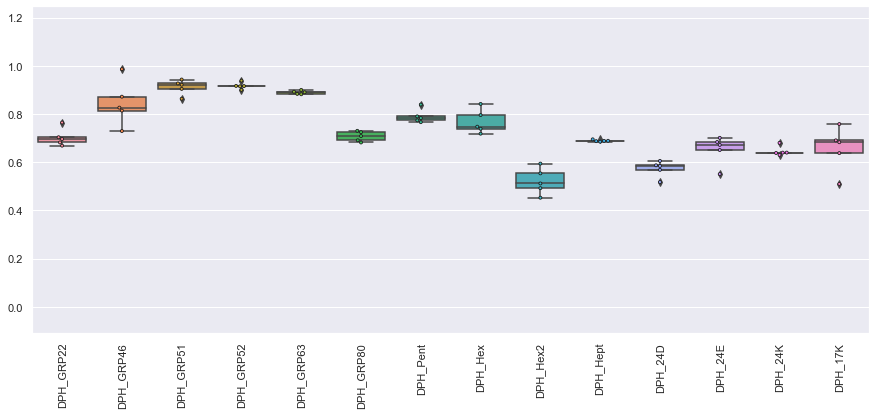

Green_Dragonfly


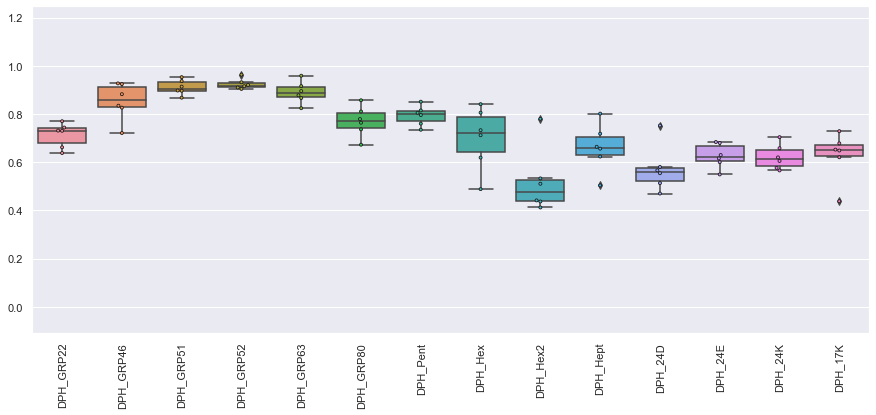

Green_Handb


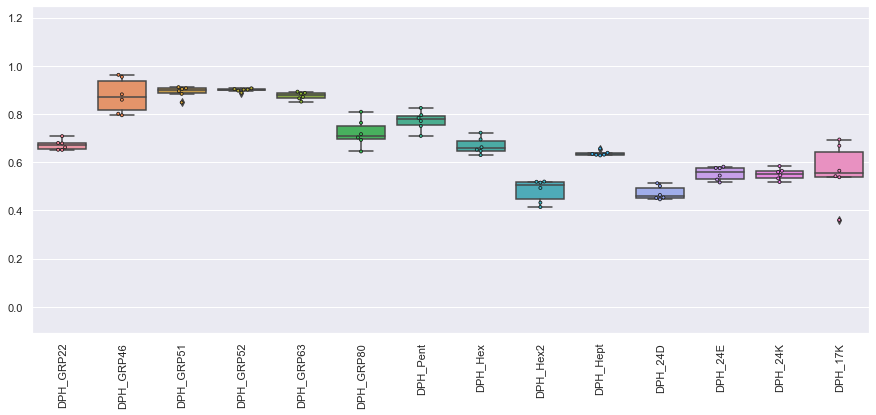

Green_Joes


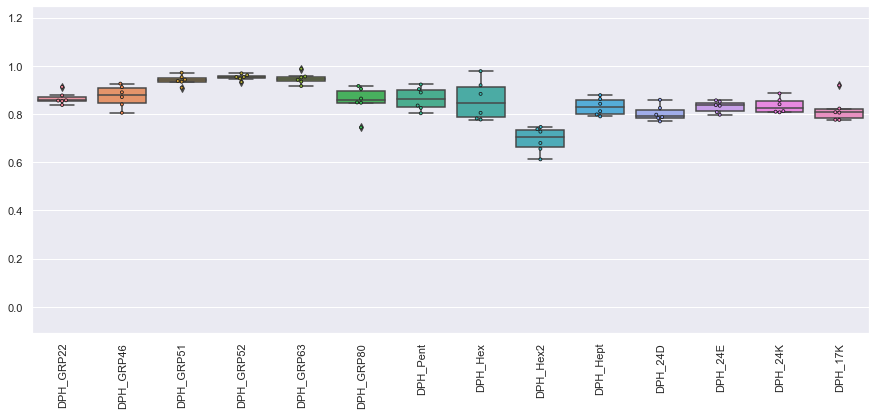

Green_Qi


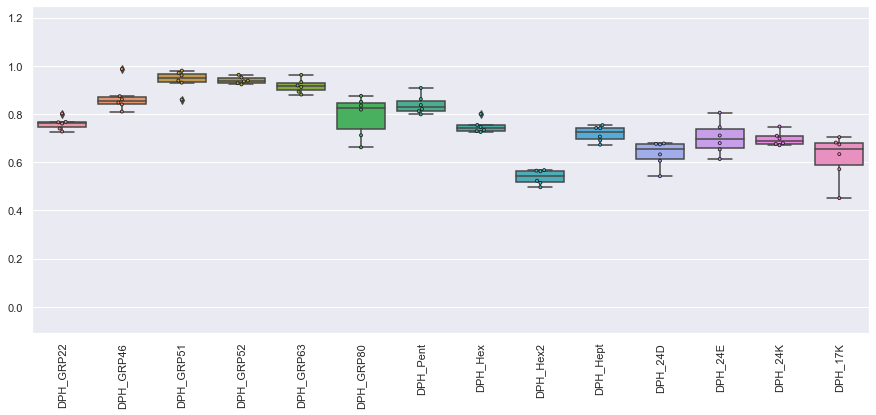

Green_Sainsburys


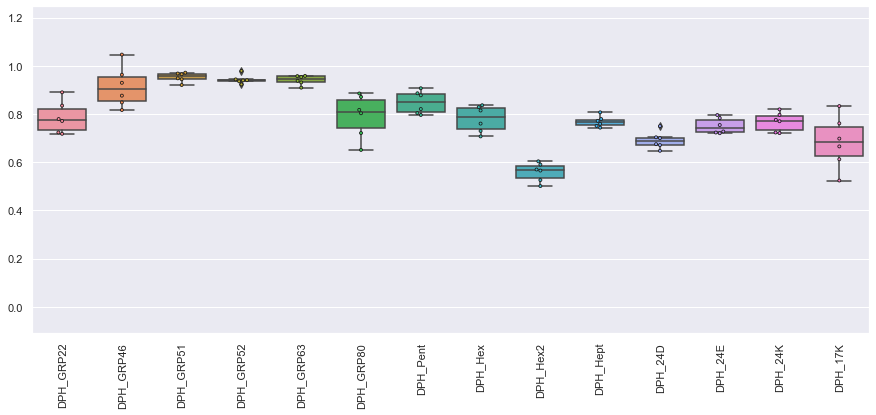

Green_Tetley


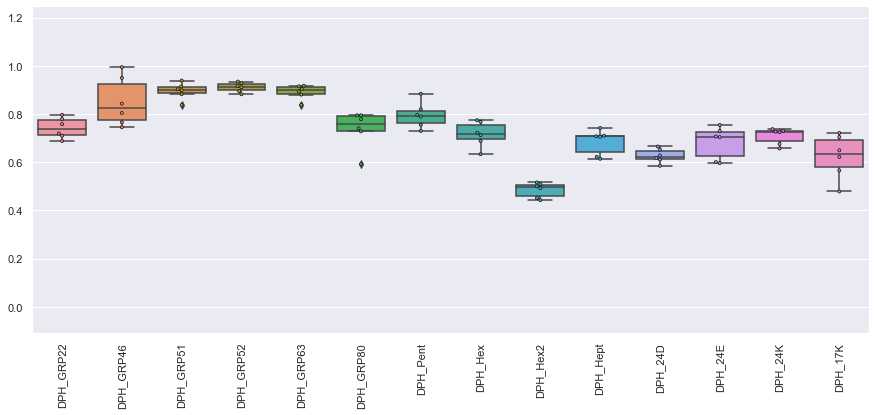

Green_Twinings


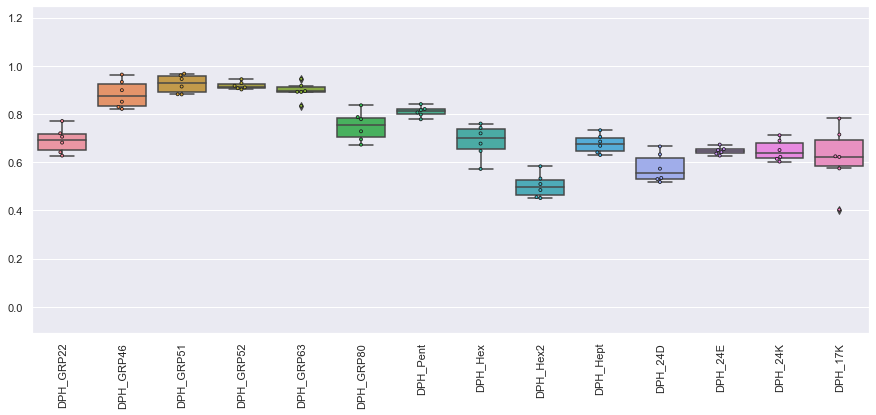

Grey_Asda


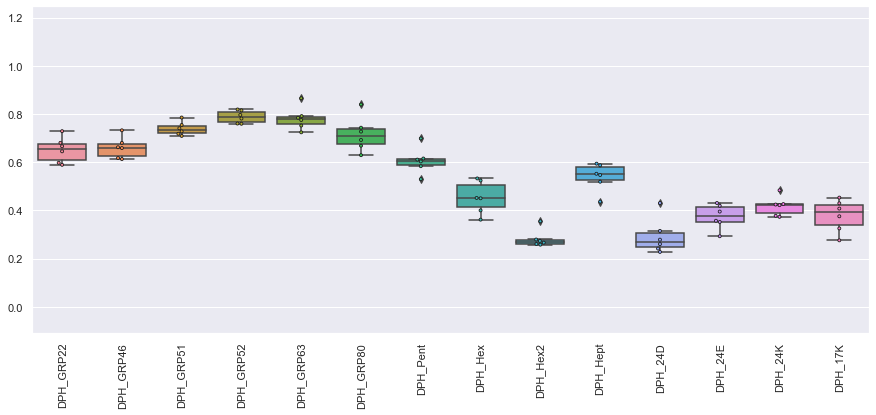

Grey_Clipper


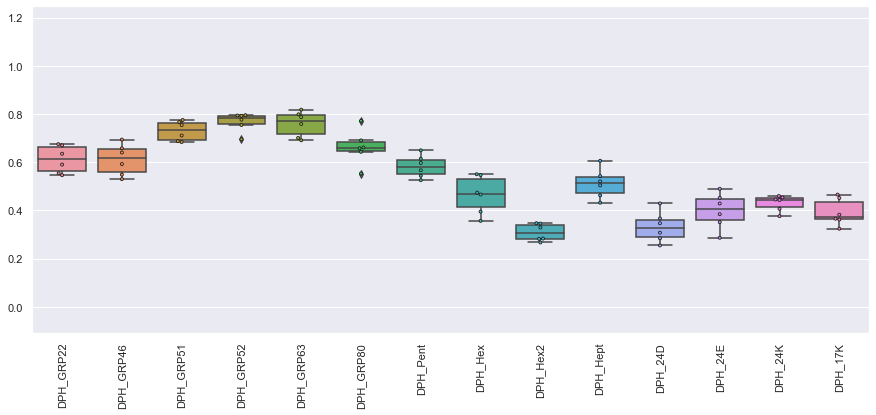

Grey_Coop


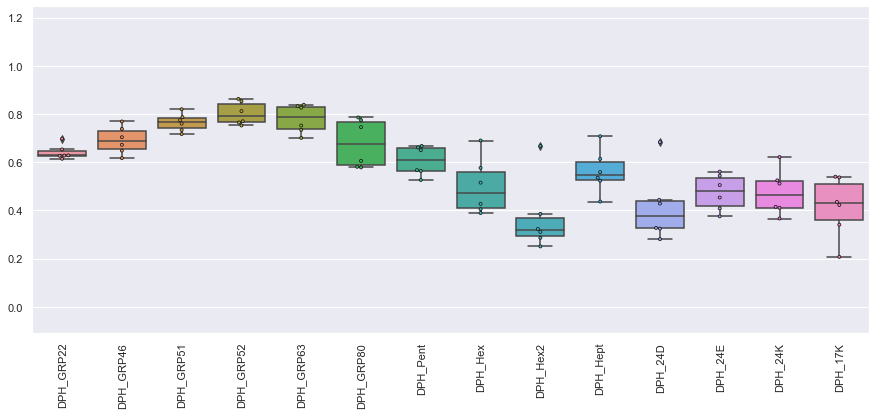

Grey_Devonshire


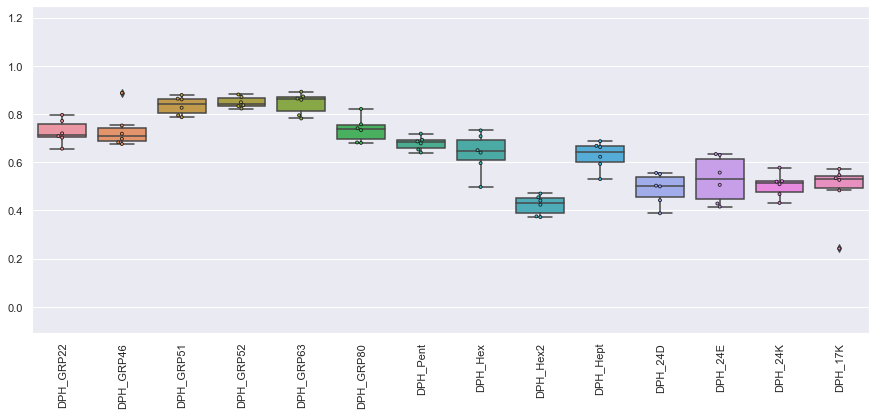

Grey_Diplomat


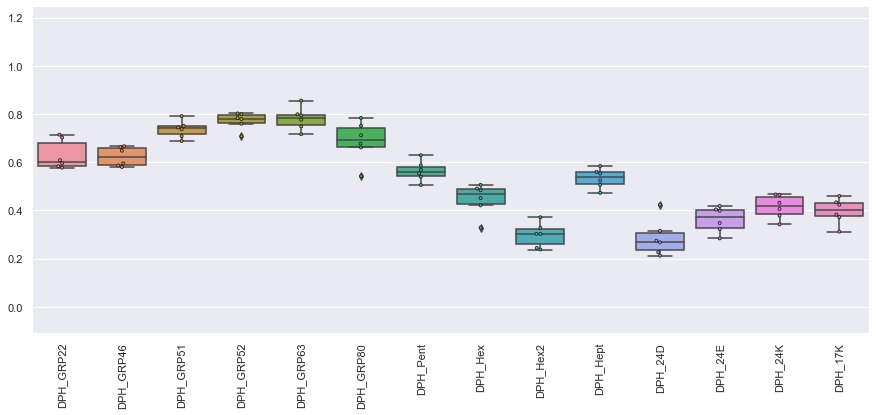

Grey_Joes


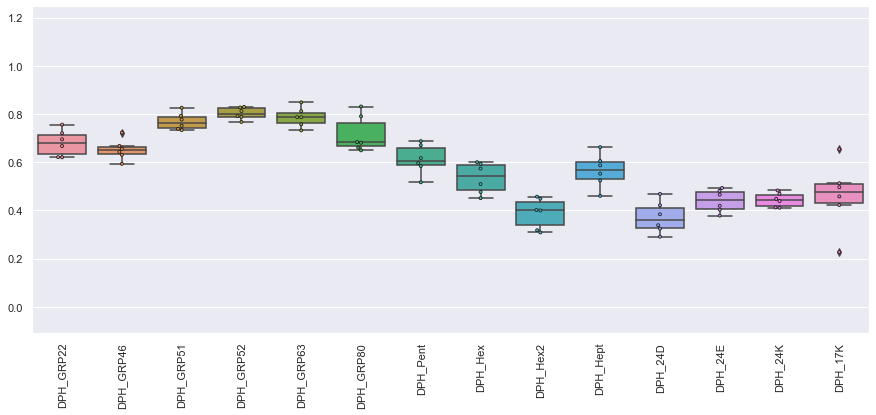

Grey_Mands


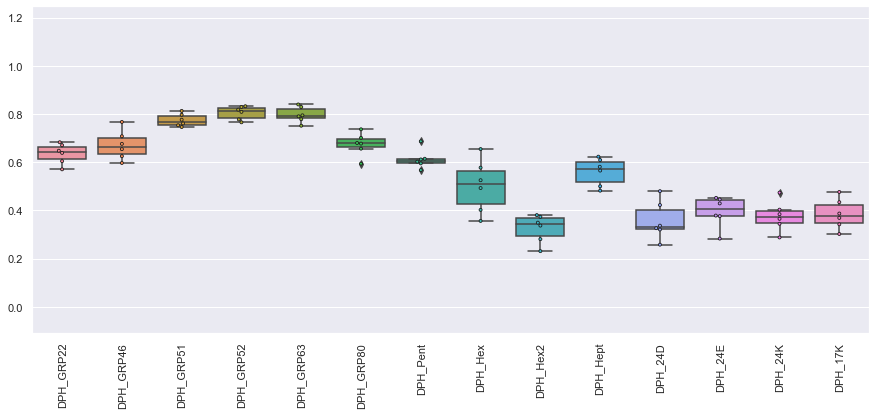

Grey_Pukka


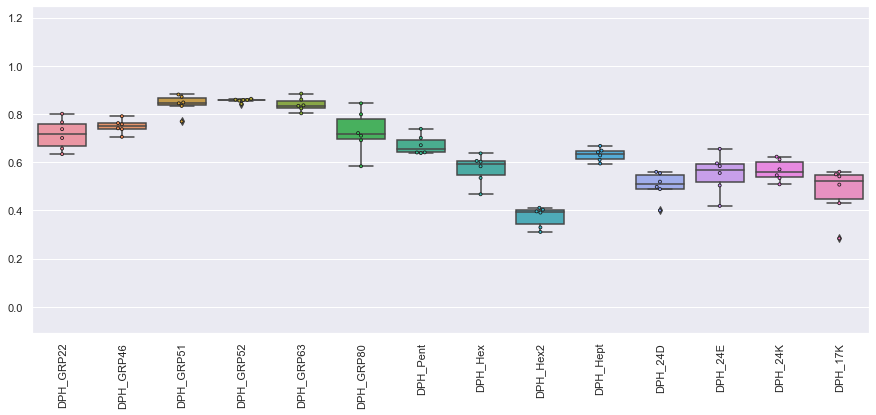

Grey_Tesco


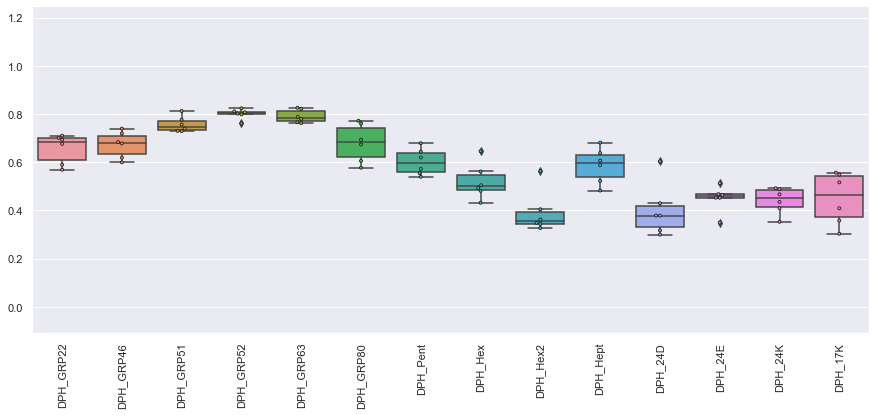

Grey_Twinings


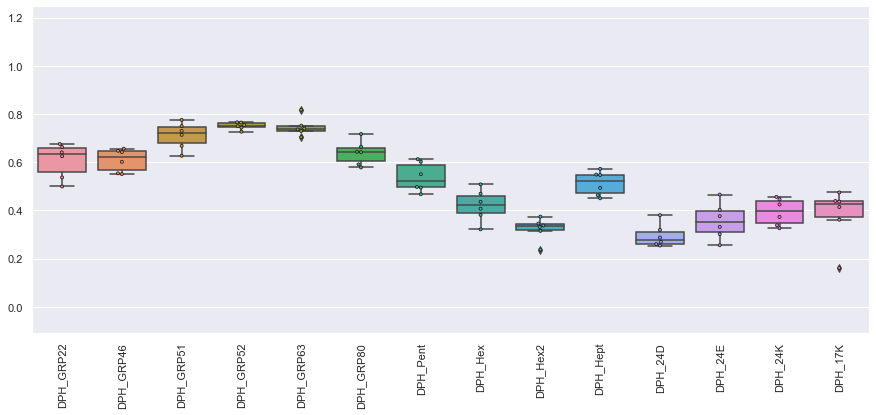




Scaled_data:



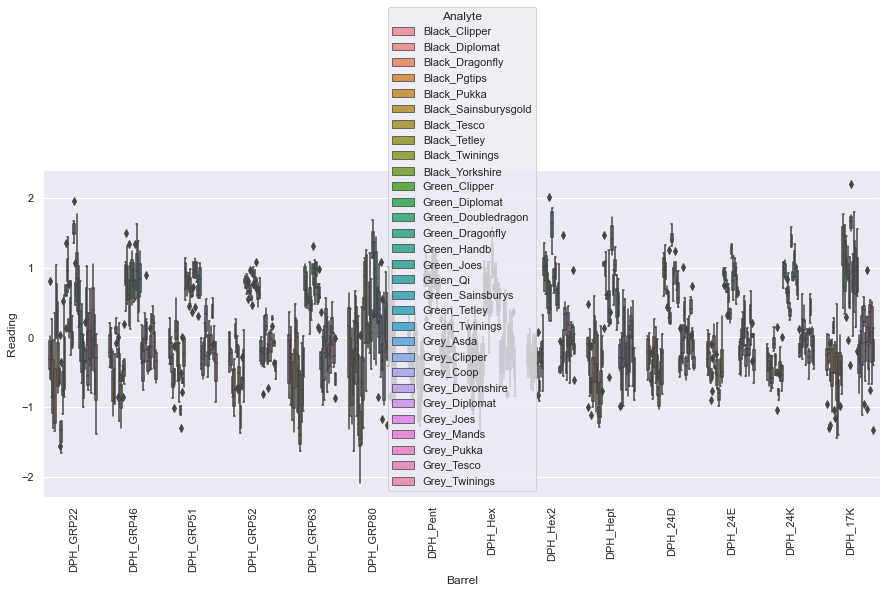

Black_Clipper


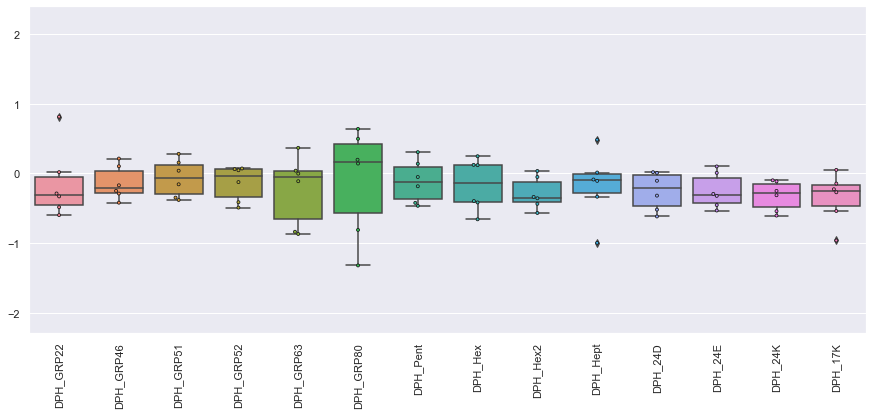

Black_Diplomat


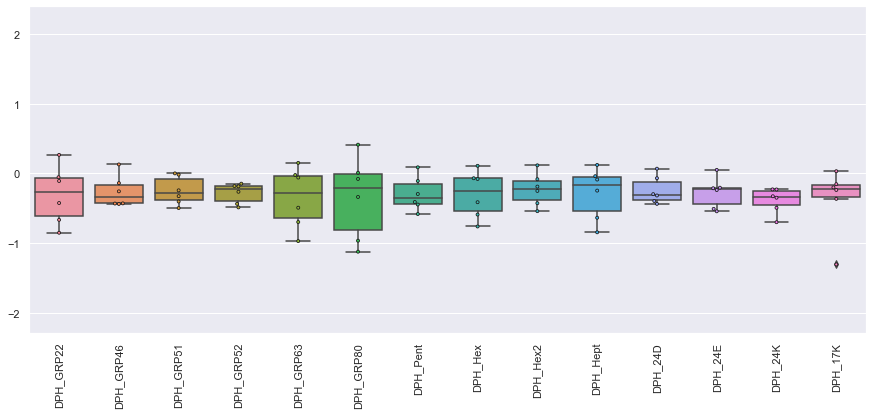

Black_Dragonfly


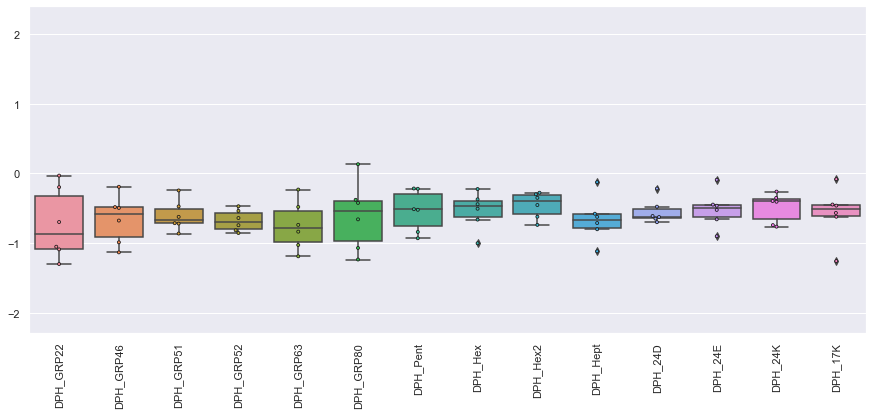

Black_Pgtips


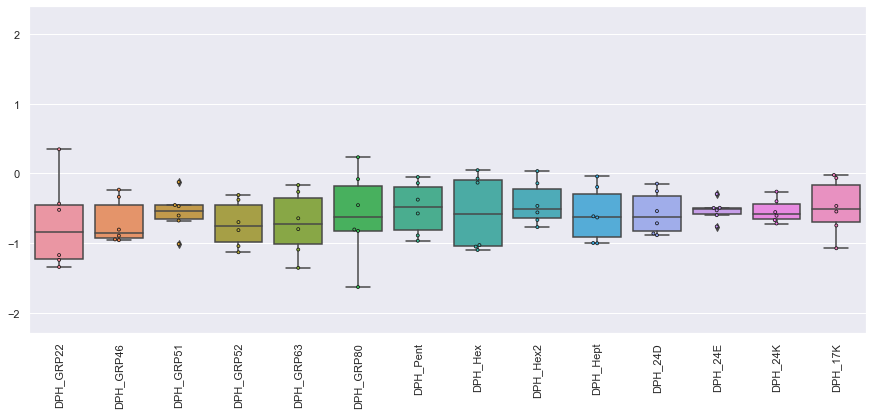

Black_Pukka


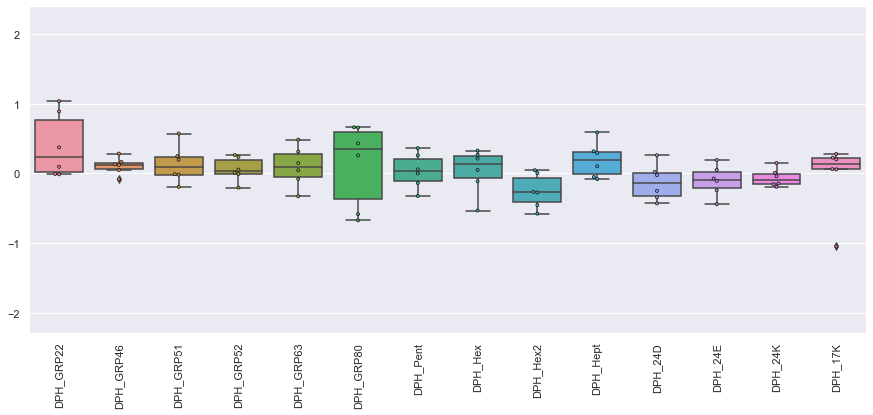

Black_Sainsburysgold


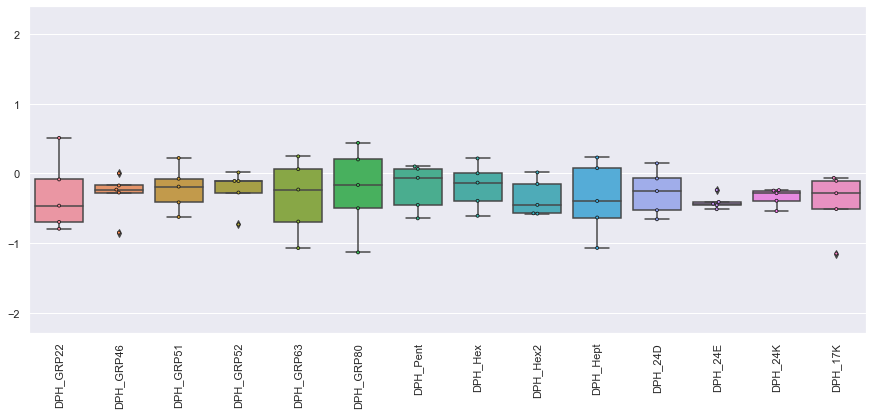

Black_Tesco


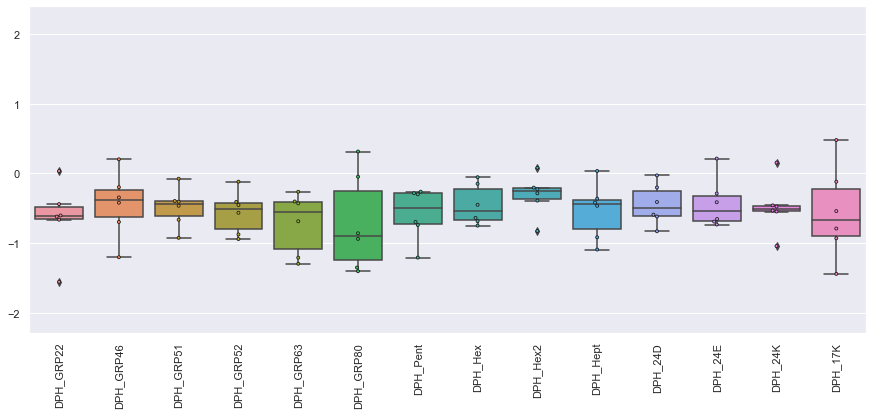

Black_Tetley


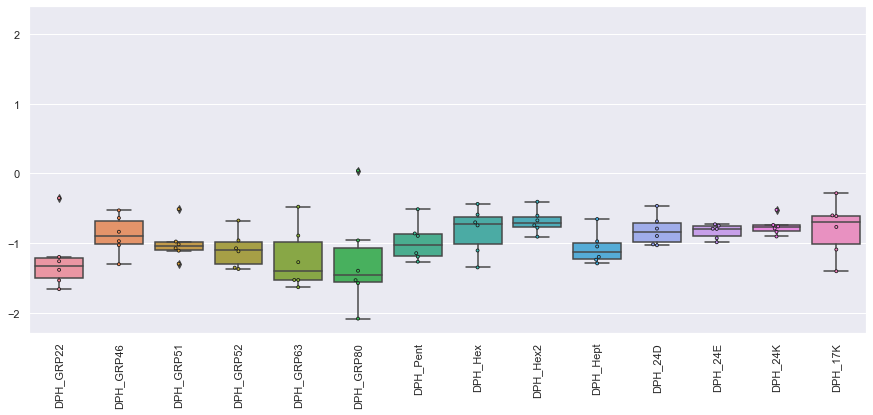

Black_Twinings


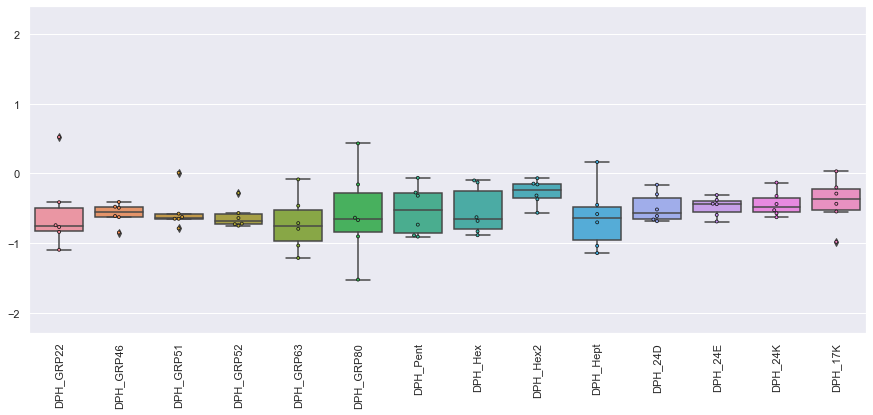

Black_Yorkshire


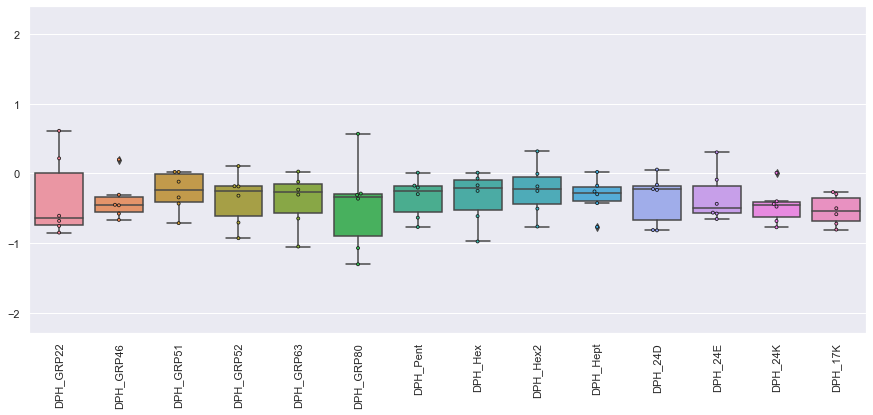

Green_Clipper


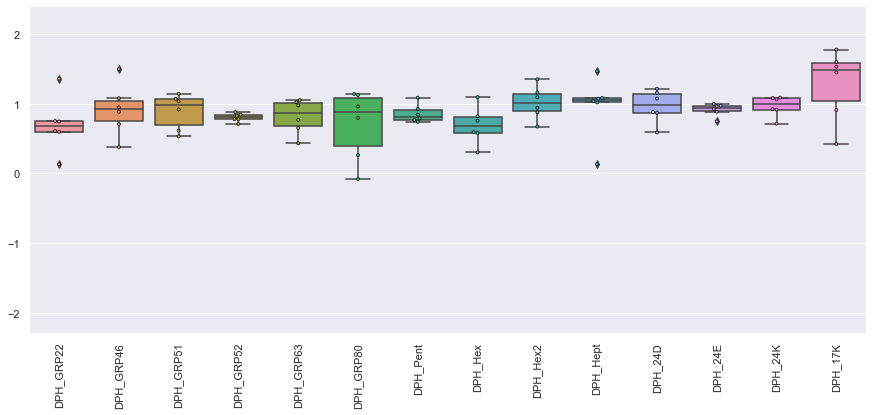

Green_Diplomat


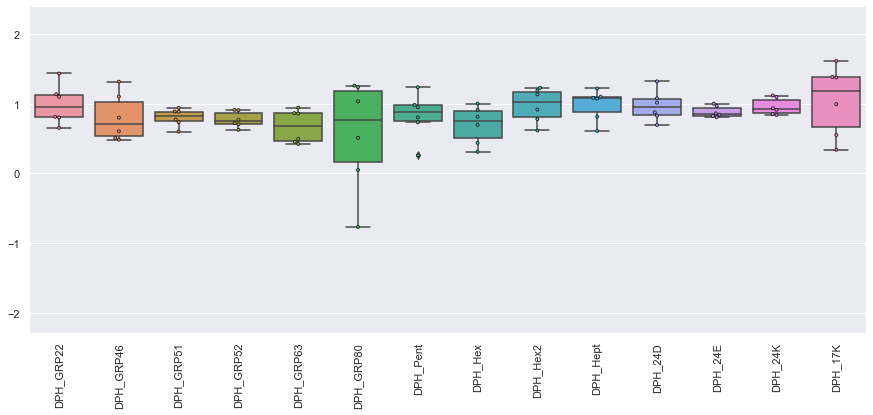

Green_Doubledragon


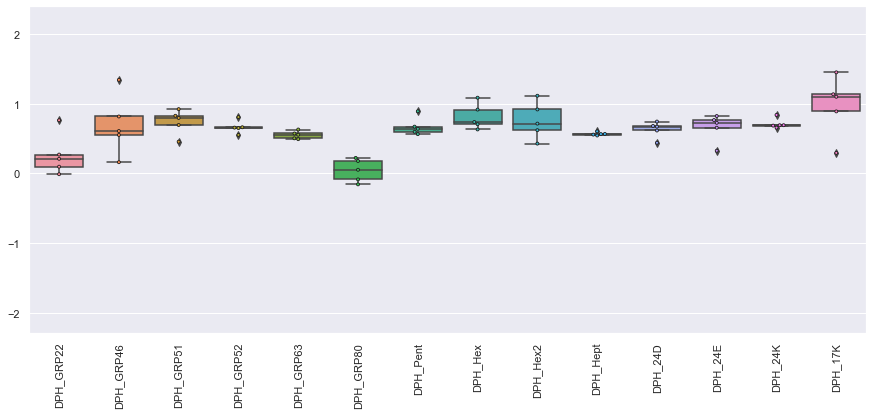

Green_Dragonfly


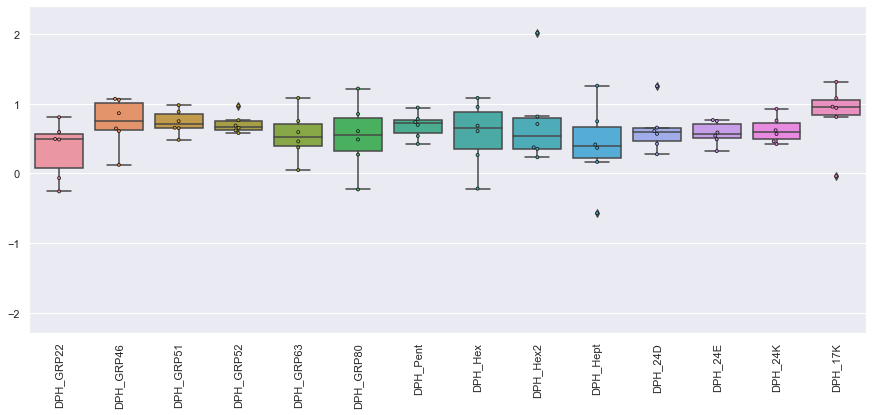

Green_Handb


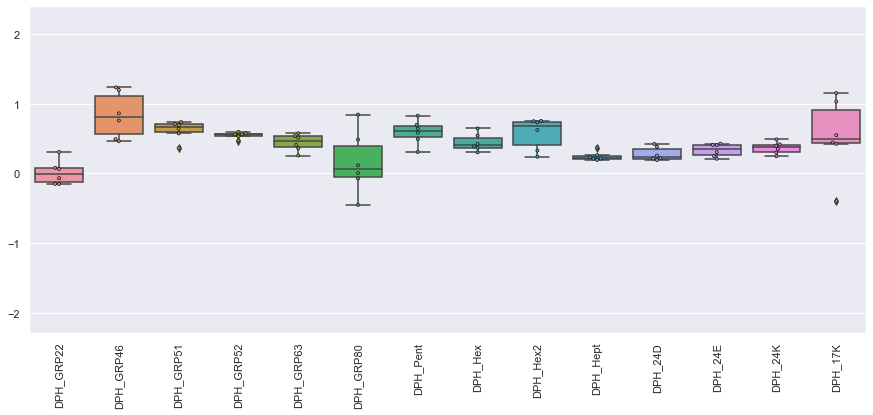

Green_Joes


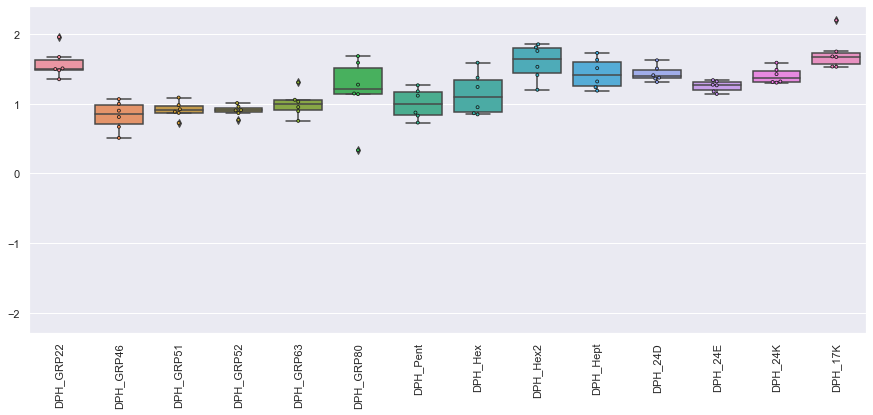

Green_Qi


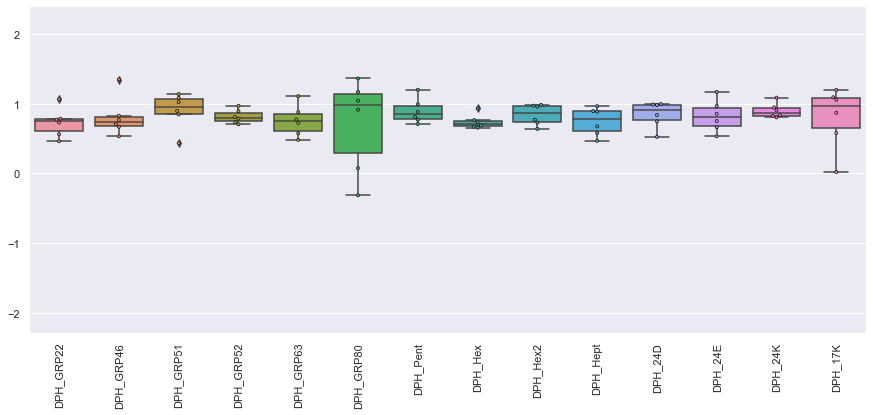

Green_Sainsburys


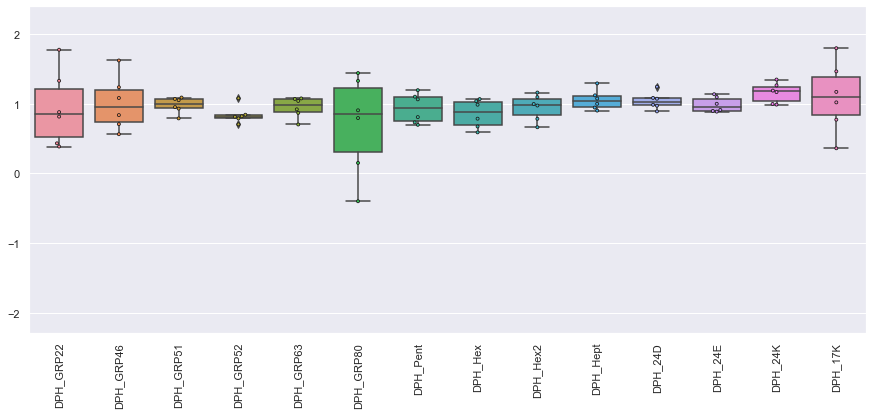

Green_Tetley


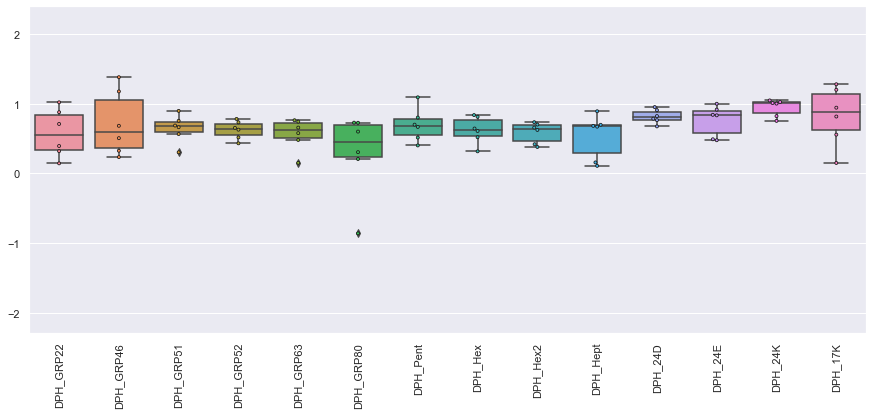

Green_Twinings


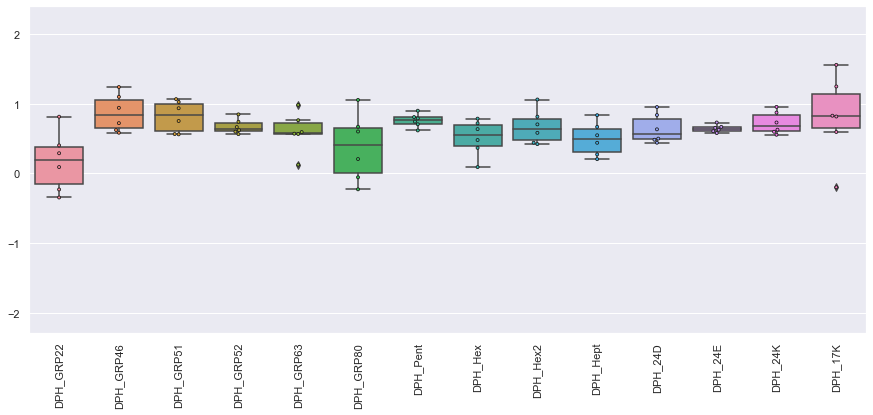

Grey_Asda


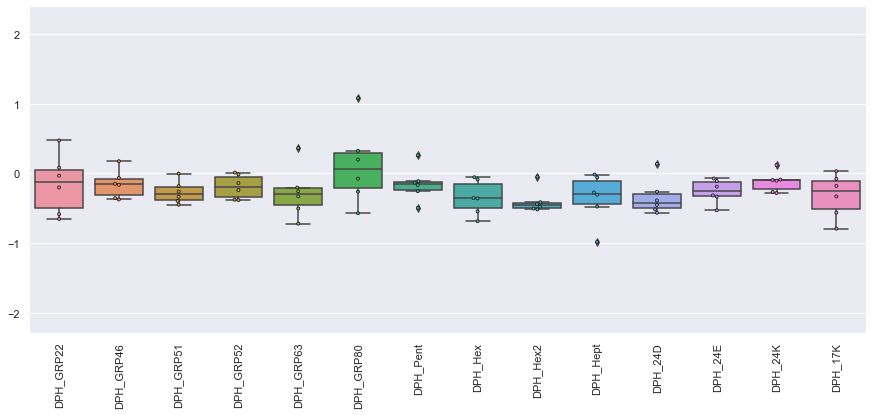

Grey_Clipper


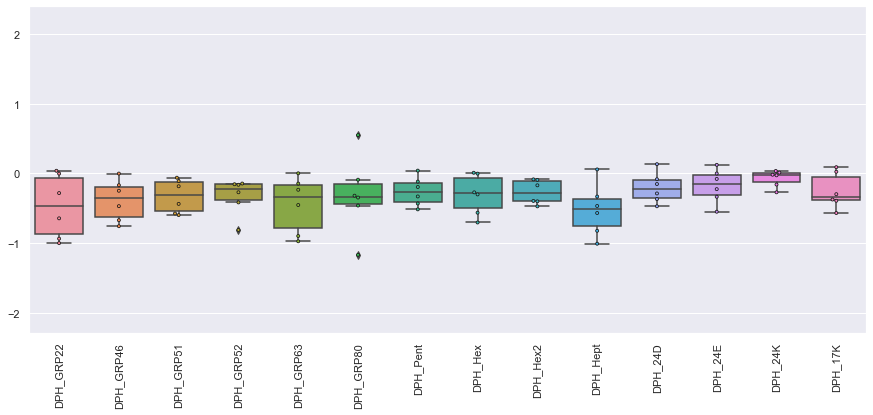

Grey_Coop


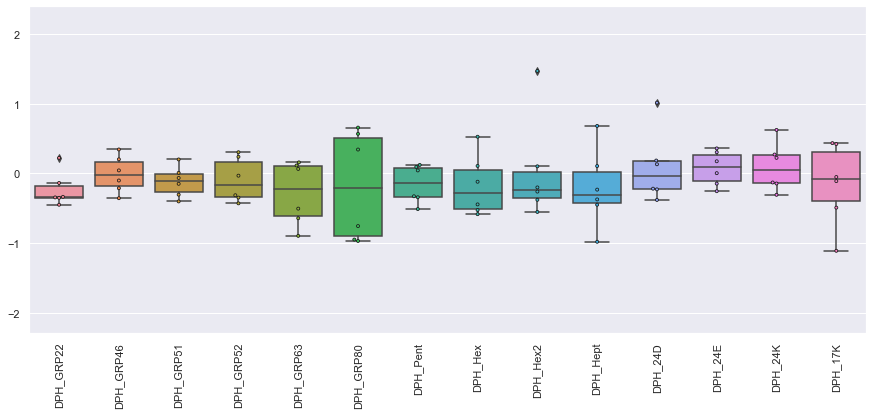

Grey_Devonshire


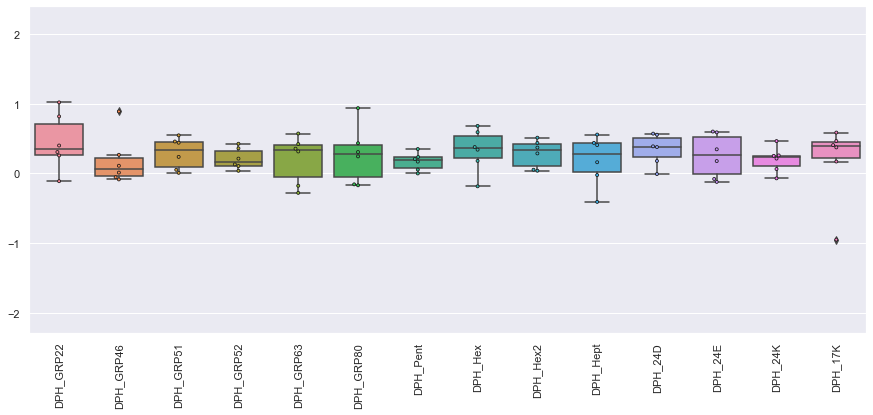

Grey_Diplomat


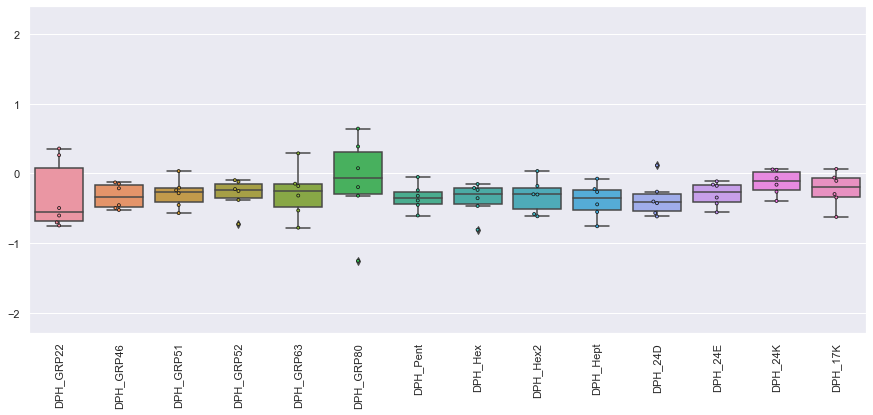

Grey_Joes


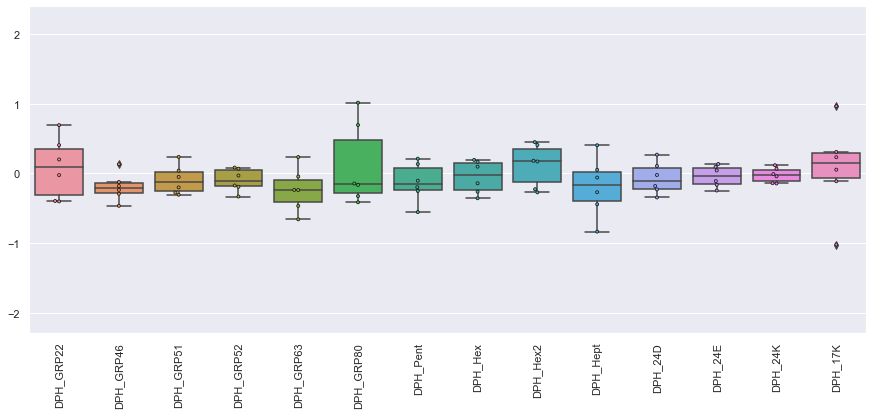

Grey_Mands


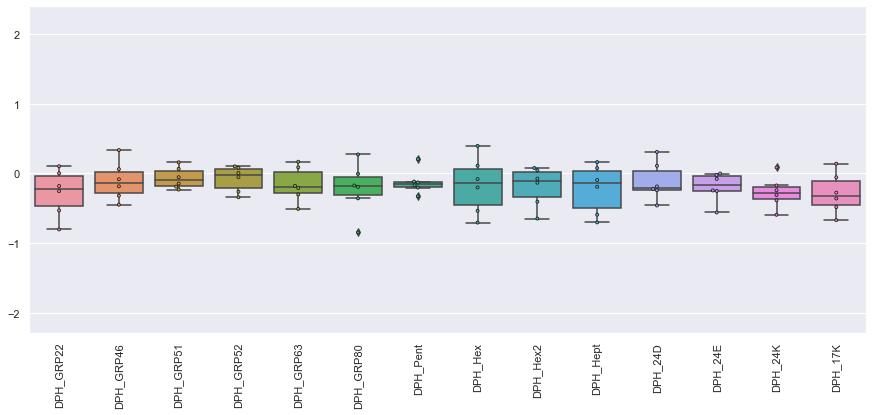

Grey_Pukka


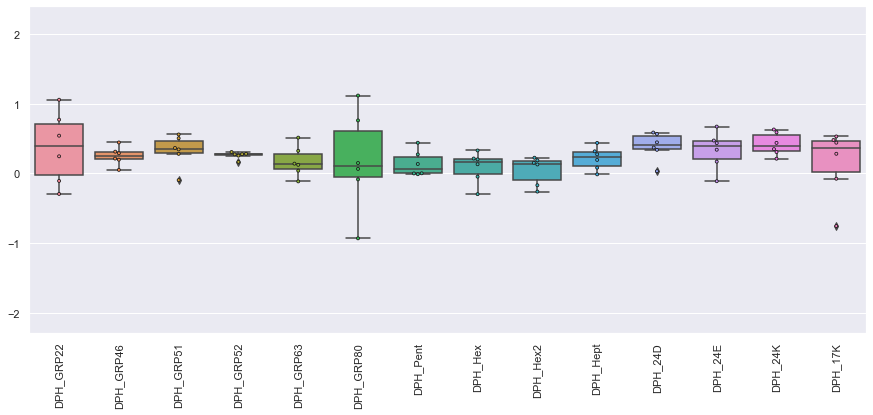

Grey_Tesco


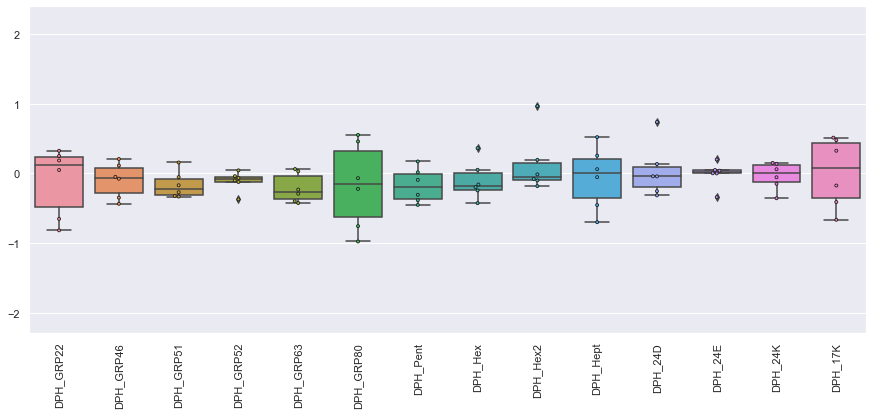

Grey_Twinings


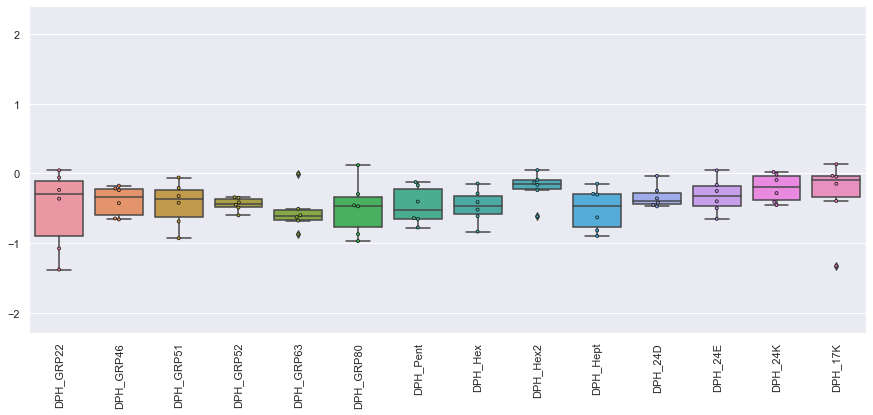

In [8]:
plot_dir = '/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_analysis_standard_array/Tea_subclasses'
if os.path.isdir(plot_dir):
    shutil.rmtree(plot_dir)
os.mkdir(plot_dir)

tea_fluor_data.display_data_distribution(prefix='Tea_subclasses', results_dir=plot_dir)

- When looking at the scaled data, there are no peptides that (by eye) obviously have a much larger overlap between classes as compared to the others => will not discard any peptides prior to ML analysis.
- There is a clear separation between the readings for the different classes (black, green and grey) for most of the peptides. This difference is clearer in the box plots below.

In [9]:
orig_ml_fluor_data = copy.deepcopy(tea_fluor_data.ml_fluor_data)

In [10]:
tea_fluor_data.ml_fluor_data['Sub_analyte'] = copy.deepcopy(
    tea_fluor_data.ml_fluor_data['Analyte'].tolist()
)
tea_fluor_data.ml_fluor_data['Analyte'] = [
    sub_analyte.split('_')[0] for sub_analyte in tea_fluor_data.ml_fluor_data['Sub_analyte'].tolist()
]

In [11]:
tea_fluor_data.ml_fluor_data

,DPH_GRP22,DPH_GRP46,DPH_GRP51,DPH_GRP52,DPH_GRP63,DPH_GRP80,DPH_Pent,DPH_Hex,DPH_Hex2,DPH_Hept,DPH_24D,DPH_24E,DPH_24K,DPH_17K,Analyte,Sub_analyte
0,0.770833,0.740506,0.833402,0.826160,0.865524,0.783126,0.708304,0.579495,0.371518,0.675242,0.392812,0.363492,0.418844,0.397297,Black,Black_Clipper
1,0.609858,0.657056,0.758733,0.827553,0.822795,0.765054,0.671219,0.614158,0.353727,0.578904,0.395564,0.315192,0.423071,0.414861,Black,Black_Clipper
2,0.629071,0.639836,0.811886,0.823772,0.817308,0.726695,0.599096,0.580502,0.290787,0.598415,0.360077,0.482610,0.364503,0.457071,Black,Black_Clipper
3,0.672202,0.716471,0.792045,0.798166,0.803099,0.719799,0.628737,0.439975,0.294794,0.582105,0.298486,0.454646,0.381460,0.330124,Black,Black_Clipper
4,0.595809,0.631378,0.726129,0.743110,0.708506,0.533542,0.545902,0.368947,0.247321,0.541889,0.212210,0.291503,0.284471,0.387989,Black,Black_Clipper
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,0.536609,0.550725,0.626597,0.726449,0.739340,0.663978,0.497152,0.469164,0.314888,0.493544,0.287103,0.255387,0.325865,0.414155,Grey,Grey_Twinings
174,0.499031,0.553648,0.667708,0.743179,0.729430,0.643352,0.466987,0.321256,0.237205,0.450170,0.253987,0.331324,0.338234,0.438871,Grey,Grey_Twinings
175,0.675419,0.655930,0.775342,0.764359,0.751502,0.578219,0.494607,0.406853,0.345350,0.572141,0.318987,0.465430,0.424531,0.361179,Grey,Grey_Twinings
176,0.662545,0.641927,0.729803,0.754484,0.735942,0.590698,0.612460,0.381349,0.330478,0.546958,0.260175,0.376118,0.446114,0.474494,Grey,Grey_Twinings





Original_data:


Black


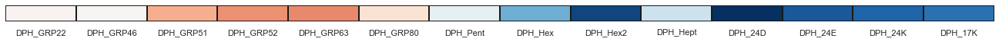


Green


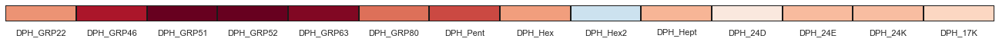


Grey


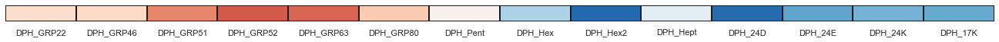




Scaled_data:


Black


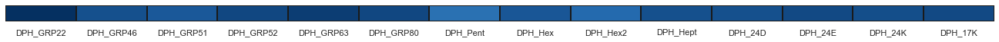


Green


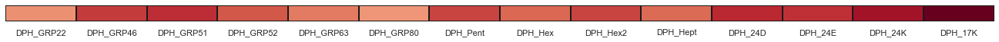


Grey


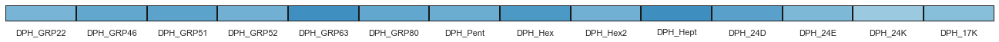




Original_data:



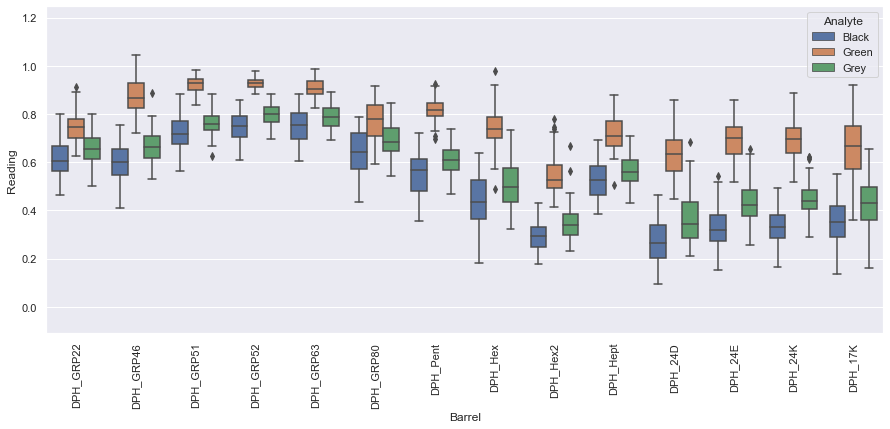

Black


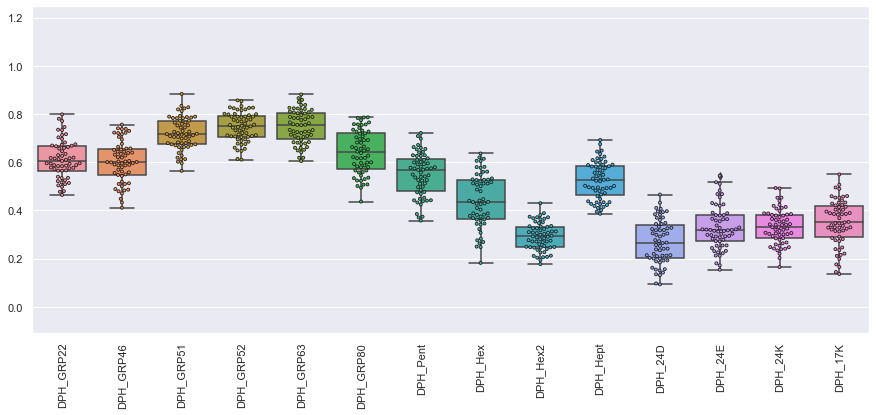

Green


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 13.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 6.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


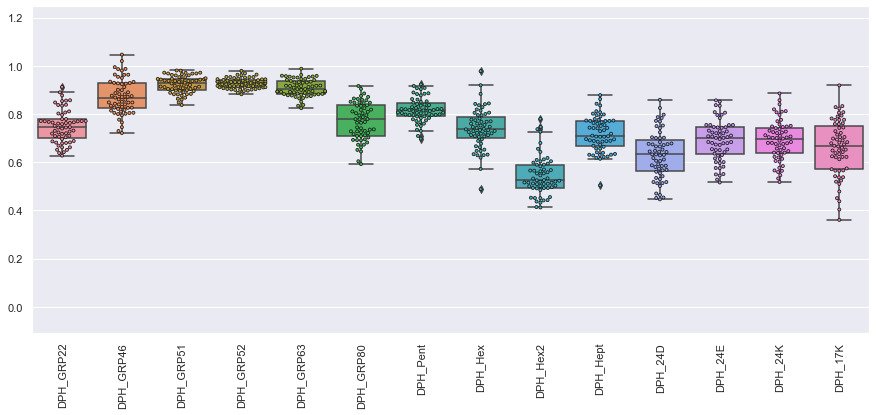

Grey


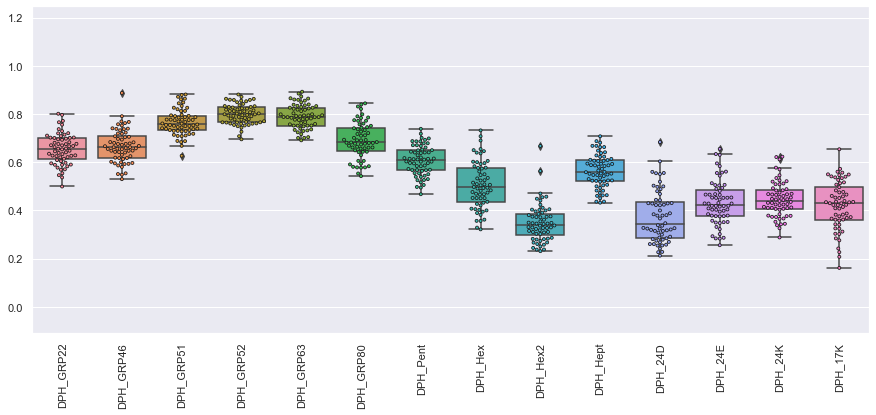




Scaled_data:



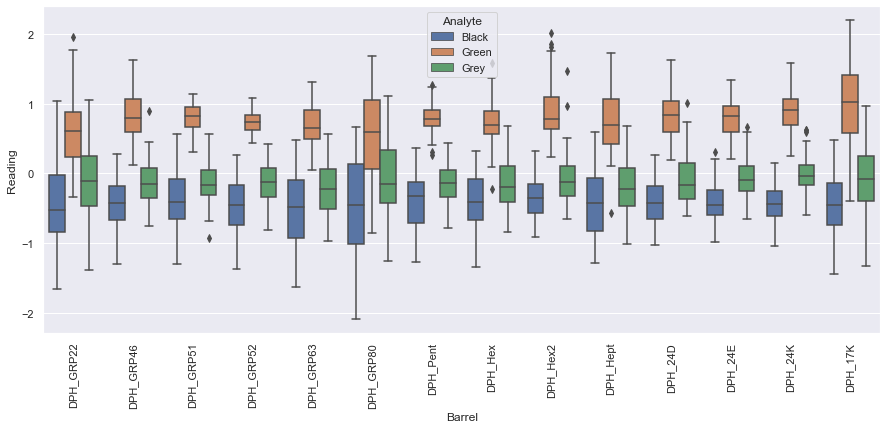

Black


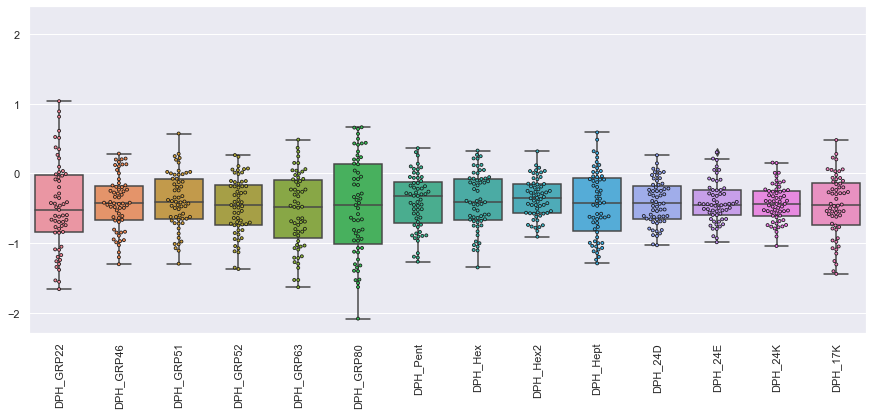

Green


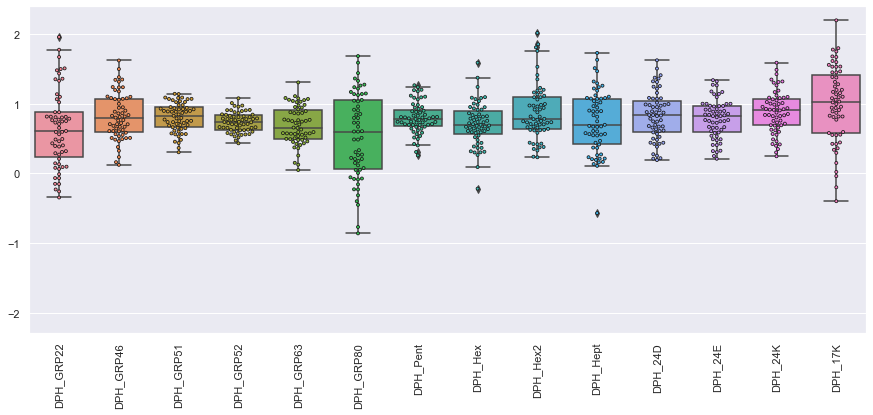

Grey


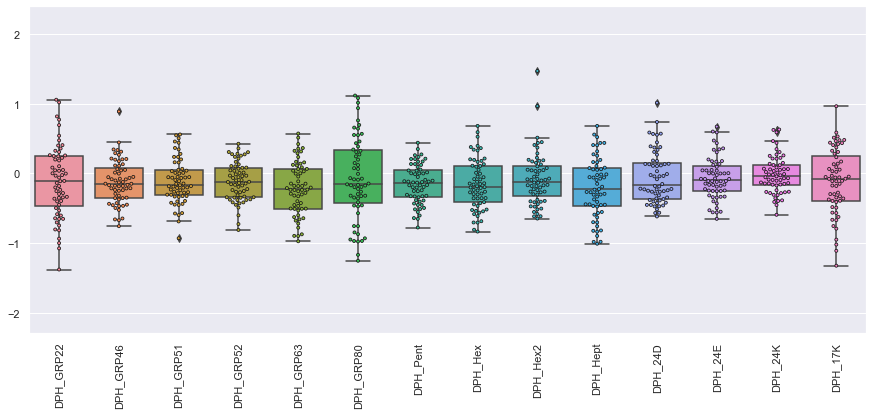

In [12]:
plot_dir = '/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_analysis_standard_array/Tea_classes'
if os.path.isdir(plot_dir):
    shutil.rmtree(plot_dir)
os.mkdir(plot_dir)

tea_fluor_data.display_data_distribution(
    ml_fluor_data=tea_fluor_data.ml_fluor_data.drop(['Sub_analyte'], axis=1), results_dir=plot_dir,
    prefix='Tea_classes'
)

Even by eye there is a clear difference in the readings for the three classes, especially the green tea (which makes sense when one considers that grey tea is black tea plus bergamot, whereas green tea is chemically more different).

#### ML analysis

In [13]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Tea_analysis_standard_array/Tea_ML_plots',
    fluor_data=tea_fluor_data.ml_fluor_data.drop(['Analyte', 'Sub_analyte'], axis=1),
    classes=tea_fluor_data.ml_fluor_data['Analyte'].tolist(),
    subclasses=tea_fluor_data.ml_fluor_data['Sub_analyte'].tolist(), shuffle=True
)

- Calculate feature correlations

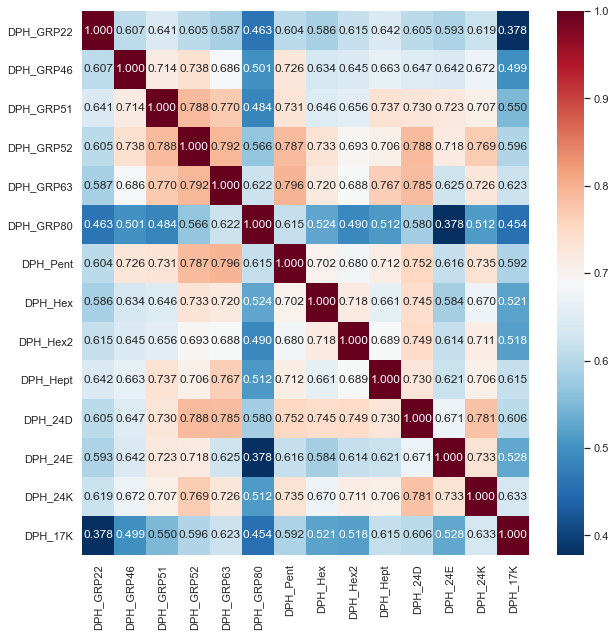

In [14]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

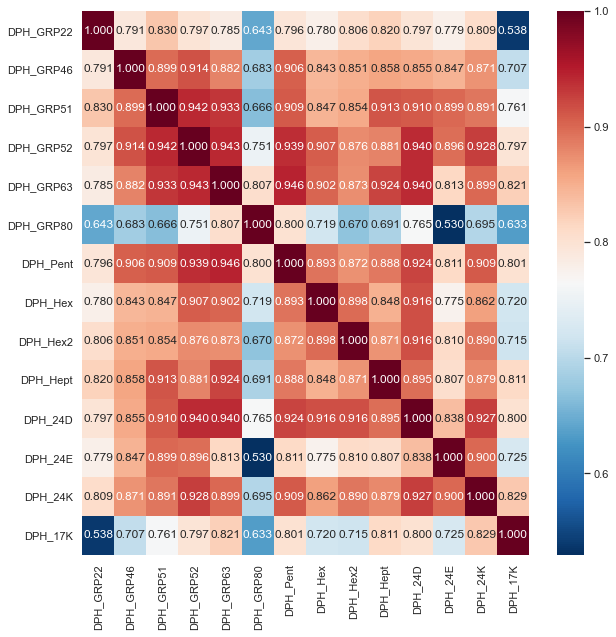

In [15]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

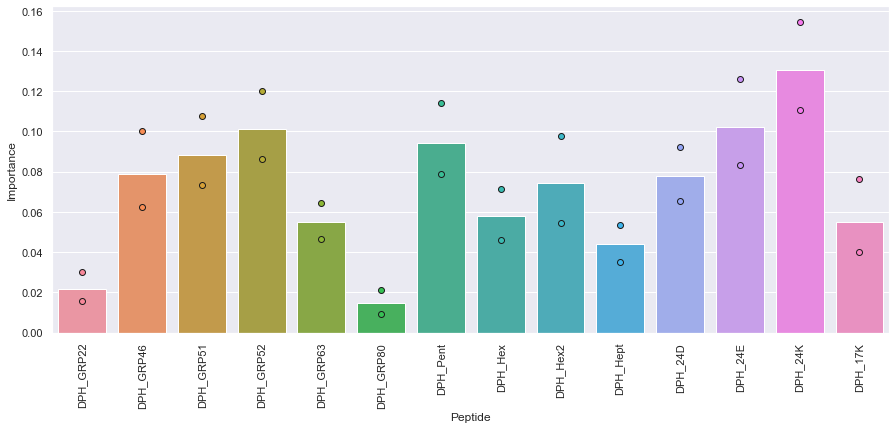

<Figure size 720x720 with 0 Axes>

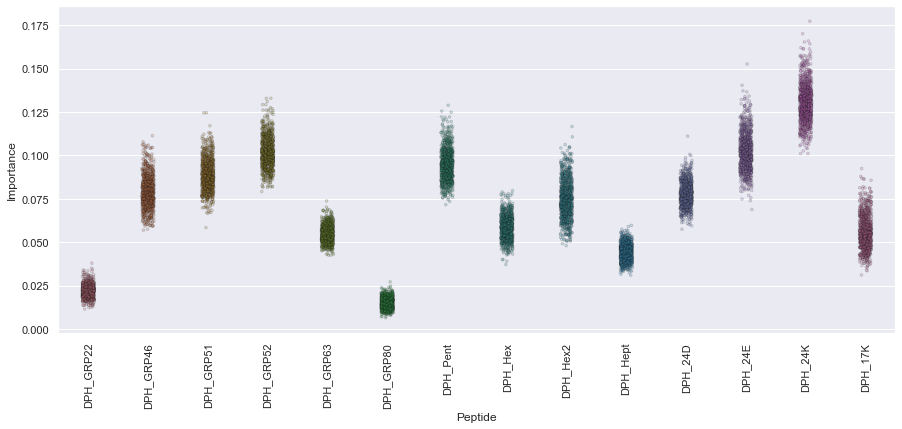

In [16]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [17]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score
0,DPH_24K,0.130283
1,DPH_24E,0.101935
2,DPH_GRP52,0.101034
3,DPH_Pent,0.094071
4,DPH_GRP51,0.088095
5,DPH_GRP46,0.078588
6,DPH_24D,0.077909
7,DPH_Hex2,0.074512
8,DPH_Hex,0.058078
9,DPH_17K,0.054758


KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another.

This analysis indicates that many of the peptides provide substantial information about analyte class. 24K, 24E and GRP52 are the three peptides found to provide the most information by this analysis, whilst GRP22 and GRP80 provide the least.

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

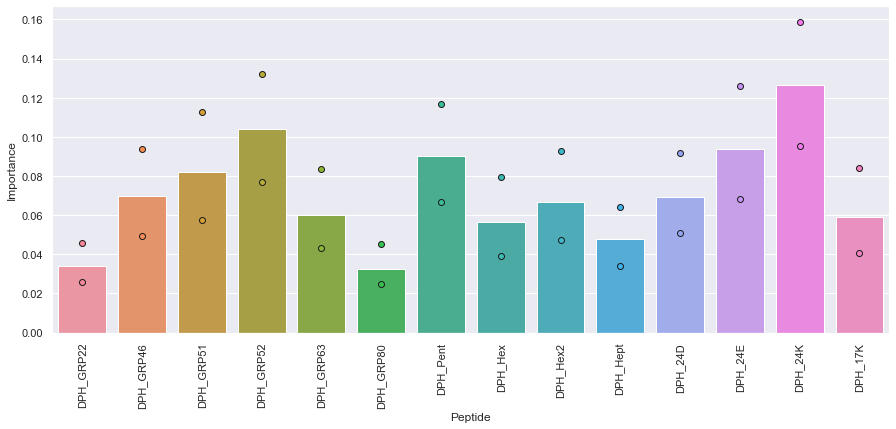

<Figure size 720x720 with 0 Axes>

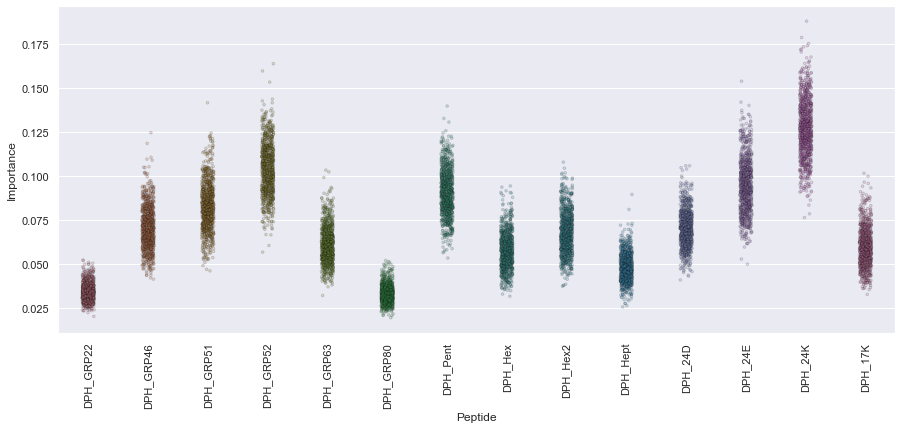

In [18]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [19]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score
0,DPH_24K,0.126592
1,DPH_GRP52,0.103851
2,DPH_24E,0.093915
3,DPH_Pent,0.089965
4,DPH_GRP51,0.082217
5,DPH_GRP46,0.069522
6,DPH_24D,0.069423
7,DPH_Hex2,0.066745
8,DPH_GRP63,0.060113
9,DPH_17K,0.058819


In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

Whilst there are some small differences in the relative order of the peptides, the ExtraTrees classifier identifies the same peptides as being most and least important as did the KBest analysis.

- Measure the relative importances of the peptides with permutation analysis

/opt/anaconda3/lib/python3.7/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


<Figure size 720x720 with 0 Axes>

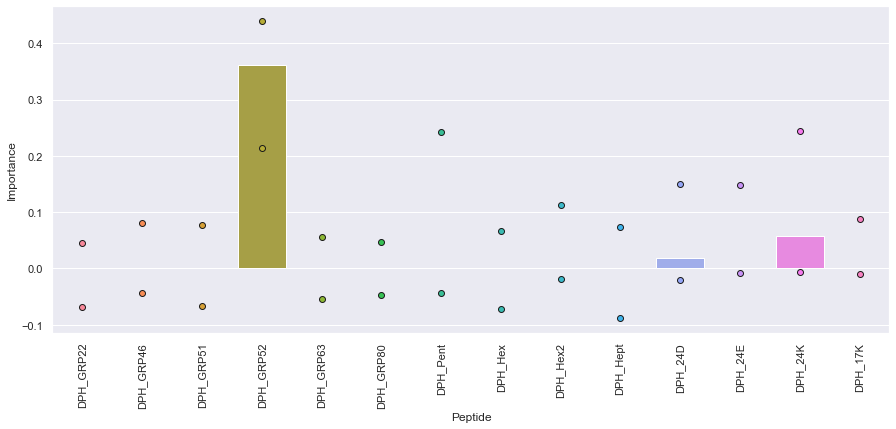

<Figure size 720x720 with 0 Axes>

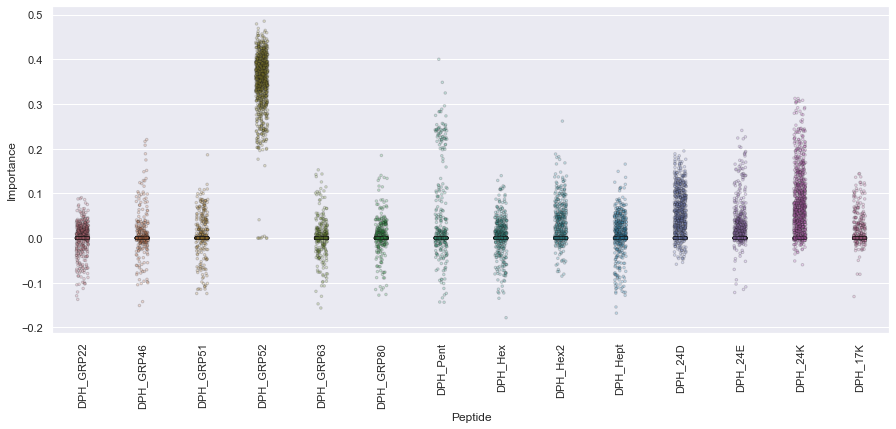

In [20]:
f1 = make_scorer(f1_score, average='weighted')
median_permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1, num_repeats=1000,
    scale=True, plt_name=''
)

In [21]:
print('Peptides ordered by median importance:')
median_permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score
0,DPH_GRP52,0.360708
1,DPH_24K,0.057221
2,DPH_24D,0.018806
3,DPH_GRP22,0.000000
4,DPH_GRP46,0.000000
5,DPH_GRP51,0.000000
6,DPH_GRP63,0.000000
7,DPH_GRP80,0.000000
8,DPH_Pent,0.000000
9,DPH_Hex,0.000000


In [22]:
mean_permut_feat_importances_df = OrderedDict({})
for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
mean_permut_feat_importances_df = pd.DataFrame({'Feature': list(mean_permut_feat_importances_df.keys()),
                                                'Score': list(mean_permut_feat_importances_df.values())})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [23]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score
0,DPH_GRP52,0.351725
1,DPH_24K,0.070927
2,DPH_24D,0.038005
3,DPH_Pent,0.016411
4,DPH_24E,0.016309
5,DPH_Hex2,0.014026
6,DPH_17K,0.006353
7,DPH_Hept,0.003661
8,DPH_GRP46,0.002725
9,DPH_GRP51,0.002631


In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected AdaBoost classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

The results obtained with permutation look more different as compared to the difference between the KBest and ExtraTrees analysis, which is perhaps not surprising given that as described above permutation analysis takes feature correlation into account (whereas the former two methods do not).

According to permutation analysis, GRP52 contributes by far the most unique information about the output class. In contrast, although the other two methods also highlight GRP52 as one of the most important features, it is one of several similarly important peptides.

- What percentage of the signal in the data can be measured by N principal components?

/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


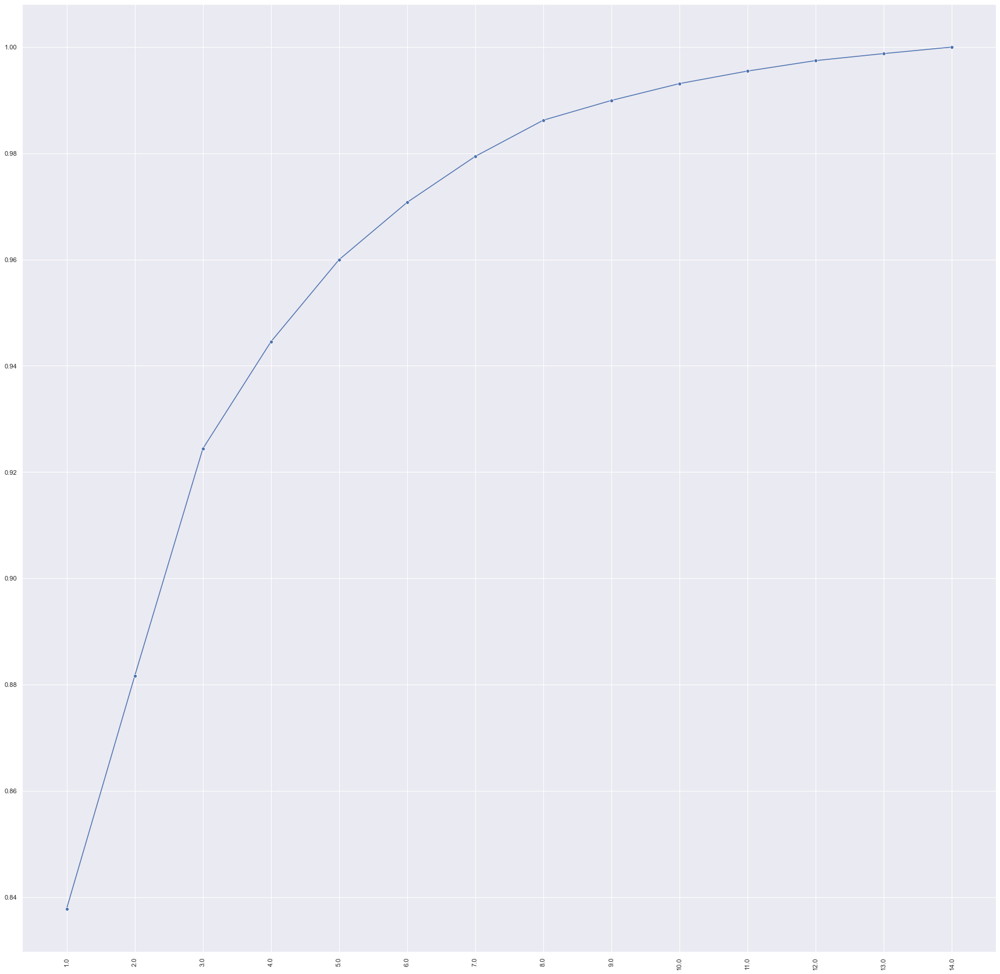

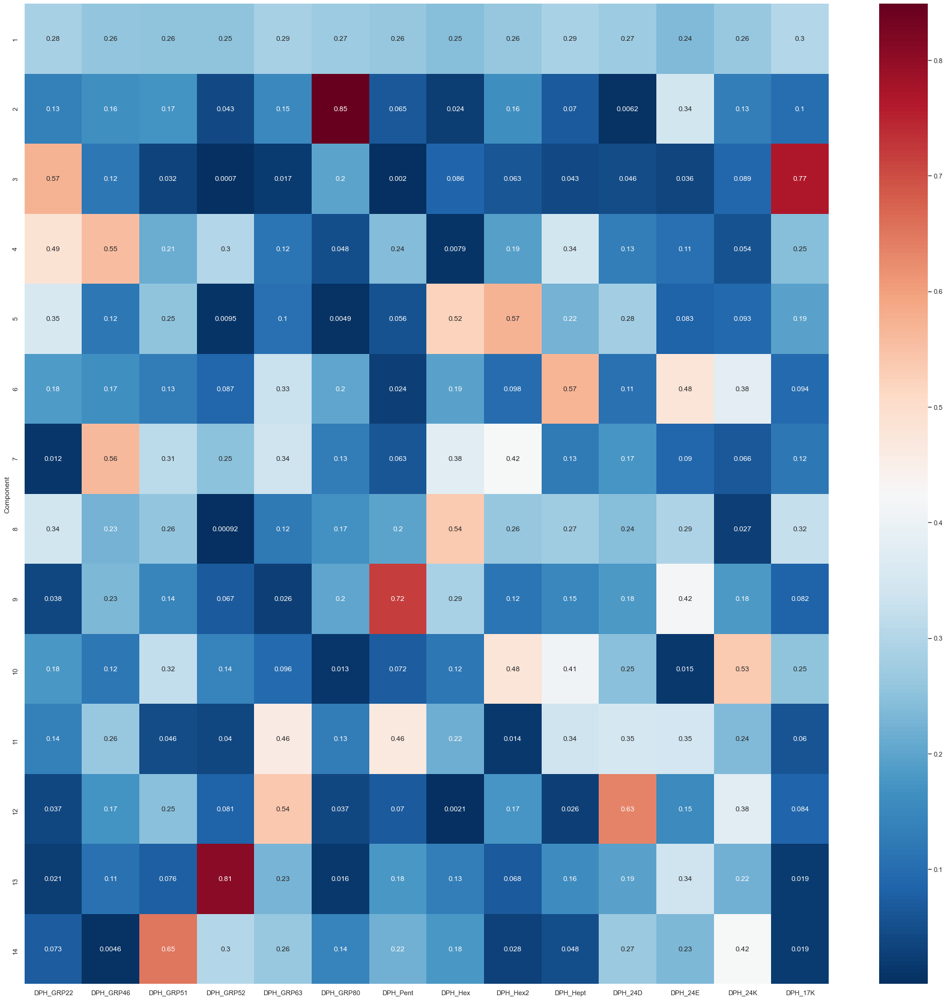

In [24]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(fluor_data=ml.fluor_data, scale=True, plt_name='')
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

Over 92% of the variance in the data can be represented by just three principal components, whilst the first principal component represents almost 84% of the variance. Most of the peptides make similar contributions to the first component, whereas GRP80 makes the dominant contribution to the second component.

Scatter plots of data transformed to PCA dimensions

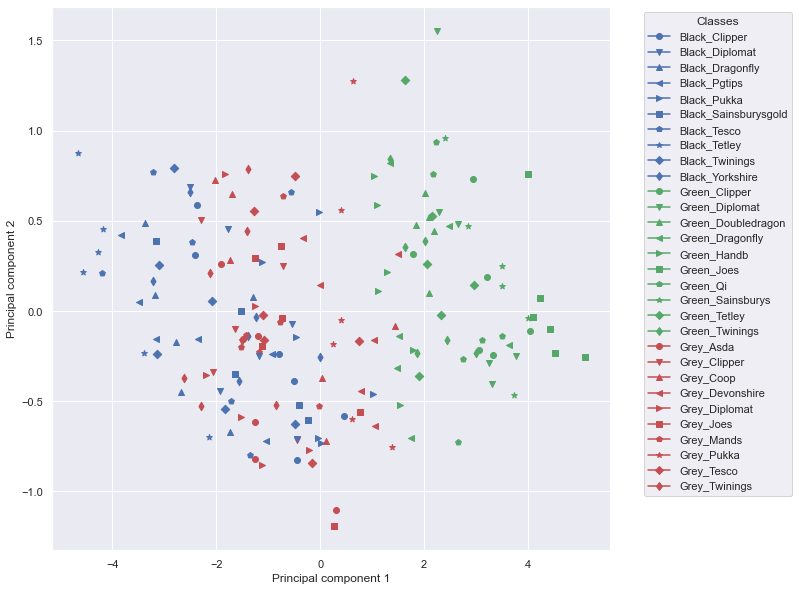

In [25]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=None, num_dimensions=2, scale=True, plt_name=''
)

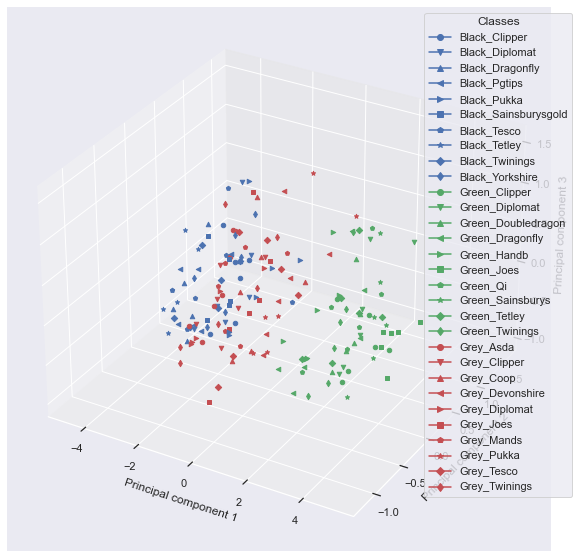

In [26]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=None, num_dimensions=3, scale=True, plt_name=''
)

As expected based from the scatter plots of fluorescence readings, the three classes can be distinguished by eye on these scatter plots on PCA axes. In particular, the green tea samples cluster separately, whereas there is more overlap between the black and grey teas (which as described above is what might be predicted given their different chemical compositions).

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 5 different ML algorithms. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

In [27]:
def make_splits(groups_array, input_groups):
    splits_classes = []
    splits_indices = []

    for n in range(groups_array.shape[0]):
        test_groups = groups_array[n]
        train_groups = [group for group in list(groups_array.flatten()) if not group in test_groups]
        splits_classes.append((np.array(train_groups), np.array(test_groups)))

        train_m = [m for m in range(input_groups.shape[0]) if not input_groups[m] in test_groups]
        test_m = [m for m in range(input_groups.shape[0]) if input_groups[m] in test_groups]
        splits_indices.append([np.array(train_m), np.array(test_m)])

    return splits_classes, splits_indices

In [28]:
all_groups = sorted(list(set(list(ml.sub_classes))))

outer_splits_list = [[] for n in range(3)]
for tea in all_groups:
    tea_class = tea.split('_')[0]
    if tea_class == 'Black':
        outer_splits_list[0].append(tea)
    elif tea_class == 'Grey':
        outer_splits_list[1].append(tea)
    elif tea_class == 'Green':
        outer_splits_list[2].append(tea)  

for n in range(len(outer_splits_list)):
    random.shuffle(outer_splits_list[n])

outer_splits_array = np.array(outer_splits_list).T
outer_splits_classes, outer_splits_indices = make_splits(outer_splits_array, ml.sub_classes)

In [29]:
inner_splits_classes = OrderedDict()
inner_splits_indices = OrderedDict()
for i, split in enumerate(outer_splits_classes):
    outer_train = list(split[0])
    inner_groups = np.array([group for group in ml.sub_classes if group in outer_train])

    inner_splits_list = [[] for n in range(3)]
    for tea in outer_train:
        tea_class = tea.split('_')[0]
        if tea_class == 'Black':
            inner_splits_list[0].append(tea)
        elif tea_class == 'Grey':
            inner_splits_list[1].append(tea)
        elif tea_class == 'Green':
            inner_splits_list[2].append(tea)  

    for n in range(len(inner_splits_list)):
        random.shuffle(inner_splits_list[n])

    inner_splits_array = np.array(inner_splits_list).T
    inner_splits_classes[i], inner_splits_indices[i] = make_splits(inner_splits_array, inner_groups)

In [30]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 2  # Value is irrelevant since am using user-defined split, so just set to an
# integer value between 2 and 10
cv_folds_outer_loop = 2  # Value is irrelevant since am using user-defined split, so just set to an
# integer value between 2 and 10
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})

for algorithm in algorithms:
    for resampling_method in resampling_methods:
        fixed_params = ml.define_fixed_model_params(classifier=algorithm())
        if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
            fixed_params['random_state'] = 1
        tuned_params = ml.define_tuned_model_params(
            classifier=algorithm(), x_train=ml.x[int(math.floor(0.64*ml.x.shape[0])),:],
            n_folds=cv_folds_inner_loop
        )
        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=ml.sub_classes, selected_features=list(ml.features),
            inner_splits=inner_splits_indices, outer_splits=outer_splits_indices, const_split=True,
            resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
            fixed_params=fixed_params, tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
            test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
            cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
        )

        all_feat_searches[
            '{}__{}'.format(algorithm.__name__, resampling_method)
        ] = copy.deepcopy(nested_cv_search)

        all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        # Check group splits have worked as expected
        for i, classes in enumerate(outer_splits_classes):
            if sorted(list(classes[1])) != sorted(list(set(list(nested_cv_search['groups_true'][i])))):
                raise Exception('Data has not been split as expected (outer split)')
        for i, classes_list in inner_splits_classes.items():
            for j, classes in enumerate(classes_list):
                if sorted(list(classes[1])) != sorted(list(set(list(nested_cv_search['inner_groups_true'][i][j])))):
                    raise Exception('Data has not been split as expected (inner split)')

        # Print output of nested CV
        for i, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][i]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][i]))





KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 2), ('weights', 'distance')])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 2), ('weights', 'distance')])
Accuracy: 0.7777777777777778
F1: 0.75




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'distance')])
A

In [31]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [32]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,0.814583,0.055560,0.814583,0.055560,0.835761,0.042304,0.807855,0.062928
1,GaussianNB,no_balancing,0.763889,0.126229,0.763889,0.126229,0.762904,0.167296,0.744240,0.148443
2,LinearSVC,no_balancing,0.813889,0.097855,0.813889,0.097855,0.843135,0.102861,0.801759,0.109672
3,SVC,no_balancing,0.836111,0.070765,0.836111,0.070765,0.854272,0.070436,0.831427,0.074411
4,AdaBoostClassifier,no_balancing,0.706944,0.064085,0.706944,0.064085,0.745550,0.126495,0.670257,0.076790


In [33]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

The algorithms all perform well, but will select SVC to take forwards as it performs best.

In [34]:
all_feat_searches['SVC__no_balancing']['outer_loop_params']

[OrderedDict([('random_state', 1),
              ('C', 2.0),
              ('gamma', 1.0),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 2048.0),
              ('gamma', 0.001953125),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 2.0),
              ('gamma', 1.0),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 2.0),
              ('gamma', 0.5),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 8192.0),
              ('gamma', 0.00390625),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 32.0),
              ('gamma', 0.0625),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 16.0),
              ('gamma', 0.0625),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 8.0),
              ('gamma', 1.0)

In [35]:
all_feat_searches['SVC__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('random_state', 1),
                           ('C', 2048.0),
                           ('gamma', 0.001953125),
                           ('kernel', 'rbf')])),
             ('recall',
              OrderedDict([('random_state', 1),
                           ('C', 2048.0),
                           ('gamma', 0.001953125),
                           ('kernel', 'rbf')])),
             ('precision',
              OrderedDict([('random_state', 1),
                           ('C', 2048.0),
                           ('gamma', 0.001953125),
                           ('kernel', 'rbf')])),
             ('f1',
              OrderedDict([('random_state', 1),
                           ('C', 2048.0),
                           ('gamma', 0.001953125),
                           ('kernel', 'rbf')]))])

In [36]:
all_feat_searches['SVC__no_balancing']['test_scores']['accuracy']

[0.8888888888888888,
 0.9444444444444444,
 0.8333333333333334,
 0.8333333333333334,
 0.7222222222222222,
 0.9444444444444444,
 0.7777777777777778,
 0.8333333333333334,
 0.8333333333333334,
 0.75]

In [37]:
all_feat_nested_pred = all_feat_searches['SVC__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['SVC__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['SVC__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

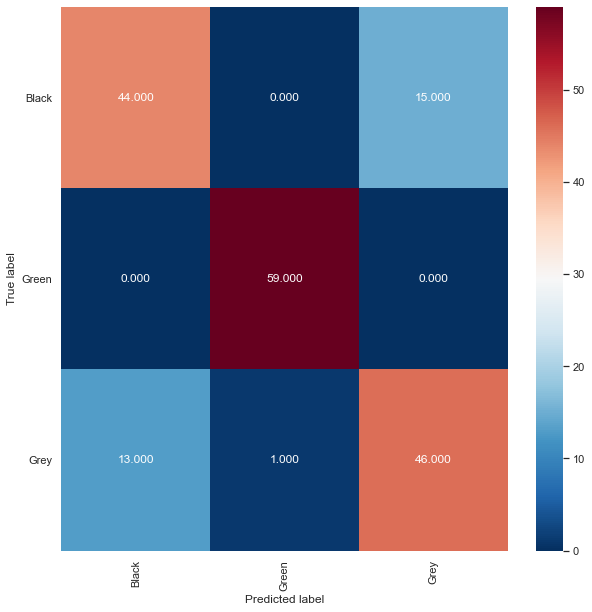

Normalised over true label (rows)


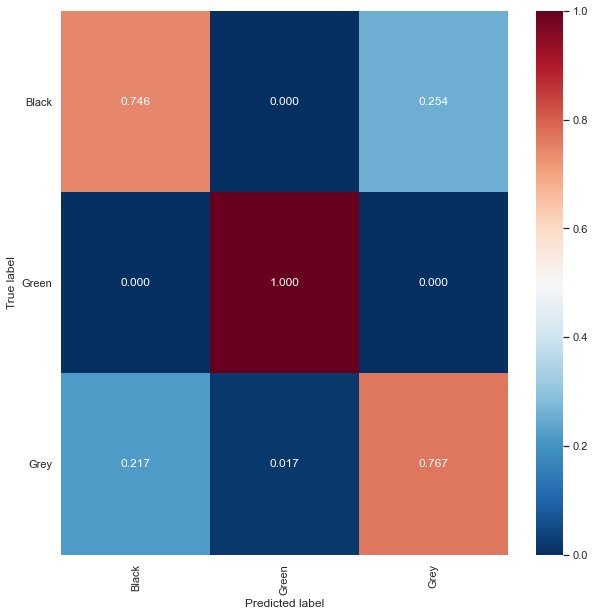

Normalised over pred label (columns)


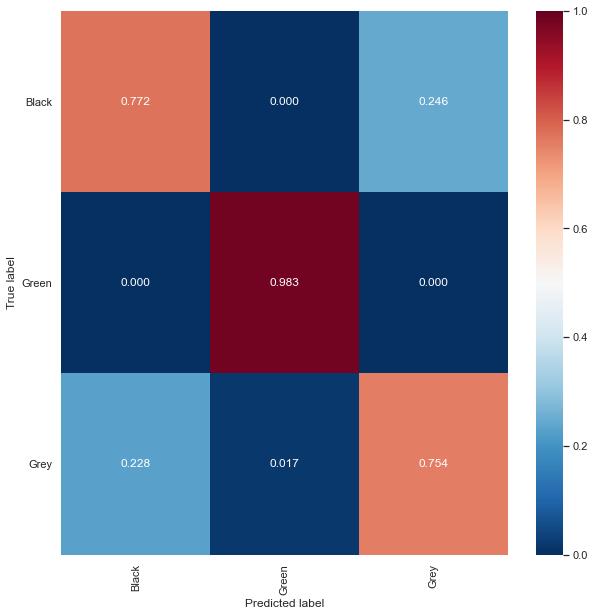

In [38]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [39]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

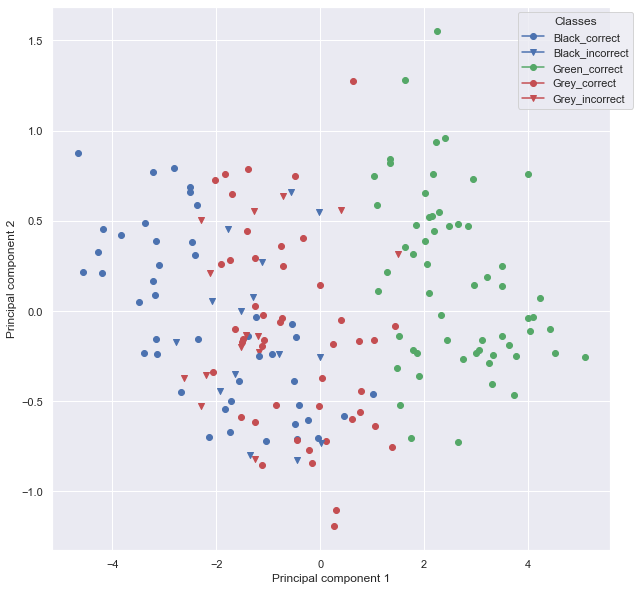

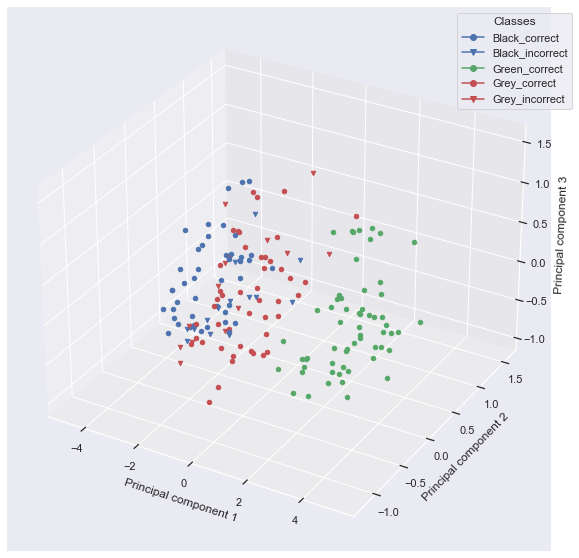

In [40]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Black_incorrect = Value that is actually black is predicted to be something else

It is possible to train an ML model that is able to identify the class labels of subclasses (in this case brands of tea) it was not exposed to during training. This behaviour will be crucial for future applications of the BADASS technology (e.g. identifying the class of biological samples (such as urine or serum) from diseased and healthy patients, etc.). In agreement with the scatter and box plots earlier in this notebook, the model is better able to distinguish the green tea from the other two classes as compared to between the grey and black tea, although it still predicts most of the black and grey samples correctly.

#### Is it possible to maintain/improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [41]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 6, 8, 10, 12, 14]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 2  # Value is irrelevant since am using user-defined split, so just set to an
# integer value between 2 and 10
cv_folds_outer_loop = 2  # Value is irrelevant since am using user-defined split, so just set to an
# integer value between 2 and 10
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs = {accuracy_score: {},
                      recall_score: {'average': 'weighted',
                                     'zero_division': 0},
                      precision_score: {'average': 'weighted',
                                        'zero_division': 0},
                      f1_score: {'average': 'weighted',
                                 'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': [],})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x[int(math.floor(0.64*ml.x.shape[0])),:],
                    n_folds=cv_folds_inner_loop
                )
                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=ml.sub_classes, selected_features=selected_features,
                    inner_splits=inner_splits_indices, outer_splits=outer_splits_indices, const_split=True,
                    resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                    fixed_params=fixed_params, tuned_params=tuned_params,
                    train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                    n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )

                red_feat_searches[
                    '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

                red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])
                
                # Check group splits have worked as expected
                for i, classes in enumerate(outer_splits_classes):
                    if sorted(list(classes[1])) != sorted(list(set(list(nested_cv_search['groups_true'][i])))):
                        raise Exception('Data has not been split as expected (outer split)')
                for i, classes_list in inner_splits_classes.items():
                    for j, classes in enumerate(classes_list):
                        if sorted(list(classes[1])) != sorted(list(set(list(nested_cv_search['inner_groups_true'][i][j])))):
                            raise Exception('Data has not been split as expected (inner split)')

                # Print output of nested CV
                for index, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))





KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8333333333333334
F1: 0.8278943278943278




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7222222222222222
F1: 0.7011784511784511




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'distance')])
Accuracy: 0.6111111111111112
F1: 0.5871794871794873




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: Order





KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 2), ('weights', 'distance')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7777777777777778
F1: 0.7696969696969697




KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: Order





KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 2), ('weights', 'distance')])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 2), ('weights', 'distance')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters





KNeighborsClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




KNeighborsClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 2), ('weights', 'distance')])
Accuracy: 0.6666666666666666
F1: 0.6561771561771561




KNeighborsClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




KNeighborsClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8333333333333334
F1: 0.831168831168831




KNeighborsClassifier: no_balancing,  Permutation_sc





KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 2), ('weights', 'distance')])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'distance')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7222222222222222
F1: 0.7151515151515153




KNeighborsClassifier: no_balancing,  Permutation_s





GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.8333333333333334
F1: 0.8278943278943278




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.7696969696969697




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5047619047619047




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.7222222222222222
F1: 0.7037037037037037




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.6111111111111112
F1: 0.5037707390648567




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




GaussianNB: no_bal





GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.8333333333333334
F1: 0.8278943278943278




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.7222222222222222
F1: 0.6638655462184873




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.45238095238095233




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.6111111111111112
F1: 0.6083916083916084




GaussianN





GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.6111111111111112
F1: 0.5760348583877996




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.6111111111111112
F1: 0.5037707390648567




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.6111111111111112
F1: 0





LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.25)])
Accuracy: 0.7222222222222222
F1: 0.6476190476190475




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.25)])
Accuracy: 0.6111111111111112
F1: 0.5252525252525252




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 256.0)])
Accuracy: 0.5555555555555556
F1: 0.5047619047619047




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.5)])
Accuracy: 0.6666666666666666
F1: 0.625




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)])
Accuracy: 





LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 256.0)])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.7222222222222222
F1: 0.7037037037037037




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 32.0)





LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.8333333333333334
F1: 0.831168831168831




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.8333333333333334
F1: 0.8222222222222223




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.7222222222222222
F1: 0.6638655462184873




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('ran





LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.5)])
Accuracy: 0.7222222222222222
F1: 0.693935693935694




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.5)])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.125)])
Accuracy: 0.7777777777777778
F1: 0.75




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 512.0)])
Accuracy: 0.7222222222222222
F1: 0.7037037037037037




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('random_state', 





SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 0.0625), ('gamma', 4.0), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 0.0625), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.7696969696969697




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.5
F1: 0.4478021978021977




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 0.125), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.7714285714285714




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDic





SVC: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('C', 256.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




SVC: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('C', 4096.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




SVC: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('C', 32768.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




SVC: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




SVC: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('C', 4096.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.625




SVC: no_balancing,  KBest_Fscore,  6
Para

Range tested: [3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]
Value selected: 8.0






SVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




SVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.8333333333333334
F1: 0.8222222222222223




SVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 8.0), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.75




SVC: no_balancing,  Permutation





SVC: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 2.0), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




SVC: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




SVC: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




SVC: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.7746031746031746




SVC: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.7222222222222222
F1: 0.7037037037037037




SVC: no_balancing,  Permutation





AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.8333333333333334
F1: 0.8278943278943278




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.6666666666666666
F1: 0.6216577540106951




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.6666666666666666
F1: 0.6555555555555556




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.7222222222222222
F1: 0.7037037037037037




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimato





AdaBoostClassifier: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




AdaBoostClassifier: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.6111111111111112
F1: 0.5294117647058824




AdaBoostClassifier: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




AdaBoostClassifier: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.6666666666666666
F1: 0.5555555555555556




AdaBoostClassifier: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.6666666666666666
F1: 0.625




AdaBoostClassifier: no_balancing,  KBest_Fscore,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)]





AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.5555555555555556
F1: 0.5




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.6666666666666666
F1: 0.5555555555555556




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.8333333333333334
F1: 0.8222222222222223




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.8333333333333334
F1: 0.8222222222222223




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.7777777777777778
F1: 0.7714285714285715




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state',





AdaBoostClassifier: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.8333333333333334
F1: 0.8222222222222223




AdaBoostClassifier: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)])
Accuracy: 0.8333333333333334
F1: 0.8222222222222223




AdaBoostClassifier: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




AdaBoostClassifier: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.6666666666666666
F1: 0.5555555555555556




AdaBoostClassifier: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.6666666666666666
F1: 0.625




AdaBoostClassifier: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('random_st

In [42]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [43]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,1,0.759028,0.110067,0.759028,0.110067,0.763941,0.139120,0.738927,0.132739
1,KNeighborsClassifier,no_balancing,KBest_Fscore,2,0.753472,0.101648,0.753472,0.101648,0.785774,0.082475,0.740751,0.114350
2,KNeighborsClassifier,no_balancing,KBest_Fscore,3,0.798611,0.104905,0.798611,0.104905,0.822288,0.088320,0.787849,0.116191
3,KNeighborsClassifier,no_balancing,KBest_Fscore,4,0.802778,0.094974,0.802778,0.094974,0.813581,0.096860,0.794645,0.104418
4,KNeighborsClassifier,no_balancing,KBest_Fscore,5,0.804167,0.099079,0.804167,0.099079,0.795456,0.140919,0.789347,0.124442
...,...,...,...,...,...,...,...,...,...,...,...,...
95,AdaBoostClassifier,no_balancing,Permutation_score,6,0.729167,0.148974,0.729167,0.148974,0.725198,0.176267,0.706816,0.159711
96,AdaBoostClassifier,no_balancing,Permutation_score,8,0.752083,0.088718,0.752083,0.088718,0.750796,0.144610,0.722436,0.119408
97,AdaBoostClassifier,no_balancing,Permutation_score,10,0.763194,0.087756,0.763194,0.087756,0.818001,0.117259,0.727741,0.114997
98,AdaBoostClassifier,no_balancing,Permutation_score,12,0.746528,0.048037,0.746528,0.048037,0.795805,0.105610,0.709292,0.078075


In [44]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, red_feat_score_df), f)

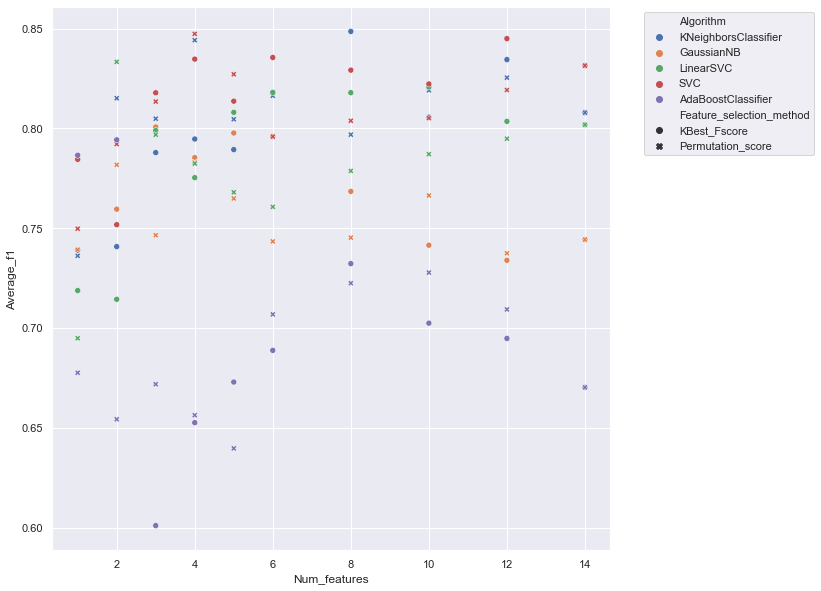

In [45]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

The number of features required to achieve optimal performance varies between algorithms, but is typically reached using the 2-4 most important features (regardless of the feature selection method used). Incorporating additional features does not appear to introduce substantial noise into the data, as model performance plateaus rather than peaking.

Can achieve performance ~ equal to original SVC model (trained with all 14 peptides) with just the 2 most important peptides.

In [56]:
sub_red_feat_score_df = red_feat_score_df[red_feat_score_df['Num_features'] == 2].reset_index(drop=True)

In [57]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,2,0.753472,0.101648,0.753472,0.101648,0.785774,0.082475,0.740751,0.114350
1,KNeighborsClassifier,no_balancing,Permutation_score,2,0.820833,0.084357,0.820833,0.084357,0.838003,0.082642,0.815078,0.090845
2,GaussianNB,no_balancing,KBest_Fscore,2,0.781944,0.157141,0.781944,0.157141,0.757698,0.219978,0.759509,0.191236
3,GaussianNB,no_balancing,Permutation_score,2,0.797917,0.119253,0.797917,0.119253,0.794993,0.153255,0.781720,0.140155
4,LinearSVC,no_balancing,KBest_Fscore,2,0.747917,0.123605,0.747917,0.123605,0.790596,0.134714,0.714361,0.149637
5,LinearSVC,no_balancing,Permutation_score,2,0.843056,0.068620,0.843056,0.068620,0.880761,0.045833,0.833301,0.081350
6,SVC,no_balancing,KBest_Fscore,2,0.770139,0.149280,0.770139,0.149280,0.778876,0.170206,0.751731,0.174534
7,SVC,no_balancing,Permutation_score,2,0.809028,0.102780,0.809028,0.102780,0.803425,0.144714,0.792115,0.130777
8,AdaBoostClassifier,no_balancing,KBest_Fscore,2,0.803472,0.090013,0.803472,0.090013,0.832447,0.072422,0.794242,0.096885
9,AdaBoostClassifier,no_balancing,Permutation_score,2,0.706944,0.120833,0.706944,0.120833,0.648313,0.184027,0.654246,0.146932


Will select LinearSVC classifier and feature selection via permutation analysis, as this combination achieves the best performance with two features across all four metrics.

In [58]:
red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['outer_loop_params']

[OrderedDict([('dual', False), ('random_state', 1), ('C', 8.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 4.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 8.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 8.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 32.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)]),
 OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)])]

In [59]:
red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('dual', False),
                           ('random_state', 1),
                           ('C', 64.0)])),
             ('recall',
              OrderedDict([('dual', False),
                           ('random_state', 1),
                           ('C', 64.0)])),
             ('precision',
              OrderedDict([('dual', False),
                           ('random_state', 1),
                           ('C', 64.0)])),
             ('f1',
              OrderedDict([('dual', False),
                           ('random_state', 1),
                           ('C', 64.0)]))])

In [60]:
red_feat_nested_pred = red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['predictions']
red_feat_nested_y_true = red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['y_true']
red_feat_nested_x_true = red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

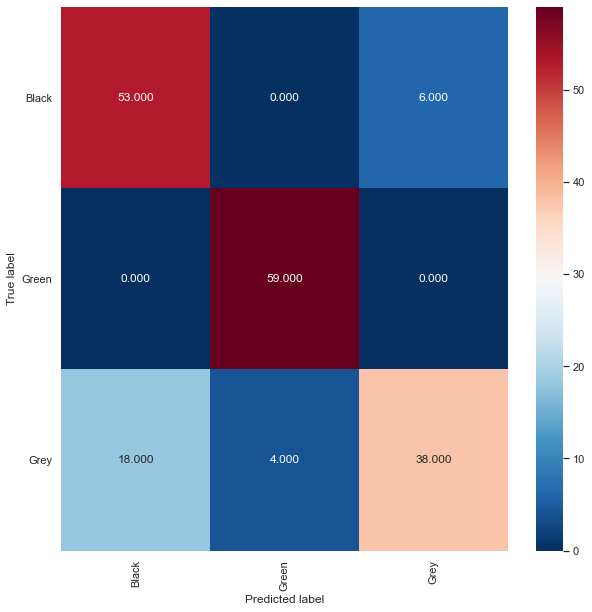

Normalised over true label (rows)


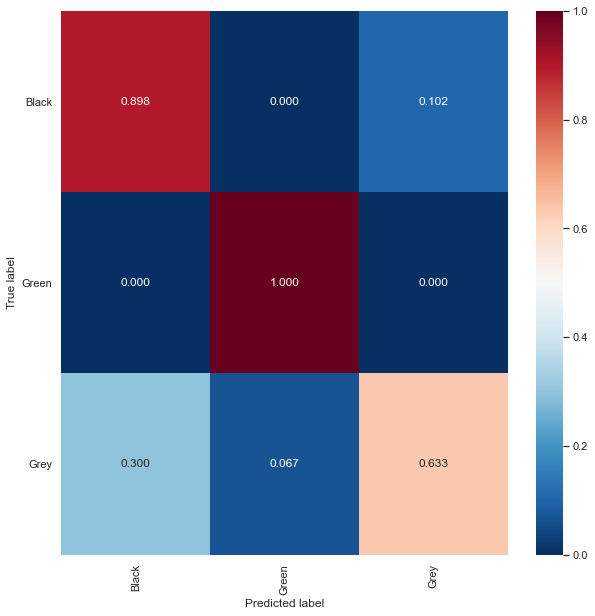

Normalised over pred label (columns)


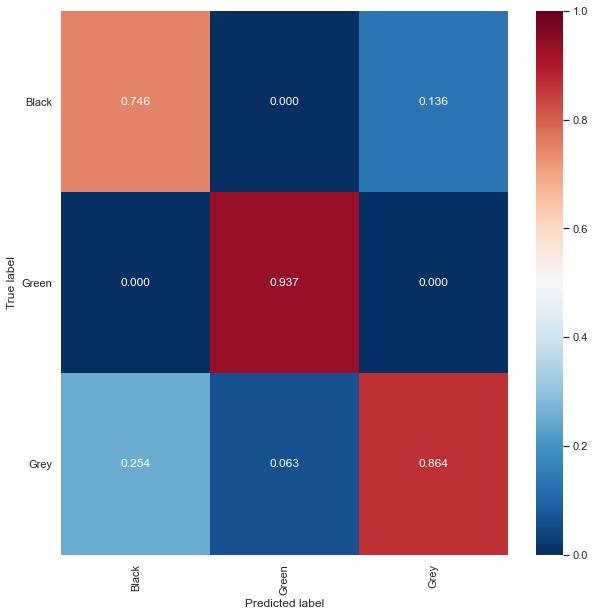

In [62]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [63]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

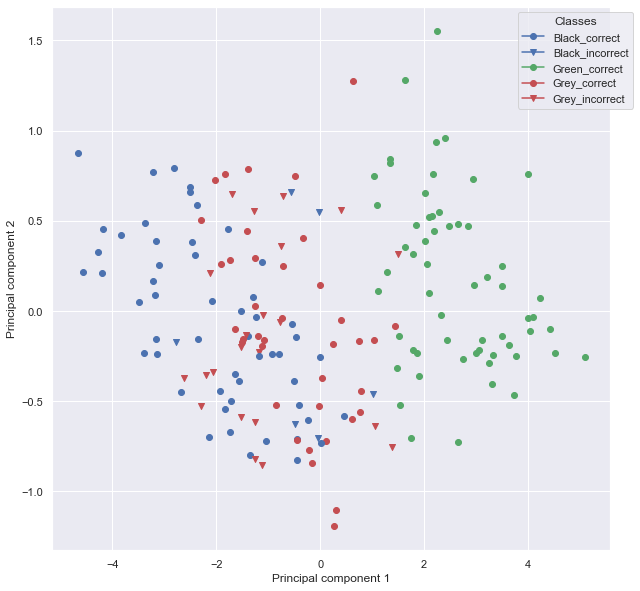

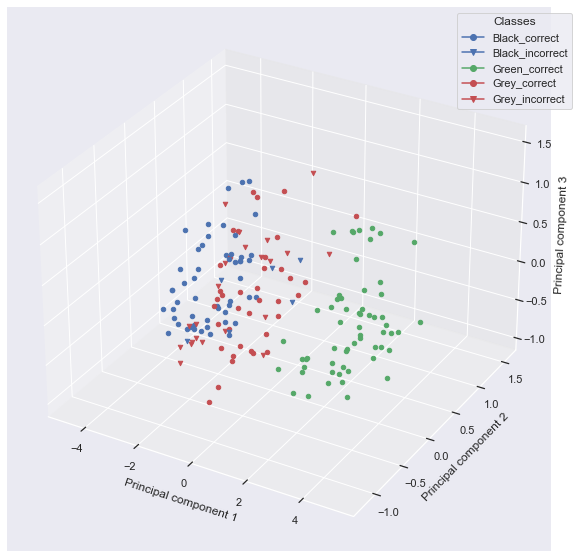

In [64]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Black_incorrect = Value that is actually black is predicted to be something else

So, LinearSVC model trained with just 2 peptides performs similarly well to the SVC model trained with all 14 peptides.

Is there a significant difference between the two models?

In [65]:
params_1 = all_feat_searches['SVC__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['best_outer_loop_params']['f1']
selected_features_2 = mean_permut_feat_importances_df['Feature'].tolist()[:2]

print('Model 1:')
print('Algorithm: SVC')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: LinearSVC')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=SVC, classifier_2=LinearSVC, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None,
)

Model 1:
Algorithm: SVC
Parameters:
OrderedDict([('random_state', 1), ('C', 2048.0), ('gamma', 0.001953125), ('kernel', 'rbf')])
Features:
['DPH_GRP22', 'DPH_GRP46', 'DPH_GRP51', 'DPH_GRP52', 'DPH_GRP63', 'DPH_GRP80', 'DPH_Pent', 'DPH_Hex', 'DPH_Hex2', 'DPH_Hept', 'DPH_24D', 'DPH_24E', 'DPH_24K', 'DPH_17K']




Model 2:
Algorithm: LinearSVC
Parameters:
OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)])
Features:
['DPH_GRP52', 'DPH_24K']


In [66]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 1.2631578947368431
p value: 0.4208256410069778


So, there is no significant difference in performance when reduce the number of peptides from 14 to 2.